## **Problem Statement**

### **Domain**: Industrial safety. NLP based Chatbot

### **Context**

The  database  comes  fromone  of  the  biggest  industry  in  Brazil  and  in  the  world.  It  is  an  urgent  need  for  industries/companies  around  the globe to understand why employees still suffer some injuries/accidents in plants. Sometimes they also die in such environmen

### **Data Description**

This database  is  basically  records  of  accidents  from
12  different  plants  in  03  different  countries
which  every  line  in  the  data  is  an
occurrence of an accident.

Columns description:

- **Data**: timestamp or time/date information
- **Countries**: which country the accident occurred (anonymised)
- **Local**: the city where the manufacturing plant is located (anonymised)
- **Industry sector**: which sector the plant belongs to
- **Accident level**: from I to VI, it registers how severe was the accident (I means not severe but VI means very severe)
- **Potential Accident Level**: Depending on the Accident Level, the database also registers how severe the accident could have been (due to other factors
involved in the accident)
- **Genre**: if the person is male of female
- **Employee or Third Party**: if the injured person is an employee or a third party
- **Critical Risk**: some description of the risk involved in the accident
- **Description**: Detailed description of how the accident happened.

### **Project Objective**

Design  a  ML/DL  based  chatbot  utility  which  can  help  the  professionals  to  highlight  the  safety  risk  as  per  the  incident description.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Import the data

In [ ]:
import pandas as pd
import numpy as np

# Load the CSV file
data = pd.read_csv("/content/drive/MyDrive/capstone/data.csv")


## Installing and Importing Necessary Libraries

In [ ]:
# !pip install unidecode
# !pip install autocorrect
# !pip install google_trans_new
# !pip install ann_visualizer
# !pip install googletrans

In [ ]:
# Importing all the necessary libraries
import warnings # to ignore warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline

from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split, cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix

import nltk
from nltk.corpus import stopwords
from nltk import tokenize, stem
from tensorflow.keras.preprocessing.text import Tokenizer

import re
import string
from nltk.probability import FreqDist
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# import unicodedata
# import unidecode
# from autocorrect import Speller
from string import punctuation
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim.models import Word2Vec

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.utils import to_categorical

from keras.callbacks import EarlyStopping, ModelCheckpoint

#from google_trans_new import google_translator

#from ann_visualizer.visualize import ann_viz;
# from keras.utils.vis_utils import plot_model


In [ ]:
data.head(5)

,Unnamed: 0,Data,Countries,Local,Industry Sector,Accident Level,Potential Accident Level,Genre,Employee or Third Party,Critical Risk,Description
0,0,2016-01-01 0:00:00,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...
1,1,2016-01-02 0:00:00,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...
2,2,2016-01-06 0:00:00,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...
3,3,2016-01-08 0:00:00,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...
4,4,2016-01-10 0:00:00,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...


In [ ]:
#copy the data
df=data.copy()

In [ ]:
df.shape

(425, 11)

- Data has 425 rows and 11 columns (features)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Unnamed: 0                425 non-null    int64 
 1   Data                      425 non-null    object
 2   Countries                 425 non-null    object
 3   Local                     425 non-null    object
 4   Industry Sector           425 non-null    object
 5   Accident Level            425 non-null    object
 6   Potential Accident Level  425 non-null    object
 7   Genre                     425 non-null    object
 8   Employee or Third Party   425 non-null    object
 9   Critical Risk             425 non-null    object
 10  Description               425 non-null    object
dtypes: int64(1), object(10)
memory usage: 36.6+ KB


- There are 11 columns, out of which 1 is of int datatype and rest are of Object data type.
- The dataset includes 10 categorical columns and an integer-based index column.

## Data Cleansing

In [ ]:
# Drop irrelevant column Unnamed:0
df.drop('Unnamed: 0', axis=1, inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Data                      425 non-null    object
 1   Countries                 425 non-null    object
 2   Local                     425 non-null    object
 3   Industry Sector           425 non-null    object
 4   Accident Level            425 non-null    object
 5   Potential Accident Level  425 non-null    object
 6   Genre                     425 non-null    object
 7   Employee or Third Party   425 non-null    object
 8   Critical Risk             425 non-null    object
 9   Description               425 non-null    object
dtypes: object(10)
memory usage: 33.3+ KB


In [ ]:
# Rename the columns in a correct fashion
df.rename(columns = { 'Data' : 'Date',
                      'Industry Sector' : 'Industry_Sector',
                      'Accident Level': 'Accident_Level',
                      'Countries' : 'Country',
                      'Local' : 'Location',
                      'Genre' : 'Gender',
                      'Potential Accident Level' : 'Potential_Accident_Level',
                      'Employee or Third Party' : 'Employee_Type',
                      'Critical Risk' : 'Critical_Risk'}, inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Date                      425 non-null    object
 1   Country                   425 non-null    object
 2   Location                  425 non-null    object
 3   Industry_Sector           425 non-null    object
 4   Accident_Level            425 non-null    object
 5   Potential_Accident_Level  425 non-null    object
 6   Gender                    425 non-null    object
 7   Employee_Type             425 non-null    object
 8   Critical_Risk             425 non-null    object
 9   Description               425 non-null    object
dtypes: object(10)
memory usage: 33.3+ KB


- Now, Dataset contains total of 10 columns in which all are object data type.

**Ensuring proper datetime formatting for the `Date` column**

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Date'].head()

,Date
0,2016-01-01
1,2016-01-02
2,2016-01-06
3,2016-01-08
4,2016-01-10


In [ ]:
df.shape

(425, 10)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      425 non-null    datetime64[ns]
 1   Country                   425 non-null    object        
 2   Location                  425 non-null    object        
 3   Industry_Sector           425 non-null    object        
 4   Accident_Level            425 non-null    object        
 5   Potential_Accident_Level  425 non-null    object        
 6   Gender                    425 non-null    object        
 7   Employee_Type             425 non-null    object        
 8   Critical_Risk             425 non-null    object        
 9   Description               425 non-null    object        
dtypes: datetime64[ns](1), object(9)
memory usage: 33.3+ KB


* The cleaned dataset has 425 rows and 10 columns
* The cleaned dataset includes 9 categorical columns, 1 date column.

**Checking for missing values**

In [ ]:
# Check for missing values
df.isnull().sum()

,0
Date,0
Country,0
Location,0
Industry_Sector,0
Accident_Level,0
Potential_Accident_Level,0
Gender,0
Employee_Type,0
Critical_Risk,0
Description,0


- There are no null/mising values in the data

**Check for duplicate values**

In [ ]:
# Check for duplicate values
df.duplicated().sum()

7

In [ ]:
# Checking those the duplicates we found in above dataframe
print('There are {} duplicates in the dataset as below'.format(df.duplicated().sum()))
df[df.duplicated()]

There are 7 duplicates in the dataset as below


,Date,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description
77,2016-04-01,Country_01,Local_01,Mining,I,V,Male,Third Party (Remote),Others,In circumstances that two workers of the Abrat...
262,2016-12-01,Country_01,Local_03,Mining,I,IV,Male,Employee,Others,During the activity of chuteo of ore in hopper...
303,2017-01-21,Country_02,Local_02,Mining,I,I,Male,Third Party (Remote),Others,Employees engaged in the removal of material f...
345,2017-03-02,Country_03,Local_10,Others,I,I,Male,Third Party,Venomous Animals,On 02/03/17 during the soil sampling in the re...
346,2017-03-02,Country_03,Local_10,Others,I,I,Male,Third Party,Venomous Animals,On 02/03/17 during the soil sampling in the re...
355,2017-03-15,Country_03,Local_10,Others,I,I,Male,Third Party,Venomous Animals,Team of the VMS Project performed soil collect...
397,2017-05-23,Country_01,Local_04,Mining,I,IV,Male,Third Party,Projection of fragments,In moments when the 02 collaborators carried o...


In [ ]:
df.shape

(425, 10)

In [ ]:
# Drop the duplicate values
df.drop_duplicates(inplace=True)
print('After removing duplicates the shape of the dataset is:',df.shape)

After removing duplicates the shape of the dataset is: (418, 10)


**Verify and clean categorical data**

In [ ]:
#print unique values
categorical_columns = ['Country', 'Location', 'Industry_Sector', 'Accident_Level',
                       'Potential_Accident_Level', 'Gender', 'Employee_Type', 'Critical_Risk']
for col in categorical_columns:
    df[col] = df[col].str.strip()  # Remove any leading/trailing whitespace
    print(f"Unique values in '{col}':\n{df[col].unique()}\n")

Unique values in 'Country':
['Country_01' 'Country_02' 'Country_03']

Unique values in 'Location':
['Local_01' 'Local_02' 'Local_03' 'Local_04' 'Local_05' 'Local_06'
 'Local_07' 'Local_08' 'Local_10' 'Local_09' 'Local_11' 'Local_12']

Unique values in 'Industry_Sector':
['Mining' 'Metals' 'Others']

Unique values in 'Accident_Level':
['I' 'IV' 'III' 'II' 'V']

Unique values in 'Potential_Accident_Level':
['IV' 'III' 'I' 'II' 'V' 'VI']

Unique values in 'Gender':
['Male' 'Female']

Unique values in 'Employee_Type':
['Third Party' 'Employee' 'Third Party (Remote)']

Unique values in 'Critical_Risk':
['Pressed' 'Pressurized Systems' 'Manual Tools' 'Others'
 'Fall prevention (same level)' 'Chemical substances' 'Liquid Metal'
 'Electrical installation' 'Confined space'
 'Pressurized Systems / Chemical Substances'
 'Blocking and isolation of energies' 'Suspended Loads' 'Poll' 'Cut'
 'Fall' 'Bees' 'Fall prevention' 'Not applicable' 'Traffic' 'Projection'
 'Venomous Animals' 'Plates' 'Projecti

In [ ]:
# Printing all the duplicate values (keep=False)
print('There are still {} duplicates in the dataset as below'.format(df.duplicated(subset=['Description'],keep=False).sum()))
df[df.duplicated(subset=['Description'],keep=False)].sort_values(by='Description')

There are still 14 duplicates in the dataset as below


,Date,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description
166,2016-07-07,Country_01,Local_03,Mining,IV,V,Male,Third Party,Others,At moments when the MAPERU truck of plate F1T ...
167,2016-07-07,Country_01,Local_03,Mining,I,IV,Male,Third Party,Others,At moments when the MAPERU truck of plate F1T ...
261,2016-12-01,Country_01,Local_03,Mining,I,IV,Male,Employee,Others,During the activity of chuteo of ore in hopper...
263,2016-12-01,Country_01,Local_03,Mining,I,IV,Male,Third Party,Others,During the activity of chuteo of ore in hopper...
412,2017-06-20,Country_01,Local_01,Mining,I,IV,Male,Employee,Others,"In circumstance, the AHK-903 license plate (Em..."
413,2017-06-20,Country_01,Local_01,Mining,I,IV,Male,Third Party,Others,"In circumstance, the AHK-903 license plate (Em..."
130,2016-05-26,Country_03,Local_10,Others,I,I,Male,Third Party,Bees,"In the geological reconnaissance activity, in ..."
131,2016-05-26,Country_03,Local_10,Others,I,I,Male,Employee,Others,"In the geological reconnaissance activity, in ..."
143,2016-06-08,Country_03,Local_10,Others,I,I,Male,Third Party,Bees,Project of Vazante that carried out sediment c...
144,2016-06-08,Country_03,Local_10,Others,I,I,Male,Third Party,Others,Project of Vazante that carried out sediment c...


* The above DataFrame clearly shows 7 duplicate rows where the Description values match, but one or two other column values differ. This inconsistency is logically unsound.
* Additionally, it is observed that these duplicate entries occurred at the same timestamp (Date column).
* Therefore, we will remove these hidden duplicates by keeping the first row of duplicates.

In [ ]:
# Dropping the duplicates
df.drop_duplicates(subset=['Description'], keep='first', inplace=True)
print('After removing duplicates the shape of the dataset is:', df.shape)

After removing duplicates the shape of the dataset is: (411, 10)



## EDA (Data Analysis and Preparation)

In [ ]:
# Column to Include
columns_to_include = ['Country', 'Location', 'Industry_Sector','Accident_Level','Potential_Accident_Level','Gender','Employee_Type','Critical_Risk','Description']  # Replace with your column names

# Generate descriptive statistics only for the specified columns
df[columns_to_include].describe(include='all').T


,count,unique,top,freq
Country,411,3,Country_01,245
Location,411,12,Local_03,87
Industry_Sector,411,3,Mining,232
Accident_Level,411,5,I,303
Potential_Accident_Level,411,6,IV,138
Gender,411,2,Male,390
Employee_Type,411,3,Third Party,180
Critical_Risk,411,33,Others,223
Description,411,411,While removing the drill rod of the Jumbo 08 f...,1


**Count value for different columns**

In [ ]:
df['Country'].value_counts()


,count
Country,
Country_01,245
Country_02,127
Country_03,39


- In country, we have following counts:
  - Country_01: 245
  - Country_02: 127
  - Country_03: 39

In [ ]:
df['Location'].value_counts().sort_index()


,count
Location,
Local_01,55
Local_02,23
Local_03,87
Local_04,55
Local_05,59
Local_06,46
Local_07,12
Local_08,27
Local_09,2


In [ ]:
df['Industry_Sector'].value_counts().sort_index()


,count
Industry_Sector,
Metals,134
Mining,232
Others,45


In [ ]:
df['Accident_Level'].value_counts().sort_index()


,count
Accident_Level,
I,303
II,39
III,31
IV,30
V,8


In [ ]:
df['Potential_Accident_Level'].value_counts().sort_index()


,count
Potential_Accident_Level,
I,43
II,95
III,106
IV,138
V,28
VI,1


In [ ]:
# Replace Level 6 value to Level 5
df['Potential_Accident_Level'] = df['Potential_Accident_Level'].replace('VI', 'V')

In [ ]:
df['Gender'].value_counts().sort_index()


,count
Gender,
Female,21
Male,390


In [ ]:
df['Employee_Type'].value_counts().sort_index()


,count
Employee_Type,
Employee,176
Third Party,180
Third Party (Remote),55


In [ ]:
df['Critical_Risk'].value_counts().sort_index()


,count
Critical_Risk,
Bees,10
Blocking and isolation of energies,3
Burn,1
Chemical substances,17
Confined space,1
Cut,14
Electrical Shock,2
Electrical installation,1
Fall,9


In [ ]:
df['Description'].value_counts().sort_index()


,count
Description,
"ACTIVITY: front sanitation (slaughter of choco with scaller) LOCAL: underground mine, level 350 - front 45 Upper JKA The operator performed front sanitation when a rock block from the roof hit the equipment. The accident victim was promptly rescued by the unit's emergency brigade and transported to the outpatient clinic where he received the first care, and was then transferred to the Municipal of Paracatu.",1
"ACTIVITY: maintenance on scaller 07 - breaker arm extension cylinder LOCAL: underground mine (level 316) During the removal of the cylinder from the scaller arm, when releasing the fixing pin the cylinder ""came down"" and bumped into the tool used to press his hand between the tool and the structure of the equipment.",1
"After carrying out the supply operation of the zinc powder container using the crane to move it, the employee closed the lower lock of this same container and when making the movement to push the lock made an excessive effort with the thumb of the right hand, causing sprain.",1
"After completing the welding work on the backhoe bucket made for 4 hours, during which he used glass moon # 10, the welder feels a slight discomfort in the eyes, so he is transferred to the medical service for evaluation . During the accident the welder used facial mask for welding.",1
"After having carried out the mechanized support with the Scissor # 200, the heavy equipment operator picks up the water supply hose towards the drum of the equipment and, while He was heading towards the cabin of the Scissor on the way on a piece of rock - 10 cm high approx. - which displaces by sliding his right foot causing the injury described.",1
...,...
"the Spillway circumstances where the worker was cleaning, with the use of an absorbent cloth, oil residues from the right edge of the Atlas AXS-186 compressor, with the bonnet open and in functioning; the rag falls inside the ompressor and in the attempt to remove it, it is hooked on the fan's propeller, pulling the worker's left hand toward the propeller causing the injury.",1
the check list of the area of ​​the survey the operator slipped in the foliage of the leucenas and fell.,1
"the moment of extracting the bolts of the CHUCK of rotation unit VSD 01; in the instant that is made hits with the rope of 6Lbs. the base of the support bolts, a fragment of the metal structure is projected, impacting the face of the mechanic Freddy the described injury.",1


In [ ]:
#see the information at a glance
#Looping through all the columns in the dataframe and checking counts of unique values.
for col in df.columns:
    if (col!='Description') and (col!='Date'):
        print(df[col].value_counts().sort_index())
        print('*'*50)

Country
Country_01    245
Country_02    127
Country_03     39
Name: count, dtype: int64
**************************************************
Location
Local_01    55
Local_02    23
Local_03    87
Local_04    55
Local_05    59
Local_06    46
Local_07    12
Local_08    27
Local_09     2
Local_10    39
Local_11     2
Local_12     4
Name: count, dtype: int64
**************************************************
Industry_Sector
Metals    134
Mining    232
Others     45
Name: count, dtype: int64
**************************************************
Accident_Level
I      303
II      39
III     31
IV      30
V        8
Name: count, dtype: int64
**************************************************
Potential_Accident_Level
I       43
II      95
III    106
IV     138
V       29
Name: count, dtype: int64
**************************************************
Gender
Female     21
Male      390
Name: count, dtype: int64
**************************************************
Employee_Type
Employee                176
Th

- From above output, the followings observations have been made:
  - Accidents occurred in three countries and 12 cities.
  - Most of the accidents have been happened in Mining industry sector.
  - There are three types of Industry Sector (Mining, Metals & Others), five types of Accidents Level (I - V), Six types of
    Potential Accident Level (I - VI) and three types of Employee Type (Third Party, Employee and Third Party (Remote)).
  - Male has suffered more as compare to Female.
  - In Potential Accident Level, only one case is of severe potential risk.

# Visualization


##Univariate Analysis

In [ ]:
# Creating a function to make univariate plots for analysis
def countplot(col, title):
    # Set up the figure size
    plt.figure(figsize=(12, 10))

    # Generate a color palette with as many colors as there are unique categories
    unique_colors = sns.color_palette("coolwarm", len(df[col].value_counts()))

    # Create the countplot with a different color for each category
    ax = sns.countplot(x=df[col], palette=unique_colors, order=df[col].value_counts().index, alpha=1.0)

    # Get the value counts and total count for percentage calculation
    value_counts = df[col].value_counts()
    total_count = len(df)

    # Add the percentage and count on top of each bar
    for p in ax.patches:
        height = p.get_height()
        width = p.get_width()
        x = p.get_x() + width / 2  # Positioning the text at the center of the bar
        y = height  # Positioning the text on top of the bar

        # Calculate the percentage
        percentage = (height / total_count) * 100

        # Add the count and percentage as text
        ax.text(x, y + 0.1, f'{height} ({percentage:.2f}%)', ha='center', va='bottom')

    # Set the x-axis label to 'Industry Sector'
    plt.ylabel('Industry Sector')

    # Set the y-axis label to 'No. of Accidents'
    plt.ylabel('No. of Accidents')

    # Set the title
    plt.title(title)

    # Show the plot
    plt.show()




In [ ]:
# Function to create a pie chart
def pieplot(col, title):
    # Set up the figure size
    plt.figure(figsize=(10, 10))

    # Generate a custom color palette
    colors = sns.color_palette("Pastel2", len(df[col].value_counts()))

    # Create the pie plot
    plt.pie(
        df[col].value_counts(),
        autopct="%.2f%%",
        labels=df[col].value_counts().index,
        shadow=True,
        explode=[0.1] * len(df[col].value_counts().index),
        startangle=-135,
        colors=colors
    )

    # Set the title for the plot
    plt.title(title)

    # Display the plot
    plt.show()


### Industry Sector

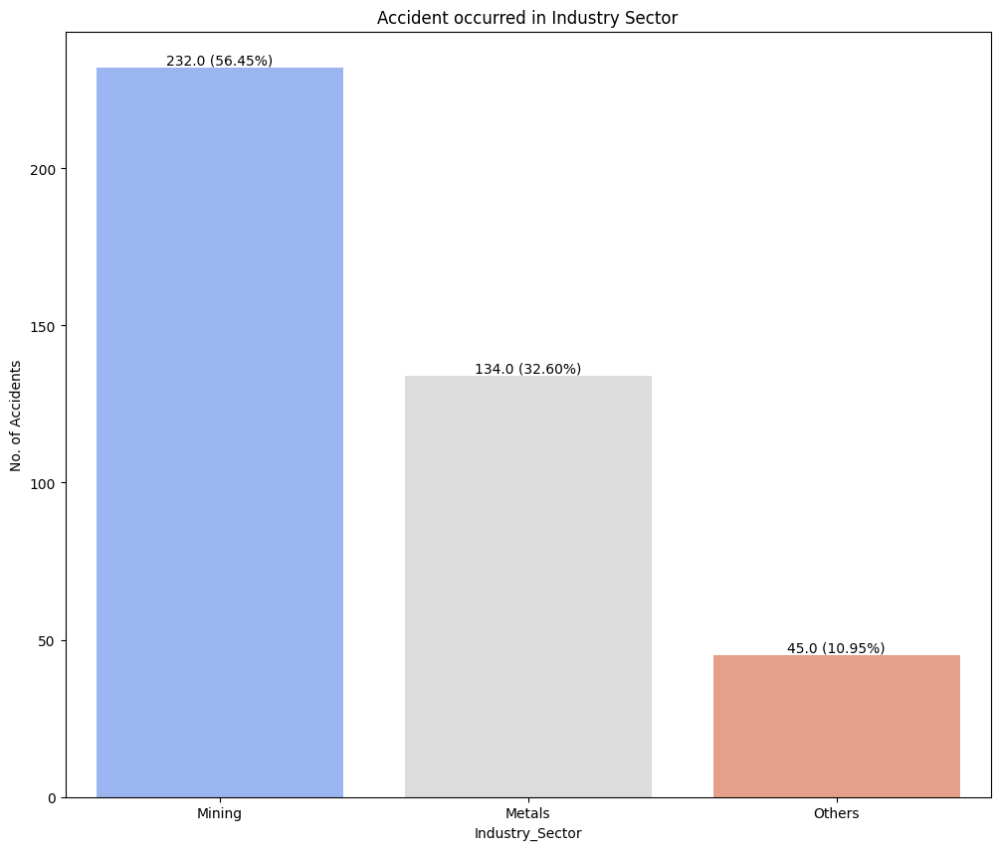

In [ ]:
# Accidents in Industry Sector
countplot('Industry_Sector', 'Accident occurred in Industry Sector')

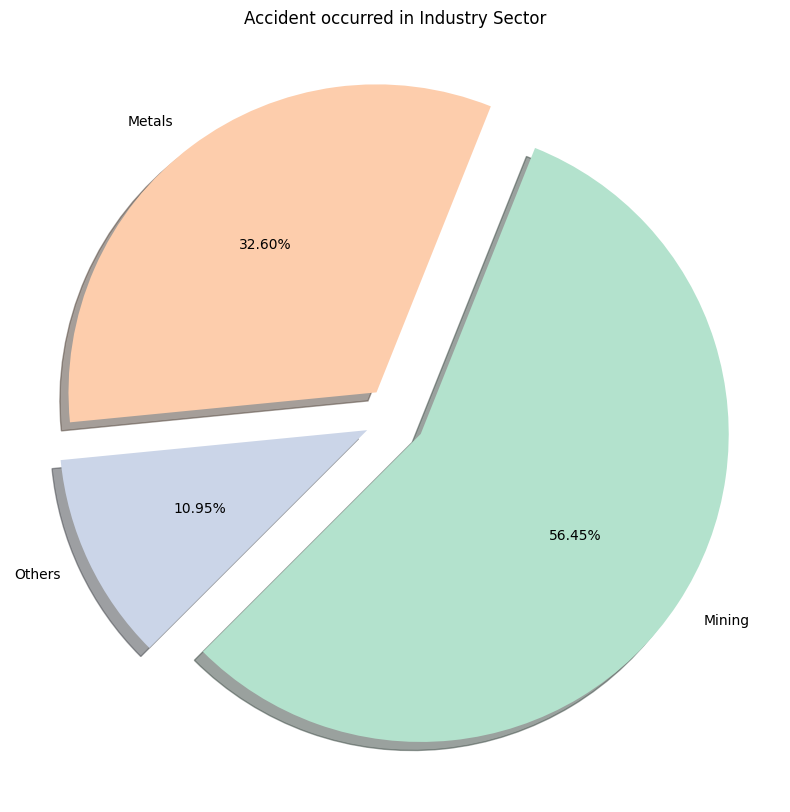

In [ ]:
# Pie Plot for Industry Sector
pieplot('Industry_Sector', 'Accident occurred in Industry Sector')

### Gender

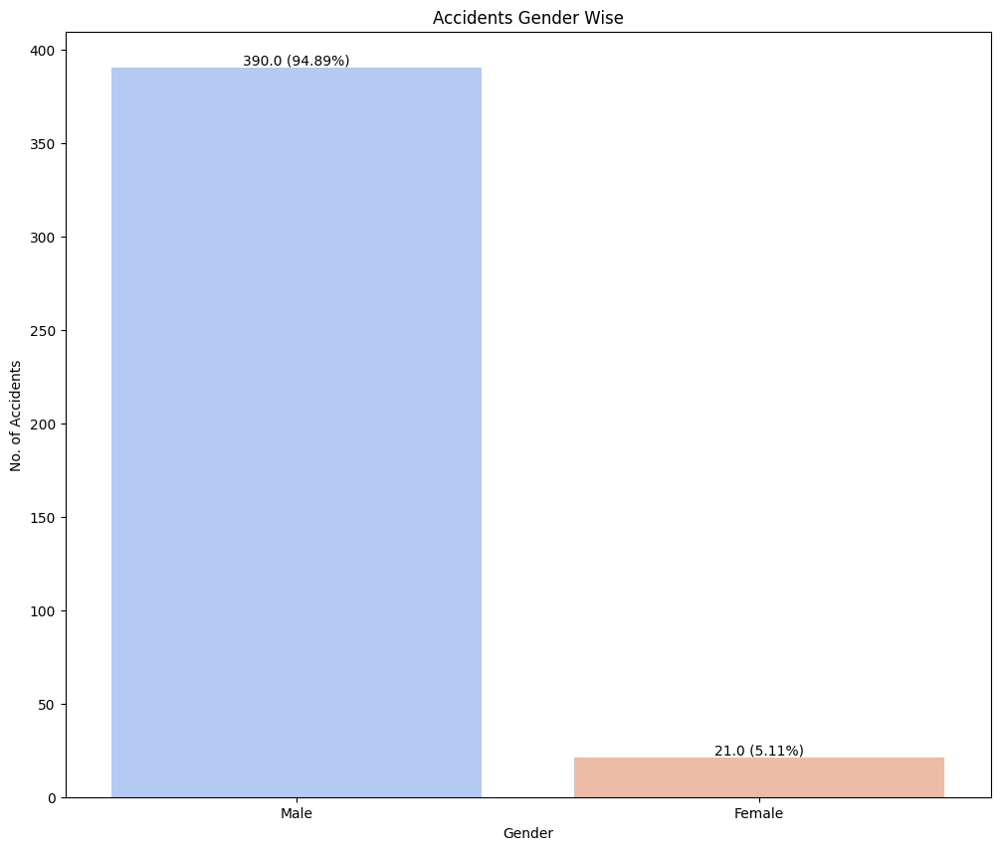

In [ ]:
# Accidents w.r.t to Gender
countplot('Gender', 'Accidents Gender Wise')

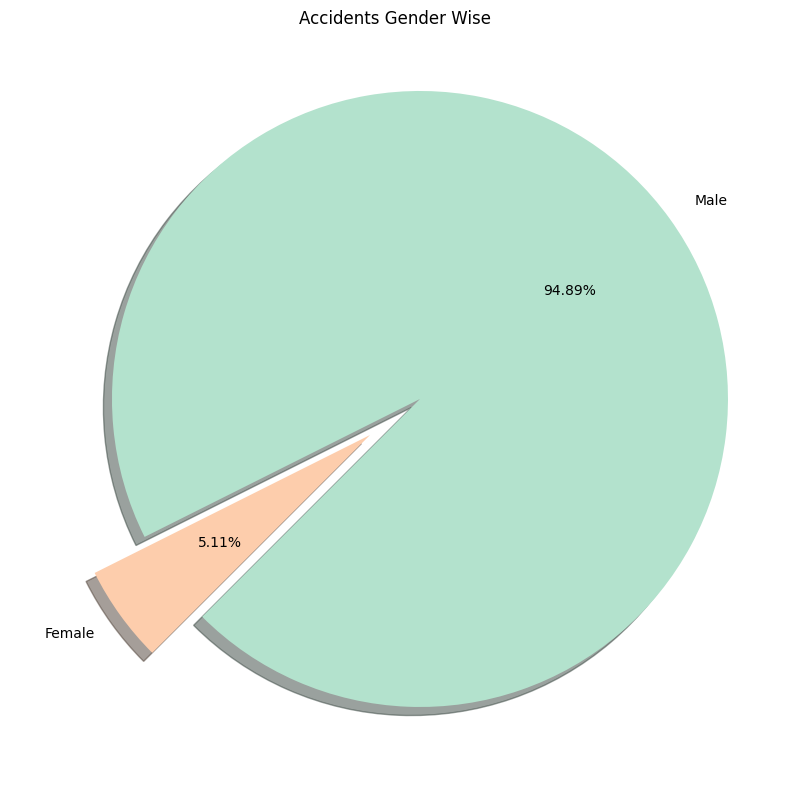

In [ ]:
# Pie Plot for Accidents w.r.t to Gender
pieplot('Gender', 'Accidents Gender Wise')

### Employee Type

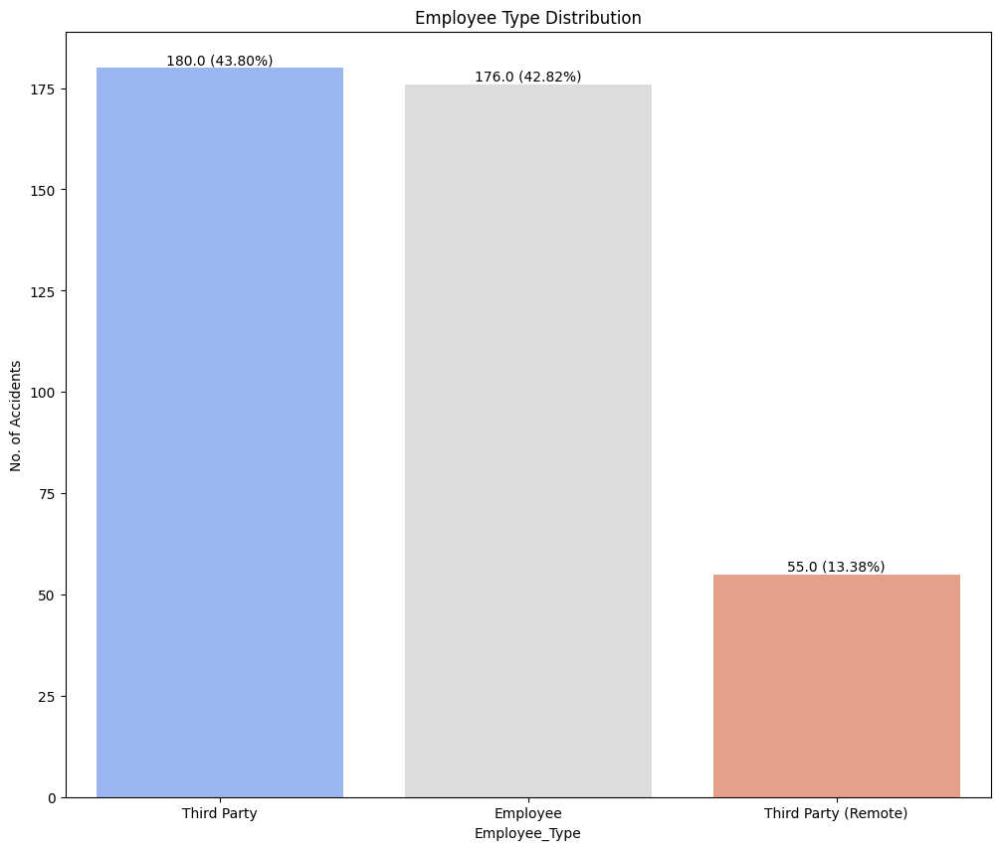

In [ ]:
# Count Plot for accidents w.r.t Employee Type
countplot('Employee_Type', 'Employee Type Distribution')

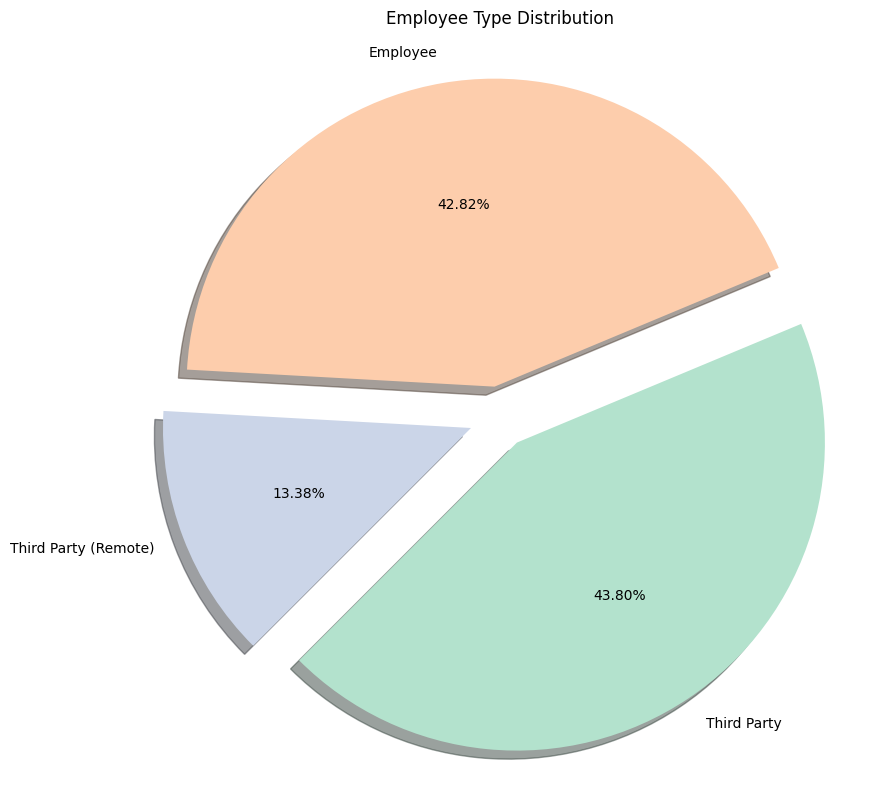

In [ ]:
# Pie Plot for Employee Type affected by accidents
pieplot('Employee_Type', 'Employee Type Distribution')

### Country

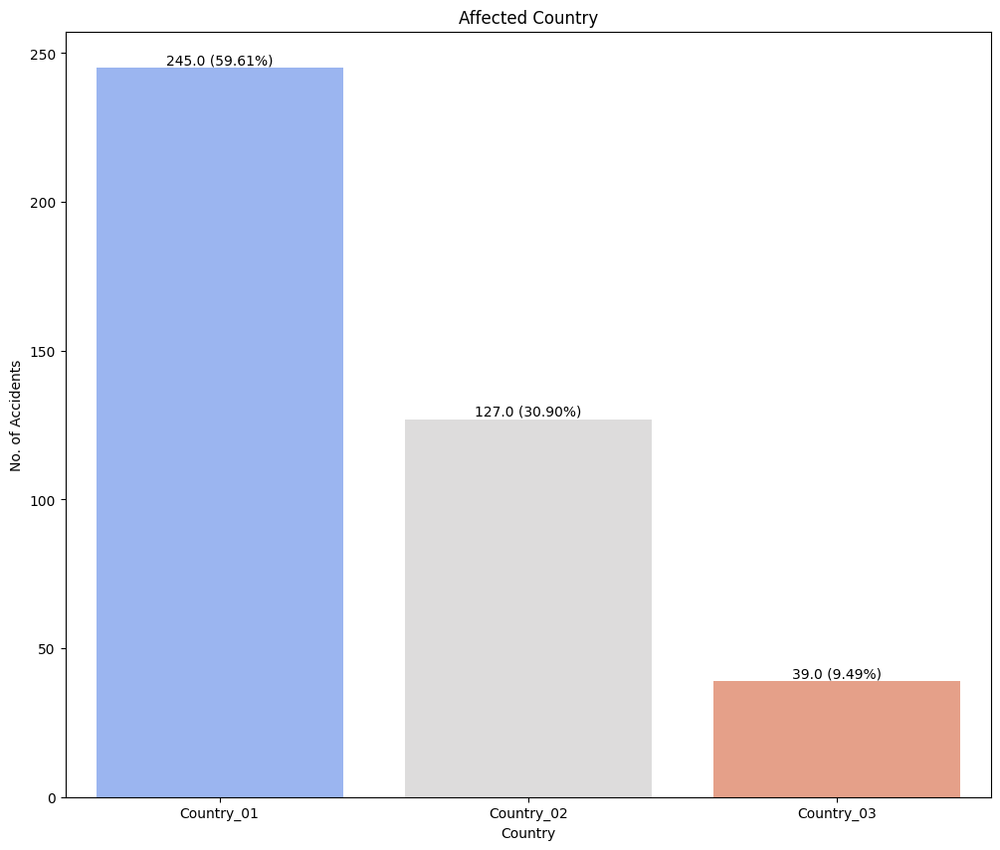

In [ ]:
#Country most affected by accidents
countplot('Country', 'Affected Country')

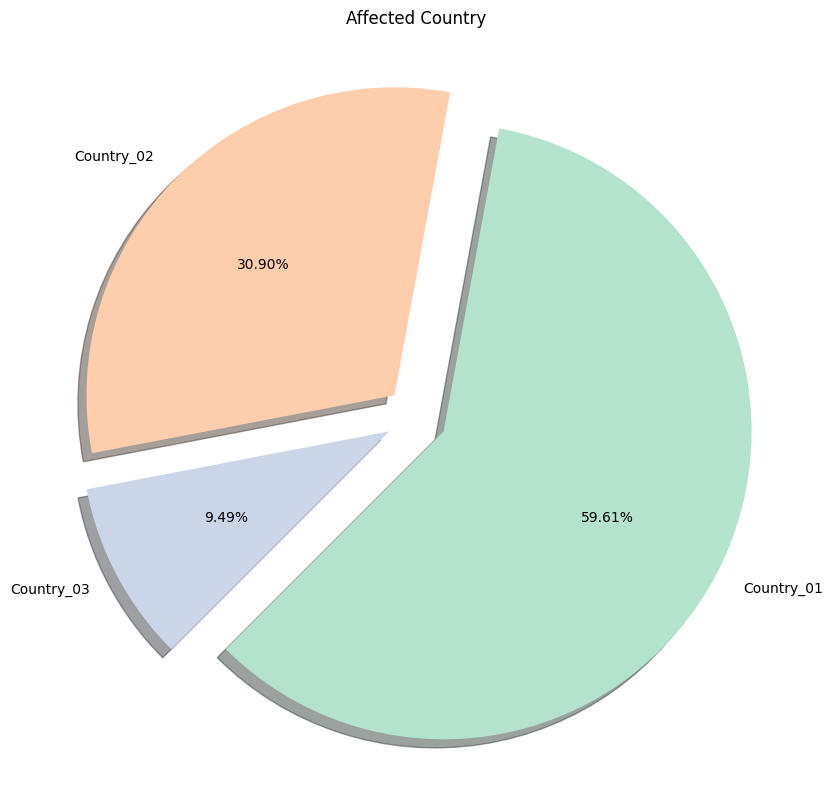

In [ ]:
# Pie Plot for Country most affected by accidents
pieplot('Country', 'Affected Country')

### Location Wise

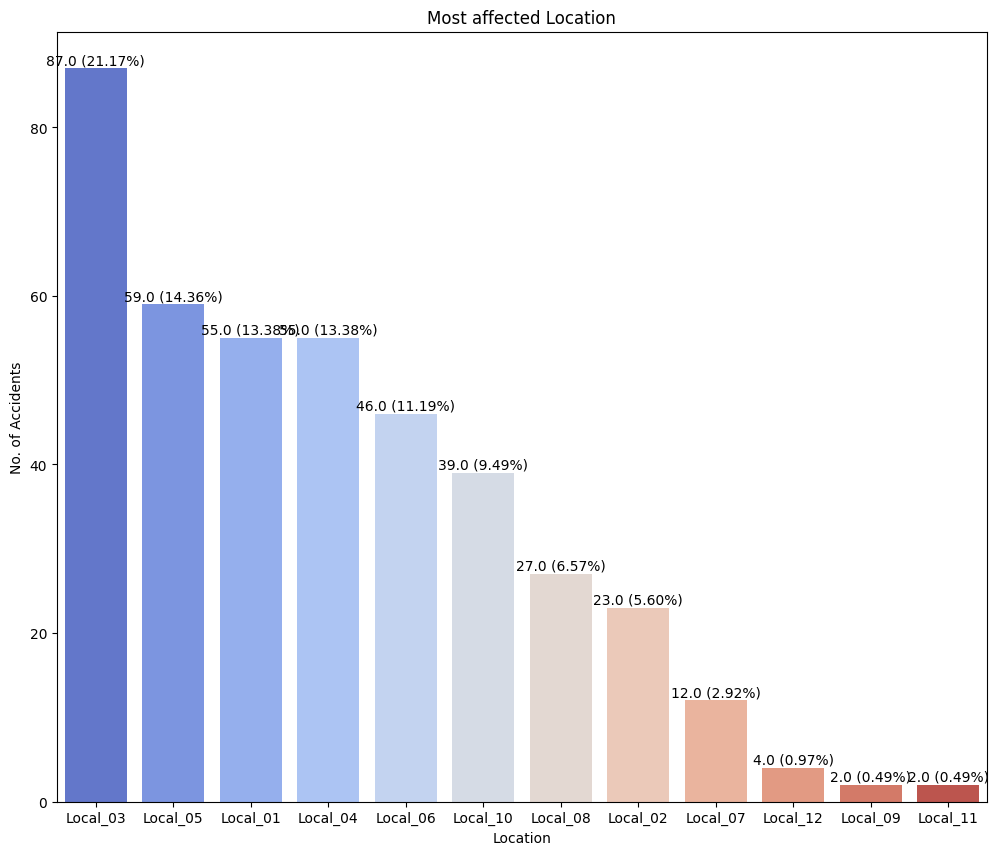

In [ ]:
#Location affected by accidents
countplot('Location', 'Most affected Location')

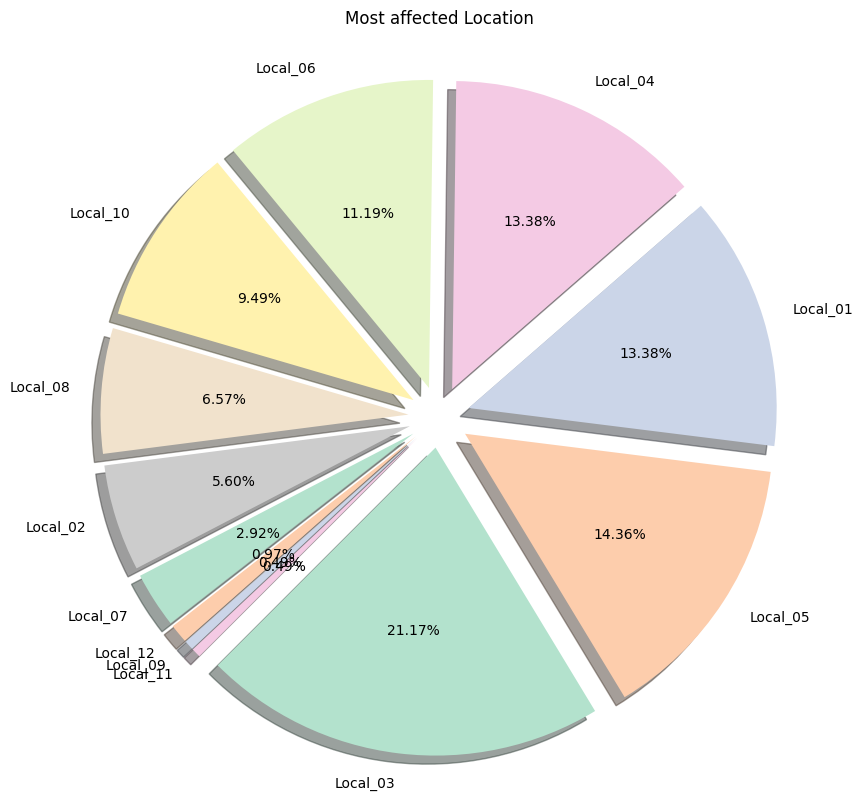

In [ ]:
#Location most affected by accidents
pieplot('Location', 'Most affected Location')

* Local_03 has maximum number of accidents i.e. approx 21% of all the plants in the country.
* This is followed by Local_05, Local_04, Local_01 and so on.

### Accident Level

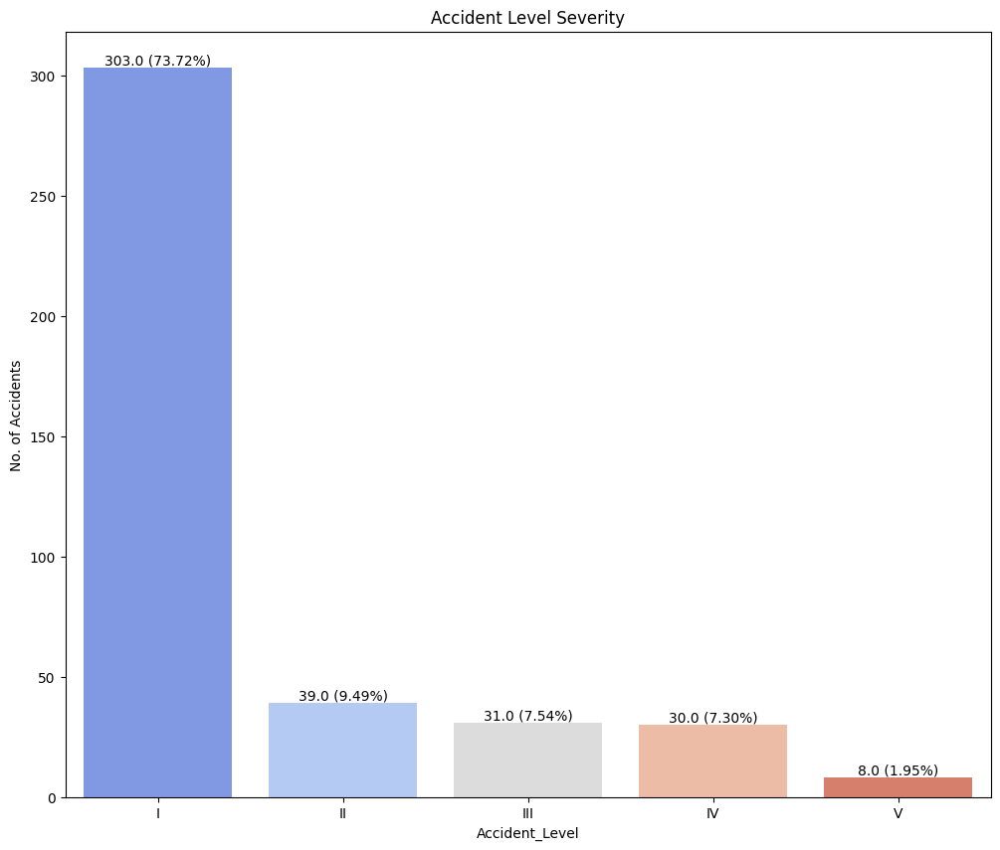

In [ ]:
#Accident Level
countplot('Accident_Level', 'Accident Level Severity')

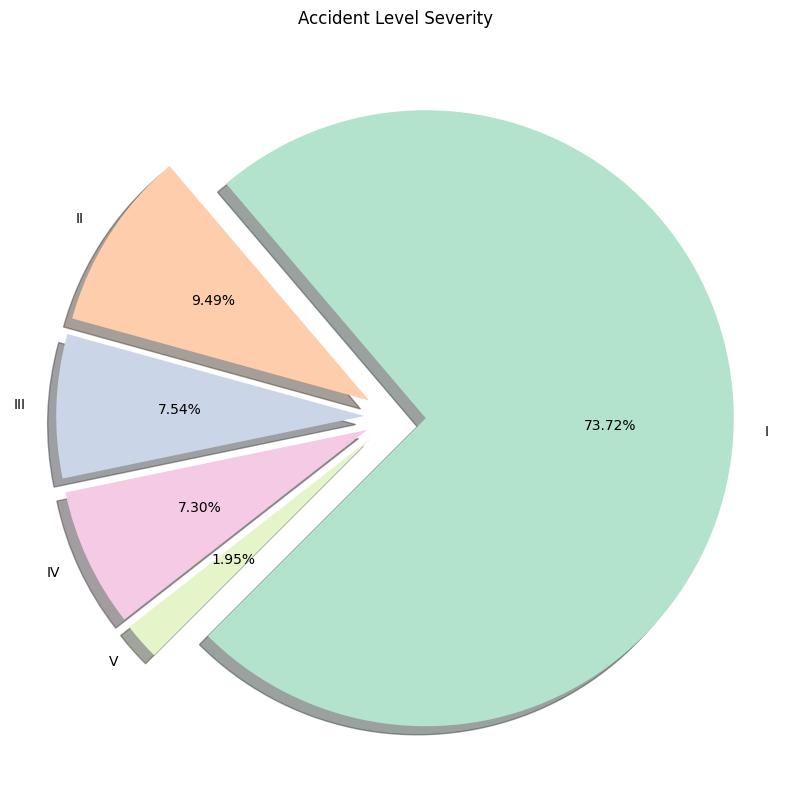

In [ ]:
#Accident Level
pieplot('Accident_Level', 'Accident Level Severity')

### Potential Level

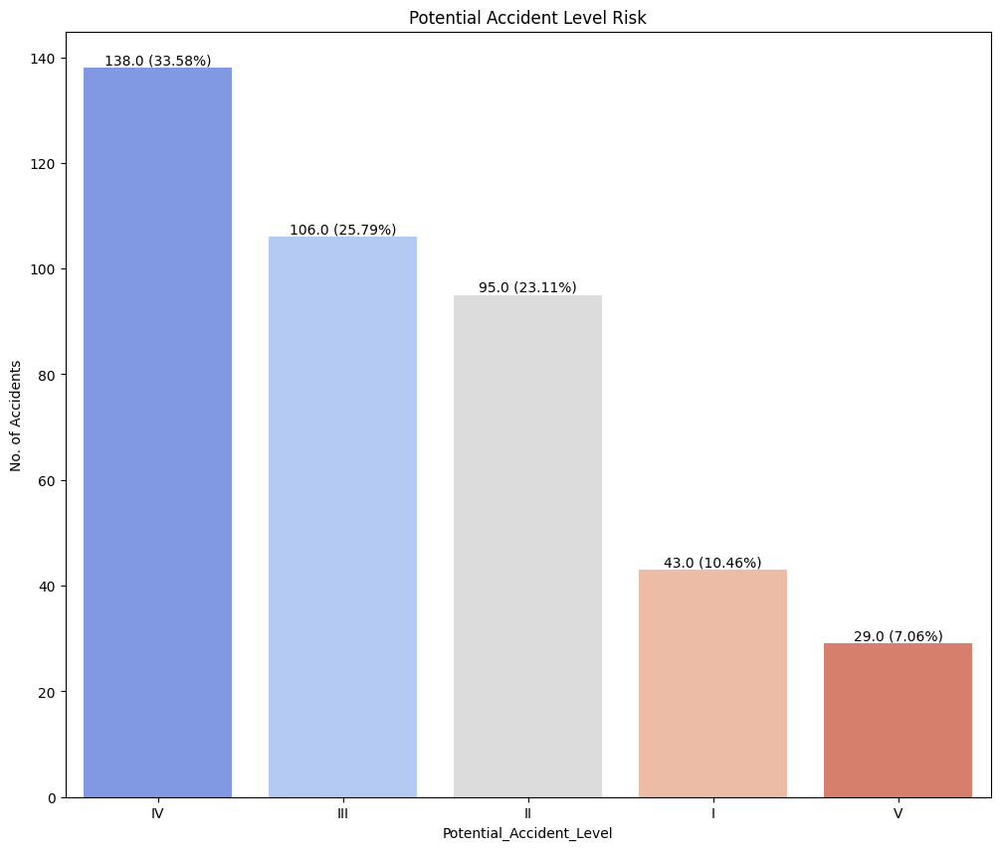

In [ ]:
#Potential Accident Level
countplot('Potential_Accident_Level', 'Potential Accident Level Risk')

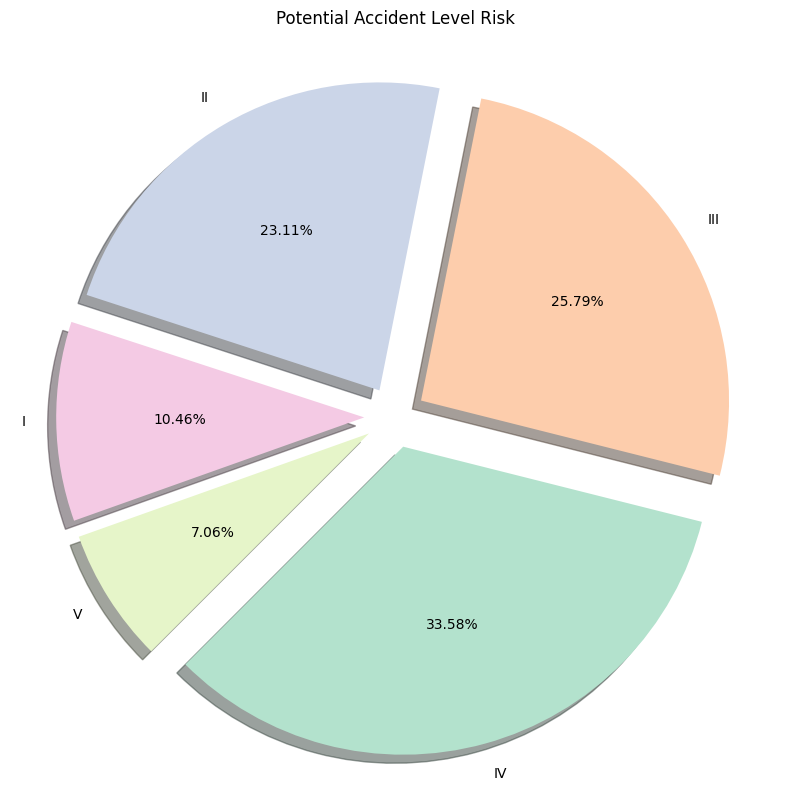

In [ ]:
#Potential Accident Level
pieplot('Potential_Accident_Level', 'Potential Accident Level Risk')

### Critical Risk

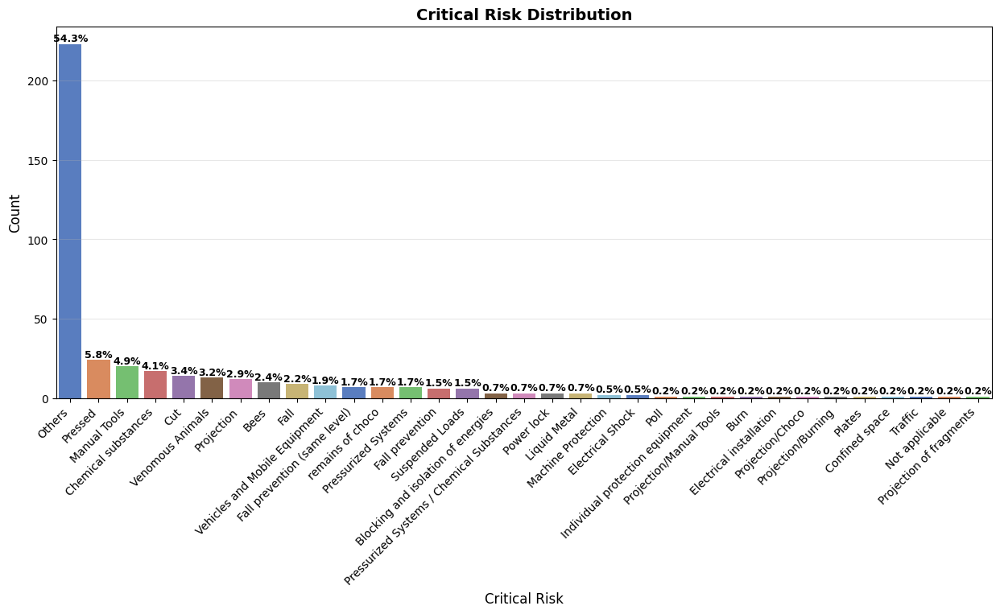

In [ ]:
# Function to add percentage annotations to the bars
def add_percentage_labels(ax):
    for p in ax.patches:
        percentage = f'{100 * p.get_height() / sum([p.get_height() for p in ax.patches]):.1f}%'
        ax.annotate(percentage, (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=9, color='black', weight='bold')

# Define a consistent color palette
palette = "muted"
# Analyze 'Critical Risk'
plt.figure(figsize=(15, 6))
ax = sns.countplot(x='Critical_Risk', data=df, palette=palette, order=df['Critical_Risk'].value_counts().index)
add_percentage_labels(ax)
plt.title('Critical Risk Distribution', fontsize=14, weight='bold')
plt.xlabel('Critical Risk', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.show()

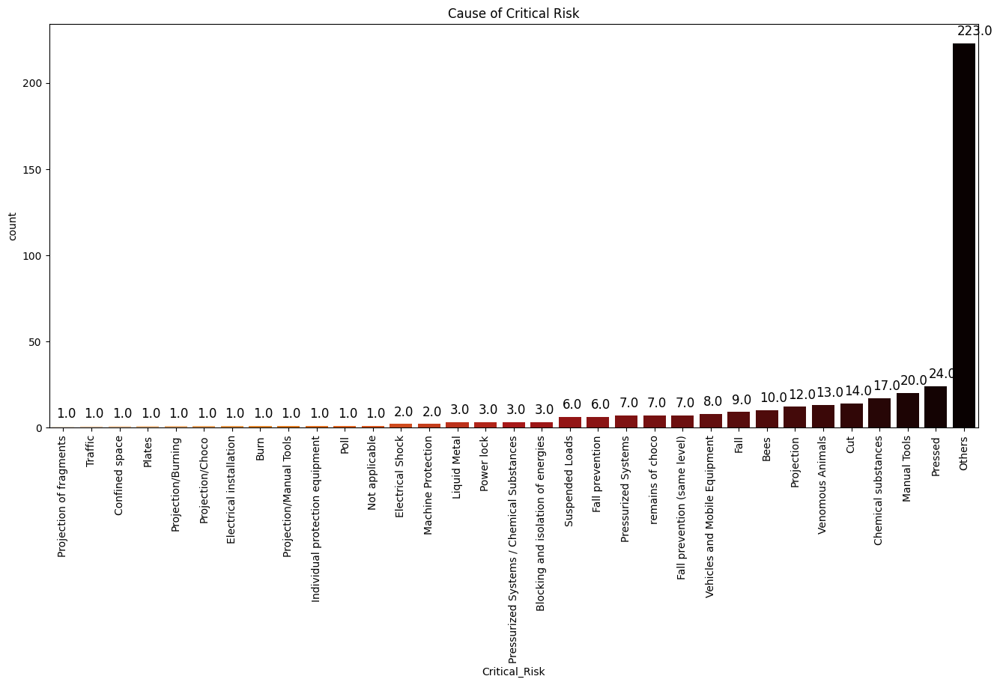

In [ ]:
# Critical Risk Count
plt.figure(figsize = (16,7))
ax = sns.countplot(x = df['Critical_Risk'], order=df['Critical_Risk'].value_counts().sort_values(ascending = True).index, palette = 'gist_heat_r');
plt.title('Cause of Critical Risk');
plt.xticks(rotation = 'vertical');

total = sum(df['Critical_Risk'].value_counts())
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()),
                (p.get_x(), p.get_height()),
                 size=12,
                 xytext = (4, 8),
                 textcoords = 'offset points')

### Observations

**Observations**

- **Accident Levels**

  Accident Level I has the highest count, around 300 occurrences, significantly more frequent than the other levels. Accident Levels II, III, and IV each have similar counts, ranging from 30 to 50 occurrences. Accident Level V has the lowest count, with approximately 8 occurrences.This distribution is heavily skewed towards Accident Level I, making it the most common accident level.

- **Potential Accident Levels**

  **Dominance of Level IV**: This level stands out as the most frequent, suggesting it is the most common severity.
  
  **Significant Drop-off**: There's a noticeable decrease in counts from Level IV to Level I, and further to Level V & VI.
  
  **Rare Occurrences**: Levels V & VI are less, indicating fewer severe accidents at these levels.

- **Gender**

  **Male Count:** The count for males is significantly higher, nearly reaching 400 occurrences. **Female Count:** The count for females is much lower, around 21 occurrences.

  **`Gender Imbalance:`** There's a notable disparity between the number of males and females. This indicates a predominant presence of males in the dataset being analyzed.
  
  **`Data Implications:`** Such a skewed distribution could have various implications, such as influencing the outcome of gender-based analyses or representing a specific characteristic of the dataset's population.

- **Employee Type**

  **Third Party:** This category has the highest count,i.e 180.

  **Employee:** The count for employees is 176. Third Party (Remote): This category has the lowest count, around 55.
  
  **Third Party and Employees**: The counts for both the Third Party and Employees are quite similar, indicating a nearly equal distribution between these two categories.
  
  **Remote Third Party is Less Common**: The Third Party (Remote) category has significantly fewer occurrences compared to the other two categories.

**Incident Trends Over Time**

Date Range: 2016-01-01 00:00:00 to 2017-07-09 00:00:00


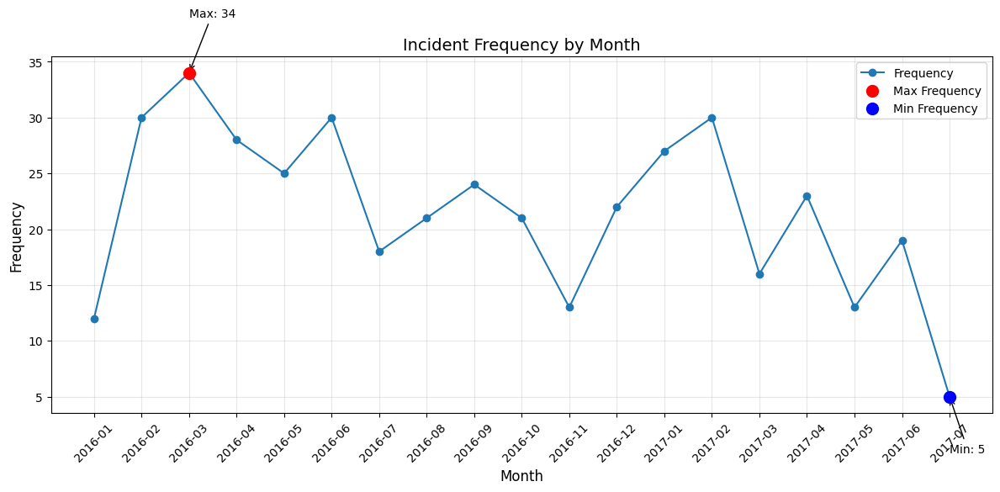

In [ ]:
# Analyze Date Column
date_column = 'Date'  # Replace with the actual date column name
if date_column in df.columns:
    print(f"Date Range: {df[date_column].min()} to {df[date_column].max()}")

    # Aggregate and prepare data for plotting
    monthly_counts = df[date_column].dt.to_period("M").value_counts().sort_index()

    # Convert PeriodIndex to string for compatibility
    monthly_counts.index = monthly_counts.index.astype(str)

    # Plot date distribution
    plt.figure(figsize=(12, 6))
    plt.plot(monthly_counts.index, monthly_counts.values, marker='o', label="Frequency")

    # Highlight maximum and minimum points
    max_point = monthly_counts.idxmax()
    min_point = monthly_counts.idxmin()
    plt.scatter(max_point, monthly_counts.max(), color='red', s=100, zorder=5, label="Max Frequency")
    plt.scatter(min_point, monthly_counts.min(), color='blue', s=100, zorder=5, label="Min Frequency")

    # Add annotations
    plt.annotate(f"Max: {monthly_counts.max()}",
                 xy=(max_point, monthly_counts.max()),
                 xytext=(max_point, monthly_counts.max() + 5),
                 arrowprops=dict(facecolor='red', arrowstyle="->"), fontsize=10)

    plt.annotate(f"Min: {monthly_counts.min()}",
                 xy=(min_point, monthly_counts.min()),
                 xytext=(min_point, monthly_counts.min() - 5),
                 arrowprops=dict(facecolor='blue', arrowstyle="->"), fontsize=10)

    # Customize the chart
    plt.title("Incident Frequency by Month", fontsize=14)
    plt.xlabel("Month", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()



**Highest Incident Frequency:** March 2016 had the highest number of incidents, around 35.

**Lowest Incident Frequency:** July 2017 saw the lowest incident count, around 5.

**Overall Decline:** There is a general downward trend in incident frequency from January 2016 to July 2017, with noticeable fluctuations.

**Significant Drops and Peaks:**

- A sharp decline from February 2016 to June 2016.

- Peaks in incident frequency in February and March 2016, June 2016, January 2017, and February 2017.

- `Seasonal Pattern`: Early months of each year tend to have higher incident frequencies compared to later months.

**Seasonal Analysis**

In [ ]:
df.head()

,Date,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description,Month
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,1
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,1
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,1
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,1
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,1


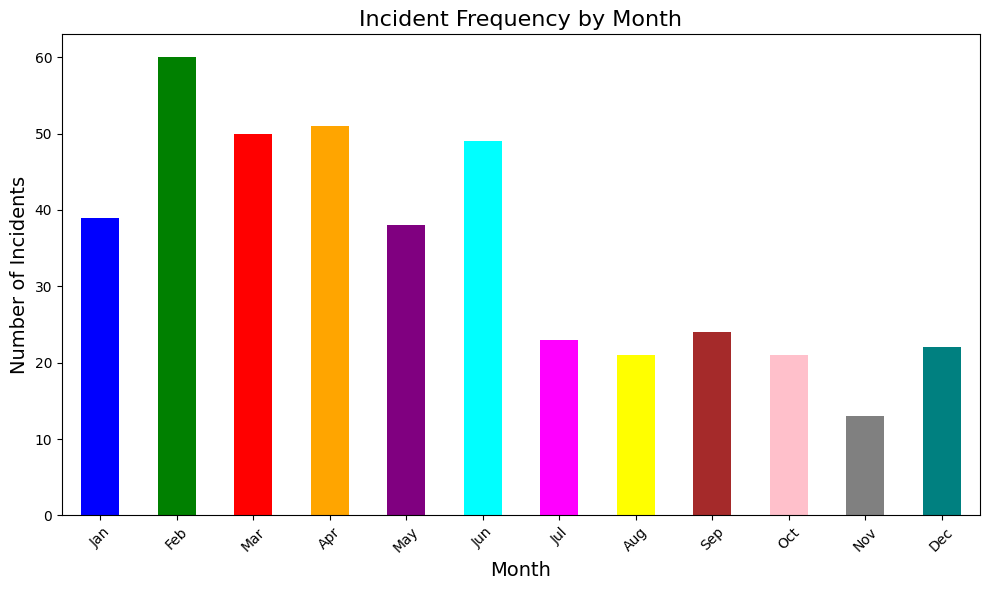

In [ ]:
# Assuming 'df' has been defined and 'Date' column is in datetime format

# Add a column for the month
df['Month'] = df['Date'].dt.month

# Aggregate incidents by month
incidents_by_month = df['Month'].value_counts().sort_index()

# Define a list of colors for each month
month_colors = [
    'blue', 'green', 'red', 'orange', 'purple', 'cyan',
    'magenta', 'yellow', 'brown', 'pink', 'gray', 'teal'
]

# Plot the seasonal trend
incidents_by_month.plot(kind='bar', color=month_colors, figsize=(10, 6))
plt.title("Incident Frequency by Month", fontsize=16)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Number of Incidents", fontsize=14)
plt.xticks(
    range(0, 12),
    ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
    rotation=45
)
plt.tight_layout()
plt.show()


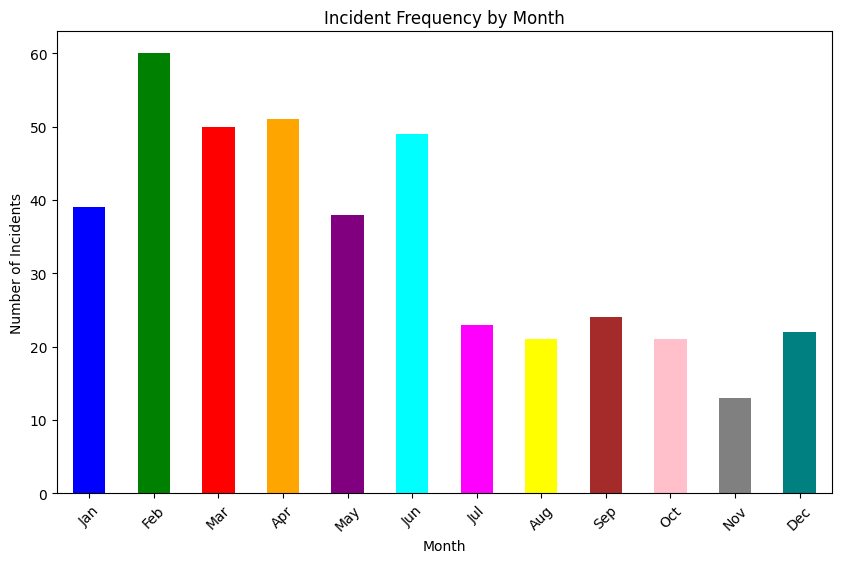

In [ ]:
#Add a column for the month
df['Month'] = df['Date'].dt.month

# Aggregate incidents by month
incidents_by_month = df['Month'].value_counts().sort_index()

# Plot the seasonal trend
incidents_by_month.plot(kind='bar', color=month_colors, figsize=(10, 6))
plt.title("Incident Frequency by Month")
plt.xlabel("Month")
plt.ylabel("Number of Incidents")
plt.xticks(
    range(0, 12),
    ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
    rotation=45
)
plt.show()


**Peak in February:** February has the highest number of incidents, with around 60 incidents. This indicates a significant spike in incidents during this month.

**Consistent Incident Rates:** March, April, and June have similar incident frequencies, each with around 50 incidents. These months show a relatively high but stable rate of incidents.

**Moderate Incident Counts in Jan and May:** These months have a number of incidents which is around 40.

**Significant Drop from June Onwards:** Starting from June, there is a noticeable drop in the number of incidents. July itself has around 20 incidents.

**Low Incident Rates in Late Months:** August, September, October, and November have relatively low incident frequencies, ranging from about 15 to 25 incidents each.

**Slight Increase in December:** December sees a slight increase in incidents compared to the preceding months, with around 25 incidents.

**Key Insights:**

**Seasonal Patterns:** There appears to be a seasonal pattern in the incident frequency, with higher rates in the early months of the year and lower rates towards the end.

**February's Peak:** The peak in February suggests that there may be specific factors contributing to a higher risk during this month.

**Stable Early Year Rates:** The consistent rates March, and April might indicate periods of increased activity or specific conditions that lead to higher incidents.

**Day-of-Week Analysis**

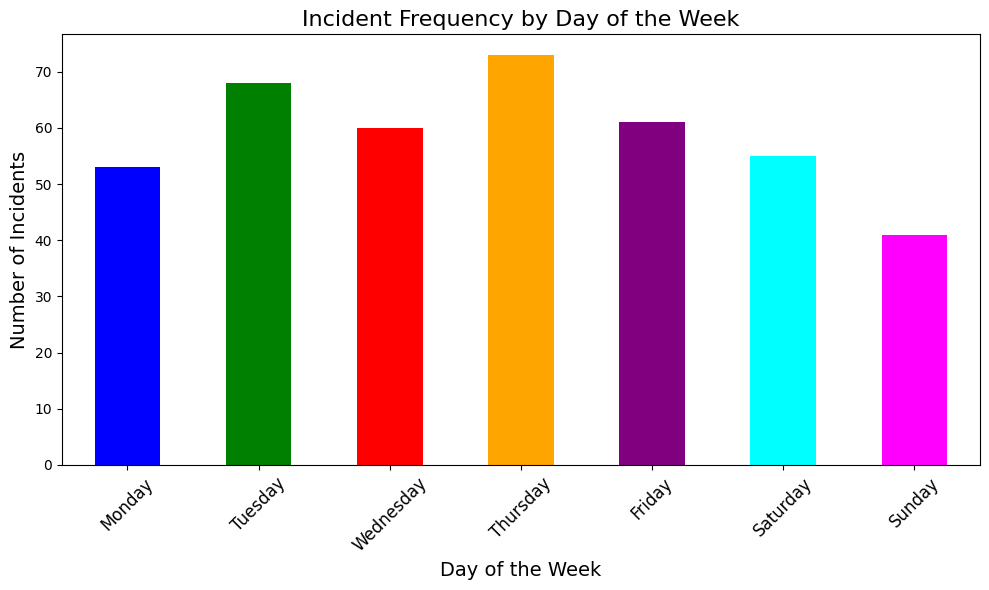

In [ ]:
# Add a column for the day of the week
df['Day_of_Week'] = df['Date'].dt.day_name()

# Aggregate incidents by day of the week
incidents_by_day = df['Day_of_Week'].value_counts()

# Reorder the days of the week
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
incidents_by_day = incidents_by_day.reindex(days_order)

# Define unique colors for each day
day_colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta']

# Plot the day-of-week trend
incidents_by_day.plot(
    kind='bar',
    color=day_colors,  # Assign colors for each day
    figsize=(10, 6)
)
plt.title("Incident Frequency by Day of the Week", fontsize=16)
plt.xlabel("Day of the Week", fontsize=14)
plt.ylabel("Number of Incidents", fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()


**Thursday:** This day has the highest number of incidents, with a frequency close to 80.

**Tuesday, Wednesday & Friday:** These days also have relatively high incident frequencies, with Tuesday slightly higher than Wednesday & Friday.

**Monday and Saturday:** Monday & Saturday have moderate incident frequencies.

**Sunday:** Sunday has the lowest incident frequencies.

**Key Observations:**
**Peak on Thursday:** The high number of incidents on Thursday suggests it is the most critical day in terms of incidents.

**Consistent Mid-Week Activity:** Tuesday and Wednesday show similar high incident frequencies, indicating that mid-week days are notably busier in terms of incidents.

**Weekend Dip:** Incident frequencies drop significantly over the weekend, with the lowest count on Sunday. This could imply reduced activities or operations during weekends.

**Time Between Incidents**

count    410.000000
mean       1.353659
std        1.468262
min        0.000000
25%        0.000000
50%        1.000000
75%        2.000000
max        7.000000
Name: Date, dtype: float64


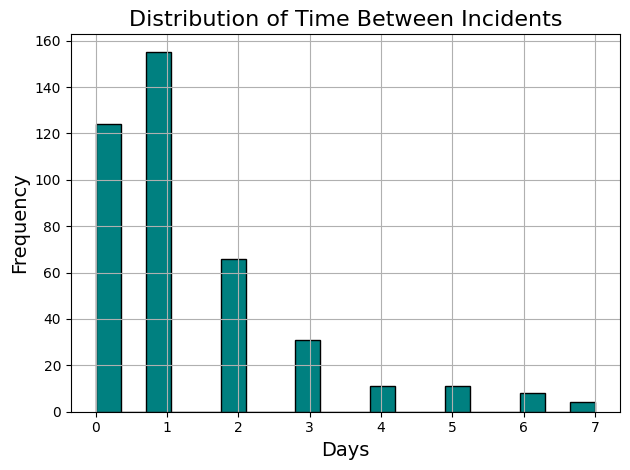

In [ ]:
# Sort by date
df = df.sort_values('Date')

# Calculate time difference between incidents
time_between_incidents = df['Date'].diff().dt.days

# Describe and visualize
print(time_between_incidents.describe())

# Plot the histogram with a custom color
time_between_incidents.hist(bins=20, edgecolor='k', color='teal')  # Changed color to 'teal'
plt.title("Distribution of Time Between Incidents", fontsize=16)
plt.xlabel("Days", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.tight_layout()
plt.show()


**Peak Frequency at 1 Day:** The highest frequency of incidents occurs at 1 day, with a count slightly above 150. This indicates that incidents are most likely to occur within one day of each other.

**Second Highest at 0 Days:** The next highest frequency is at 0 days, with around 130 incidents. This suggests a significant number of incidents happen on the same day.

**Decreasing Trend:** The frequency of incidents decreases as the number of days between them increases. There is a noticeable drop in frequency after 2 days.

**Low Frequencies Beyond 3 Days:** For 3 days and beyond, the frequencies are significantly lower, with each of the 4, 5, 6, and 7-day categories having fewer than 20 incidents.

**Key Insights:**

**Immediate Clustering:** The high frequencies at 0 and 1 day imply that incidents tend to cluster closely in time.

**Rapid Decline:** The sharp decline in incidents after 2 days suggests that extended periods between incidents are less common.

**Incident Frequency by Year**

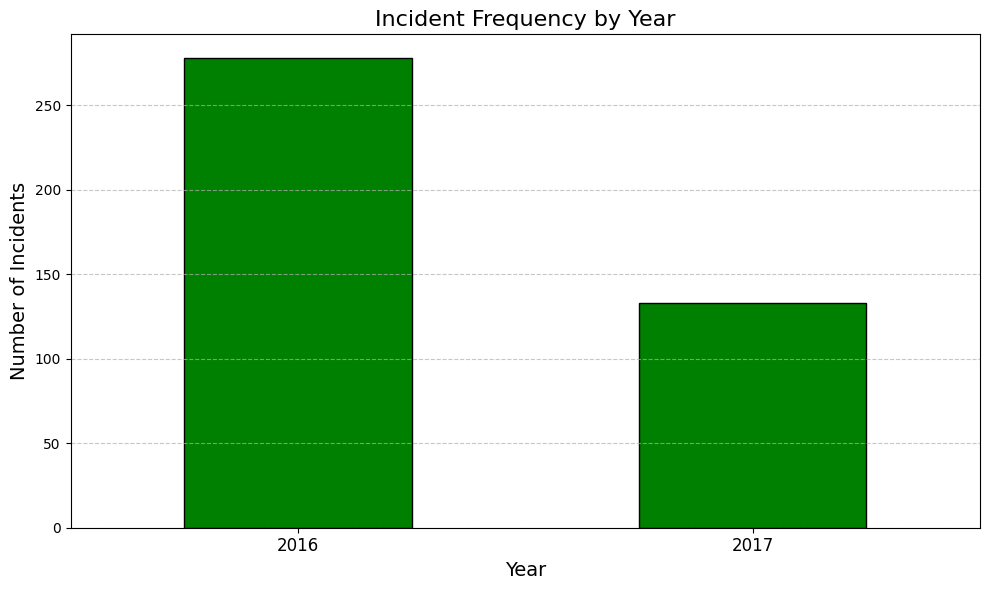

In [ ]:
# Add a column for the year
df['Year'] = df['Date'].dt.year

# Aggregate incidents by year
incidents_by_year = df['Year'].value_counts().sort_index()

# Plot 1: Standard bar plot
plt.figure(figsize=(10, 6))
incidents_by_year.plot(kind='bar', color='green', edgecolor='black')
plt.title("Incident Frequency by Year", fontsize=16)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Number of Incidents", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add gridlines for y-axis
plt.xticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()



- Incident Frequency is higher in 2016 as compared to 2017.

**Description length**

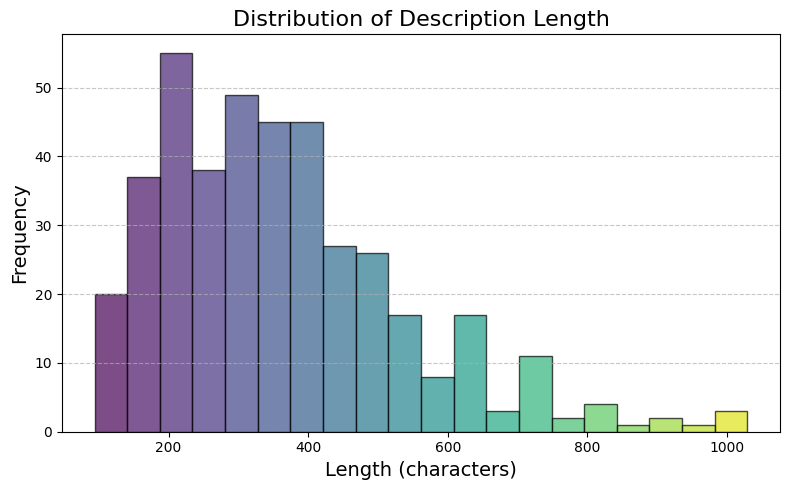

,Description_Length
count,411.000000
mean,363.401460
std,176.743032
min,94.000000
25%,225.000000
50%,331.000000
75%,452.000000
max,1029.000000


In [ ]:
# Compute the length of the news content
df['Description_Length'] = df['Description'].apply(len)

# Plot the distribution of news lengths with different colors for each bar
plt.figure(figsize=(8, 5))
n, bins, patches = plt.hist(df['Description_Length'], bins=20, alpha=0.7, edgecolor='black')

# Use a colormap to apply different colors to the bars
for i, patch in enumerate(patches):
    patch.set_facecolor(plt.cm.viridis(i / len(patches)))  # Apply colormap

plt.title('Distribution of Description Length', fontsize=16)
plt.xlabel('Length (characters)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Display summary statistics for the news length
length_summary = df['Description_Length'].describe()
length_summary


**Peak Frequency (200-300 Characters):** The most common description lengths are between 200 and 300 characters, with the highest frequency slightly above 50. This indicates that a majority of descriptions fall within this length range.

**Gradual Decline:** There's a gradual decline in frequency as the description length increases beyond 300 characters. This shows that longer descriptions become progressively less common.

**Notable Drop Beyond 500 Characters:** There is a noticeable drop in frequency after 500 characters, indicating that very few descriptions exceed this length.

**Very Few Long Descriptions**:  Descriptions longer than 800 characters are very rare, highlighting that most descriptions are relatively concise.

**Key Insights:**

* The high frequency of descriptions within the 200-300 character range suggests a preference for concise descriptions.

* As description length increases, the likelihood of occurrence decreases, pointing towards a tendency to avoid overly long descriptions.

##Bivariate Analysis

### Country Vs Accident Level

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df_counts = df.groupby(["Country", "Accident_Level"]).size().reset_index(name="Count")

print(df_counts)


       Country Accident_Level  Count
0   Country_01              I    174
1   Country_01             II     19
2   Country_01            III     21
3   Country_01             IV     23
4   Country_01              V      8
5   Country_02              I     97
6   Country_02             II     18
7   Country_02            III      7
8   Country_02             IV      5
9   Country_03              I     32
10  Country_03             II      2
11  Country_03            III      3
12  Country_03             IV      2


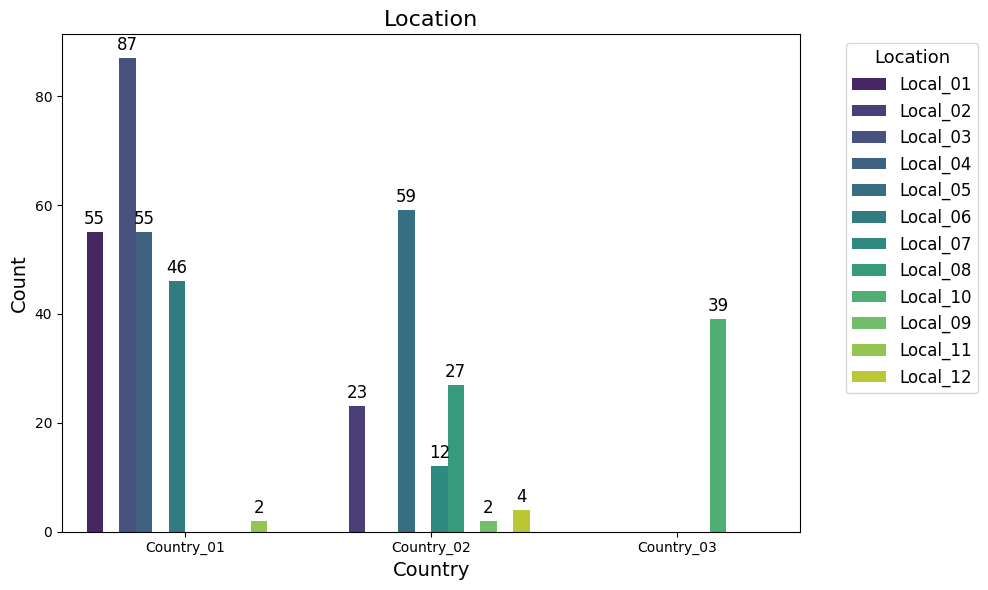

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    data=df,
    x="Country",
    hue="Location",  # Updated column name
    palette="viridis"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="black")

# Add labels and title
plt.title("Location", fontsize=16)
plt.xlabel("Country", fontsize=14)
plt.ylabel("Count", fontsize=14)

# Move the legend outside the box
plt.legend(
    title="Location",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)

# Adjust x-axis labels
plt.xticks(rotation=0)

# Ensure the layout looks good
plt.tight_layout()

plt.show()


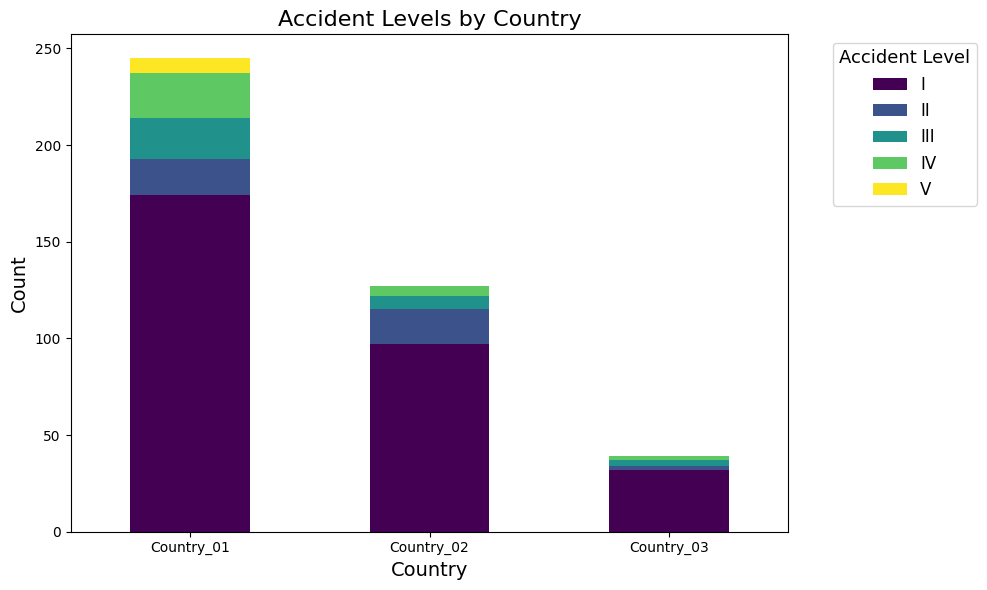

In [ ]:
pivot_df = df_counts.pivot(index="Country", columns="Accident_Level", values="Count").fillna(0)

pivot_df.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="viridis")

plt.title("Accident Levels by Country", fontsize=16)
plt.xlabel("Country", fontsize=14)
plt.ylabel("Count", fontsize=14)
# Move the legend outside the box
plt.legend(
    title="Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()


* Maximum number of accidents are occurred in Country_01 with high number of frequencies in Level I

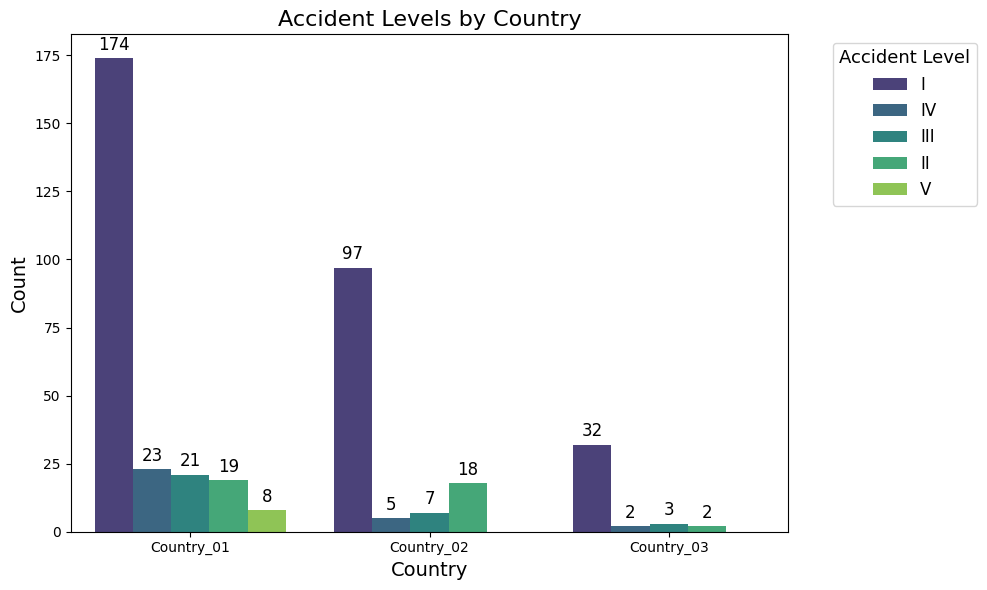

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    data=df,
    x="Country",
    hue="Accident_Level",  # Updated column name
    palette="viridis"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="black")

# Add labels and title
plt.title("Accident Levels by Country", fontsize=16)
plt.xlabel("Country", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend(
    title="Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

- Country_01 has maximum number of accidents with accident level from I - V
- Country_01 has 8 cases for accident with severe accident i.e V as compared to Country_02 & Country_03.
- Country_01 has maximum number of accidents, followed by Country_02 & Country_03.

### Potential Accident level counts by Country

In [ ]:

counts_potential_accidents_country = df.groupby(["Country", "Potential_Accident_Level"]).size().reset_index(name="Count")

print(counts_potential_accidents_country)

       Country Potential_Accident_Level  Count
0   Country_01                        I     10
1   Country_01                       II     51
2   Country_01                      III     64
3   Country_01                       IV     98
4   Country_01                        V     22
5   Country_02                        I      6
6   Country_02                       II     40
7   Country_02                      III     41
8   Country_02                       IV     33
9   Country_02                        V      7
10  Country_03                        I     27
11  Country_03                       II      4
12  Country_03                      III      1
13  Country_03                       IV      7


In [ ]:
counts_potential_accidents_country = df.groupby(["Country"]).size().reset_index(name="Count")

print(counts_potential_accidents_country)

      Country  Count
0  Country_01    245
1  Country_02    127
2  Country_03     39


- Country_01 has maximum number of Potential Risks Level.

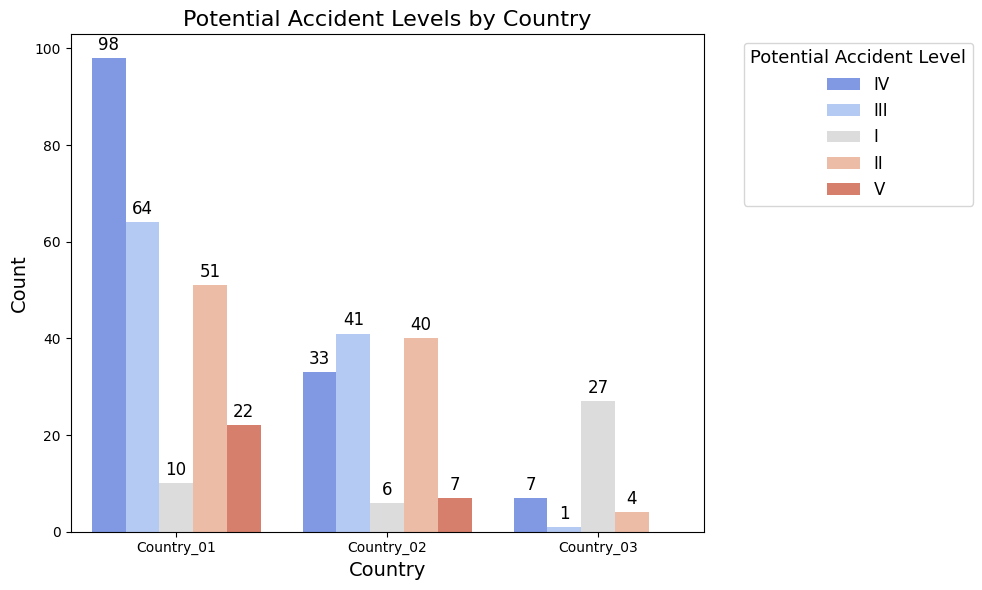

In [ ]:
import matplotlib.pyplot as plt

# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    data=df,
    x="Country",
    hue="Potential_Accident_Level",  # Updated column name
    palette="coolwarm"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="black")

# Add labels and title
plt.title("Potential Accident Levels by Country", fontsize=16)
plt.xlabel("Country", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend(
    title="Potential Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)

plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

### Potential Accident level counts by Locations

In [ ]:
counts_potential_accidents_local = df.groupby(["Location", "Potential_Accident_Level"]).size().reset_index(name="Count")

print(counts_potential_accidents_local)

    Location Potential_Accident_Level  Count
0   Local_01                        I      2
1   Local_01                       II      7
2   Local_01                      III     13
3   Local_01                       IV     29
4   Local_01                        V      4
5   Local_02                        I      1
6   Local_02                       II      6
7   Local_02                      III      6
8   Local_02                       IV      7
9   Local_02                        V      3
10  Local_03                        I      2
11  Local_03                       II     12
12  Local_03                      III     21
13  Local_03                       IV     39
14  Local_03                        V     13
15  Local_04                        I      2
16  Local_04                       II     11
17  Local_04                      III     19
18  Local_04                       IV     19
19  Local_04                        V      4
20  Local_05                        I      1
21  Local_

In [ ]:
counts_potential_accidents_localwise = df.groupby(["Location"]).size().reset_index(name="Count")
# Sort the data by "Count" in descending order
counts_potential_accidents_localwise = counts_potential_accidents_localwise.sort_values(by="Count", ascending=False)

print(counts_potential_accidents_localwise)


    Location  Count
2   Local_03     87
4   Local_05     59
0   Local_01     55
3   Local_04     55
5   Local_06     46
9   Local_10     39
7   Local_08     27
1   Local_02     23
6   Local_07     12
11  Local_12      4
8   Local_09      2
10  Local_11      2


* Local_03 has maximum of accidents, followed by Local_05, Local_01 and Local_04.

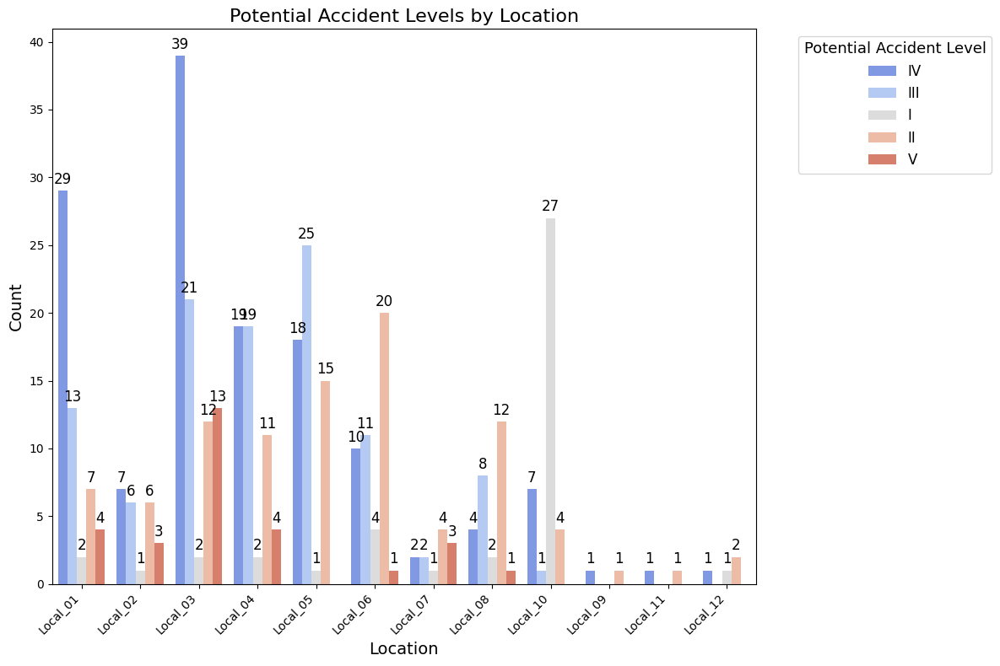

In [ ]:
# Create the count plot
plt.figure(figsize=(12, 8))  # Adjust the figure size to provide more space
ax = sns.countplot(
    data=df,
    x="Location",
    hue="Potential_Accident_Level",  # Updated column name
    palette="coolwarm"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="black")

# Add labels and title
plt.title("Potential Accident Levels by Location", fontsize=16)
plt.xlabel("Location", fontsize=14)
plt.ylabel("Count", fontsize=14)

# Adjust legend position
plt.legend(
    title="Potential Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)

# Adjust x-axis labels to avoid overlap
plt.xticks(rotation=45, ha='right')  # Rotate labels and align them to the right

# Ensure layout looks good
plt.tight_layout()

plt.show()


- In regard to potential risk IV,  Local_03 has the major chance for potential risk as compared to other cities.
- Local_03 has more cases of potential accident level.

### Potential Accident level counts by Industry Sector

In [ ]:
# Group by Industry Sector and Potential Accident Level
counts_potential_accidents_industry = (
    df.groupby(["Industry_Sector", "Potential_Accident_Level"])
    .size()
    .reset_index(name="Count")
)

# Sort by Count in descending order
counts_potential_accidents_industry = counts_potential_accidents_industry.sort_values(by="Count", ascending=False)

print(counts_potential_accidents_industry)


   Industry_Sector Potential_Accident_Level  Count
8           Mining                       IV     96
7           Mining                      III     61
1           Metals                       II     48
2           Metals                      III     44
6           Mining                       II     40
3           Metals                       IV     33
10          Others                        I     28
9           Mining                        V     27
13          Others                       IV      9
5           Mining                        I      8
0           Metals                        I      7
11          Others                       II      7
4           Metals                        V      2
12          Others                      III      1


- Industry Sector 'Mining' has highest number of accidents i.e. 96 with Potential Accident Level IV.
- Industry Sector 'Mining' has highest number of accidents i.e. 61 with Potential Accident Level III.
- Industry Sector 'Metals' has number of accidents i.e. 48 with Potential Accident Level II.
- Industry Sector 'Metals' has number of accidents i.e. 44 with Potential Accident Level III.

In [ ]:
#Potential Accident level counts by Industry Sector
import matplotlib.pyplot as plt
import pandas as pd

counts_potential_accidents_industrywise = df.groupby(["Industry_Sector"]).size().reset_index(name="Count")

print(counts_potential_accidents_industrywise)



  Industry_Sector  Count
0          Metals    134
1          Mining    232
2          Others     45


- Maximun number of accidents occurred in 'Mining' Industry Sector, followed by Metals and Others.

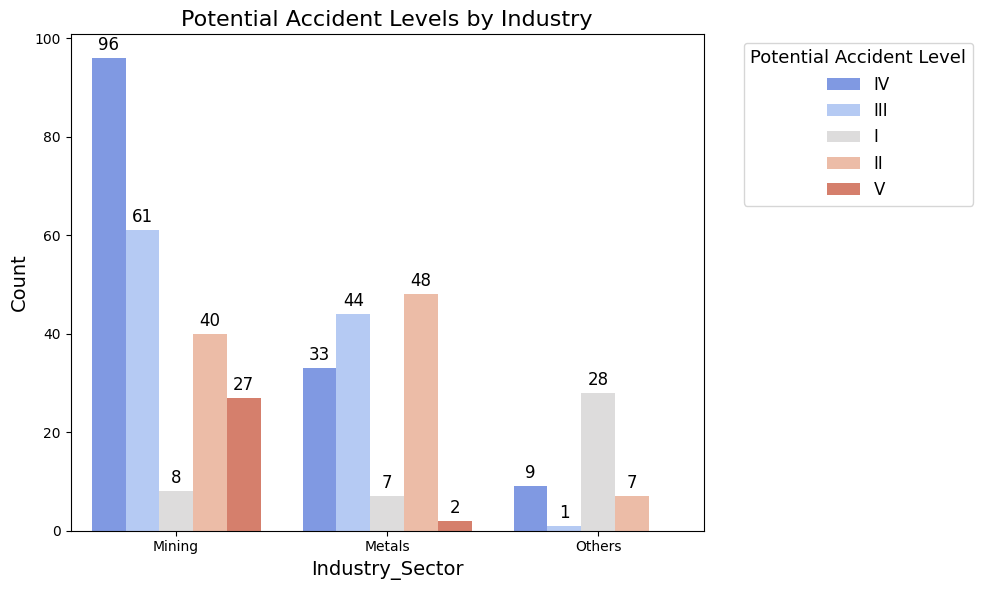

In [ ]:
# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    data=df,
    x="Industry_Sector",
    hue="Potential_Accident_Level",  # Updated column name
    palette="coolwarm"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="black")

# Add labels and title
plt.title("Potential Accident Levels by Industry", fontsize=16)
plt.xlabel("Industry_Sector", fontsize=14)
plt.ylabel("Count", fontsize=14)

# Adjust legend position
plt.legend(
    title="Potential Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)

plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

- Out of all industries, Mining Industry has seen some accidents whose level is
the most severe and the corresponding potential Accident level is also highest.
* This is followed by Metal industry and other.
* Severity levels of the incidents are more in Mining sector (POtential level of IV has higher than Level III & II)


### Potential Accident level counts by Employee Type

In [ ]:
# Group by Employee Type and Potential Accident Level
counts_potential_accidents_employee = (
    df.groupby(["Employee_Type", "Potential_Accident_Level"])
    .size()
    .reset_index(name="Count")
)

# Sort by Count in descending order
counts_potential_accidents_employee = counts_potential_accidents_employee.sort_values(by="Count", ascending=False)

print(counts_potential_accidents_employee)


           Employee_Type Potential_Accident_Level  Count
8            Third Party                       IV     65
3               Employee                       IV     58
2               Employee                      III     53
1               Employee                       II     44
6            Third Party                       II     37
7            Third Party                      III     35
5            Third Party                        I     28
12  Third Party (Remote)                      III     18
9            Third Party                        V     15
13  Third Party (Remote)                       IV     15
11  Third Party (Remote)                       II     14
0               Employee                        I     11
4               Employee                        V     10
10  Third Party (Remote)                        I      4
14  Third Party (Remote)                        V      4


* The maximum number of accidents has been occurred for Employee Type 'Third Party' with Potential Accident Level of IV with count of 65.
* Employee Type with Category 'Employee' has 58 cases of accidents with Potential Accident Level of IV.

In [ ]:
#Potential Accident level counts by Employee Type
counts_potential_accidents_employee = df.groupby(["Potential_Accident_Level"]).size().reset_index(name="Count")
print(counts_potential_accidents_employee)

  Potential_Accident_Level  Count
0                        I     43
1                       II     95
2                      III    106
3                       IV    138
4                        V     29


* Potential Accident Level IV has more number of frequency as compared to other levels of Potential Accident Level.

In [ ]:
#Potential Accident level counts by Employee Type
counts_potential_accidents_employeewise = df.groupby(["Employee_Type"]).size().reset_index(name="Count")
print(counts_potential_accidents_employeewise)

          Employee_Type  Count
0              Employee    176
1           Third Party    180
2  Third Party (Remote)     55


- Third Party Employees have high potential accident level as compared to Permanent Employee & Third party(Remote).
Potential Accident Level for Thid Party Employee has slighter higher than on payroll Employees.
- It has been observed that apart from Potential_Accident_Level_IV the people are also facing severe accidents (Accident_Level_III) in the industry.

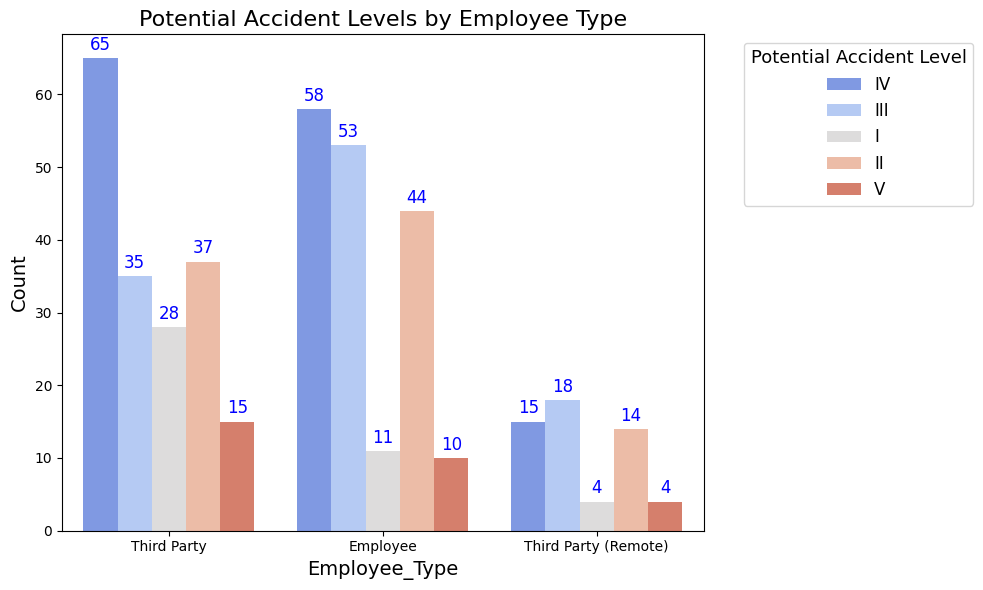

In [ ]:
# Create the count plot
plt.figure(figsize=(10, 6))
ax = sns.countplot(
    data=df,
    x="Employee_Type",
    hue="Potential_Accident_Level",  # Updated column name
    palette="coolwarm"
)

# Add counts to the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=12, padding=3, color="blue")

# Add labels and title
plt.title("Potential Accident Levels by Employee Type", fontsize=16)
plt.xlabel("Employee_Type", fontsize=14)
plt.ylabel("Count", fontsize=14)
# Adjust legend position
plt.legend(
    title="Potential Accident Level",
    fontsize=12,
    title_fontsize=13,
    loc="upper left",
    bbox_to_anchor=(1.05, 1)
)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

* Third Party has more number accidents as compare to employees of category 'Employee' and Third Party Remote
* Third Party has hight number of severe Potential accident level i.e. 65 with grade IV, followed by Employee (58-Grade IV) and Third Party (Remote) with 15 Grade IV.

### Potential Accident level counts by Critical Risk

In [ ]:
# Group by Critical Risk and calculate the count
counts_potential_accidents_critical_risk = (
    df.groupby(["Critical_Risk"])
    .size()
    .reset_index(name="Count")
)

# Sort by Count in descending order
counts_potential_accidents_critical_risk = counts_potential_accidents_critical_risk.sort_values(by="Count", ascending=False)

# Display the sorted DataFrame
print(counts_potential_accidents_critical_risk)


                                Critical_Risk  Count
16                                     Others    223
20                                    Pressed     24
14                               Manual Tools     20
3                         Chemical substances     17
5                                         Cut     14
31                           Venomous Animals     13
23                                 Projection     12
0                                        Bees     10
8                                        Fall      9
30              Vehicles and Mobile Equipment      8
21                        Pressurized Systems      7
32                           remains of choco      7
10               Fall prevention (same level)      7
28                            Suspended Loads      6
9                             Fall prevention      6
12                               Liquid Metal      3
19                                 Power lock      3
22  Pressurized Systems / Chemical Substances 

* Critical Risk of Others type has highest number of counts which is 223 followed by Pressed Critical risks of count 24.
* There are hardly single cases of accidents for Poll, Plates, Individuals,  Conifned Space etc.

### Potential Accident Level Vs Gender

In [ ]:
# Filtering the dataframe by Gender and Employee type and taking the count.
df_gender = df.groupby(['Gender','Potential_Accident_Level'])['Potential_Accident_Level'].count()

# 1.unstack() Function in dataframe unstacks the row to columns.
# 2.applying the row total and taking the ratio of male and female employees.
# 3.resetting the index

df_gender = df_gender.unstack().apply(lambda x: round(x / x.sum()*100), axis=1).reset_index()
df_gender = pd.melt(df_gender, ['Gender']).fillna(0) # melt() function unpivots a DataFrame from wide format to long format
df_gender

,Gender,Potential_Accident_Level,value
0,Female,I,0.0
1,Male,I,11.0
2,Female,II,67.0
3,Male,II,21.0
4,Female,III,14.0
5,Male,III,26.0
6,Female,IV,19.0
7,Male,IV,34.0
8,Female,V,0.0
9,Male,V,7.0


* In Potential Accident Level II, female sufferred more accidents as compared to Male.
* Other than Potential Accident Level II, in all cases Male has faced more accidents as compared to Female.


### Potential Accident Level Vs Month

Text(0.5, 0, 'Month')

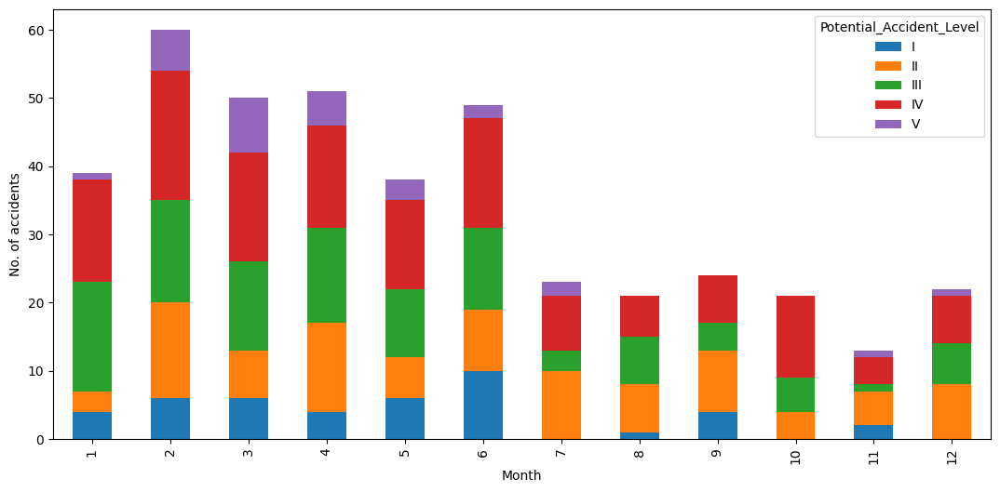

In [ ]:
ct = pd.crosstab(columns=df["Potential_Accident_Level"],index=df["Month"])
ax = ct.plot(kind="bar",stacked=True,figsize=(13,6))
ax.set_ylabel('No. of accidents')
ax.set_xlabel('Month')

* Accident level have the tendency that non-severe levels(I,II) decreased throughout the year but severe(III, IV) levels did not change much.
* Initial months see more accidents which seem to decrease by year end
* High level accidents(V) occur in the initial months

### Accidents Count by Country and Location

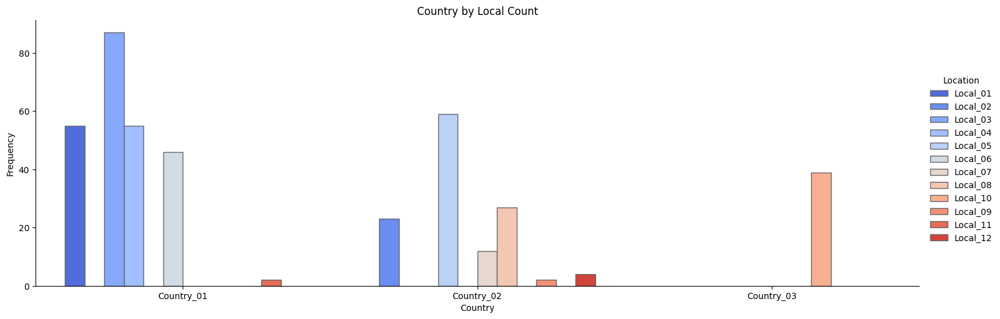

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating the count plot
sns.catplot(
    data=df,
    kind='count',
    x='Country',
    hue='Location',
    height=5,  # Height of the plot
    aspect=3,  # Width-to-height ratio
    edgecolor='.4',
    saturation=1,
    palette='coolwarm'
)

# Adding title and labels
plt.title('Country by Local Count')
plt.ylabel('Frequency')
plt.xlabel('Country')
plt.show()


- Maximum number of accidents are from Country_01 especially from Location Local_01, Local_03, Local_04.

### Accidents Count by Industry_Sector and Location

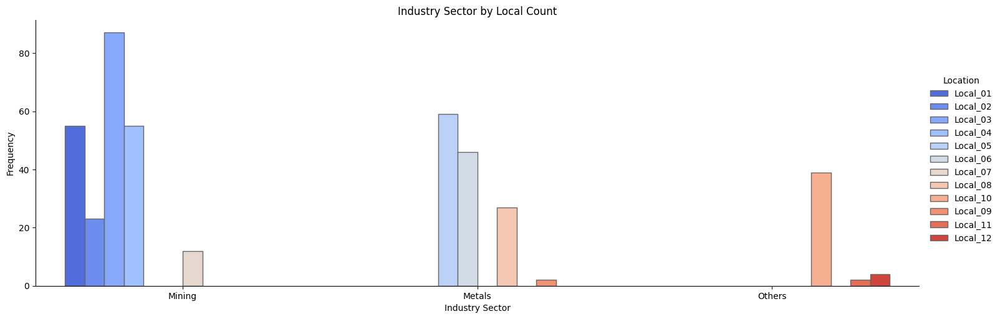

In [ ]:

# Creating the count plot
sns.catplot(
    data=df,
    kind='count',
    x='Industry_Sector',
    hue='Location',
    height=5,  # Height of the plot
    aspect=3,  # Width-to-height ratio
    edgecolor='.4',
    saturation=1,
    palette='coolwarm'
)

# Adding title and labels
plt.title('Industry Sector by Local Count')
plt.ylabel('Frequency')
plt.xlabel('Industry Sector')
plt.show()



It can be observed that Industry Sector depends on the Local area too.

*   Location Area 1, 2, 3 ,4 and 7 belong to Mining Sector.
*   Location Area 5, 6, 8 and 9 belong to Metal Sector.
*   Location Area 10, 11 and 12 belong to Other Sectors.


### Month Vs Critical Risk

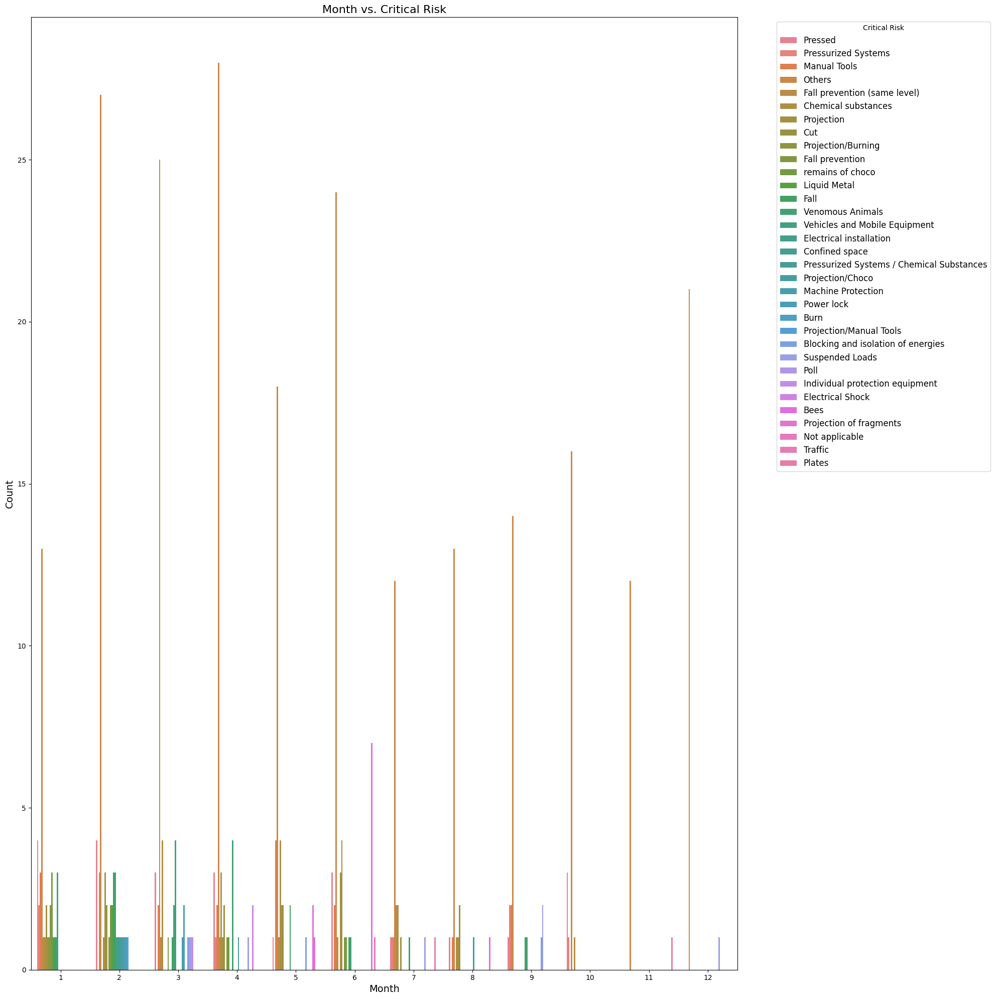

In [ ]:
# Analyze the relationship between 'Month' and 'Critical Risk'
plt.figure(figsize=(20, 20))
sns.countplot(x='Month', hue='Critical_Risk', data=df)

# Add title and labels
plt.title('Month vs. Critical Risk', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Adjust the legend to be outside the plot box
plt.legend(title='Critical Risk', loc='upper left', bbox_to_anchor=(1.05, 1), fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


### Accident Level Vs Industry Sector

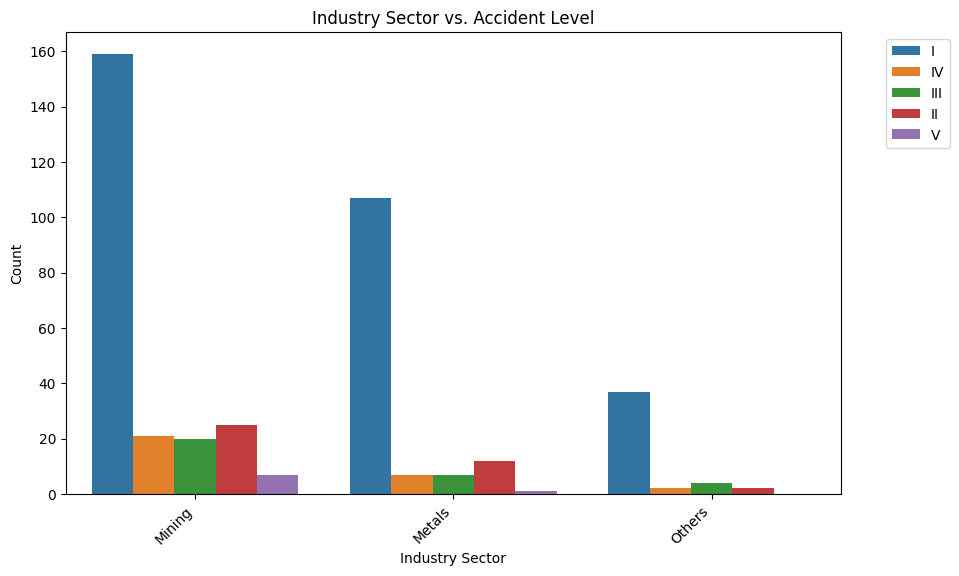

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Industry_Sector', hue='Accident_Level', data=df)
plt.title('Industry Sector vs. Accident Level')
plt.xlabel('Industry Sector')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

- Mining has more number of accidents as compared to Metals & Others.
* Out of all industries, Mining Industry has had most severe accidents
* Most of the accidents have been reported from mining industry and almost all of them are of moderate level, followed by Metal industry and Others.


### Accident Level Vs Critical Risks

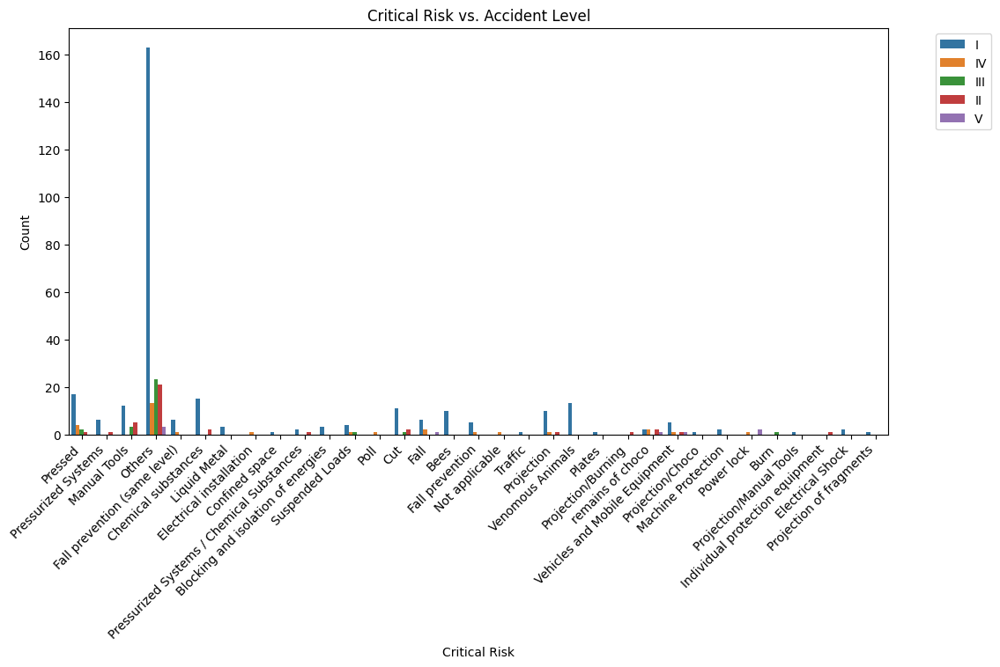

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Critical_Risk', hue='Accident_Level', data=df)
plt.title('Critical Risk vs. Accident Level')
plt.xlabel('Critical Risk')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Accident Level Vs Month

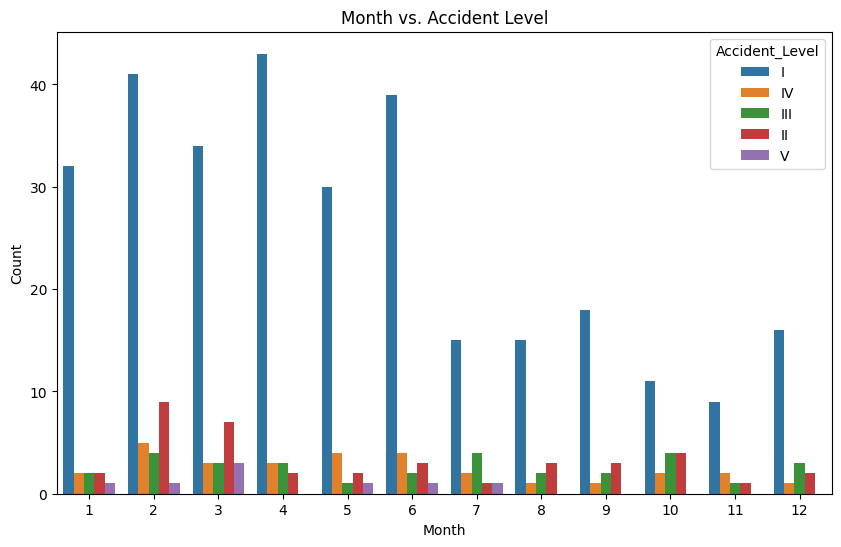

In [ ]:
# Analyze the relationship between 'Month' and 'Accident Level'
plt.figure(figsize=(10, 6))
sns.countplot(x='Month', hue='Accident_Level', data=df)
plt.title('Month vs. Accident Level')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

### Employeee type by Gender Count

In [ ]:
# Filtering the dataframe by Gender and Employee type and taking the count.
df_gemp = df.groupby(['Gender','Employee_Type'])['Employee_Type'].count()

# 1.unstack() Function in dataframe unstacks the row to columns.
# 2.applying the row total and taking the ratio of male and female employees.
# 3.resetting the index

df_gemp = df_gemp.unstack().apply(lambda x: round(x / x.sum()*100), axis=1).reset_index()
df_gemp = pd.melt(df_gemp, ['Gender']) # melt() function unpivots a DataFrame from wide format to long format
df_gemp

,Gender,Employee_Type,value
0,Female,Employee,38.0
1,Male,Employee,43.0
2,Female,Third Party,38.0
3,Male,Third Party,44.0
4,Female,Third Party (Remote),24.0
5,Male,Third Party (Remote),13.0


* In Employee_Type 'Employee' and 'Third Party', male members are more as compared to female count.

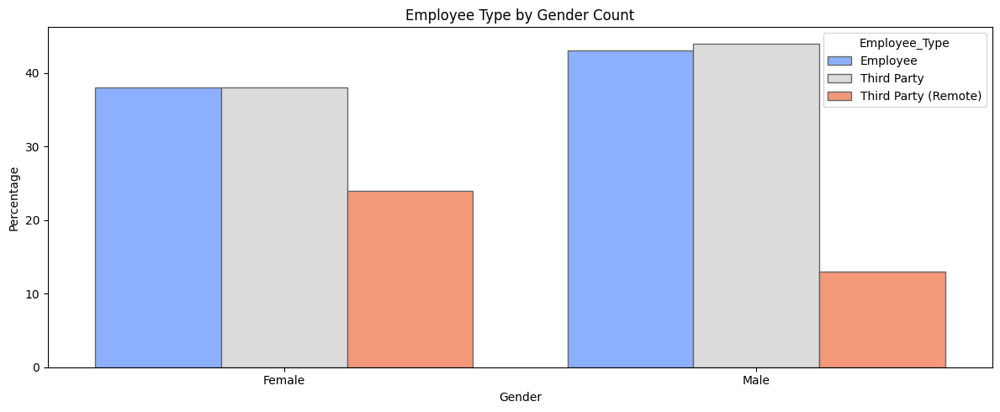

In [ ]:
# Correcting the barplot
plt.figure(figsize=(12, 5))
sns.barplot(
    x='Gender',
    y='value',
    hue='Employee_Type',
    data=df_gemp,
    palette='coolwarm',
    edgecolor='.4',
    saturation=1,
)

# Adding title and labels
plt.title('Employee Type by Gender Count')
plt.ylabel('Percentage')
plt.xlabel('Gender')

plt.tight_layout()  # Adjust layout for better readability
plt.show()

* Division of employee_type in men and women is almost same
* As seen in the above plots third party empoloyees are slightly higher than the employee count in both of the sectors(men&women)
* Proportion of female third party remote employee is moderately higher than that of the males

### Industry_Sector by Gender Count

In [ ]:
# Filtering the dataframe by Gender and Employee type and taking the count.
df_gis = pd.melt(df.groupby(['Gender','Industry_Sector'])['Industry_Sector'].count().unstack().apply(lambda x: round(x / x.sum()*100), axis=1).reset_index(),['Gender'])
df_gis

,Gender,Industry_Sector,value
0,Female,Metals,62.0
1,Male,Metals,31.0
2,Female,Mining,19.0
3,Male,Mining,58.0
4,Female,Others,19.0
5,Male,Others,11.0


- Females are more in Metals industry whereas Males are more in Mining and Others sector.

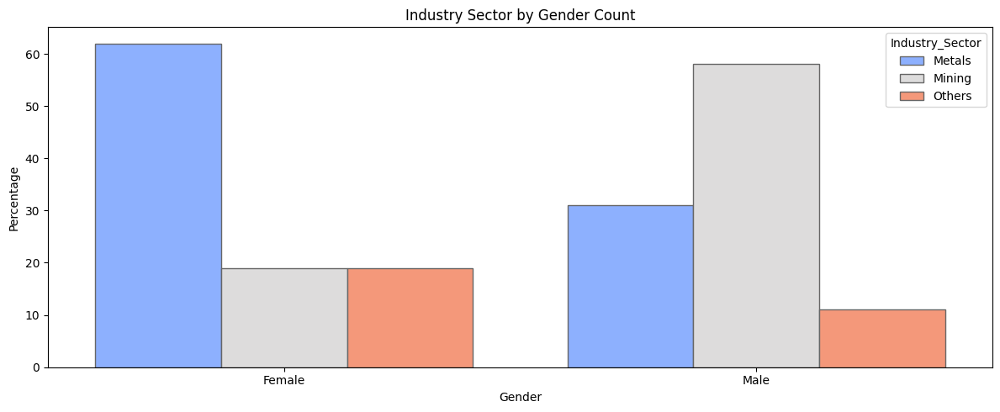

In [ ]:
# Correcting the barplot
plt.figure(figsize=(12, 5))
sns.barplot(
    x='Gender',
    y='value',
    hue='Industry_Sector',
    data=df_gis,
    palette='coolwarm',
    edgecolor='.4',
    saturation=1
)

# Adding title and labels
plt.title('Industry Sector by Gender Count')
plt.ylabel('Percentage')
plt.xlabel('Gender')

plt.tight_layout()  # Adjust layout for better readability
plt.show()

* There is a major diferrence in mining and metals industries within males and females
* We can observe the distinct safety levels by the industry sectors towards male and female

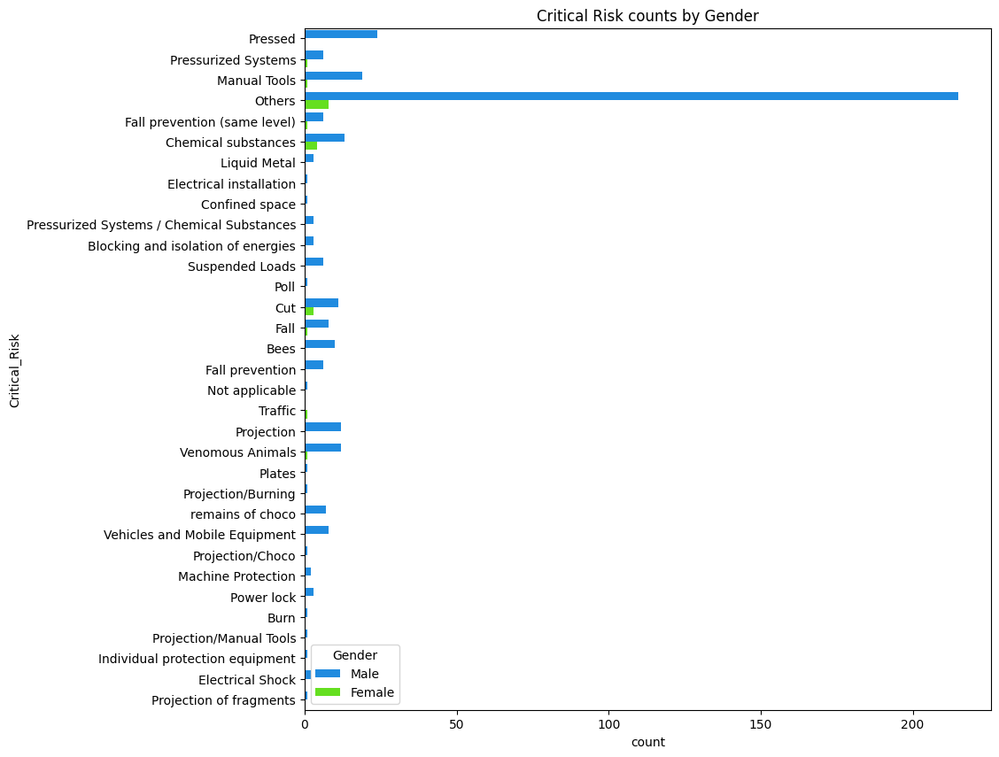

In [ ]:
plt.figure(figsize=(10,10))
sns.countplot(y = df['Critical_Risk'], hue=df['Gender'], palette='gist_rainbow_r')
plt.title('Critical Risk counts by Gender');

* There are some amount of females who involved in Critical Risks such as Chemical Substances, Cut, Fall other than Others category
* As dataset has more number of male data points, the plot bars tends to increase on the same class.

### Critical Risks Industry Sector

In [ ]:
# Count of Critical Risks grouped by Industry sectors
df.pivot_table(index='Critical_Risk', columns='Industry_Sector', aggfunc='count').fillna(0)['Accident_Level'].T

Critical_Risk,Bees,Blocking and isolation of energies,Burn,Chemical substances,Confined space,Cut,Electrical Shock,Electrical installation,Fall,Fall prevention,...,Projection,Projection of fragments,Projection/Burning,Projection/Choco,Projection/Manual Tools,Suspended Loads,Traffic,Vehicles and Mobile Equipment,Venomous Animals,remains of choco
Industry_Sector,,,,,,,,,,,,,,,,,,,,,
Metals,0.0,3.0,1.0,15.0,1.0,10.0,0.0,0.0,2.0,3.0,...,4.0,0.0,1.0,0.0,0.0,5.0,0.0,0.0,2.0,0.0
Mining,0.0,0.0,0.0,2.0,0.0,4.0,2.0,1.0,5.0,2.0,...,8.0,1.0,0.0,0.0,1.0,1.0,0.0,8.0,1.0,7.0
Others,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,10.0,0.0


In [ ]:
# df1 = df.copy()
# df1['Potential_Accident_Level'] = LabelEncoder().fit_transform(df1['Potential_Accident_Level']).astype(np.int8) # Just converting one of the column to numerical data type

# plt.figure(figsize=(12,10))
# sns.violinplot(x=df1["Potential_Accident_Level"], y=df1["Industry_Sector"], hue = df1['Employee_Type'] ,palette='coolwarm');
# plt.title("Presence of Male and Female employees in various location with respect to countries")
# plt.legend(loc='lower right')

* For metals industry, the distribution of potential accident level for third party employee is right skewed, that means most of the accidents have moderate risk.

* For on payroll employee, there is an equal distribution between low and moderate risk.
Same for Third party remote employees, but it is long tailed.

* For other industries, most of the third party employees are affected by very low risk which is a good sign.

* Similarly, for Direct employees the potential accident level is distributed well and the mode of the distribution is located at a low risk level (with a very extended inter quartile range).
* No data is available for Third party remote employees in Others sector.

### Some Analysis on Time Series

In [ ]:
df.head(5)

,Date,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description,Month,Day_of_Week,Year,Description_Length
0,2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,1,Friday,2016,457
1,2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,1,Saturday,2016,307
2,2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,1,Wednesday,2016,314
3,2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,1,Friday,2016,562
4,2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,1,Sunday,2016,487


* It has been noticed that there are multiple peaks of accidents every year. There is a high peak in February of 2017.


In [ ]:
df.set_index('Date', inplace=True)
dfcountry= df.Country.resample('24H').count()
dfcountry.head(20)

,Country
Date,
2016-01-01,1
2016-01-02,1
2016-01-03,0
2016-01-04,0
2016-01-05,0
2016-01-06,1
2016-01-07,0
2016-01-08,1
2016-01-09,0


Text(0.5, 1.0, 'Number of Accidents/Day (all countries)')

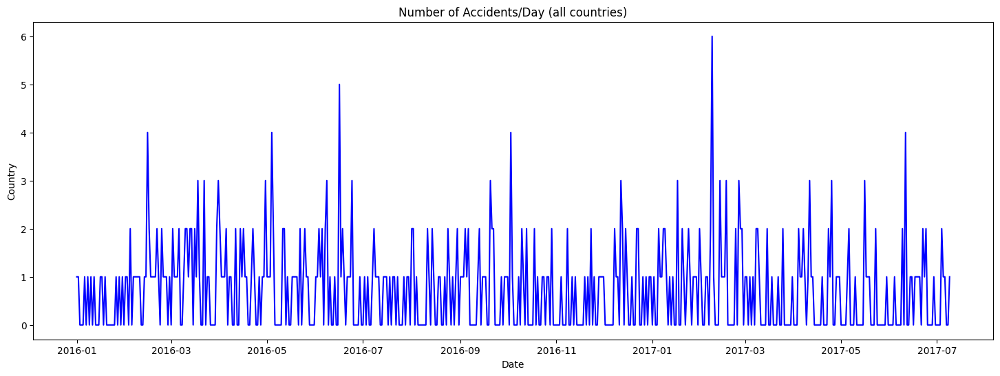

In [ ]:
plt.figure(figsize=(18, 6))  # Set figure size
sns.lineplot(x = dfcountry.index, y = dfcountry, color='blue')  # Plot the line graph
plt.title('Number of Accidents/Day (all countries)')  # Set the plot title


* It can be observed that more number of accidents occured in 2016 compared to 2017, in year 2016 we have all 12 months of data whereas year 2017 has only 7 months of data.
* It seems that the number of accidents decreased in latter of the year / month.
* The number of accidents increased during the middle of the week and declined since the middle of the week.

### Correlation

In [ ]:
df.head()

,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description,Month,Day_of_Week,Year,Description_Length
Date,,,,,,,,,,,,,
2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,1,Friday,2016,457
2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,1,Saturday,2016,307
2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,1,Wednesday,2016,314
2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,1,Friday,2016,562
2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,1,Sunday,2016,487


In [ ]:
df.shape

(411, 13)

In [ ]:
from sklearn.preprocessing import LabelEncoder
# Correlation
laben = LabelEncoder()
df_label = df.apply(laben.fit_transform)
print(df_label)

            Country  Location  Industry_Sector  Accident_Level  \
Date                                                             
2016-01-01        0         0                1               0   
2016-01-02        1         1                1               0   
2016-01-06        0         2                1               0   
2016-01-08        0         3                1               0   
2016-01-10        0         3                1               3   
...             ...       ...              ...             ...   
2017-07-04        0         2                1               0   
2017-07-04        0         3                1               0   
2017-07-05        1         8                0               0   
2017-07-06        1         4                0               0   
2017-07-09        0         3                1               0   

            Potential_Accident_Level  Gender  Employee_Type  Critical_Risk  \
Date                                                           

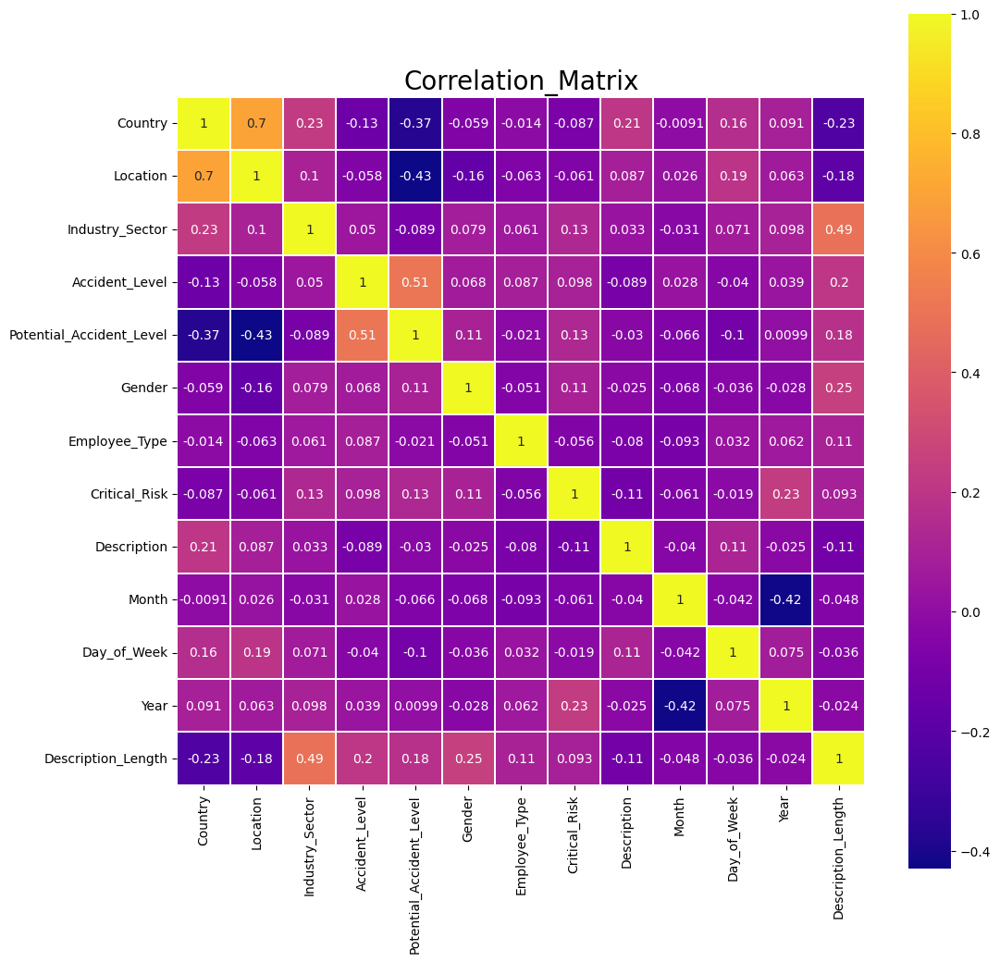

In [ ]:
plt.figure(figsize=(12,12))
plt.title('Correlation_Matrix', fontsize=20)
sns.heatmap(df_label.corr(), square=True, cmap='plasma', annot=True, linewidth=0.2);

In [ ]:
# Getting the value counts of each of the columns
accident = df['Accident_Level'].value_counts()
potential = df['Potential_Accident_Level'].value_counts()
merged_counts = pd.concat([accident, potential], axis=1, keys=['Accident_Level_Count', 'Potential_Level_Count'])
# Replace NaN with 0 and convert to integers
merged_counts.fillna(0, inplace=True)
merged_counts = merged_counts.astype(int)

print(merged_counts)


     Accident_Level_Count  Potential_Level_Count
I                     303                     43
II                     39                     95
III                    31                    106
IV                     30                    138
V                       8                     29


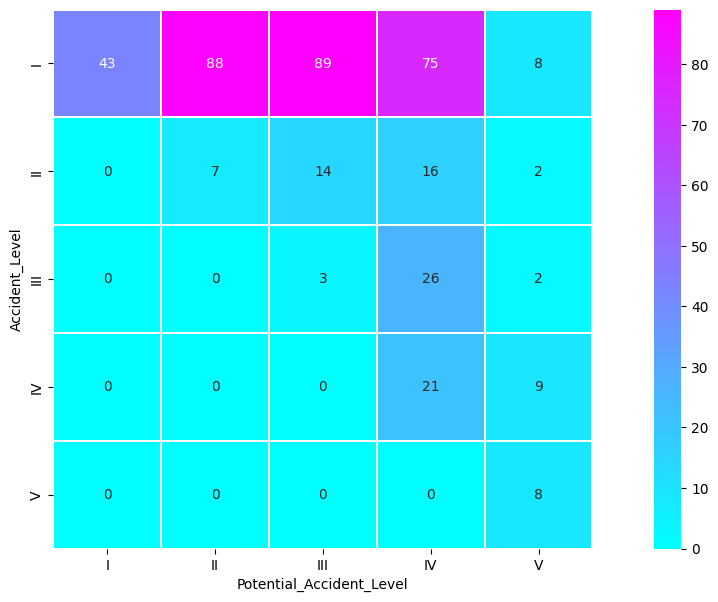

In [ ]:
# Count of Accidents grouped by Accident Level and Potential accident level
plt.figure(figsize = (16,7))
sns.heatmap(pd.crosstab(df.Accident_Level, df.Potential_Accident_Level), square=True, cmap='cool', annot=True, linewidth=0.1);

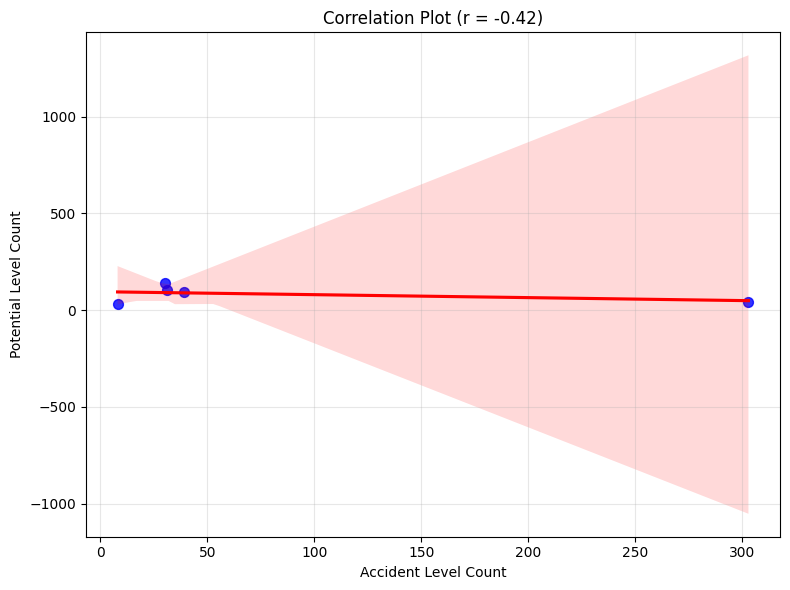

In [ ]:

# Calculate the correlation coefficient
correlation = merged_counts['Accident_Level_Count'].corr(merged_counts['Potential_Level_Count'])

# Scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.regplot(
    x='Accident_Level_Count',
    y='Potential_Level_Count',
    data=merged_counts,
    scatter_kws={'color': 'blue', 's': 50},
    line_kws={'color': 'red'},
)

# Adding correlation coefficient to the plot
plt.title(f'Correlation Plot (r = {correlation:.2f})')
plt.xlabel('Accident Level Count')
plt.ylabel('Potential Level Count')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


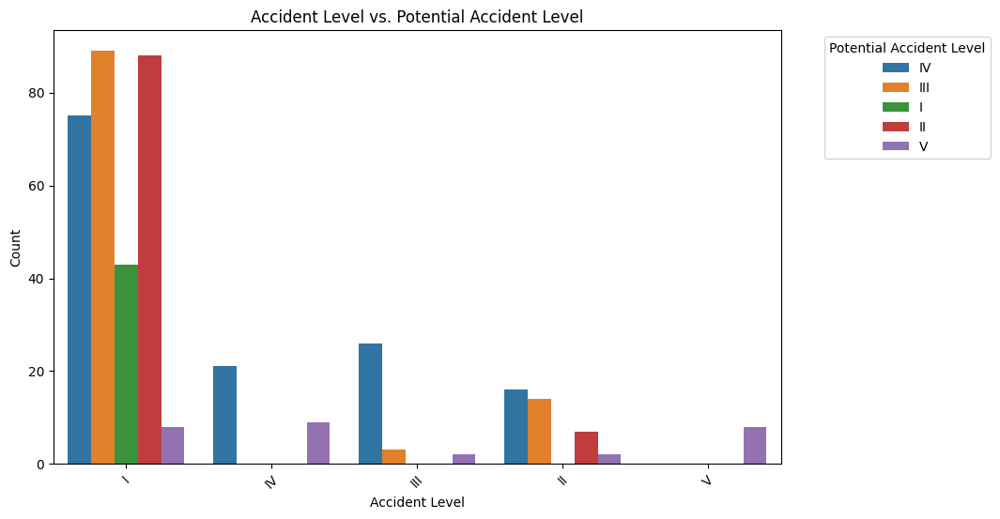

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Accident_Level', hue='Potential_Accident_Level', data=df)
plt.title('Accident Level vs. Potential Accident Level')
plt.xlabel('Accident Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Potential Accident Level', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

* Accident Level I has high count of Potential Risks Level as compared to accident level II, III, IV, V

Negative Correlation:

- As the values of Accident_Level_Count increase, the values of Potential_Level_Count tend to decrease, and vice versa.
This inverse relationship is not strong but is noticeable.

Strength of Correlation:

- The correlation of -0.42 lies in the moderate range, typically between -0.3 and -0.7.
It suggests a meaningful but not strong relationship; other factors likely influence the counts.

Practical Implications:

- There may be situations where a higher count of accidents correlates with a lower count of potential levels or vice versa, but this is not definitive or absolute.
- You might explore underlying factors, such as data quality, reporting biases, or independent variables affecting both metrics.

Limitations:

- Correlation does not imply causation. The negative relationship doesn't mean one directly causes the other to decrease.
Other variables might influence the observed relationship.

In [ ]:
#calculate co-occurrences and visualize them in heatmap for all columns

def analyze_categorical_features(df):
    """
    Calculates category frequencies and co-occurrences, visualizes them in a heatmap.
    """
    categorical_cols = ['Accident_Level', 'Potential_Accident_Level', 'Gender',
                      'Employee_Type', 'Critical_Risk', 'Industry_Sector','Country','Location']

    # Co-occurrence Heatmap (for pairs of categorical columns)
    for i in range(len(categorical_cols)):
        for j in range(i + 1, len(categorical_cols)):
            col1 = categorical_cols[i]
            col2 = categorical_cols[j]

            cross_tab = pd.crosstab(df[col1], df[col2], normalize='index') # Normalize for better visualization
            plt.figure(figsize=(10,8))
            sns.heatmap(cross_tab, annot=True, cmap="YlGnBu", fmt=".2f") #fmt=".2f" for percentage
            plt.title(f"Co-occurrence of {col1} and {col2}")
            plt.show()


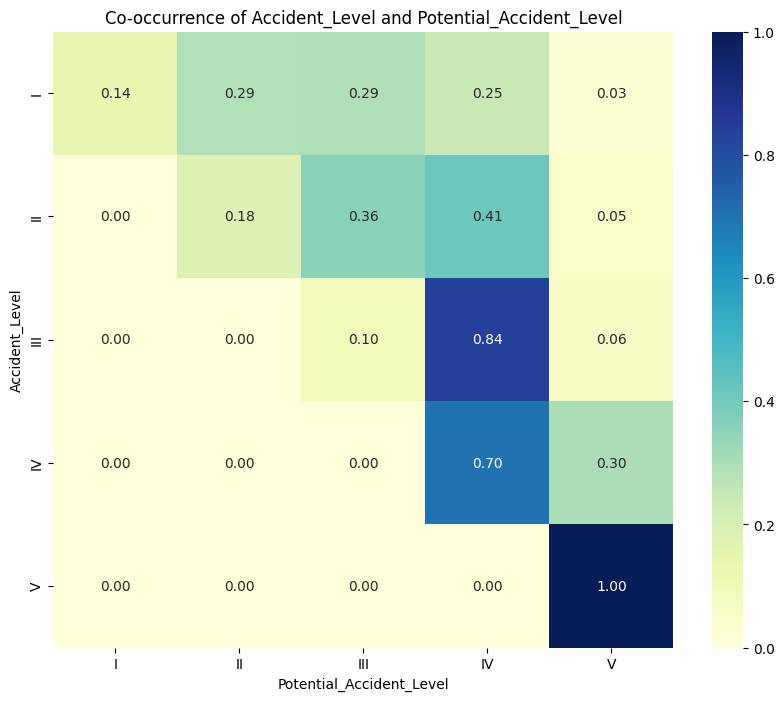

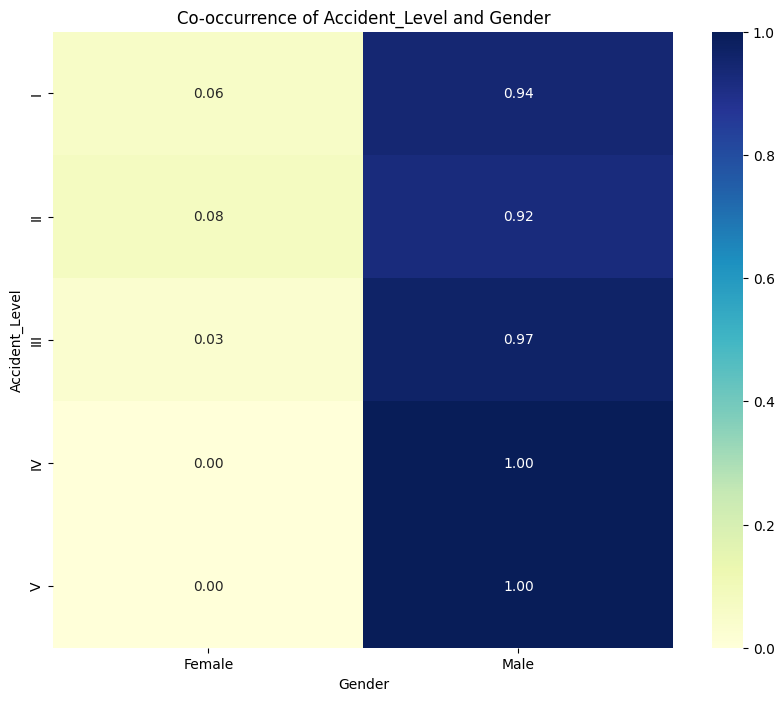

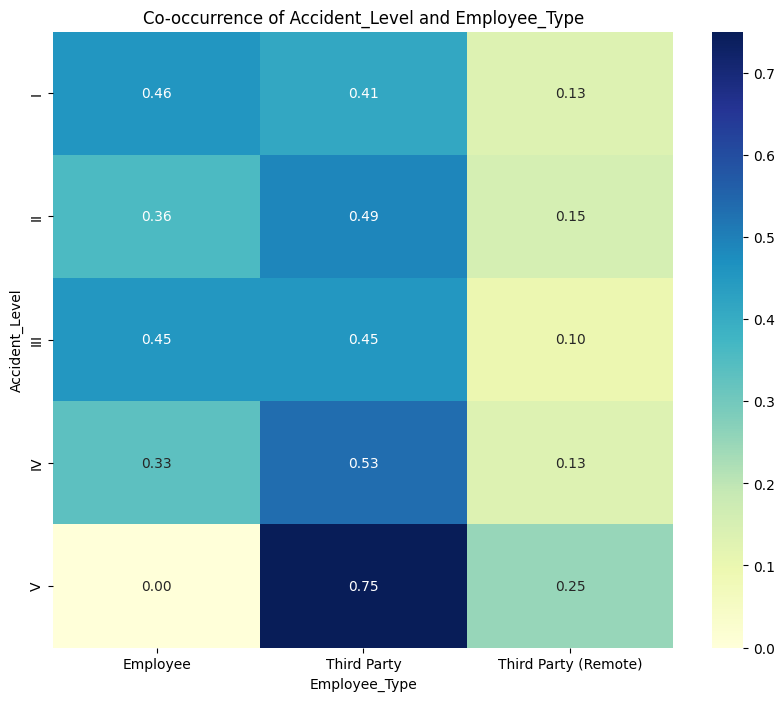

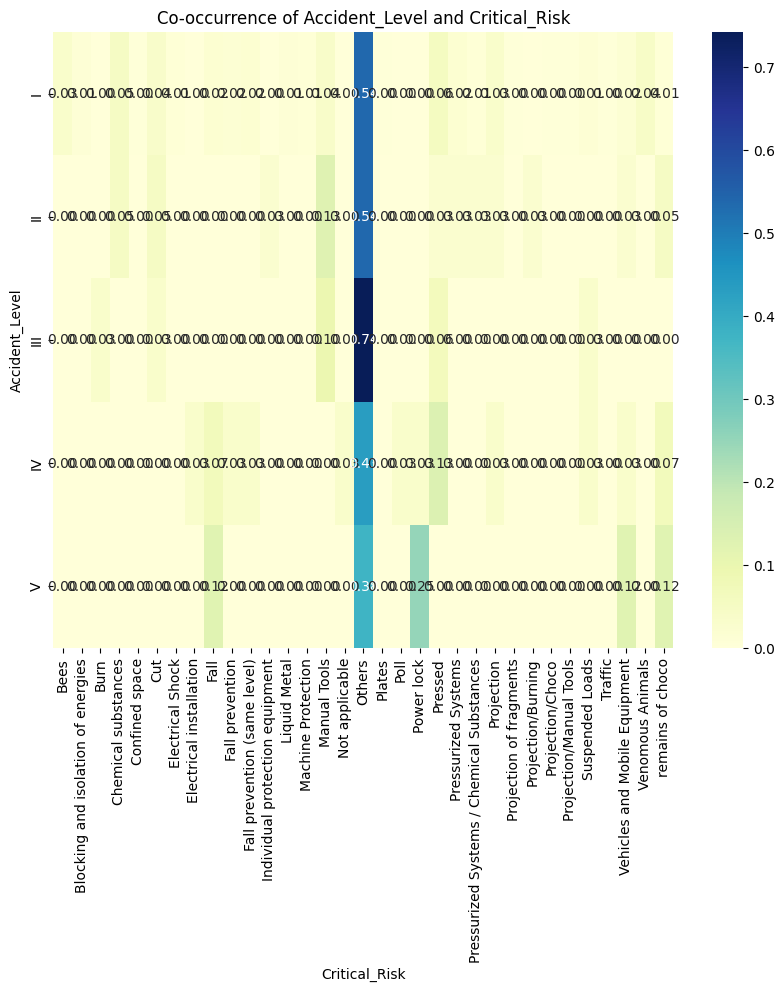

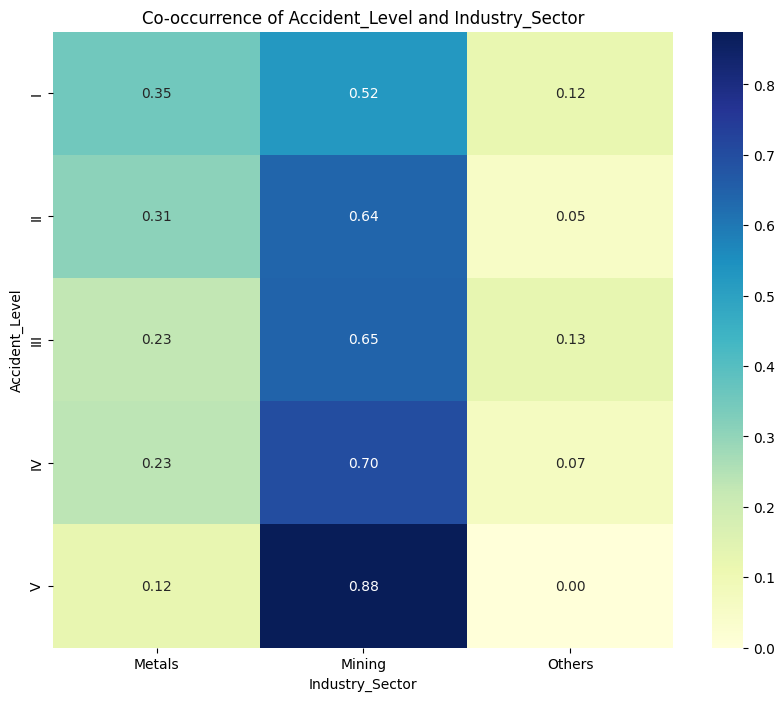

...

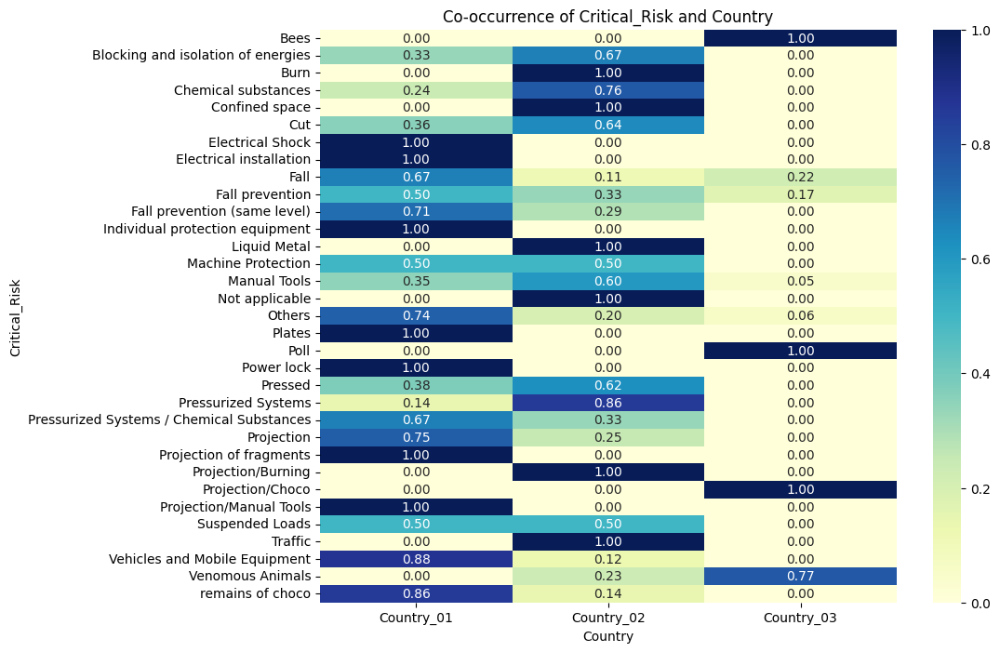

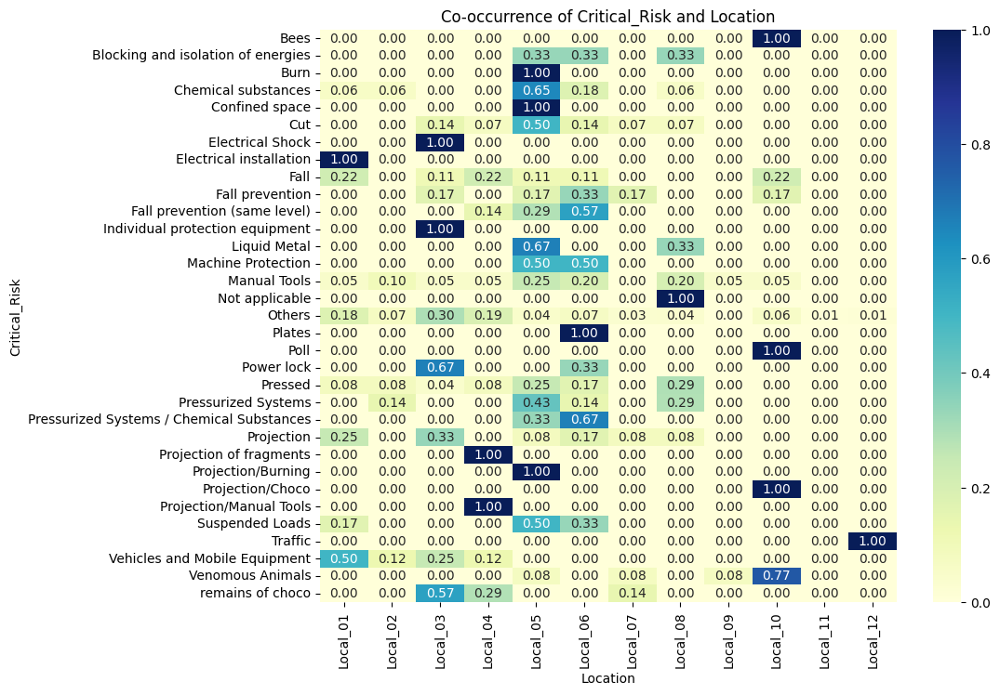

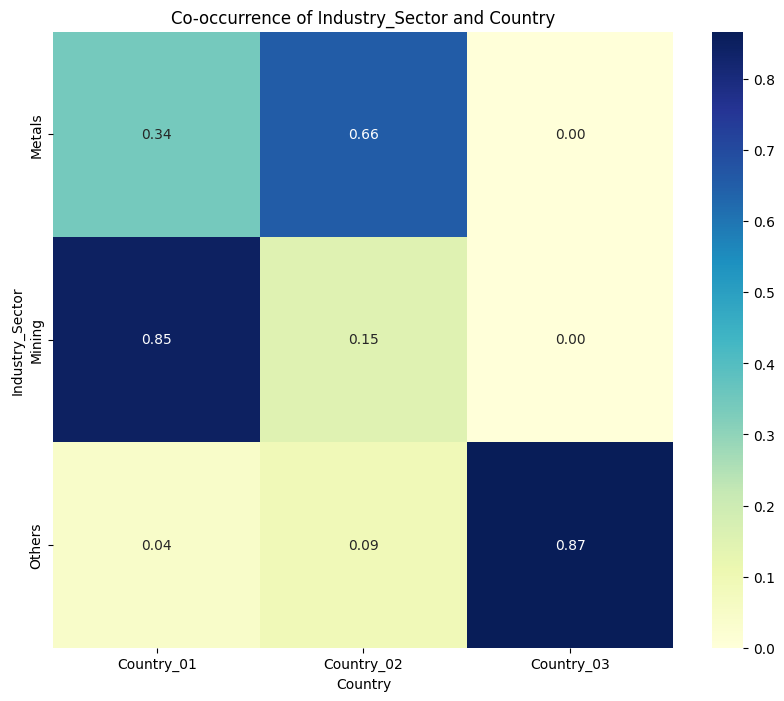

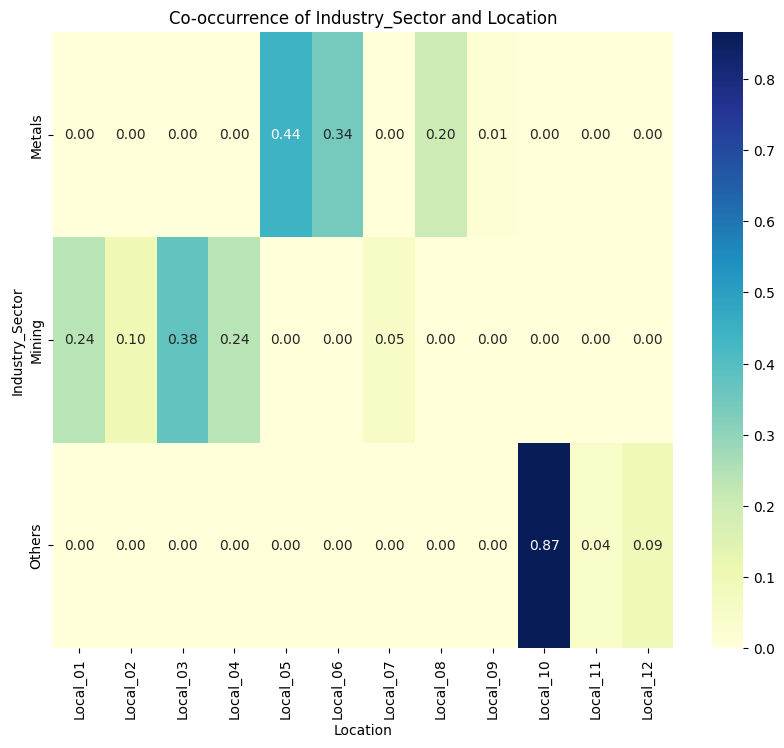

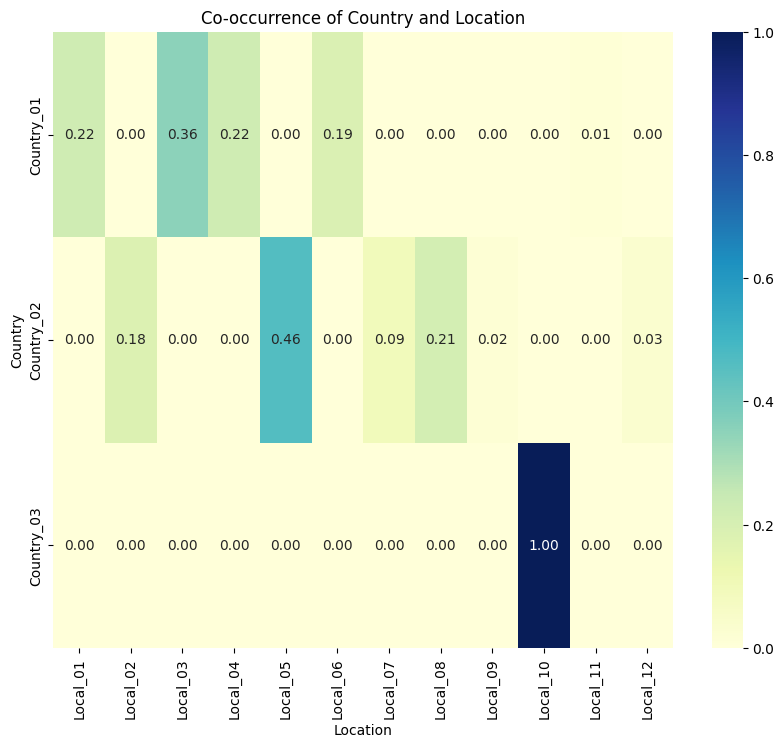

In [ ]:
analyze_categorical_features(df)

In [ ]:
# Calculate the correlation between Accident Level and Potential Accident Level

from scipy.stats import spearmanr

# Custom mapping for ordinal encoding
custom_mapping = {'I': 1, 'II': 2, 'III': 3, 'IV': 4, 'V': 5, 'VI': 6}

# Apply custom mapping to encode ordinal variables
df['Accident_Level_Encoded'] = df['Accident_Level'].map(custom_mapping)
df['Potential_Accident_Level_Encoded'] = df['Potential_Accident_Level'].map(custom_mapping)

# Calculate Spearman's rank correlation
correlation, p_value = spearmanr(df['Accident_Level_Encoded'], df['Potential_Accident_Level_Encoded'])

# Display results
print("Spearman Correlation:", correlation)
print("P-Value:", p_value)

# Display the encoded data
print(df)


Spearman Correlation: 0.5012678913790903
P-Value: 1.556750974659938e-27
               Country  Location Industry_Sector Accident_Level  \
Date                                                              
2016-01-01  Country_01  Local_01          Mining              I   
2016-01-02  Country_02  Local_02          Mining              I   
2016-01-06  Country_01  Local_03          Mining              I   
2016-01-08  Country_01  Local_04          Mining              I   
2016-01-10  Country_01  Local_04          Mining             IV   
...                ...       ...             ...            ...   
2017-07-04  Country_01  Local_03          Mining              I   
2017-07-04  Country_01  Local_04          Mining              I   
2017-07-05  Country_02  Local_09          Metals              I   
2017-07-06  Country_02  Local_05          Metals              I   
2017-07-09  Country_01  Local_04          Mining              I   

           Potential_Accident_Level  Gender         Empl

**Key Points:**

- This shows a moderate positive correlation between Accident Level and Potential Accident Level.

- While there is some relationship between the two variables, it is not strong enough to suggest they are entirely dependent on each other.

- P-Value: 3.03e-27

  The p-value is extremely small, indicating that the observed correlation is statistically significant.

  This means the relationship between the two variables is unlikely to have occurred by random chance.

In [ ]:
df.head(5)

,Country,Location,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Description,Month,Day_of_Week,Year,Description_Length,Accident_Level_Encoded,Potential_Accident_Level_Encoded
Date,,,,,,,,,,,,,,,
2016-01-01,Country_01,Local_01,Mining,I,IV,Male,Third Party,Pressed,While removing the drill rod of the Jumbo 08 f...,1,Friday,2016,457,1,4
2016-01-02,Country_02,Local_02,Mining,I,IV,Male,Employee,Pressurized Systems,During the activation of a sodium sulphide pum...,1,Saturday,2016,307,1,4
2016-01-06,Country_01,Local_03,Mining,I,III,Male,Third Party (Remote),Manual Tools,In the sub-station MILPO located at level +170...,1,Wednesday,2016,314,1,3
2016-01-08,Country_01,Local_04,Mining,I,I,Male,Third Party,Others,Being 9:45 am. approximately in the Nv. 1880 C...,1,Friday,2016,562,1,1
2016-01-10,Country_01,Local_04,Mining,IV,IV,Male,Third Party,Others,Approximately at 11:45 a.m. in circumstances t...,1,Sunday,2016,487,4,4


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 411 entries, 2016-01-01 to 2017-07-09
Data columns (total 15 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   Country                           411 non-null    object
 1   Location                          411 non-null    object
 2   Industry_Sector                   411 non-null    object
 3   Accident_Level                    411 non-null    object
 4   Potential_Accident_Level          411 non-null    object
 5   Gender                            411 non-null    object
 6   Employee_Type                     411 non-null    object
 7   Critical_Risk                     411 non-null    object
 8   Description                       411 non-null    object
 9   Month                             411 non-null    int32 
 10  Day_of_Week                       411 non-null    object
 11  Year                              411 non-null    int32 
 12  Des

In [ ]:
# Removing the columns which are not required for modelling
df = df.reset_index()
df.drop(columns=['Month','Day_of_Week', 'Year','Description_Length','Accident_Level_Encoded','Potential_Accident_Level_Encoded'], inplace= True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 411 entries, 0 to 410
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Date                      411 non-null    datetime64[ns]
 1   Country                   411 non-null    object        
 2   Location                  411 non-null    object        
 3   Industry_Sector           411 non-null    object        
 4   Accident_Level            411 non-null    object        
 5   Potential_Accident_Level  411 non-null    object        
 6   Gender                    411 non-null    object        
 7   Employee_Type             411 non-null    object        
 8   Critical_Risk             411 non-null    object        
 9   Description               411 non-null    object        
dtypes: datetime64[ns](1), object(9)
memory usage: 32.2+ KB


In [ ]:
# Removing the columns which are not required for modelling
df = df.reset_index()
df.drop(columns=['Date'], inplace= True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 411 entries, 0 to 410
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   index                     411 non-null    int64 
 1   Country                   411 non-null    object
 2   Location                  411 non-null    object
 3   Industry_Sector           411 non-null    object
 4   Accident_Level            411 non-null    object
 5   Potential_Accident_Level  411 non-null    object
 6   Gender                    411 non-null    object
 7   Employee_Type             411 non-null    object
 8   Critical_Risk             411 non-null    object
 9   Description               411 non-null    object
dtypes: int64(1), object(9)
memory usage: 32.2+ KB


In [ ]:
df.shape

(411, 10)

In [ ]:
df.to_csv('/content/drive/MyDrive/NLP1-G4/refined/datacleansed.csv', index=False)

In [ ]:
# Load the refined CSV file after EDA
df = pd.read_csv("/content/drive/MyDrive/NLP1-G4/refined/datacleansed.csv")

----------------------------------------------------------------------------------------------------------------------------------------------------------------

#  **MILESTONE 1**

In [ ]:
pip install googletrans==4.0.0-rc1

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.9 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17397 sha256=95aa69beeac45ee8688c0aa1cc7a9f0ca86779fc31fd63e9175bb3f75235368a
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: h11
    Found existing installation: h11 0.14.0
    Uninstalling h11-0.14.0:
      Succ

In [ ]:
pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=b3189ba6c50471242a79dabaa4f1ee62d78257c5524046ff5ca7ac9b5e4c3cec
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


## Installing and Importing Necessary Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Importing library for data manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import random


# to use regular expressions for manipulating text data
import re

# to load the natural language toolkit
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')    # loading the stopwords
nltk.download('wordnet')    # loading the wordnet module that is used in stemming


from nltk.stem import WordNetLemmatizer

# to remove common stop words
from nltk.corpus import stopwords
from nltk.corpus import wordnet

# to perform stemming
from nltk.stem.porter import PorterStemmer

from nltk.tokenize import word_tokenize
from tqdm import tqdm
stop_words = stopwords.words('english')
from sklearn.feature_extraction.text import TfidfVectorizer

# To encode the target variable
from sklearn.preprocessing import LabelEncoder

# To import Word2Vec
from gensim.models import Word2Vec

# To tune the model
from sklearn.model_selection import GridSearchCV

# Converting the Stanford GloVe model vector format to word2vec
from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.models import KeyedVectors

# To split data into train and test sets
from sklearn.model_selection import train_test_split

# To build a Random Forest model
from sklearn.ensemble import RandomForestClassifier

# To compute metrics to evaluate the model
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, classification_report

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
dataset_cleaned = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/datacleansed.csv')

In [ ]:
dataset_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 411 entries, 0 to 410
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   index                     411 non-null    int64 
 1   Country                   411 non-null    object
 2   Location                  411 non-null    object
 3   Industry_Sector           411 non-null    object
 4   Accident_Level            411 non-null    object
 5   Potential_Accident_Level  411 non-null    object
 6   Gender                    411 non-null    object
 7   Employee_Type             411 non-null    object
 8   Critical_Risk             411 non-null    object
 9   Description               411 non-null    object
dtypes: int64(1), object(9)
memory usage: 32.2+ KB


##Data Cleansing - Description

In [ ]:
import re

# Check for missing values in the Description column
missing_values = dataset_cleaned['Description'].isnull().sum()

# Drop rows with missing values in the Description column
dataset_cleaned = dataset_cleaned.dropna(subset=['Description'])

# Clean the text in the Description column
def clean_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\s+', ' ', text)  # Remove extra whitespace
    text = re.sub(r'[^A-Za-z0-9]+', ' ', text) # Remove special characters
    return text.strip()  # Strip leading/trailing whitespace

dataset_cleaned['Cleaned_Description'] = dataset_cleaned['Description'].apply(clean_text)

# Display a few cleaned descriptions to verify
dataset_cleaned[['Description', 'Cleaned_Description']].head()


,Description,Cleaned_Description
0,While removing the drill rod of the Jumbo 08 f...,while removing the drill rod of the jumbo for ...
1,During the activation of a sodium sulphide pum...,during the activation of a sodium sulphide pum...
2,In the sub-station MILPO located at level +170...,in the substation milpo located at level when ...
3,Being 9:45 am. approximately in the Nv. 1880 C...,being am approximately in the nv cx ob the per...
4,Approximately at 11:45 a.m. in circumstances t...,approximately at am in circumstances that the ...


In [ ]:
# Spelling correction
from textblob import TextBlob

# Function to correct spelling errors
def correct_spelling(text):
    return str(TextBlob(text).correct())

# Apply spelling correction
dataset_cleaned['Cleaned_Description'] = dataset_cleaned['Cleaned_Description'].apply(correct_spelling)

# Display some corrected descriptions
dataset_cleaned[['Cleaned_Description']].head()

,Cleaned_Description
0,while removing the drill rod of the lumbo for ...
1,during the motivation of a sodium sulphide pum...
2,in the substation miles located at level when ...
3,being am approximately in the no c of the pers...
4,approximately at am in circumstances that the ...


In [ ]:
# Initialize stopwords and lemmatizer
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Function to preprocess text: tokenization, stopword removal, and lemmatization
def preprocess_text(text):
    tokens = word_tokenize(text)  # Tokenize
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]  # Remove stopwords & lemmatize
    return ' '.join(tokens)  # Rejoin tokens into a single string

# Apply preprocessing to the Cleaned_Description column
dataset_cleaned['Preprocessed_Description'] = dataset_cleaned['Cleaned_Description'].apply(preprocess_text)

# Display a few preprocessed descriptions to verify
dataset_cleaned[['Cleaned_Description', 'Preprocessed_Description']].head()


,Cleaned_Description,Preprocessed_Description
0,while removing the drill rod of the lumbo for ...,removing drill rod lumbo maintenance superviso...
1,during the motivation of a sodium sulphide pum...,motivation sodium sulphide pump piping coupled...
2,in the substation miles located at level when ...,substation mile located level collaboration ex...
3,being am approximately in the no c of the pers...,approximately c personnel begin task unlocking...
4,approximately at am in circumstances that the ...,approximately circumstance mechanic anthony gr...


**Language Detection and Translation**

In [ ]:
from langdetect import detect
from googletrans import Translator

translator = Translator()

# Function to detect language
def detect_language(text):
    try:
        return detect(text)
    except:
        return "unknown"

# Function to translate non-English text to English
def translate_to_english(text):
    try:
        lang = detect_language(text)
        if lang != 'en':
            return translator.translate(text, src=lang, dest='en').text
        return text
    except:
        return text

# Apply language detection and translation
dataset_cleaned['Language'] = dataset_cleaned['Preprocessed_Description'].apply(detect_language)
dataset_cleaned['Translated_Description'] = dataset_cleaned['Preprocessed_Description'].apply(translate_to_english)

# Display a sample
dataset_cleaned[['Preprocessed_Description', 'Language', 'Translated_Description']].head()


,Preprocessed_Description,Language,Translated_Description
0,removing drill rod lumbo maintenance superviso...,en,removing drill rod lumbo maintenance superviso...
1,motivation sodium sulphide pump piping coupled...,en,motivation sodium sulphide pump piping coupled...
2,substation mile located level collaboration ex...,en,substation mile located level collaboration ex...
3,approximately c personnel begin task unlocking...,en,approximately c personnel begin task unlocking...
4,approximately circumstance mechanic anthony gr...,en,approximately circumstance mechanic anthony gr...


In [ ]:
dataset_final_description = dataset_cleaned.drop(columns=['Country', 'Location', 'Description', 'Cleaned_Description', 'Preprocessed_Description', 'index', 'Language'])

In [ ]:
dataset_final_description

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description
0,Mining,I,IV,Male,Third Party,Pressed,removing drill rod lumbo maintenance superviso...
1,Mining,I,IV,Male,Employee,Pressurized Systems,motivation sodium sulphide pump piping coupled...
2,Mining,I,III,Male,Third Party (Remote),Manual Tools,substation mile located level collaboration ex...
3,Mining,I,I,Male,Third Party,Others,approximately c personnel begin task unlocking...
4,Mining,IV,IV,Male,Third Party,Others,approximately circumstance mechanic anthony gr...
...,...,...,...,...,...,...,...
406,Mining,I,II,Female,Employee,Others,collaboration moved infrastructure office juli...
407,Mining,I,III,Male,Third Party,Others,approximately approximately lifting belly towa...
408,Metals,I,II,Male,Employee,Venomous Animals,environmental monitoring activity area employe...
409,Metals,I,II,Male,Employee,Cut,employee performed activity stripping cathode ...


In [ ]:
# Calculate the correlation between Accident Level and Potential Accident Level

from scipy.stats import spearmanr

# Custom mapping for ordinal encoding
custom_mapping = {'I': 1, 'II': 2, 'III': 3, 'IV': 4, 'V': 5, 'VI': 6}

# Apply custom mapping to encode ordinal variables
dataset_final_description['Accident_Level_Encoded'] = dataset_final_description['Accident_Level'].map(custom_mapping)
dataset_final_description['Potential_Accident_Level_Encoded'] = dataset_final_description['Potential_Accident_Level'].map(custom_mapping)

# Calculate Spearman's rank correlation
correlation, p_value = spearmanr(dataset_final_description['Accident_Level_Encoded'], dataset_final_description['Potential_Accident_Level_Encoded'])

# Display results
print("Spearman Correlation:", correlation)
print("P-Value:", p_value)

# Display the encoded data
dataset_final_description.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/dataset_final_description.csv', index=False)

Spearman Correlation: 0.5012678913790903
P-Value: 1.556750974659938e-27


In [ ]:
dataset_final_description

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Accident_Level_Encoded,Potential_Accident_Level_Encoded
0,Mining,I,IV,Male,Third Party,Pressed,removing drill rod lumbo maintenance superviso...,1,4
1,Mining,I,IV,Male,Employee,Pressurized Systems,motivation sodium sulphide pump piping coupled...,1,4
2,Mining,I,III,Male,Third Party (Remote),Manual Tools,substation mile located level collaboration ex...,1,3
3,Mining,I,I,Male,Third Party,Others,approximately c personnel begin task unlocking...,1,1
4,Mining,IV,IV,Male,Third Party,Others,approximately circumstance mechanic anthony gr...,4,4
...,...,...,...,...,...,...,...,...,...
406,Mining,I,II,Female,Employee,Others,collaboration moved infrastructure office juli...,1,2
407,Mining,I,III,Male,Third Party,Others,approximately approximately lifting belly towa...,1,3
408,Metals,I,II,Male,Employee,Venomous Animals,environmental monitoring activity area employe...,1,2
409,Metals,I,II,Male,Employee,Cut,employee performed activity stripping cathode ...,1,2


## Original cleaned data

In [ ]:
dataset_cleaned_original = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/dataset_final_description.csv')

In [ ]:
dataset_cleaned_original.columns

Index(['Industry_Sector', 'Accident_Level', 'Potential_Accident_Level',
       'Gender', 'Employee_Type', 'Critical_Risk', 'Translated_Description',
       'Accident_Level_Encoded', 'Potential_Accident_Level_Encoded'],
      dtype='object')

In [ ]:
dataset_cleaned_original.drop(columns=['Accident_Level', "Potential_Accident_Level"], inplace=True)

In [ ]:
dataset_cleaned_original.columns

Index(['Industry_Sector', 'Gender', 'Employee_Type', 'Critical_Risk',
       'Translated_Description', 'Accident_Level_Encoded',
       'Potential_Accident_Level_Encoded'],
      dtype='object')

In [ ]:
dataset_cleaned_original['Accident_Level_Encoded'].value_counts()

,count
Accident_Level_Encoded,
1,303
2,39
3,31
4,30
5,8


In [ ]:
dataset_cleaned_original['Potential_Accident_Level_Encoded'].value_counts()

,count
Potential_Accident_Level_Encoded,
4,138
3,106
2,95
1,43
5,29


# METHOD 1: Target variable - Accident Level, Data Augumentation - Synonymn, Synthetic data

## Test - Train split

In [ ]:
# Define target and features
X = dataset_cleaned_original.drop(['Accident_Level_Encoded'], axis=1)
y = dataset_cleaned_original['Accident_Level_Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(287, 62, 62)

In [ ]:
train_dataset = pd.concat([X_train, y_train], axis=1).reset_index(drop=True)
val_dataset = pd.concat([X_val, y_val], axis=1).reset_index(drop=True)
test_dataset = pd.concat([X_test, y_test], axis=1).reset_index(drop=True)

In [ ]:
train_dataset.head()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Potential_Accident_Level_Encoded,Accident_Level_Encoded
0,Mining,V,V,Male,Third Party,Others,access level installation activity hydraulic f...,5,5
1,Mining,I,II,Male,Third Party,Others,workshop level box two mechanic manipulated st...,2,1
2,Mining,II,IV,Male,Third Party,Cut,hour approximately circumstance administrative...,4,2
3,Mining,III,IV,Male,Third Party,Manual Tools,circumstance staff performing shying pipe susp...,4,3
4,Metals,I,III,Male,Employee,Blocking and isolation of energies,maintenance limb pump projection delicate pulp...,3,1


In [ ]:
train_dataset.shape

(287, 9)

## Functions for Data augmentation and synthetic data generation

#### Augument accident level

In [ ]:
def accident_level_augumentation(row):
  levels = [1, 2, 3, 4, 5]
  curent_accident_level_idx = levels.index(row['Accident_Level_Encoded'])
  len_accident_levels = len(levels)
  # probabilties for each level
  prob = np.zeros(len_accident_levels)
  for i in range(len_accident_levels):
    dis = abs(i - curent_accident_level_idx)
    prob[i] = max(1/(1+dis), 0.05)
  prob /=prob.sum()
  new_accident_level = np.random.choice(levels,p=prob)
  return new_accident_level

#### Augument potential accident level

In [ ]:
def potential_accident_level_augumentation(accident_level):
  levels = [1, 2, 3, 4, 5]
  curent_potential_accident_level_idx = levels.index(accident_level)
  potential_idx = np.random.randint(curent_potential_accident_level_idx, len(levels))
  return levels[potential_idx]

#### Augument translated description

In [ ]:
def description_augumentation(description):
  words = description.split()
  words_augumented = []
  for word in words:
    word_synonyms = wordnet.synsets(word)
    if word_synonyms and random.random() < 0.2:
      word_synonym = word_synonyms[0].lemmas()[0].name().replace('_', ' ')
      words_augumented.append(word_synonym)
    else:
      words_augumented.append(word)
  return ' '.join(words_augumented)

#### Synthetic row generate function

In [ ]:
def synthetic_row_generate(row):
  extra_row = row.copy()
  extra_row['Accident_Level_Encoded'] = accident_level_augumentation(row)
  extra_row['Potential_Accident_Level_Encoded'] = potential_accident_level_augumentation(extra_row['Accident_Level_Encoded'])
  extra_row['Translated_Description'] = description_augumentation(row['Translated_Description'])
  return extra_row

## Apply augumentation and generate synthetic data for train


In [ ]:
train_dataset['Augmented_Accident_Level'] = train_dataset.apply(accident_level_augumentation, axis=1)
train_dataset['Augmented_Potential_Accident_Level'] = train_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
train_dataset['Augmented_Description'] = train_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_train = pd.DataFrame([synthetic_row_generate(row) for _, row in train_dataset.iterrows()])

In [ ]:
train_dataset_final = pd.concat([train_dataset, synthetic_data_train], ignore_index=True)
print(train_dataset_final.duplicated().sum())
train_dataset_final.drop_duplicates(inplace=True)
# Calculate the correlation between Accident Level and Potential Accident Level for training set

from scipy.stats import spearmanr

# Calculate Spearman's rank correlation
correlation, p_value = spearmanr(train_dataset_final['Augmented_Accident_Level'], train_dataset_final['Augmented_Potential_Accident_Level'])

# Display results
print("Spearman Correlation:", correlation)
print("P-Value:", p_value)

train_dataset_final.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final.csv', index=False)

11
Spearman Correlation: 0.5248965665970912
P-Value: 3.492977819892134e-41


In [ ]:
train_dataset_final.shape

(563, 12)

In [ ]:
train_dataset_final.tail()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Potential_Accident_Level_Encoded,Accident_Level_Encoded,Augmented_Accident_Level,Augmented_Potential_Accident_Level,Augmented_Description
569,Mining,I,IV,Male,Third Party,Others,try release pipe hip pipe long diameter lodge ...,5,4,1,4,try release pipe hip pipe long diameter stuck ...
570,Mining,IV,IV,Male,Employee,Pressed,performing cleaning material mineral roll up s...,4,3,3,5,performing cleaning material mineral accumulat...
571,Others,I,I,Male,Third Party,Fall,collaboration around cleaning leaf return well...,3,1,1,1,collaboration about cleaning leaf return well ...
572,Mining,II,III,Male,Third Party,Others,time worker cleaning long hole production mesh...,4,3,2,5,time worker cleaning long hole production mesh...
573,Mining,IV,V,Male,Third Party,Others,hour Mister hidalgo desire climb started board...,3,3,5,5,hour mr hidalgo wanting ascent started board r...


## Apply augumentation and generate synthetic data for validation

In [ ]:
val_dataset['Augmented_Accident_Level'] = val_dataset.apply(accident_level_augumentation, axis=1)
val_dataset['Augmented_Potential_Accident_Level'] = val_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
val_dataset['Augmented_Description'] = val_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_val = pd.DataFrame([synthetic_row_generate(row) for _, row in val_dataset.iterrows()])

val_dataset_final = pd.concat([val_dataset, synthetic_data_val], ignore_index=True)
print(val_dataset_final.duplicated().sum())
val_dataset_final.drop_duplicates(inplace=True)

4


In [ ]:
print(train_dataset_final['Accident_Level_Encoded'].value_counts())
print(train_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(train_dataset_final['Augmented_Accident_Level'].value_counts())
print(train_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    312
2     85
3     79
4     59
5     28
Name: count, dtype: int64
Potential_Accident_Level_Encoded
4    187
3    125
5    109
2     84
1     58
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    225
3    108
2    107
5     67
4     56
Name: count, dtype: int64
Augmented_Potential_Accident_Level
5    194
4    148
3    101
2     74
1     46
Name: count, dtype: int64


In [ ]:
print(val_dataset_final['Accident_Level_Encoded'].value_counts())
print(val_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(val_dataset_final['Augmented_Accident_Level'].value_counts())
print(val_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    68
2    22
4    13
3    10
5     7
Name: count, dtype: int64
Potential_Accident_Level_Encoded
5    33
4    29
2    26
3    22
1    10
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    61
2    25
4    16
5    10
3     8
Name: count, dtype: int64
Augmented_Potential_Accident_Level
4    34
5    31
3    26
2    22
1     7
Name: count, dtype: int64


## SENTENCE TRANSFORMER

In [ ]:
train_dataset_final = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final.csv')

In [ ]:
dataset_1 = train_dataset_final[['Industry_Sector','Augmented_Potential_Accident_Level']]
dataset_1 = pd.get_dummies(dataset_1, columns=['Industry_Sector'], drop_first=True)
print(dataset_1.head())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(train_dataset_final['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_train = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_train = pd.concat([dataset_1.reset_index(drop=True), embedding_df_train], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_train.head())


   Augmented_Potential_Accident_Level  Industry_Sector_Mining  \
0                                   5                    True   
1                                   5                    True   
2                                   2                    True   
3                                   4                    True   
4                                   5                   False   

   Industry_Sector_Others  
0                   False  
1                   False  
2                   False  
3                   False  
4                   False  


Batches:   0%|          | 0/18 [00:00<?, ?it/s]

Embedding Shape: (563, 384)
   Augmented_Potential_Accident_Level  Industry_Sector_Mining  \
0                                   5                    True   
1                                   5                    True   
2                                   2                    True   
3                                   4                    True   
4                                   5                   False   

   Industry_Sector_Others  Embedding_0  Embedding_1  Embedding_2  Embedding_3  \
0                   False     0.052666    -0.032891     0.108780    -0.083524   
1                   False    -0.021216     0.092960    -0.010667    -0.024074   
2                   False    -0.006359     0.009810    -0.006805     0.027262   
3                   False    -0.018338    -0.018676     0.068866    -0.001484   
4                   False    -0.033219     0.008573     0.018551    -0.038607   

   Embedding_4  Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  \
0    -0.034587 

In [ ]:
dataset_2 = val_dataset_final[['Industry_Sector','Augmented_Potential_Accident_Level']]
dataset_2 = pd.get_dummies(dataset_2, columns=['Industry_Sector'], drop_first=True)
print(dataset_2.head())
for col in dataset_2.columns:
    print(dataset_2[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(val_dataset_final['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_val = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_val = pd.concat([dataset_2.reset_index(drop=True), embedding_df_val], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_val.head())

   Augmented_Potential_Accident_Level  Industry_Sector_Mining  \
0                                   3                    True   
1                                   4                    True   
2                                   1                    True   
3                                   3                   False   
4                                   4                    True   

   Industry_Sector_Others  
0                   False  
1                   False  
2                   False  
3                   False  
4                   False  
[3 4 1 2 5]
[ True False]
[False  True]


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

Embedding Shape: (120, 384)
   Augmented_Potential_Accident_Level  Industry_Sector_Mining  \
0                                   3                    True   
1                                   4                    True   
2                                   1                    True   
3                                   3                   False   
4                                   4                    True   

   Industry_Sector_Others  Embedding_0  Embedding_1  Embedding_2  Embedding_3  \
0                   False     0.005285     0.044831     0.067653     0.019664   
1                   False     0.018015     0.081399     0.017703     0.036537   
2                   False    -0.033552     0.058740     0.078643     0.014577   
3                   False    -0.031399     0.034737     0.081042     0.017565   
4                   False     0.005135     0.065221     0.028209     0.003607   

   Embedding_4  Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  \
0    -0.008174 

In [ ]:
dataset_3 = test_dataset[['Industry_Sector','Potential_Accident_Level_Encoded']]
dataset_3 = pd.get_dummies(dataset_3, columns=['Industry_Sector'], drop_first=True)
print(dataset_3.head())
for col in dataset_3.columns:
    print(dataset_3[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(test_dataset['Translated_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_test = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_test = pd.concat([dataset_3.reset_index(drop=True), embedding_df_test], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_test.head())

   Potential_Accident_Level_Encoded  Industry_Sector_Mining  \
0                                 4                    True   
1                                 1                   False   
2                                 4                    True   
3                                 3                    True   
4                                 3                   False   

   Industry_Sector_Others  
0                   False  
1                    True  
2                   False  
3                   False  
4                   False  
[4 1 3 2 5]
[ True False]
[False  True]


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

Embedding Shape: (62, 384)
   Potential_Accident_Level_Encoded  Industry_Sector_Mining  \
0                                 4                    True   
1                                 1                   False   
2                                 4                    True   
3                                 3                    True   
4                                 3                   False   

   Industry_Sector_Others  Embedding_0  Embedding_1  Embedding_2  Embedding_3  \
0                   False    -0.051631     0.021920     0.081229    -0.046431   
1                    True     0.046517     0.026625     0.075522    -0.010039   
2                   False     0.056762    -0.001340    -0.048388    -0.010658   
3                   False    -0.003720     0.000538     0.077260    -0.061005   
4                   False     0.001111     0.029289     0.096333    -0.000225   

   Embedding_4  Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  \
0    -0.045926    -0.003603 

In [ ]:
X_train = dataset_with_embeddings_train.rename(columns={'Augmented_Potential_Accident_Level':'Final_Potential_Accident_Level'})
y_train = train_dataset_final['Augmented_Accident_Level'].rename('Final_Accident_Level')
print(X_train.columns)
print("*"*100)
print(y_train)
print("%"*100)
X_val = dataset_with_embeddings_val.rename(columns={'Augmented_Potential_Accident_Level':'Final_Potential_Accident_Level'})
y_val = val_dataset_final['Augmented_Accident_Level'].rename('Final_Accident_Level')
print(X_val.columns)
print("*"*100)
print(y_val)

Index(['Final_Potential_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=387)
****************************************************************************************************
0      5
1      1
2      2
3      4
4      5
      ..
558    1
559    3
560    1
561    2
562    5
Name: Final_Accident_Level, Length: 563, dtype: int64
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Index(['Final_Potential_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5',

In [ ]:
X_test = dataset_with_embeddings_test.rename(columns={'Potential_Accident_Level_Encoded':'Final_Potential_Accident_Level'})
y_test = test_dataset['Accident_Level_Encoded'].rename('Final_Accident_Level')
print(X_test.columns)
print("*"*100)
print(y_test)

Index(['Final_Potential_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=387)
****************************************************************************************************
0     1
1     1
2     1
3     1
4     1
     ..
57    1
58    2
59    4
60    2
61    1
Name: Final_Accident_Level, Length: 62, dtype: int64


## Model tuning


Evaluating SVM model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.98      0.37      0.54       225
           2       0.71      0.51      0.59       107
           3       0.44      0.65      0.52       108
           4       0.50      0.43      0.46        56
           5       0.35      1.00      0.52        67

    accuracy                           0.53       563
   macro avg       0.59      0.59      0.53       563
weighted avg       0.70      0.53      0.53       563



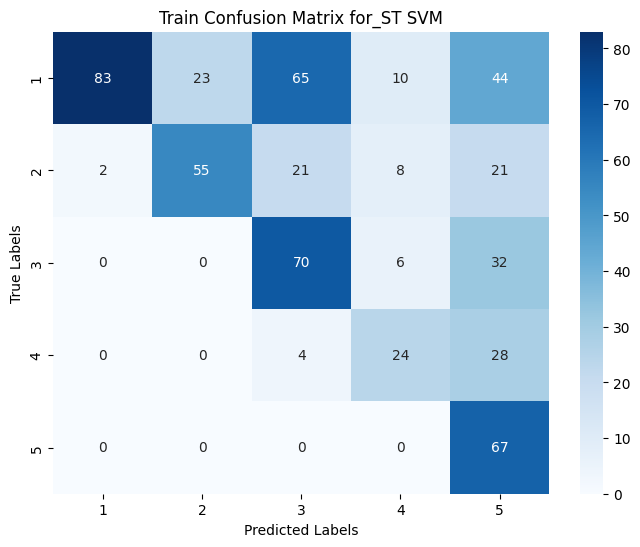

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.76      0.21      0.33        61
           2       0.20      0.16      0.18        25
           3       0.13      0.75      0.22         8
           4       0.00      0.00      0.00        16
           5       0.32      1.00      0.49        10

    accuracy                           0.28       120
   macro avg       0.28      0.42      0.24       120
weighted avg       0.47      0.28      0.26       120



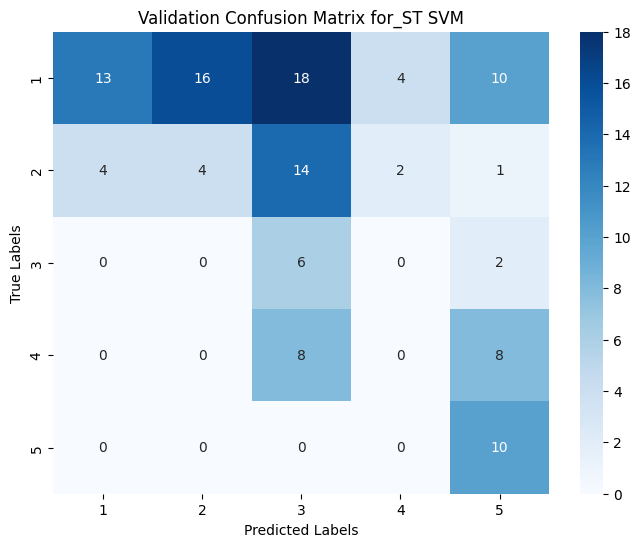

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.91      0.22      0.35        46
           2       0.00      0.00      0.00         6
           3       0.06      0.50      0.11         4
           4       0.25      0.20      0.22         5
           5       0.25      1.00      0.40         1

    accuracy                           0.23        62
   macro avg       0.29      0.38      0.22        62
weighted avg       0.70      0.23      0.29        62



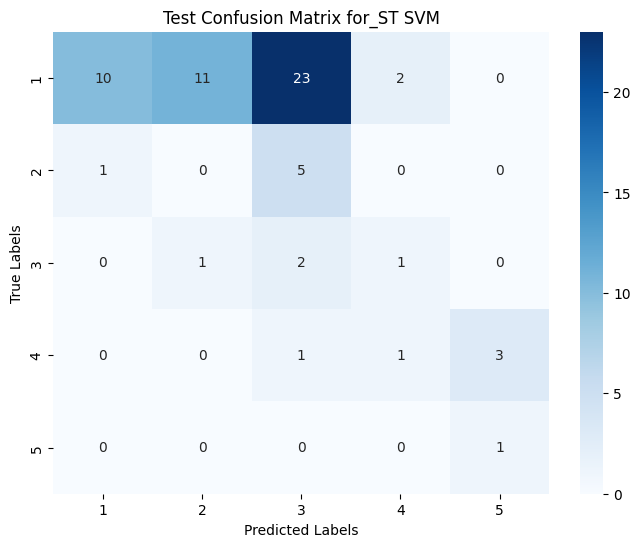


Evaluating RandomForest model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       107
           3       1.00      1.00      1.00       108
           4       1.00      1.00      1.00        56
           5       1.00      1.00      1.00        67

    accuracy                           1.00       563
   macro avg       1.00      1.00      1.00       563
weighted avg       1.00      1.00      1.00       563



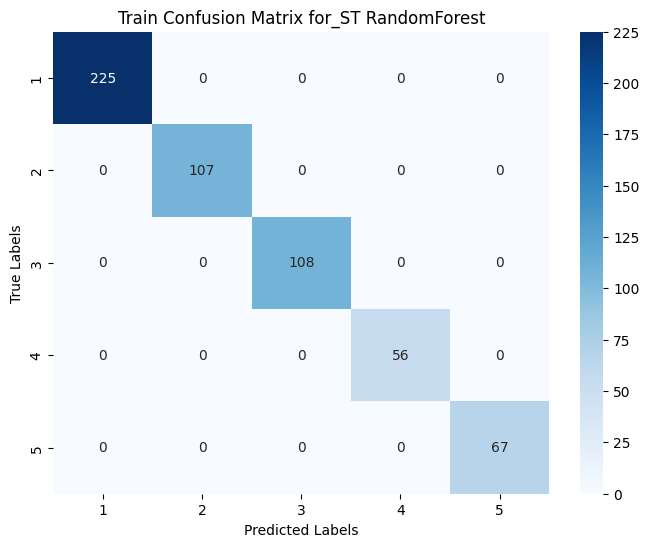

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.52      0.97      0.67        61
           2       0.00      0.00      0.00        25
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00        16
           5       0.00      0.00      0.00        10

    accuracy                           0.49       120
   macro avg       0.10      0.19      0.13       120
weighted avg       0.26      0.49      0.34       120



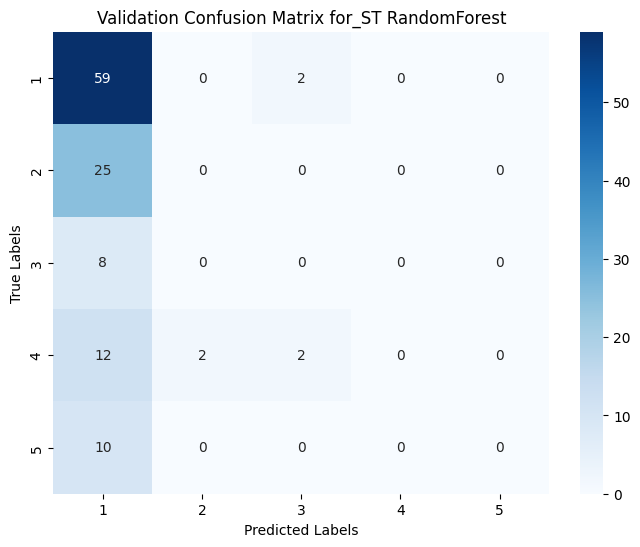

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.74      0.98      0.84        46
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         1

    accuracy                           0.73        62
   macro avg       0.15      0.20      0.17        62
weighted avg       0.55      0.73      0.62        62



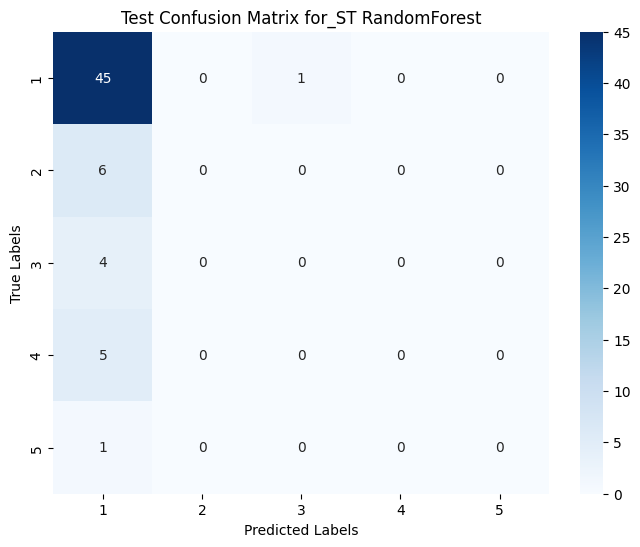


Evaluating LogisticRegression model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.89      0.67      0.76       225
           2       0.75      0.71      0.73       107
           3       0.76      0.69      0.72       108
           4       0.70      0.93      0.80        56
           5       0.55      1.00      0.71        67

    accuracy                           0.74       563
   macro avg       0.73      0.80      0.74       563
weighted avg       0.78      0.74      0.75       563



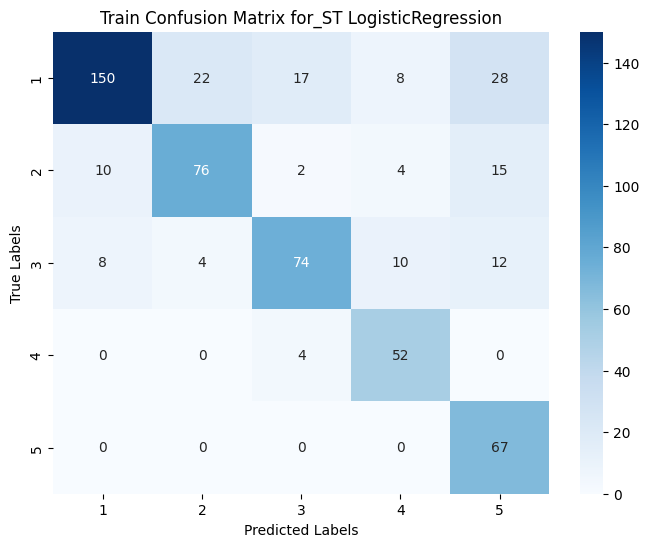

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.76      0.51      0.61        61
           2       0.47      0.32      0.38        25
           3       0.18      0.75      0.29         8
           4       0.20      0.12      0.15        16
           5       0.44      0.80      0.57        10

    accuracy                           0.46       120
   macro avg       0.41      0.50      0.40       120
weighted avg       0.56      0.46      0.48       120



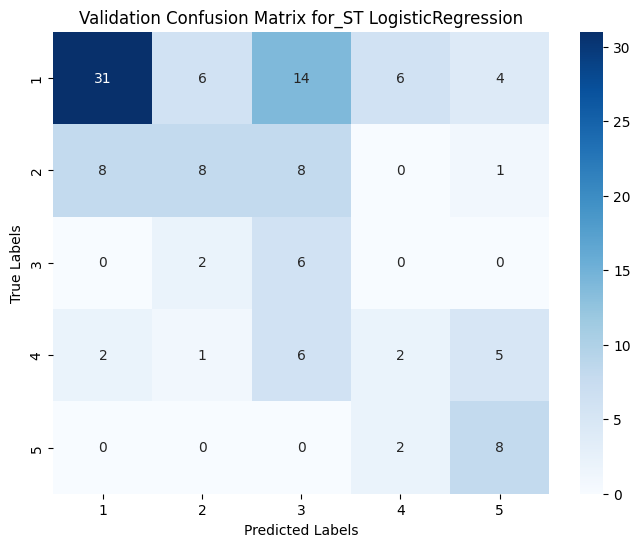

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.83      0.54      0.66        46
           2       0.05      0.17      0.08         6
           3       0.00      0.00      0.00         4
           4       0.75      0.60      0.67         5
           5       0.50      1.00      0.67         1

    accuracy                           0.48        62
   macro avg       0.43      0.46      0.41        62
weighted avg       0.69      0.48      0.56        62



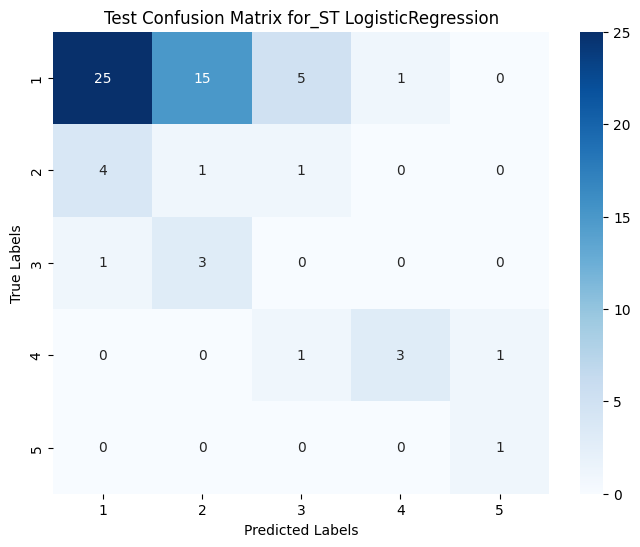


Evaluating KNeighbors model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.71      0.88      0.79       225
           2       0.56      0.52      0.54       107
           3       0.69      0.65      0.67       108
           4       0.70      0.34      0.46        56
           5       0.79      0.69      0.74        67

    accuracy                           0.69       563
   macro avg       0.69      0.61      0.64       563
weighted avg       0.69      0.69      0.68       563



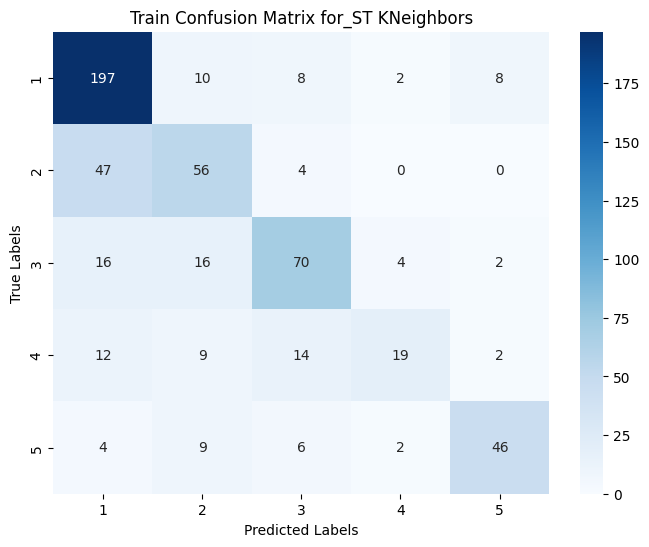

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.66      0.57      0.61        61
           2       0.17      0.16      0.16        25
           3       0.13      0.50      0.21         8
           4       0.00      0.00      0.00        16
           5       0.67      0.60      0.63        10

    accuracy                           0.41       120
   macro avg       0.33      0.37      0.32       120
weighted avg       0.43      0.41      0.41       120



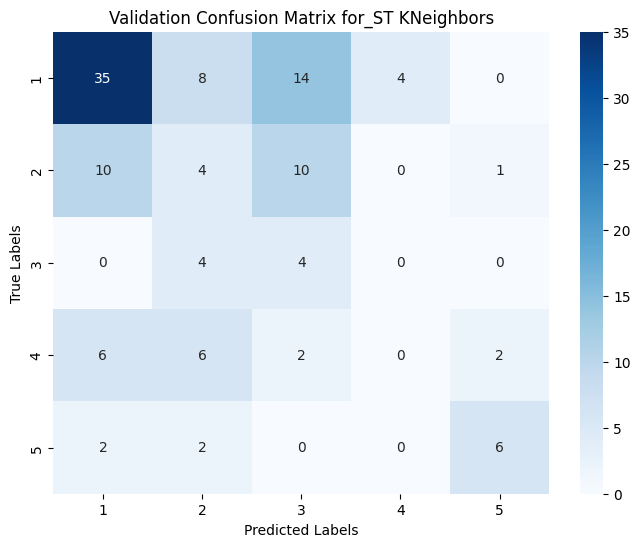

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.83      0.63      0.72        46
           2       0.11      0.17      0.13         6
           3       0.08      0.25      0.12         4
           4       0.33      0.20      0.25         5
           5       0.50      1.00      0.67         1

    accuracy                           0.53        62
   macro avg       0.37      0.45      0.38        62
weighted avg       0.67      0.53      0.58        62



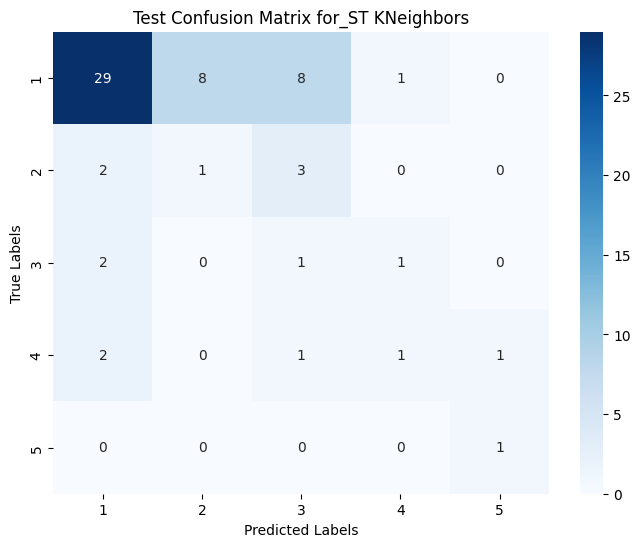


Evaluating NaiveBayes model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.48      0.95      0.64       225
           2       0.65      0.19      0.29       107
           3       0.50      0.37      0.43       108
           4       1.00      0.07      0.13        56
           5       1.00      0.06      0.11        67

    accuracy                           0.50       563
   macro avg       0.73      0.33      0.32       563
weighted avg       0.63      0.50      0.42       563



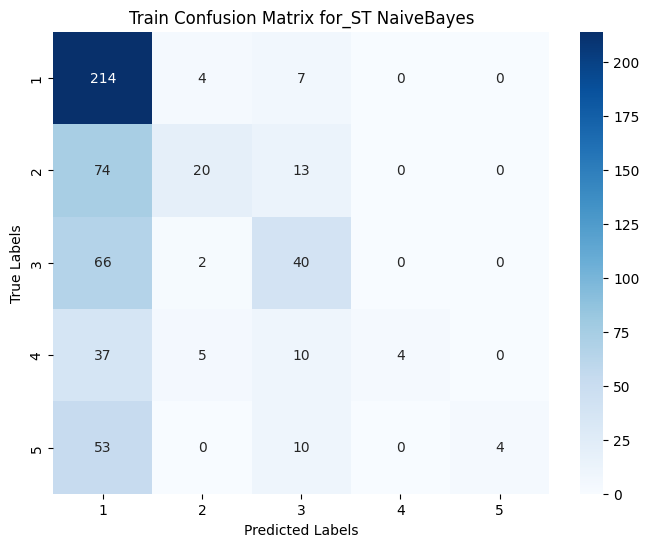

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.49      0.69      0.58        61
           2       0.00      0.00      0.00        25
           3       0.19      0.50      0.28         8
           4       0.00      0.00      0.00        16
           5       0.00      0.00      0.00        10

    accuracy                           0.38       120
   macro avg       0.14      0.24      0.17       120
weighted avg       0.26      0.38      0.31       120



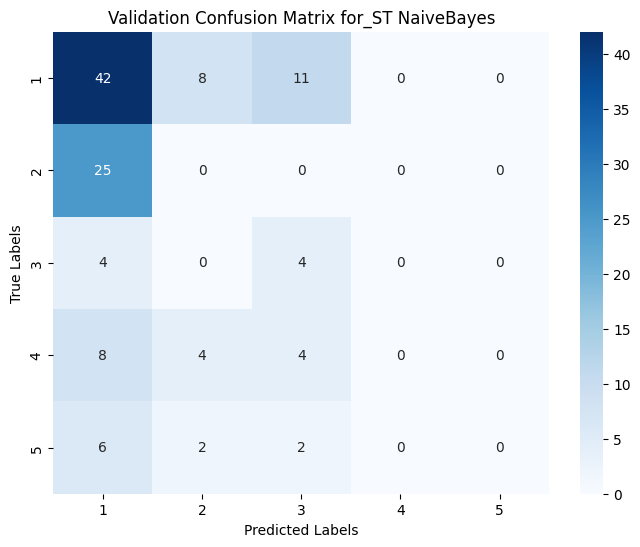

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.73      0.83      0.78        46
           2       0.00      0.00      0.00         6
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         1

    accuracy                           0.61        62
   macro avg       0.15      0.17      0.16        62
weighted avg       0.54      0.61      0.58        62



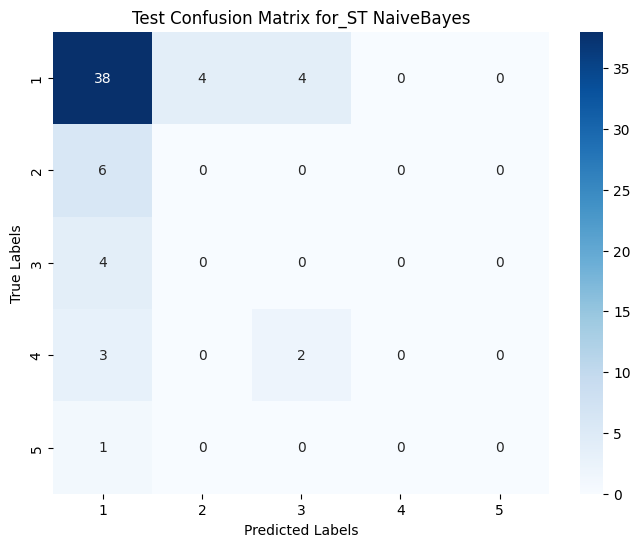


Evaluating DecisionTree model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       107
           3       1.00      1.00      1.00       108
           4       1.00      1.00      1.00        56
           5       1.00      1.00      1.00        67

    accuracy                           1.00       563
   macro avg       1.00      1.00      1.00       563
weighted avg       1.00      1.00      1.00       563



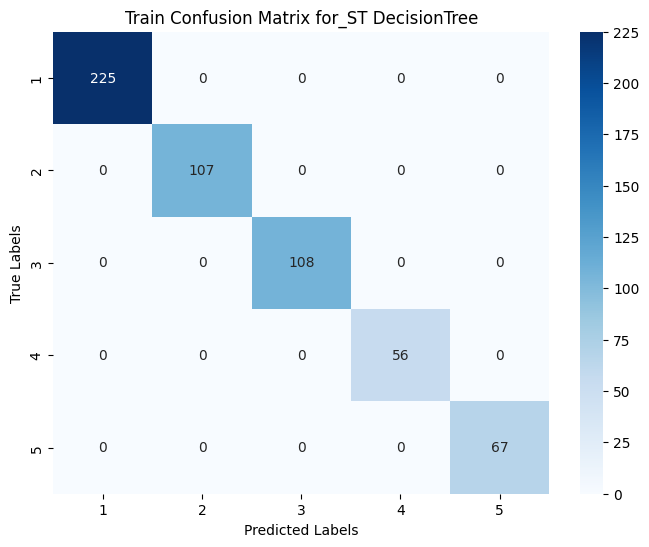

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.56      0.38      0.45        61
           2       0.12      0.16      0.14        25
           3       0.08      0.25      0.12         8
           4       0.25      0.25      0.25        16
           5       0.67      0.20      0.31        10

    accuracy                           0.29       120
   macro avg       0.33      0.25      0.25       120
weighted avg       0.40      0.29      0.32       120



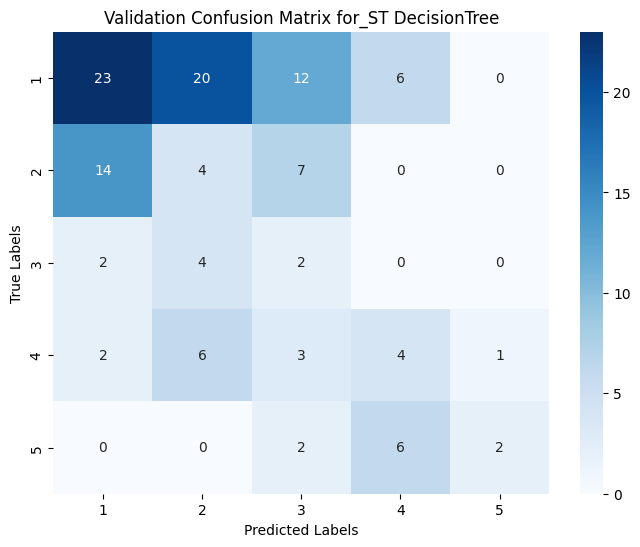

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.82      0.39      0.53        46
           2       0.05      0.17      0.07         6
           3       0.06      0.25      0.10         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         1

    accuracy                           0.32        62
   macro avg       0.19      0.16      0.14        62
weighted avg       0.62      0.32      0.41        62



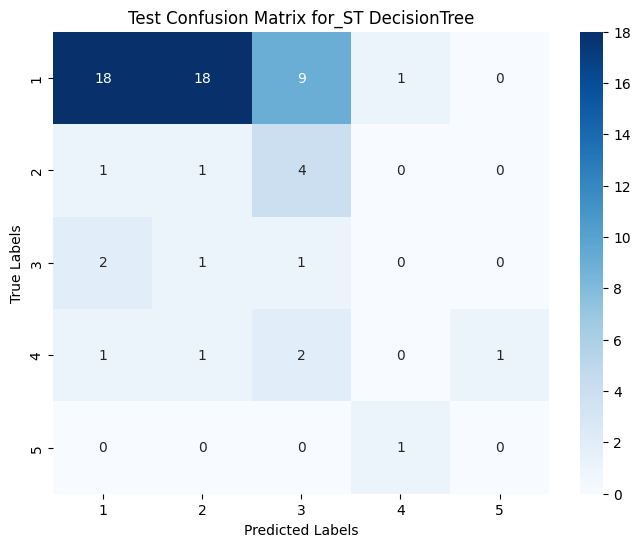


Evaluating GradientBoosting model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       107
           3       1.00      1.00      1.00       108
           4       1.00      1.00      1.00        56
           5       1.00      1.00      1.00        67

    accuracy                           1.00       563
   macro avg       1.00      1.00      1.00       563
weighted avg       1.00      1.00      1.00       563



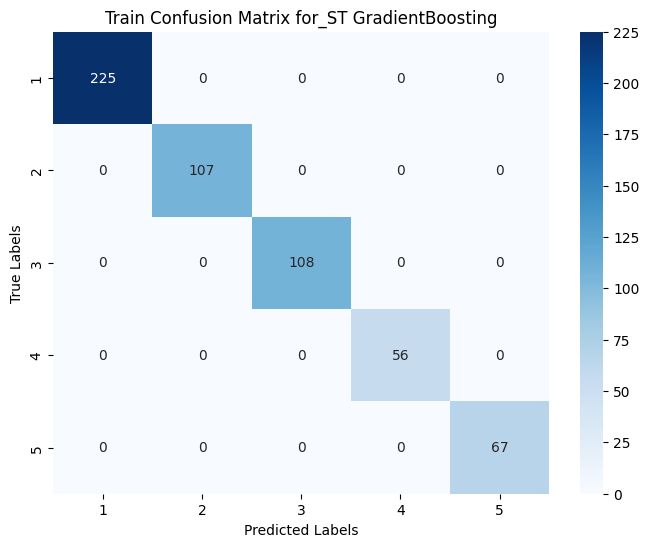

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.57      0.54      0.55        61
           2       0.10      0.08      0.09        25
           3       0.30      1.00      0.46         8
           4       0.25      0.12      0.17        16
           5       0.57      0.40      0.47        10

    accuracy                           0.41       120
   macro avg       0.36      0.43      0.35       120
weighted avg       0.41      0.41      0.39       120



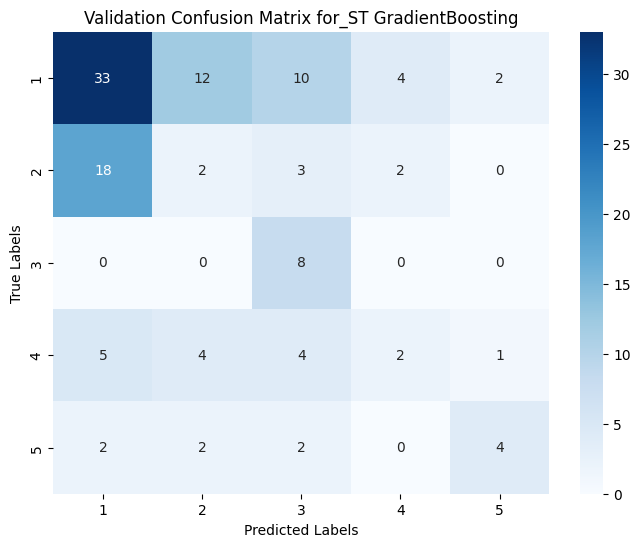

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.76      0.54      0.63        46
           2       0.06      0.17      0.08         6
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         1

    accuracy                           0.42        62
   macro avg       0.16      0.14      0.14        62
weighted avg       0.57      0.42      0.48        62



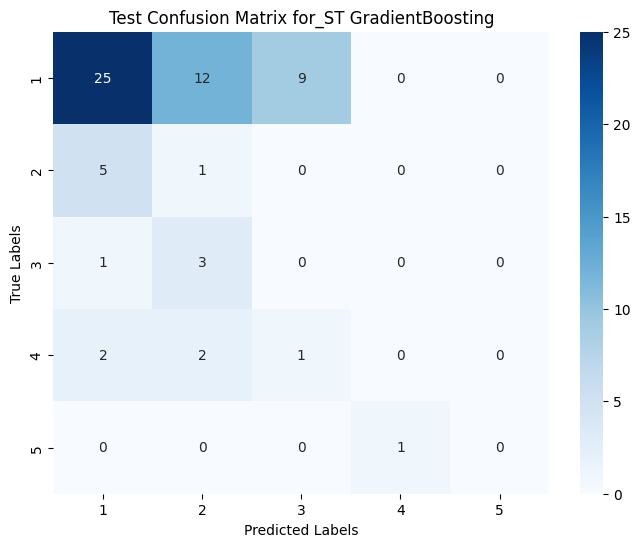


Evaluating AdaBoost model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.61      0.67      0.64       225
           2       0.43      0.28      0.34       107
           3       0.49      0.22      0.31       108
           4       0.56      0.18      0.27        56
           5       0.36      0.97      0.53        67

    accuracy                           0.50       563
   macro avg       0.49      0.46      0.42       563
weighted avg       0.52      0.50      0.47       563



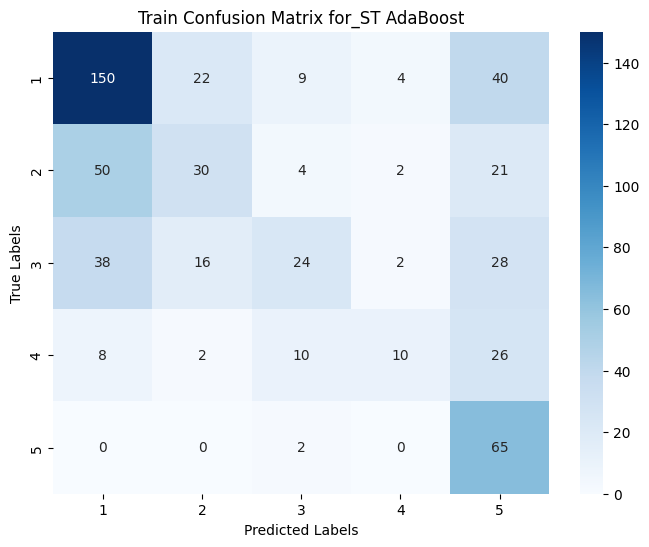

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.69      0.48      0.56        61
           2       0.27      0.32      0.29        25
           3       0.11      0.25      0.15         8
           4       0.00      0.00      0.00        16
           5       0.33      1.00      0.50        10

    accuracy                           0.41       120
   macro avg       0.28      0.41      0.30       120
weighted avg       0.44      0.41      0.40       120



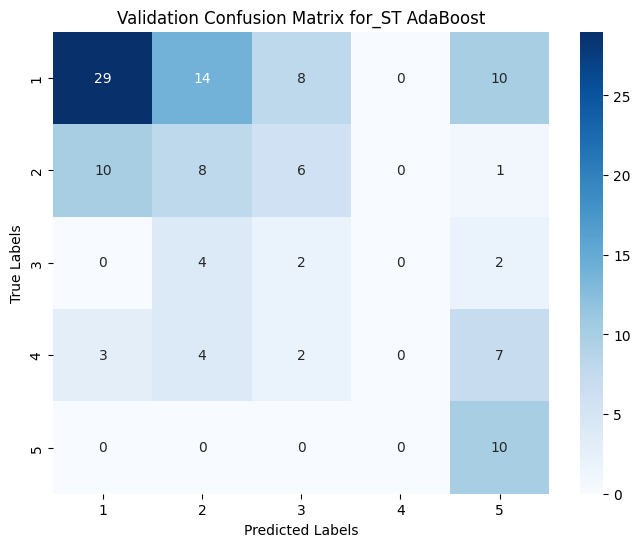

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.84      0.59      0.69        46
           2       0.06      0.17      0.09         6
           3       0.10      0.25      0.14         4
           4       0.00      0.00      0.00         5
           5       0.33      1.00      0.50         1

    accuracy                           0.48        62
   macro avg       0.27      0.40      0.29        62
weighted avg       0.64      0.48      0.54        62



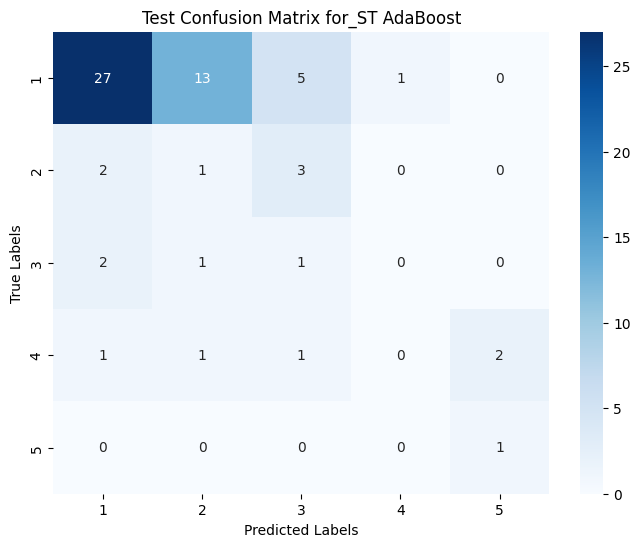


Evaluating Bagging model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       107
           3       1.00      1.00      1.00       108
           4       1.00      1.00      1.00        56
           5       1.00      1.00      1.00        67

    accuracy                           1.00       563
   macro avg       1.00      1.00      1.00       563
weighted avg       1.00      1.00      1.00       563



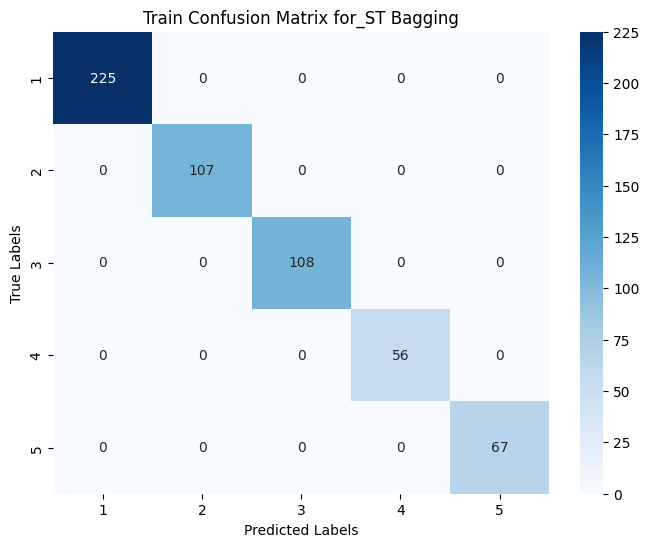

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.57      0.61      0.59        61
           2       0.33      0.08      0.13        25
           3       0.07      0.25      0.11         8
           4       0.50      0.12      0.20        16
           5       0.12      0.20      0.15        10

    accuracy                           0.38       120
   macro avg       0.32      0.25      0.24       120
weighted avg       0.44      0.38      0.37       120



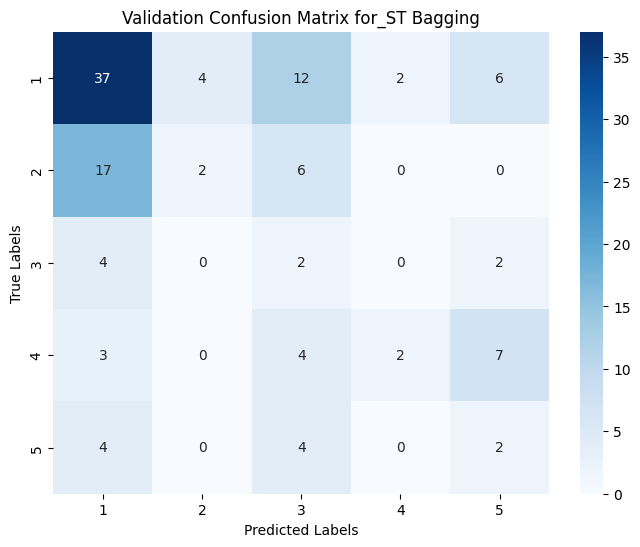

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.76      0.74      0.75        46
           2       0.12      0.17      0.14         6
           3       0.00      0.00      0.00         4
           4       0.00      0.00      0.00         5
           5       0.00      0.00      0.00         1

    accuracy                           0.56        62
   macro avg       0.18      0.18      0.18        62
weighted avg       0.57      0.56      0.57        62



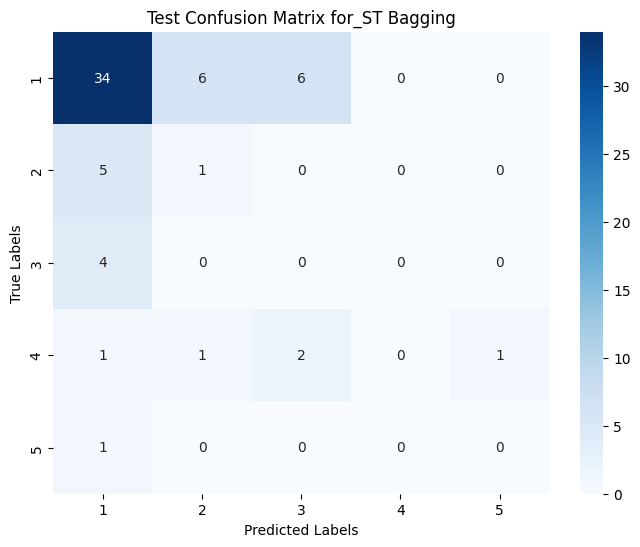

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler

# Define pipelines for each model_ST
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    "GradientBoosting": Pipeline([
        ("classifier", GradientBoostingClassifier(random_state=1))
    ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}
results = []
# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Train the model
    pipeline.fit(X_train, y_train)

     # Predict on train data
    y_train_pred = pipeline.predict(X_train)
    train_accuracy_st = accuracy_score(y_train, y_train_pred)
    train_precision_st = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = pipeline.predict(X_val)
    val_accuracy_st = accuracy_score(y_val, y_val_pred)
    val_precision_st = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = pipeline.predict(X_test)
    test_accuracy_st = accuracy_score(y_test, y_test_pred)
    test_precision_st = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st = f1_score(y_test, y_test_pred, average="weighted")

    # Predict on train data
    #y_train_pred = pipeline.predict(X_train)
    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(classification_report(y_train, y_train_pred))

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
   # y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(classification_report(y_val, y_val_pred))

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    #y_test_pred = pipeline.predict(X_test)
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df = pd.DataFrame(results)
print(results_df)
results_df.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   0.976471  0.368889  0.535484    225.0
1        SVM  Train     2   0.705128  0.514019  0.594595    107.0
2        SVM  Train     3   0.437500  0.648148  0.522388    108.0
3        SVM  Train     4   0.500000  0.428571  0.461538     56.0
4        SVM  Train     5   0.348958  1.000000  0.517375     67.0
..       ...    ...   ...        ...       ...       ...      ...
130  Bagging   Test     1   0.755556  0.739130  0.747253     46.0
131  Bagging   Test     2   0.125000  0.166667  0.142857      6.0
132  Bagging   Test     3   0.000000  0.000000  0.000000      4.0
133  Bagging   Test     4   0.000000  0.000000  0.000000      5.0
134  Bagging   Test     5   0.000000  0.000000  0.000000      1.0

[135 rows x 7 columns]


## Hyperparameter Tuning- Sentence Transformer


Hyperparameter tuning and evaluating SVM model:
Best parameters for SVM: {'classifier__C': 100, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 225.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 67.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}}


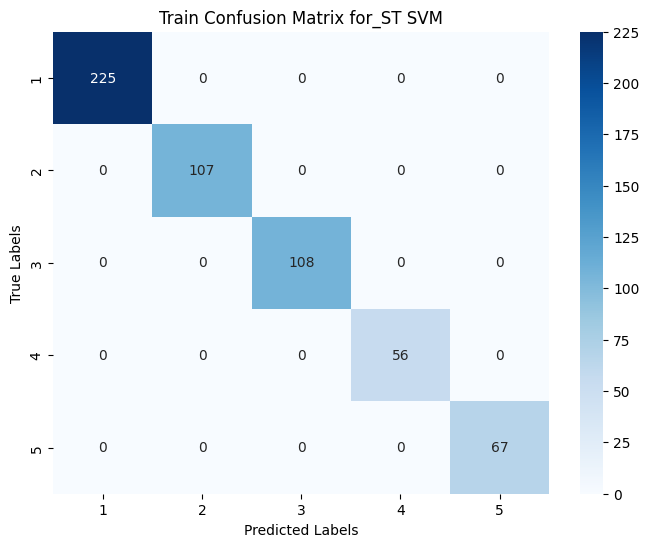

Validation Classification Report_ST:
{'1': {'precision': 0.6206896551724138, 'recall': 0.5901639344262295, 'f1-score': 0.6050420168067226, 'support': 61.0}, '2': {'precision': 0.3076923076923077, 'recall': 0.16, 'f1-score': 0.21052631578947367, 'support': 25.0}, '3': {'precision': 0.13793103448275862, 'recall': 0.5, 'f1-score': 0.21621621621621623, 'support': 8.0}, '4': {'precision': 0.2857142857142857, 'recall': 0.25, 'f1-score': 0.26666666666666666, 'support': 16.0}, '5': {'precision': 0.6666666666666666, 'recall': 0.4, 'f1-score': 0.5, 'support': 10.0}, 'accuracy': 0.43333333333333335, 'macro avg': {'precision': 0.40373878994568646, 'recall': 0.3800327868852459, 'f1-score': 0.3596902430958158, 'support': 120.0}, 'weighted avg': {'precision': 0.4824660014315187, 'recall': 0.43333333333333335, 'f1-score': 0.44305931096952766, 'support': 120.0}}


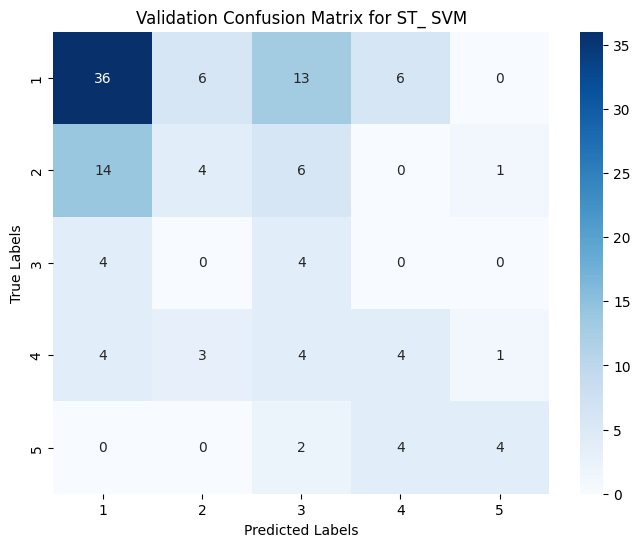

Test Classification Report_ST:
{'1': {'precision': 0.8387096774193549, 'recall': 0.5652173913043478, 'f1-score': 0.6753246753246753, 'support': 46.0}, '2': {'precision': 0.09523809523809523, 'recall': 0.3333333333333333, 'f1-score': 0.14814814814814814, 'support': 6.0}, '3': {'precision': 0.14285714285714285, 'recall': 0.25, 'f1-score': 0.18181818181818182, 'support': 4.0}, '4': {'precision': 1.0, 'recall': 0.6, 'f1-score': 0.75, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.5161290322580645, 'macro avg': {'precision': 0.41536098310291864, 'recall': 0.34971014492753627, 'f1-score': 0.35105820105820107, 'support': 62.0}, 'weighted avg': {'precision': 0.7213468113572172, 'recall': 0.5161290322580645, 'f1-score': 0.5875983335660755, 'support': 62.0}}


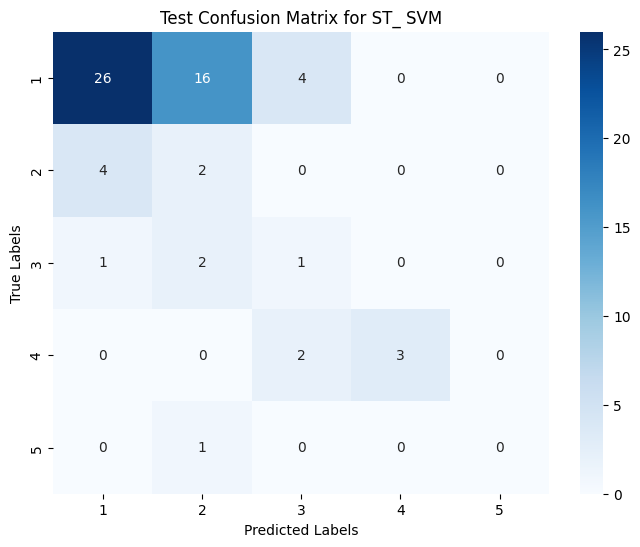


Hyperparameter tuning and evaluating RandomForest model:
Best parameters for RandomForest: {'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 50}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 225.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 67.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}}


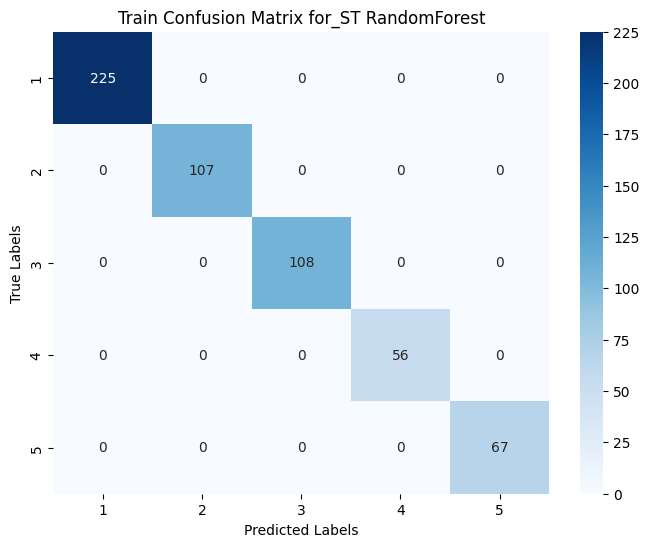

Validation Classification Report_ST:
{'1': {'precision': 0.5045871559633027, 'recall': 0.9016393442622951, 'f1-score': 0.6470588235294118, 'support': 61.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25.0}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 8.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10.0}, 'accuracy': 0.4583333333333333, 'macro avg': {'precision': 0.10091743119266054, 'recall': 0.18032786885245902, 'f1-score': 0.12941176470588237, 'support': 120.0}, 'weighted avg': {'precision': 0.2564984709480122, 'recall': 0.4583333333333333, 'f1-score': 0.32892156862745103, 'support': 120.0}}


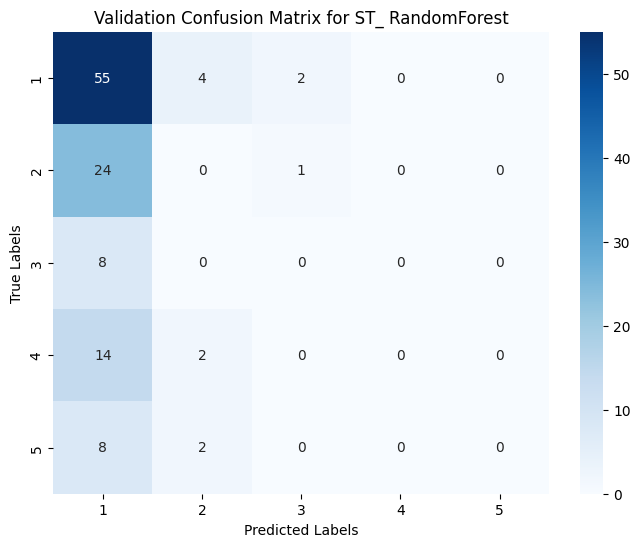

Test Classification Report_ST:
{'1': {'precision': 0.75, 'recall': 0.9782608695652174, 'f1-score': 0.8490566037735849, 'support': 46.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6.0}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.7258064516129032, 'macro avg': {'precision': 0.15, 'recall': 0.1956521739130435, 'f1-score': 0.169811320754717, 'support': 62.0}, 'weighted avg': {'precision': 0.5564516129032258, 'recall': 0.7258064516129032, 'f1-score': 0.6299452221545954, 'support': 62.0}}


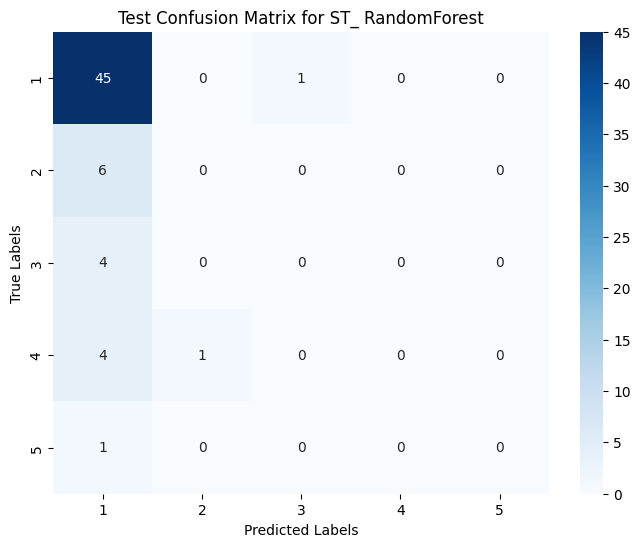


Hyperparameter tuning and evaluating LogisticRegression model:
Best parameters for LogisticRegression: {'classifier__C': 10, 'classifier__solver': 'liblinear'}
Train Classification Report_ST:
{'1': {'precision': 0.9818181818181818, 'recall': 0.96, 'f1-score': 0.9707865168539326, 'support': 225.0}, '2': {'precision': 0.9807692307692307, 'recall': 0.9532710280373832, 'f1-score': 0.966824644549763, 'support': 107.0}, '3': {'precision': 0.9541284403669725, 'recall': 0.9629629629629629, 'f1-score': 0.9585253456221198, 'support': 108.0}, '4': {'precision': 0.9333333333333333, 'recall': 1.0, 'f1-score': 0.9655172413793104, 'support': 56.0}, '5': {'precision': 0.9571428571428572, 'recall': 1.0, 'f1-score': 0.9781021897810219, 'support': 67.0}, 'accuracy': 0.9680284191829485, 'macro avg': {'precision': 0.9614384086861152, 'recall': 0.9752467982000692, 'f1-score': 0.9679511876372295, 'support': 563.0}, 'weighted avg': {'precision': 0.968547972036003, 'recall': 0.9680284191829485, 'f1-score': 0.

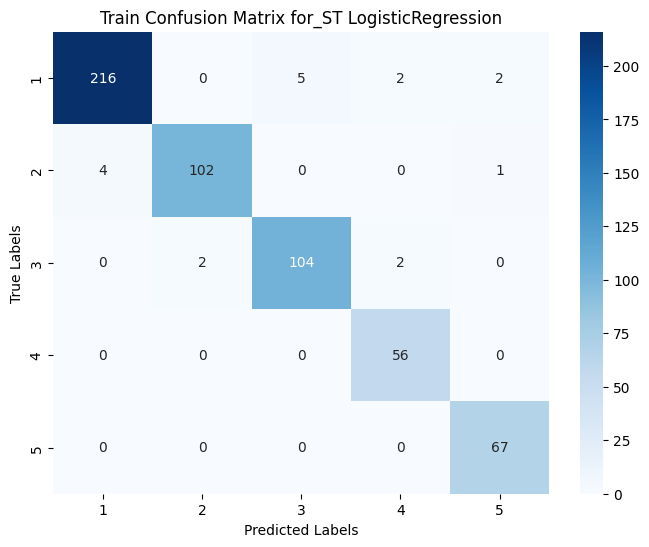

Validation Classification Report_ST:
{'1': {'precision': 0.6666666666666666, 'recall': 0.5245901639344263, 'f1-score': 0.5871559633027523, 'support': 61.0}, '2': {'precision': 0.13333333333333333, 'recall': 0.08, 'f1-score': 0.1, 'support': 25.0}, '3': {'precision': 0.2222222222222222, 'recall': 1.0, 'f1-score': 0.36363636363636365, 'support': 8.0}, '4': {'precision': 0.2857142857142857, 'recall': 0.25, 'f1-score': 0.26666666666666666, 'support': 16.0}, '5': {'precision': 0.8571428571428571, 'recall': 0.6, 'f1-score': 0.7058823529411765, 'support': 10.0}, 'accuracy': 0.43333333333333335, 'macro avg': {'precision': 0.43301587301587297, 'recall': 0.49091803278688523, 'f1-score': 0.4046682693093918, 'support': 120.0}, 'weighted avg': {'precision': 0.491005291005291, 'recall': 0.43333333333333335, 'f1-score': 0.4379257905553102, 'support': 120.0}}


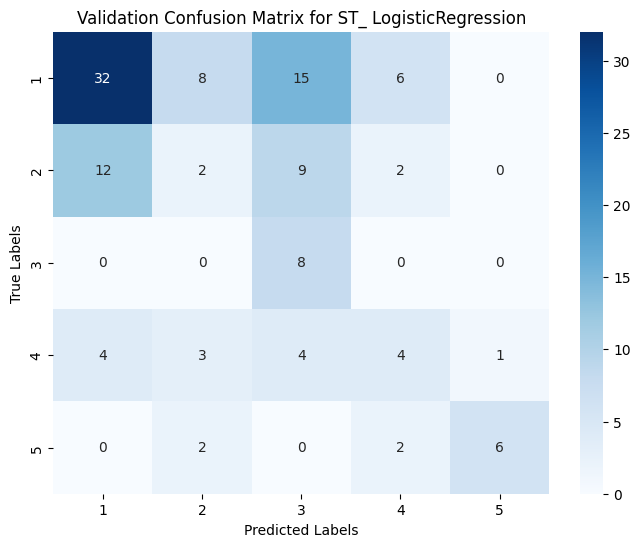

Test Classification Report_ST:
{'1': {'precision': 0.8285714285714286, 'recall': 0.6304347826086957, 'f1-score': 0.7160493827160493, 'support': 46.0}, '2': {'precision': 0.0625, 'recall': 0.16666666666666666, 'f1-score': 0.09090909090909091, 'support': 6.0}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '4': {'precision': 0.6666666666666666, 'recall': 0.4, 'f1-score': 0.5, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.5161290322580645, 'macro avg': {'precision': 0.3115476190476191, 'recall': 0.23942028985507244, 'f1-score': 0.26139169472502805, 'support': 62.0}, 'weighted avg': {'precision': 0.6745583717357911, 'recall': 0.5161290322580645, 'f1-score': 0.5803826798450454, 'support': 62.0}}


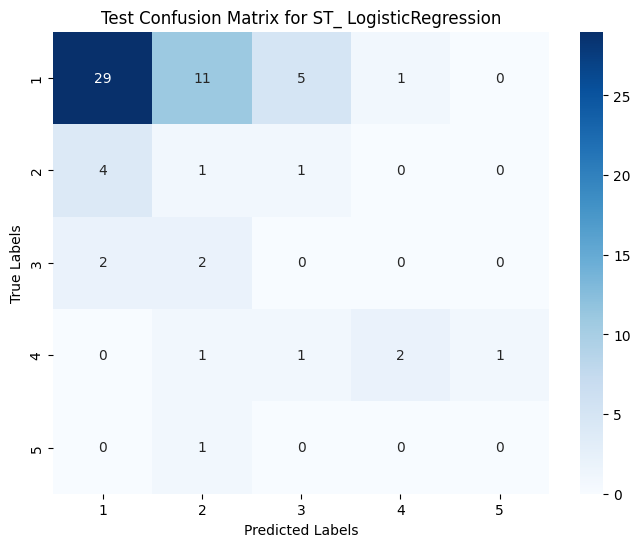


Hyperparameter tuning and evaluating KNeighbors model:
Best parameters for KNeighbors: {'classifier__n_neighbors': 3, 'classifier__weights': 'distance'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 225.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 67.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}}


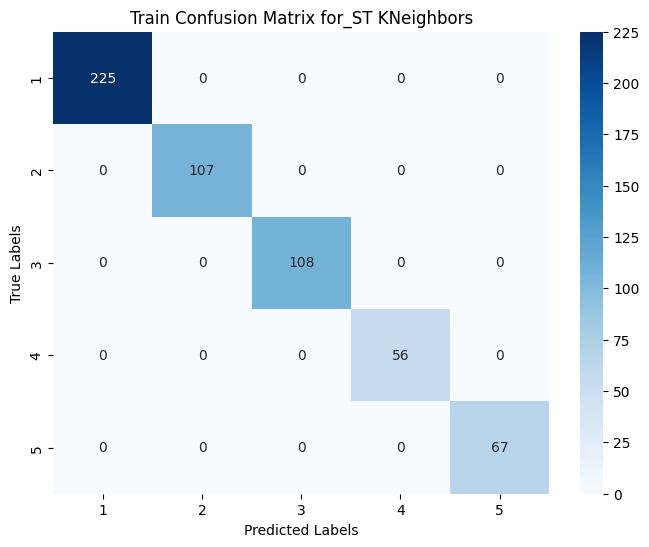

Validation Classification Report_ST:
{'1': {'precision': 0.6078431372549019, 'recall': 0.5081967213114754, 'f1-score': 0.5535714285714286, 'support': 61.0}, '2': {'precision': 0.375, 'recall': 0.24, 'f1-score': 0.2926829268292683, 'support': 25.0}, '3': {'precision': 0.12121212121212122, 'recall': 0.5, 'f1-score': 0.1951219512195122, 'support': 8.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16.0}, '5': {'precision': 0.5, 'recall': 0.6, 'f1-score': 0.5454545454545454, 'support': 10.0}, 'accuracy': 0.39166666666666666, 'macro avg': {'precision': 0.3208110516934046, 'recall': 0.3696393442622951, 'f1-score': 0.3173661704149509, 'support': 120.0}, 'weighted avg': {'precision': 0.4368594028520499, 'recall': 0.39166666666666666, 'f1-score': 0.4008370948157534, 'support': 120.0}}


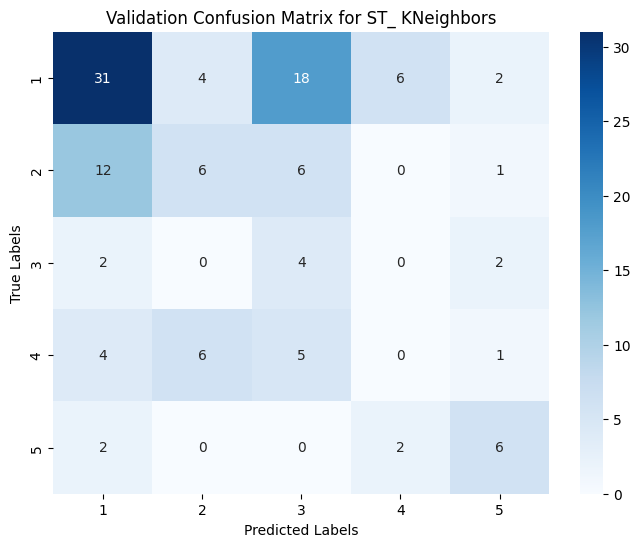

Test Classification Report_ST:
{'1': {'precision': 0.875, 'recall': 0.6086956521739131, 'f1-score': 0.717948717948718, 'support': 46.0}, '2': {'precision': 0.07692307692307693, 'recall': 0.16666666666666666, 'f1-score': 0.10526315789473684, 'support': 6.0}, '3': {'precision': 0.18181818181818182, 'recall': 0.5, 'f1-score': 0.26666666666666666, 'support': 4.0}, '4': {'precision': 0.5, 'recall': 0.4, 'f1-score': 0.4444444444444444, 'support': 5.0}, '5': {'precision': 0.5, 'recall': 1.0, 'f1-score': 0.6666666666666666, 'support': 1.0}, 'accuracy': 0.5483870967741935, 'macro avg': {'precision': 0.42674825174825176, 'recall': 0.5350724637681159, 'f1-score': 0.4401979307242465, 'support': 62.0}, 'weighted avg': {'precision': 0.716755019174374, 'recall': 0.5483870967741935, 'f1-score': 0.6066576698155646, 'support': 62.0}}


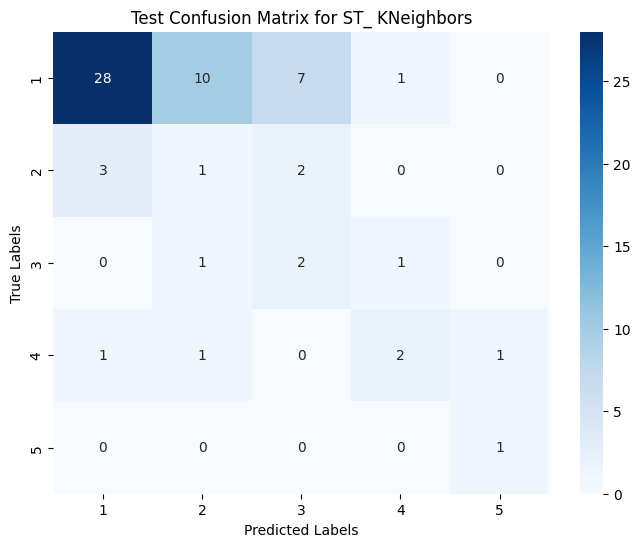


Hyperparameter tuning and evaluating NaiveBayes model:
Best parameters for NaiveBayes: {'classifier__alpha': 0.1}
Train Classification Report_ST:
{'1': {'precision': 0.4840182648401826, 'recall': 0.9422222222222222, 'f1-score': 0.6395173453996983, 'support': 225.0}, '2': {'precision': 0.6060606060606061, 'recall': 0.18691588785046728, 'f1-score': 0.2857142857142857, 'support': 107.0}, '3': {'precision': 0.5, 'recall': 0.37037037037037035, 'f1-score': 0.425531914893617, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 0.14285714285714285, 'f1-score': 0.25, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 0.05970149253731343, 'f1-score': 0.11267605633802817, 'support': 67.0}, 'accuracy': 0.5044404973357016, 'macro avg': {'precision': 0.7180157741801578, 'recall': 0.34041342316750317, 'f1-score': 0.3426879204691259, 'support': 563.0}, 'weighted avg': {'precision': 0.6230063844361029, 'recall': 0.5044404973357016, 'f1-score': 0.4297860992353806, 'support': 563.0}}


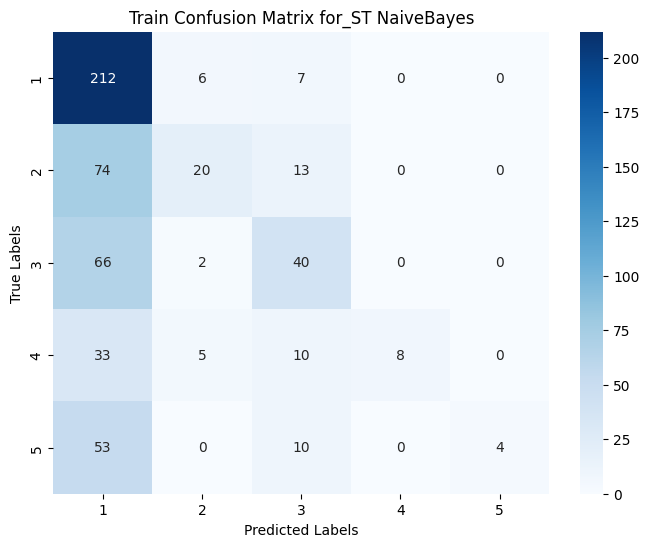

Validation Classification Report_ST:
{'1': {'precision': 0.49411764705882355, 'recall': 0.6885245901639344, 'f1-score': 0.5753424657534246, 'support': 61.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25.0}, '3': {'precision': 0.19047619047619047, 'recall': 0.5, 'f1-score': 0.27586206896551724, 'support': 8.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 10.0}, 'accuracy': 0.38333333333333336, 'macro avg': {'precision': 0.1369187675070028, 'recall': 0.23770491803278687, 'f1-score': 0.17024090694378838, 'support': 120.0}, 'weighted avg': {'precision': 0.263874883286648, 'recall': 0.38333333333333336, 'f1-score': 0.3108565580223586, 'support': 120.0}}


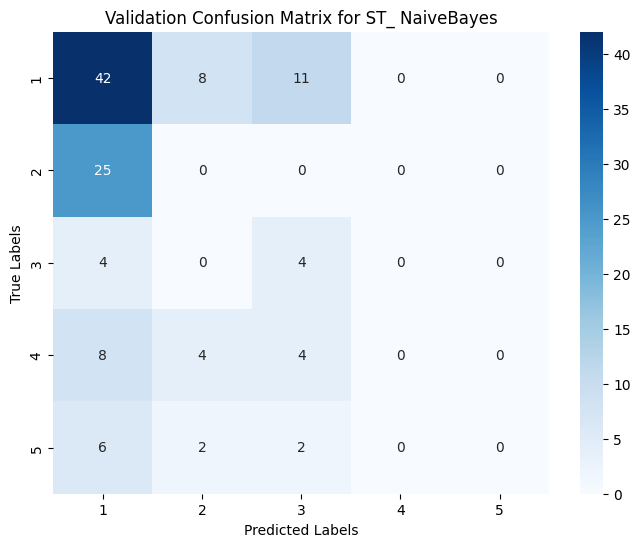

Test Classification Report_ST:
{'1': {'precision': 0.7307692307692307, 'recall': 0.8260869565217391, 'f1-score': 0.7755102040816326, 'support': 46.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6.0}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.6129032258064516, 'macro avg': {'precision': 0.14615384615384613, 'recall': 0.16521739130434782, 'f1-score': 0.15510204081632653, 'support': 62.0}, 'weighted avg': {'precision': 0.5421836228287841, 'recall': 0.6129032258064516, 'f1-score': 0.575378538512179, 'support': 62.0}}


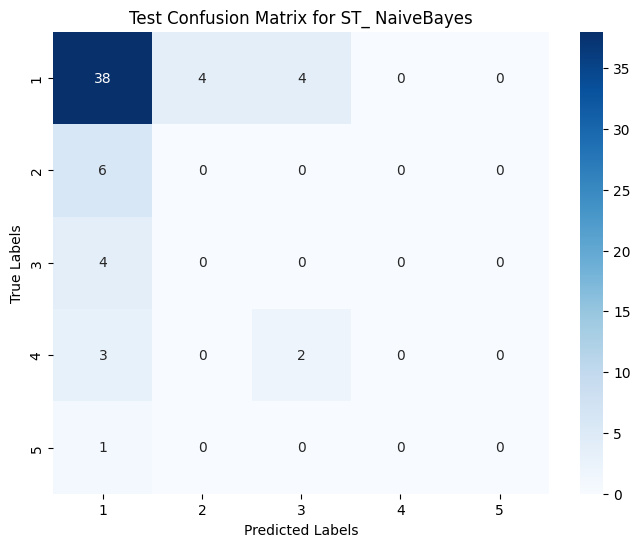


Hyperparameter tuning and evaluating DecisionTree model:
Best parameters for DecisionTree: {'classifier__max_depth': None, 'classifier__min_samples_split': 2}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 225.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 67.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}}


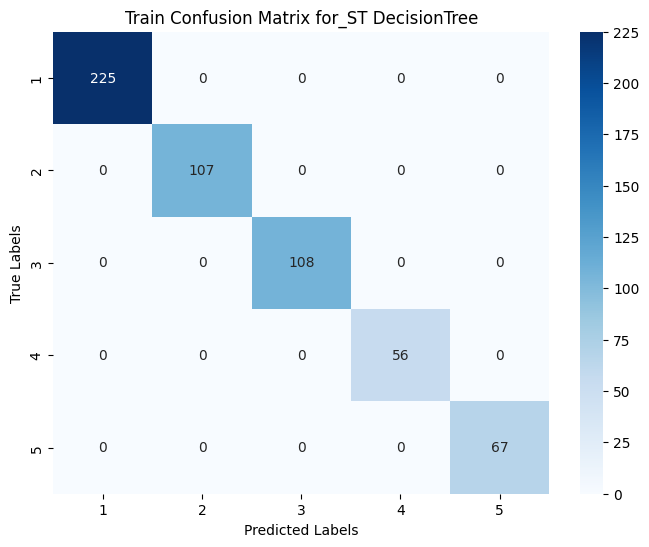

Validation Classification Report_ST:
{'1': {'precision': 0.5609756097560976, 'recall': 0.3770491803278688, 'f1-score': 0.45098039215686275, 'support': 61.0}, '2': {'precision': 0.11764705882352941, 'recall': 0.16, 'f1-score': 0.13559322033898305, 'support': 25.0}, '3': {'precision': 0.07692307692307693, 'recall': 0.25, 'f1-score': 0.11764705882352941, 'support': 8.0}, '4': {'precision': 0.25, 'recall': 0.25, 'f1-score': 0.25, 'support': 16.0}, '5': {'precision': 0.6666666666666666, 'recall': 0.2, 'f1-score': 0.3076923076923077, 'support': 10.0}, 'accuracy': 0.2916666666666667, 'macro avg': {'precision': 0.33444248243387414, 'recall': 0.24740983606557373, 'f1-score': 0.2523825958023366, 'support': 120.0}, 'weighted avg': {'precision': 0.40368949956467887, 'recall': 0.2916666666666667, 'f1-score': 0.3243144498129543, 'support': 120.0}}


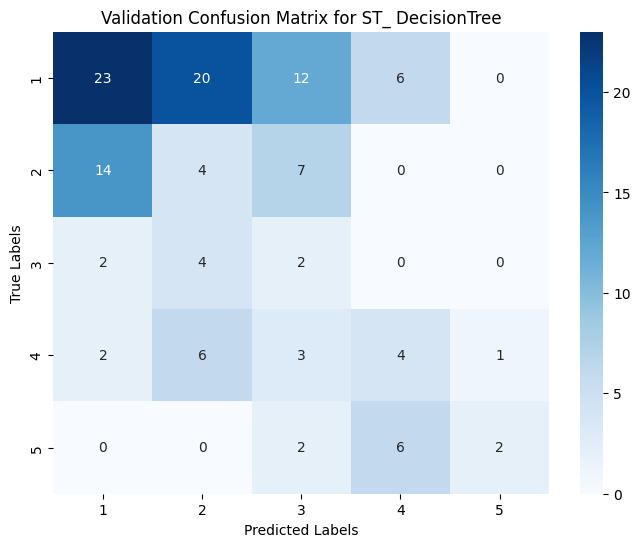

Test Classification Report_ST:
{'1': {'precision': 0.8181818181818182, 'recall': 0.391304347826087, 'f1-score': 0.5294117647058824, 'support': 46.0}, '2': {'precision': 0.047619047619047616, 'recall': 0.16666666666666666, 'f1-score': 0.07407407407407407, 'support': 6.0}, '3': {'precision': 0.0625, 'recall': 0.25, 'f1-score': 0.1, 'support': 4.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.3225806451612903, 'macro avg': {'precision': 0.18566017316017316, 'recall': 0.16159420289855073, 'f1-score': 0.14069716775599128, 'support': 62.0}, 'weighted avg': {'precision': 0.6156786761625471, 'recall': 0.3225806451612903, 'f1-score': 0.4064094454986295, 'support': 62.0}}


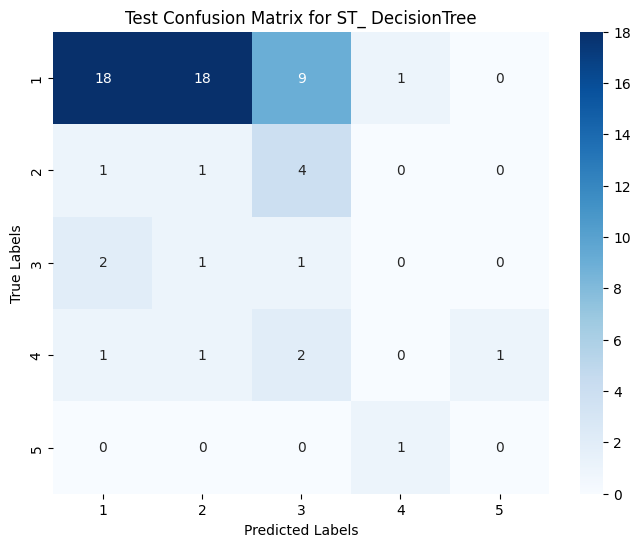


Hyperparameter tuning and evaluating AdaBoost model:
Best parameters for AdaBoost: {'classifier__learning_rate': 1.0, 'classifier__n_estimators': 200}
Train Classification Report_ST:
{'1': {'precision': 0.7016129032258065, 'recall': 0.7733333333333333, 'f1-score': 0.7357293868921776, 'support': 225.0}, '2': {'precision': 0.48739495798319327, 'recall': 0.5420560747663551, 'f1-score': 0.5132743362831859, 'support': 107.0}, '3': {'precision': 0.8, 'recall': 0.4444444444444444, 'f1-score': 0.5714285714285714, 'support': 108.0}, '4': {'precision': 0.95, 'recall': 0.6785714285714286, 'f1-score': 0.7916666666666666, 'support': 56.0}, '5': {'precision': 0.6875, 'recall': 0.9850746268656716, 'f1-score': 0.8098159509202454, 'support': 67.0}, 'accuracy': 0.6820603907637656, 'macro avg': {'precision': 0.7253015722417999, 'recall': 0.6846959815962466, 'f1-score': 0.6843829824381693, 'support': 563.0}, 'weighted avg': {'precision': 0.7028004684369593, 'recall': 0.6820603907637656, 'f1-score': 0.676

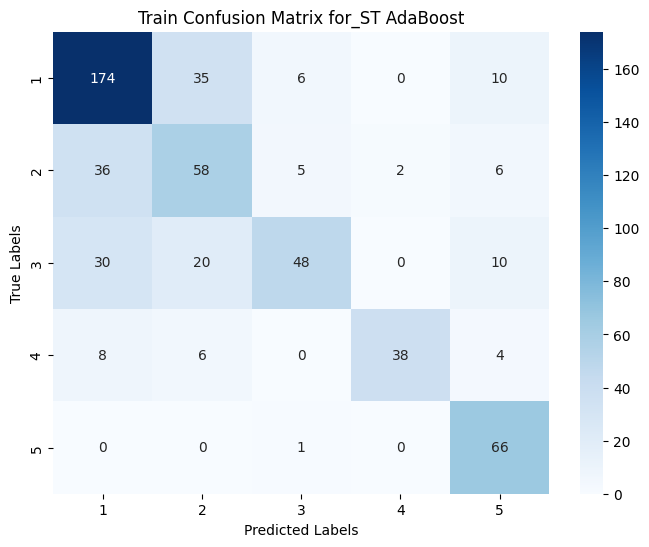

Validation Classification Report_ST:
{'1': {'precision': 0.6097560975609756, 'recall': 0.4098360655737705, 'f1-score': 0.49019607843137253, 'support': 61.0}, '2': {'precision': 0.2, 'recall': 0.24, 'f1-score': 0.21818181818181817, 'support': 25.0}, '3': {'precision': 0.2, 'recall': 0.5, 'f1-score': 0.2857142857142857, 'support': 8.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16.0}, '5': {'precision': 0.3448275862068966, 'recall': 1.0, 'f1-score': 0.5128205128205128, 'support': 10.0}, 'accuracy': 0.375, 'macro avg': {'precision': 0.2709167367535744, 'recall': 0.4299672131147541, 'f1-score': 0.30138253902959783, 'support': 120.0}, 'weighted avg': {'precision': 0.39369498177740403, 'recall': 0.375, 'f1-score': 0.35642021377315497, 'support': 120.0}}


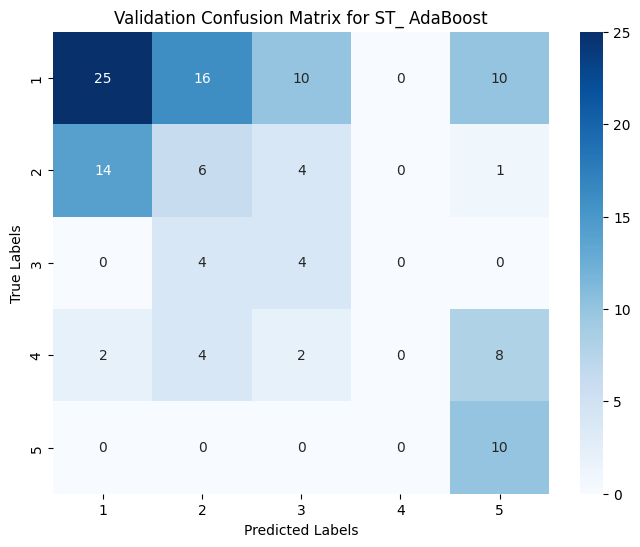

Test Classification Report_ST:
{'1': {'precision': 0.88, 'recall': 0.4782608695652174, 'f1-score': 0.6197183098591549, 'support': 46.0}, '2': {'precision': 0.041666666666666664, 'recall': 0.16666666666666666, 'f1-score': 0.06666666666666667, 'support': 6.0}, '3': {'precision': 0.125, 'recall': 0.25, 'f1-score': 0.16666666666666666, 'support': 4.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5.0}, '5': {'precision': 0.25, 'recall': 1.0, 'f1-score': 0.4, 'support': 1.0}, 'accuracy': 0.4032258064516129, 'macro avg': {'precision': 0.2593333333333333, 'recall': 0.3789855072463768, 'f1-score': 0.25061032863849764, 'support': 62.0}, 'weighted avg': {'precision': 0.669032258064516, 'recall': 0.4032258064516129, 'f1-score': 0.483446918067545, 'support': 62.0}}


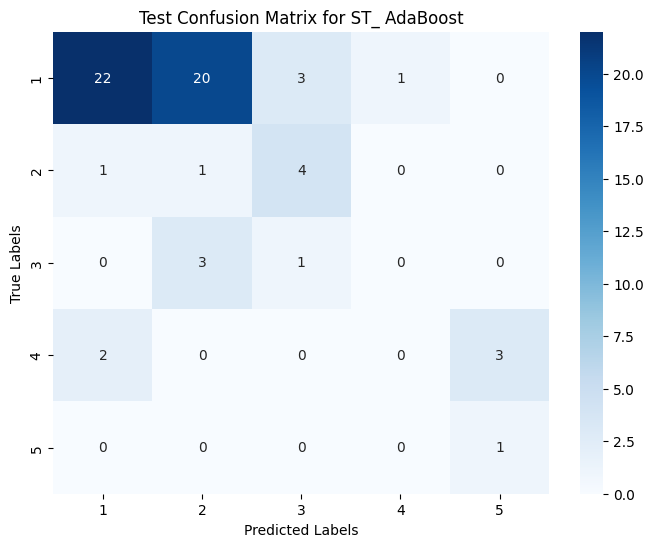


Hyperparameter tuning and evaluating Bagging model:
Best parameters for Bagging: {'classifier__max_samples': 0.7, 'classifier__n_estimators': 100}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 225.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 107.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 108.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 56.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 67.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 563.0}}


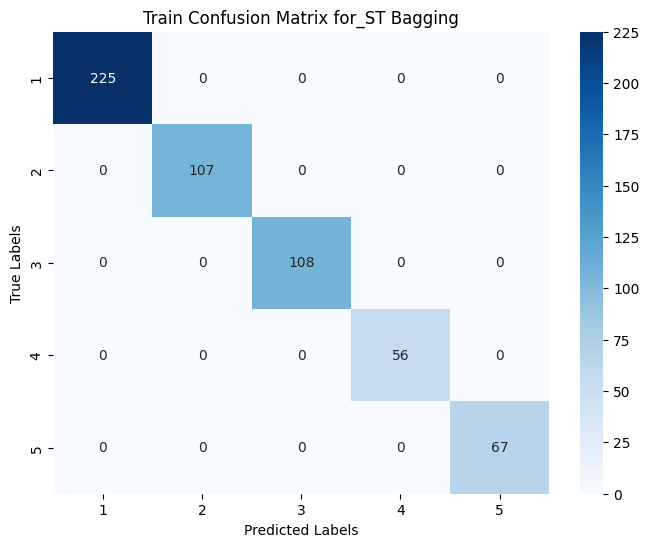

Validation Classification Report_ST:
{'1': {'precision': 0.5921052631578947, 'recall': 0.7377049180327869, 'f1-score': 0.656934306569343, 'support': 61.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 25.0}, '3': {'precision': 0.2857142857142857, 'recall': 0.5, 'f1-score': 0.36363636363636365, 'support': 8.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16.0}, '5': {'precision': 0.2727272727272727, 'recall': 0.6, 'f1-score': 0.375, 'support': 10.0}, 'accuracy': 0.4583333333333333, 'macro avg': {'precision': 0.23010936431989065, 'recall': 0.3675409836065574, 'f1-score': 0.2791141340411413, 'support': 120.0}, 'weighted avg': {'precision': 0.3427617338801549, 'recall': 0.4583333333333333, 'f1-score': 0.3894340300818403, 'support': 120.0}}


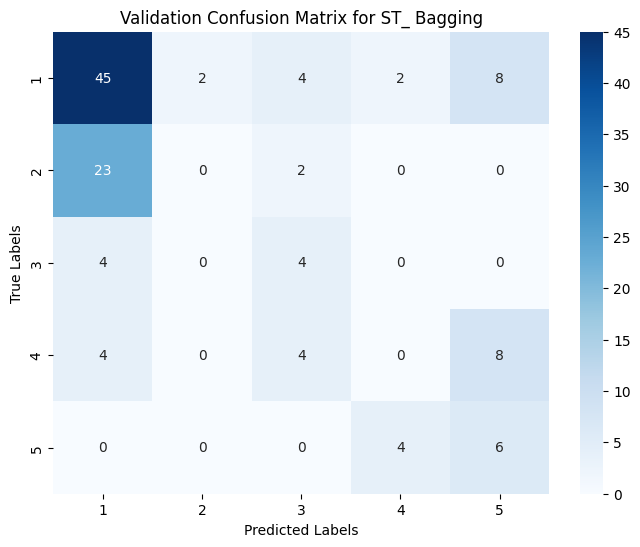

Test Classification Report_ST:
{'1': {'precision': 0.8163265306122449, 'recall': 0.8695652173913043, 'f1-score': 0.8421052631578947, 'support': 46.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 6.0}, '3': {'precision': 0.2, 'recall': 0.25, 'f1-score': 0.2222222222222222, 'support': 4.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 5.0}, '5': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0}, 'accuracy': 0.6612903225806451, 'macro avg': {'precision': 0.20326530612244897, 'recall': 0.22391304347826085, 'f1-score': 0.2128654970760234, 'support': 62.0}, 'weighted avg': {'precision': 0.6185648452929559, 'recall': 0.6612903225806451, 'f1-score': 0.6391246934540652, 'support': 62.0}}


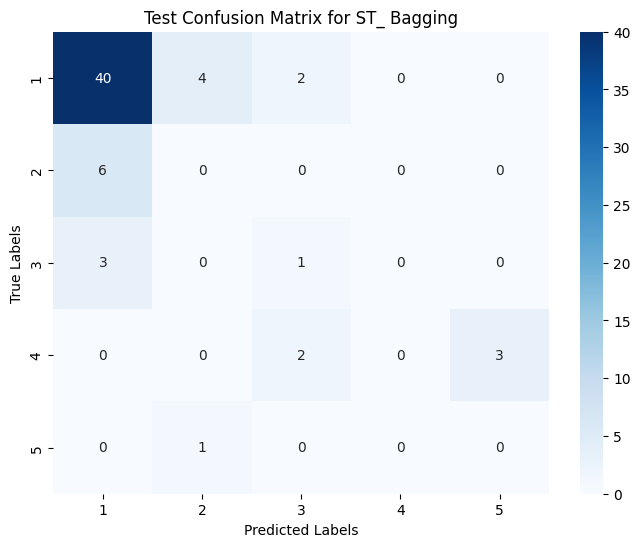

In [ ]:
# Define parameter grids for hyperparameter tuning
param_grids = {
    "SVM": {
        "classifier__C": [0.1, 1, 10, 100],
        "classifier__gamma": ["scale", "auto"],
        "classifier__kernel": ["linear", "rbf"]
    },
    "RandomForest": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    "LogisticRegression": {
        "classifier__C": [0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"]
    },
    "KNeighbors": {
        "classifier__n_neighbors": [3, 5, 7, 10],
        "classifier__weights": ["uniform", "distance"]
    },
    "NaiveBayes": {
        "classifier__alpha": [0.1, 0.5, 1.0]
    },
    "DecisionTree": {
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    # "GradientBoosting": {
    #     "classifier__n_estimators": [50, 100, 200],
    #     "classifier__learning_rate": [0.01, 0.1, 0.2],
    #     "classifier__max_depth": [3, 5, 7]
    # },
    "AdaBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__learning_rate": [0.01, 0.1, 1.0]
    },
    "Bagging": {
        "classifier__n_estimators": [10, 50, 100],
        "classifier__max_samples": [0.5, 0.7, 1.0]
    }
}

# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    # "GradientBoosting": Pipeline([
    #     ("classifier", GradientBoostingClassifier(random_state=1))
    # ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results_tuned = []

# Perform hyperparameter tuning and evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nHyperparameter tuning and evaluating {model_name} model:")

    # Perform Grid Search
    grid_search = GridSearchCV(pipeline, param_grid=param_grids[model_name], cv=3, scoring="accuracy")
    grid_search.fit(X_train, y_train)

    # Best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predict on train data
    best_model = grid_search.best_estimator_

     # Predict on train data
    y_train_pred = best_model.predict(X_train)
    train_accuracy_st_tune = accuracy_score(y_train, y_train_pred)
    train_precision_st_tune = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st_tune = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st_tune = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = best_model.predict(X_val)
    val_accuracy_st_tune = accuracy_score(y_val, y_val_pred)
    val_precision_st_tune = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st_tune = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st_tune = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = best_model.predict(X_test)
    test_accuracy_st_tune = accuracy_score(y_test, y_test_pred)
    test_precision_st_tune = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st_tune = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st_tune = f1_score(y_test, y_test_pred, average="weighted")


    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(train_report)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(val_report)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(test_report)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results_tuned.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results_tuned)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_tuned_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   1.000000  1.000000  1.000000    225.0
1        SVM  Train     2   1.000000  1.000000  1.000000    107.0
2        SVM  Train     3   1.000000  1.000000  1.000000    108.0
3        SVM  Train     4   1.000000  1.000000  1.000000     56.0
4        SVM  Train     5   1.000000  1.000000  1.000000     67.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     1   0.816327  0.869565  0.842105     46.0
116  Bagging   Test     2   0.000000  0.000000  0.000000      6.0
117  Bagging   Test     3   0.200000  0.250000  0.222222      4.0
118  Bagging   Test     4   0.000000  0.000000  0.000000      5.0
119  Bagging   Test     5   0.000000  0.000000  0.000000      1.0

[120 rows x 7 columns]


# METHOD 2: Target variable - Potential Accident Level, Data Augumentation - Synonymn, Synthetic data

## Test - Train split

In [ ]:
# Define target and features
X = dataset_cleaned_original.drop(['Potential_Accident_Level_Encoded'], axis=1)
y = dataset_cleaned_original['Potential_Accident_Level_Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(287, 62, 62)

In [ ]:
y.value_counts()

,count
Potential_Accident_Level_Encoded,
4,138
3,106
2,95
1,43
5,29


In [ ]:
train_dataset = pd.concat([X_train, y_train], axis=1).reset_index(drop=True)
val_dataset = pd.concat([X_val, y_val], axis=1).reset_index(drop=True)
test_dataset = pd.concat([X_test, y_test], axis=1).reset_index(drop=True)

In [ ]:
train_dataset.head()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Accident_Level_Encoded,Potential_Accident_Level_Encoded
0,Mining,I,IV,Male,Third Party,Projection of fragments,moment collaborator carried inspection conveye...,1,4
1,Mining,I,IV,Male,Third Party,Others,circumstance dump truck laden ore entered unlo...,1,4
2,Mining,I,III,Male,Third Party,Others,mechanical technical proceeded perform mainten...,1,3
3,Mining,II,IV,Male,Third Party,Others,aligning right bracket tower n releasing tensi...,2,4
4,Mining,I,IV,Male,Employee,Others,please inspection lumbo check list equipment o...,1,4


In [ ]:
train_dataset.shape

(287, 9)

## Functions for Data augmentation and synthetic data generation, Data augmentation (using synonymn for description and using probablity sampling for target variable) and synthetic row generation

#### Augument accident level

In [ ]:
def accident_level_augumentation(row):
  levels = [1, 2, 3, 4, 5]
  curent_accident_level_idx = levels.index(row['Accident_Level_Encoded'])
  len_accident_levels = len(levels)
  # probabilties for each level
  prob = np.zeros(len_accident_levels)
  for i in range(len_accident_levels):
    dis = abs(i - curent_accident_level_idx)
    prob[i] = max(1/(1+dis), 0.05)
  prob /=prob.sum()
  new_accident_level = np.random.choice(levels,p=prob)
  return new_accident_level

#### Augument potential accident level

In [ ]:
def potential_accident_level_augumentation(accident_level):
  levels = [1, 2, 3, 4, 5]
  curent_potential_accident_level_idx = levels.index(accident_level)
  potential_idx = np.random.randint(curent_potential_accident_level_idx, len(levels))
  return levels[potential_idx]

#### Augument translated description

In [ ]:
def description_augumentation(description):
  words = description.split()
  words_augumented = []
  for word in words:
    word_synonyms = wordnet.synsets(word)
    if word_synonyms and random.random() < 0.2:
      word_synonym = word_synonyms[0].lemmas()[0].name().replace('_', ' ')
      words_augumented.append(word_synonym)
    else:
      words_augumented.append(word)
  return ' '.join(words_augumented)

#### Synthetic row generate function

In [ ]:
def synthetic_row_generate(row):
  extra_row = row.copy()
  extra_row['Accident_Level_Encoded'] = accident_level_augumentation(row)
  extra_row['Potential_Accident_Level_Encoded'] = potential_accident_level_augumentation(extra_row['Accident_Level_Encoded'])
  extra_row['Translated_Description'] = description_augumentation(row['Translated_Description'])
  return extra_row

## Apply augumentation and generate synthetic data for train


In [ ]:
train_dataset['Augmented_Accident_Level'] = train_dataset.apply(accident_level_augumentation, axis=1)
train_dataset['Augmented_Potential_Accident_Level'] = train_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
train_dataset['Augmented_Description'] = train_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_train = pd.DataFrame([synthetic_row_generate(row) for _, row in train_dataset.iterrows()])

In [ ]:
train_dataset_final = pd.concat([train_dataset, synthetic_data_train], ignore_index=True)
print(train_dataset_final.duplicated().sum())
train_dataset_final.drop_duplicates(inplace=True)
# Calculate the correlation between Accident Level and Potential Accident Level for training set

from scipy.stats import spearmanr

# Calculate Spearman's rank correlation
correlation, p_value = spearmanr(train_dataset_final['Augmented_Accident_Level'], train_dataset_final['Augmented_Potential_Accident_Level'])

# Display results
print("Spearman Correlation:", correlation)
print("P-Value:", p_value)

train_dataset_final.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final_potential_level.csv', index=False)

7
Spearman Correlation: 0.4864019702739495
P-Value: 5.198570008614223e-35


In [ ]:
train_dataset_final.shape

(567, 12)

In [ ]:
train_dataset_final.tail()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Accident_Level_Encoded,Potential_Accident_Level_Encoded,Augmented_Accident_Level,Augmented_Potential_Accident_Level,Augmented_Description
569,Metals,I,III,Male,Third Party (Remote),Fall,employee transition grs area came slip sufferi...,1,2,1,4,employee transition grs area came slip sufferi...
570,Metals,I,III,Male,Third Party (Remote),Pressurized Systems,unloading operation ustulado bag need uncle di...,2,5,5,5,unloading operation ustulado bag need uncle di...
571,Others,I,I,Male,Third Party,Others,region povoado vista martin pole cerium employ...,1,2,3,4,region povoado vista Martin pole ce employee d...
572,Mining,II,V,Male,Third Party,Vehicles and Mobile Equipment,mixed em incimmet sa moved positive South camp...,4,4,4,5,mixed em incimmet SA moved positive south camp...
573,Metals,IV,IV,Male,Employee,Suspended Loads,section row cell worker perform anode lifting ...,3,3,2,2,section row cell worker perform anode lifting ...


## Apply augumentation and generate synthetic data for validation

In [ ]:
val_dataset['Augmented_Accident_Level'] = val_dataset.apply(accident_level_augumentation, axis=1)
val_dataset['Augmented_Potential_Accident_Level'] = val_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
val_dataset['Augmented_Description'] = val_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_val = pd.DataFrame([synthetic_row_generate(row) for _, row in val_dataset.iterrows()])

val_dataset_final = pd.concat([val_dataset, synthetic_data_val], ignore_index=True)
print(val_dataset_final.duplicated().sum())
val_dataset_final.drop_duplicates(inplace=True)
val_dataset_final.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/val_dataset_final_potential_level.csv', index=False)

0


In [ ]:
print(train_dataset_final['Accident_Level_Encoded'].value_counts())
print(train_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(train_dataset_final['Augmented_Accident_Level'].value_counts())
print(train_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    314
2     88
4     71
3     59
5     35
Name: count, dtype: int64
Potential_Accident_Level_Encoded
4    170
3    126
5    116
2    107
1     48
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    225
2    116
3    109
5     63
4     54
Name: count, dtype: int64
Augmented_Potential_Accident_Level
5    205
4    126
3    120
2     76
1     40
Name: count, dtype: int64


In [ ]:
print(val_dataset_final['Accident_Level_Encoded'].value_counts())
print(val_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(val_dataset_final['Augmented_Accident_Level'].value_counts())
print(val_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    62
3    23
2    20
5    10
4     9
Name: count, dtype: int64
Potential_Accident_Level_Encoded
4    34
3    28
5    28
2    21
1    13
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    38
2    32
3    32
5    16
4     6
Name: count, dtype: int64
Augmented_Potential_Accident_Level
5    52
4    34
3    20
2    14
1     4
Name: count, dtype: int64


## Sentence transformer

In [ ]:
train_dataset_final = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final_potential_level.csv')
val_dataset_final = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/val_dataset_final_potential_level.csv')

In [ ]:
dataset_1 = train_dataset_final[['Industry_Sector','Augmented_Accident_Level']]
dataset_1 = pd.get_dummies(dataset_1, columns=['Industry_Sector'], drop_first=True)
print(dataset_1.head())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(train_dataset_final['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_train = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_train = pd.concat([dataset_1.reset_index(drop=True), embedding_df_train], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_train.head())


   Augmented_Accident_Level  Industry_Sector_Mining  Industry_Sector_Others
0                         1                    True                   False
1                         2                    True                   False
2                         3                    True                   False
3                         5                    True                   False
4                         1                    True                   False


Batches:   0%|          | 0/18 [00:00<?, ?it/s]

Embedding Shape: (567, 384)
   Augmented_Accident_Level  Industry_Sector_Mining  Industry_Sector_Others  \
0                         1                    True                   False   
1                         2                    True                   False   
2                         3                    True                   False   
3                         5                    True                   False   
4                         1                    True                   False   

   Embedding_0  Embedding_1  Embedding_2  Embedding_3  Embedding_4  \
0    -0.051891     0.030307     0.094710     0.034420     0.023672   
1     0.001297     0.003289     0.050394     0.042341    -0.036759   
2    -0.085955     0.035032     0.034477     0.012709     0.022356   
3    -0.069334     0.050890     0.003910    -0.005968    -0.159781   
4    -0.003840    -0.044159     0.078440    -0.006373     0.069602   

   Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  Embedding_37

In [ ]:
dataset_2 = val_dataset_final[['Industry_Sector','Augmented_Accident_Level']]
dataset_2 = pd.get_dummies(dataset_2, columns=['Industry_Sector'], drop_first=True)
print(dataset_2.head())
for col in dataset_2.columns:
    print(dataset_2[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(val_dataset_final['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_val = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_val = pd.concat([dataset_2.reset_index(drop=True), embedding_df_val], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_val.head())

   Augmented_Accident_Level  Industry_Sector_Mining  Industry_Sector_Others
0                         2                   False                   False
1                         1                   False                   False
2                         4                   False                   False
3                         1                    True                   False
4                         3                    True                   False
[2 1 4 3 5]
[False  True]
[False  True]


Batches:   0%|          | 0/4 [00:00<?, ?it/s]

Embedding Shape: (124, 384)
   Augmented_Accident_Level  Industry_Sector_Mining  Industry_Sector_Others  \
0                         2                   False                   False   
1                         1                   False                   False   
2                         4                   False                   False   
3                         1                    True                   False   
4                         3                    True                   False   

   Embedding_0  Embedding_1  Embedding_2  Embedding_3  Embedding_4  \
0    -0.068859     0.019475    -0.041841    -0.028936    -0.053420   
1    -0.058031     0.048271     0.098403     0.036359     0.094906   
2    -0.003845    -0.022418     0.087758     0.014925    -0.032774   
3    -0.114157     0.028994     0.013746    -0.028788    -0.031584   
4    -0.002422     0.039511     0.068759    -0.005726    -0.113015   

   Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  Embedding_37

In [ ]:
dataset_3 = test_dataset[['Industry_Sector','Accident_Level_Encoded']]
dataset_3 = pd.get_dummies(dataset_3, columns=['Industry_Sector'], drop_first=True)
print(dataset_3.head())
for col in dataset_3.columns:
    print(dataset_3[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(test_dataset['Translated_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_test = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_test = pd.concat([dataset_3.reset_index(drop=True), embedding_df_test], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_test.head())

   Accident_Level_Encoded  Industry_Sector_Mining  Industry_Sector_Others
0                       1                   False                    True
1                       1                    True                   False
2                       1                    True                   False
3                       1                   False                   False
4                       1                   False                    True
[1 4 5 3 2]
[False  True]
[ True False]


Batches:   0%|          | 0/2 [00:00<?, ?it/s]

Embedding Shape: (62, 384)
   Accident_Level_Encoded  Industry_Sector_Mining  Industry_Sector_Others  \
0                       1                   False                    True   
1                       1                    True                   False   
2                       1                    True                   False   
3                       1                   False                   False   
4                       1                   False                    True   

   Embedding_0  Embedding_1  Embedding_2  Embedding_3  Embedding_4  \
0    -0.022400     0.062483     0.079677    -0.001679    -0.023498   
1    -0.095470     0.045174     0.000306    -0.005226    -0.056687   
2    -0.065827    -0.029026     0.075985    -0.013752     0.040360   
3     0.054801     0.021772     0.080981     0.003338     0.035736   
4     0.040250     0.007201     0.070623    -0.002933     0.057667   

   Embedding_5  Embedding_6  ...  Embedding_374  Embedding_375  Embedding_376  \
0    -0.

In [ ]:
X_train = dataset_with_embeddings_train.rename(columns={'Augmented_Accident_Level':'Final_Accident_Level'})
y_train = train_dataset_final['Augmented_Potential_Accident_Level'].rename('Final_Potential_Accident_Level')
print(X_train.columns)
print("*"*100)
print(y_train)
print("%"*100)
X_val = dataset_with_embeddings_val.rename(columns={'Augmented_Accident_Level':'Final_Accident_Level'})
y_val = val_dataset_final['Augmented_Potential_Accident_Level'].rename('Final_Potential_Accident_Level')
print(X_val.columns)
print("*"*100)
print(y_val)

Index(['Final_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=387)
****************************************************************************************************
0      4
1      3
2      4
3      5
4      1
      ..
562    4
563    5
564    4
565    5
566    2
Name: Final_Potential_Accident_Level, Length: 567, dtype: int64
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Index(['Final_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embeddin

In [ ]:
X_test = dataset_with_embeddings_test.rename(columns={'Accident_Level_Encoded':'Final_Accident_Level'})
y_test = test_dataset['Potential_Accident_Level_Encoded'].rename('Final_Potential_Accident_Level')
print(X_test.columns)
print("*"*100)
print(y_test)

Index(['Final_Accident_Level', 'Industry_Sector_Mining',
       'Industry_Sector_Others', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=387)
****************************************************************************************************
0     2
1     3
2     4
3     1
4     1
     ..
57    4
58    2
59    4
60    3
61    3
Name: Final_Potential_Accident_Level, Length: 62, dtype: int64


## Model pipeline without tuning


Evaluating SVM model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.28      1.00      0.43        40
           2       0.34      0.74      0.47        76
           3       0.68      0.42      0.52       120
           4       0.49      0.47      0.48       126
           5       1.00      0.32      0.48       205

    accuracy                           0.48       567
   macro avg       0.56      0.59      0.48       567
weighted avg       0.68      0.48      0.48       567



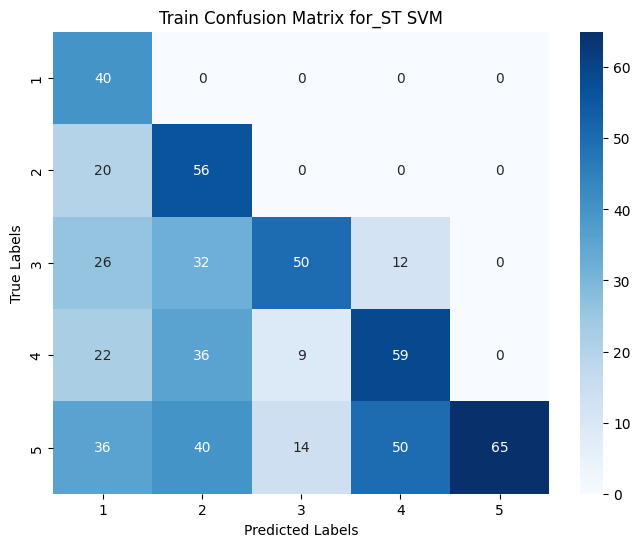

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.10      0.50      0.17         4
           2       0.23      0.71      0.34        14
           3       0.25      0.20      0.22        20
           4       0.36      0.29      0.32        34
           5       1.00      0.31      0.47        52

    accuracy                           0.34       124
   macro avg       0.39      0.40      0.31       124
weighted avg       0.59      0.34      0.37       124



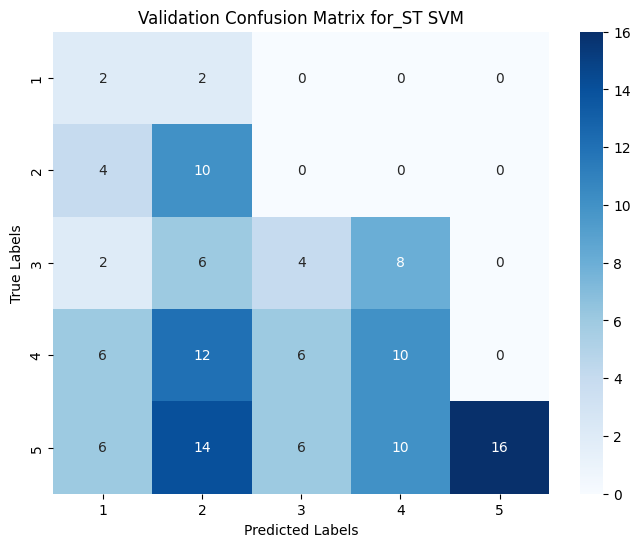

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.15      0.57      0.24         7
           2       0.27      0.40      0.32        15
           3       0.00      0.00      0.00        16
           4       0.75      0.30      0.43        20
           5       0.67      0.50      0.57         4

    accuracy                           0.29        62
   macro avg       0.37      0.35      0.31        62
weighted avg       0.37      0.29      0.28        62



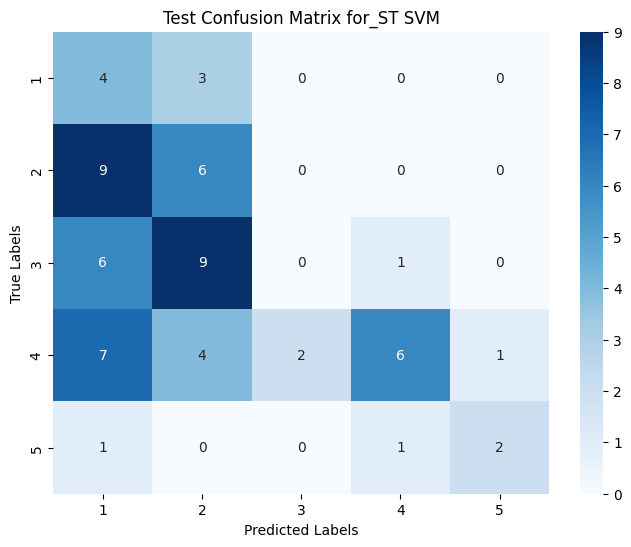


Evaluating RandomForest model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        76
           3       1.00      1.00      1.00       120
           4       1.00      1.00      1.00       126
           5       1.00      1.00      1.00       205

    accuracy                           1.00       567
   macro avg       1.00      1.00      1.00       567
weighted avg       1.00      1.00      1.00       567



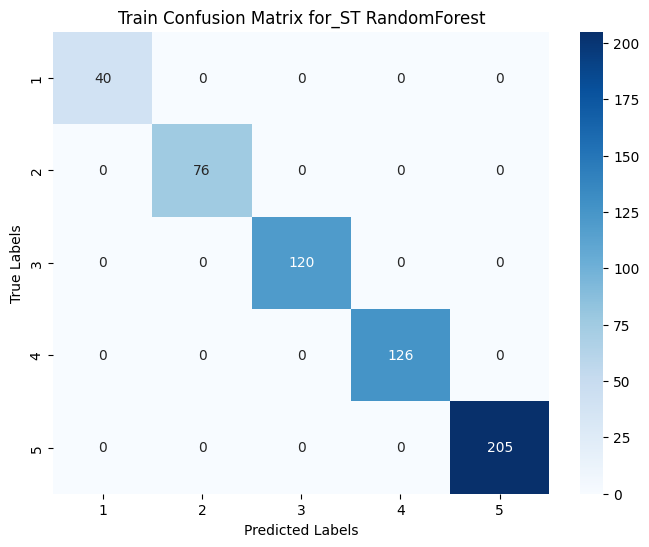

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        14
           3       0.11      0.10      0.11        20
           4       0.00      0.00      0.00        34
           5       0.38      0.73      0.50        52

    accuracy                           0.32       124
   macro avg       0.10      0.17      0.12       124
weighted avg       0.18      0.32      0.23       124



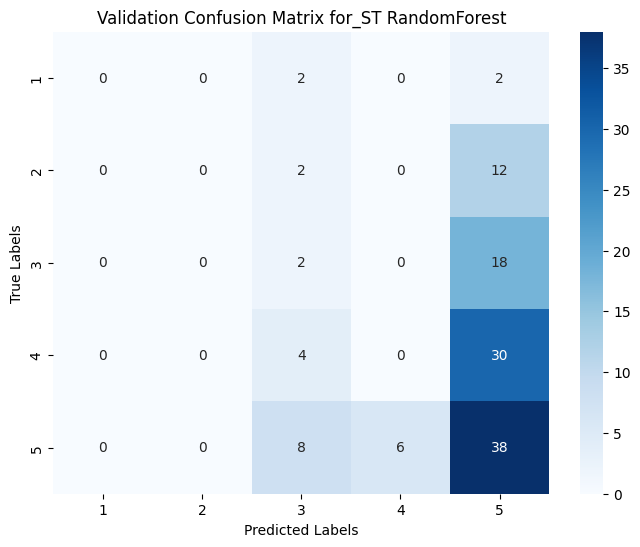

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.00      0.00      0.00        15
           3       0.75      0.19      0.30        16
           4       0.33      0.05      0.09        20
           5       0.07      1.00      0.14         4

    accuracy                           0.13        62
   macro avg       0.23      0.25      0.10        62
weighted avg       0.31      0.13      0.11        62



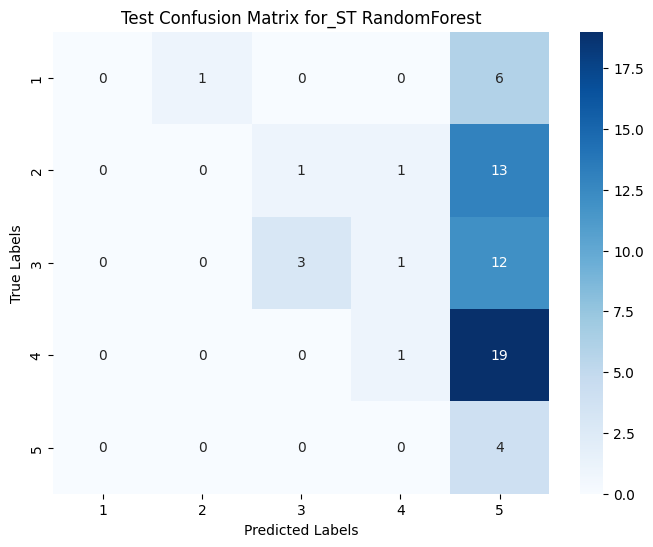


Evaluating LogisticRegression model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.55      1.00      0.71        40
           2       0.58      0.92      0.71        76
           3       0.82      0.75      0.78       120
           4       0.80      0.62      0.70       126
           5       0.82      0.67      0.74       205

    accuracy                           0.73       567
   macro avg       0.71      0.79      0.73       567
weighted avg       0.77      0.73      0.73       567



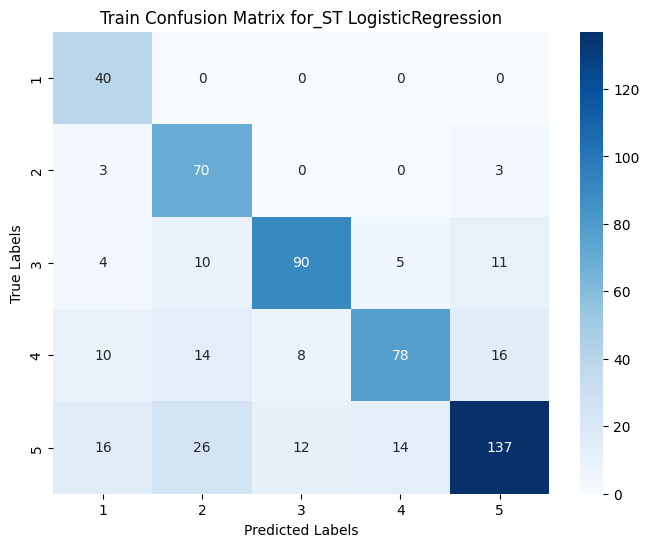

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.12      0.50      0.20         4
           2       0.11      0.14      0.12        14
           3       0.25      0.30      0.27        20
           4       0.22      0.12      0.15        34
           5       0.50      0.46      0.48        52

    accuracy                           0.31       124
   macro avg       0.24      0.30      0.25       124
weighted avg       0.33      0.31      0.31       124



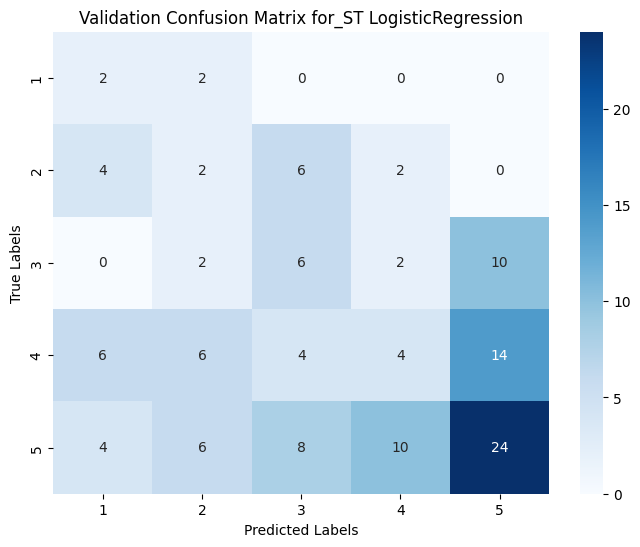

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.09      0.29      0.13         7
           2       0.43      0.40      0.41        15
           3       0.29      0.12      0.17        16
           4       0.75      0.30      0.43        20
           5       0.30      0.75      0.43         4

    accuracy                           0.31        62
   macro avg       0.37      0.37      0.32        62
weighted avg       0.45      0.31      0.33        62



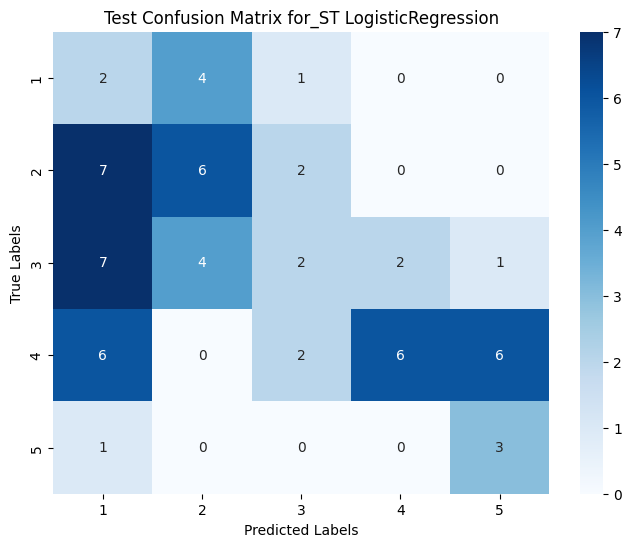


Evaluating KNeighbors model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.72      0.90      0.80        40
           2       0.70      0.84      0.76        76
           3       0.61      0.78      0.68       120
           4       0.73      0.71      0.72       126
           5       0.89      0.65      0.75       205

    accuracy                           0.73       567
   macro avg       0.73      0.78      0.74       567
weighted avg       0.76      0.73      0.74       567



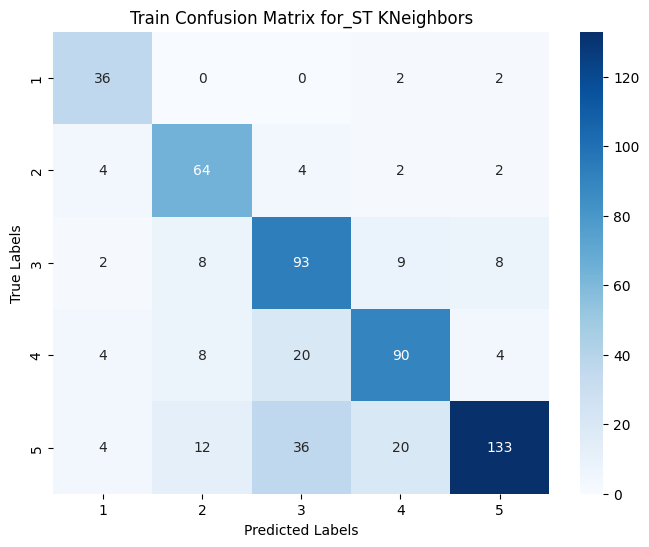

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.25      0.43      0.32        14
           3       0.10      0.20      0.13        20
           4       0.36      0.24      0.29        34
           5       0.56      0.38      0.45        52

    accuracy                           0.31       124
   macro avg       0.25      0.25      0.24       124
weighted avg       0.38      0.31      0.33       124



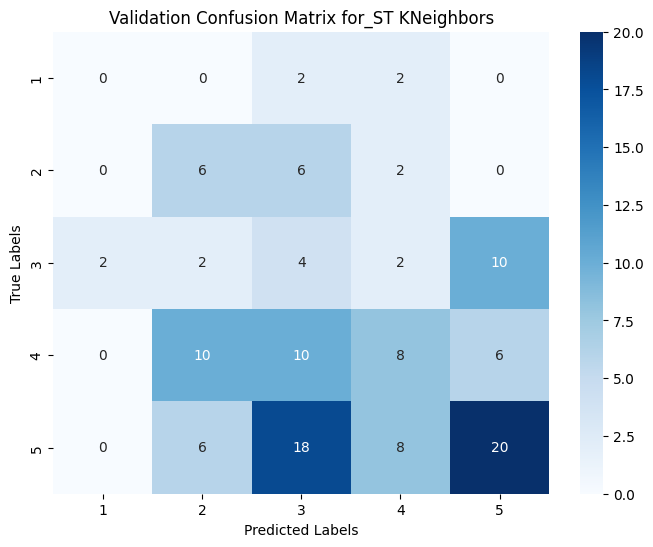

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.47      0.47      0.47        15
           3       0.27      0.19      0.22        16
           4       0.67      0.30      0.41        20
           5       0.23      0.75      0.35         4

    accuracy                           0.31        62
   macro avg       0.33      0.34      0.29        62
weighted avg       0.41      0.31      0.33        62



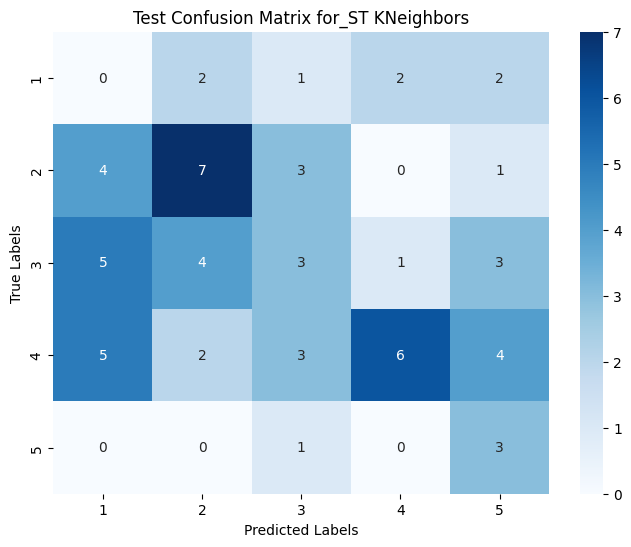


Evaluating NaiveBayes model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      0.15      0.26        40
           2       0.90      0.24      0.38        76
           3       0.59      0.50      0.54       120
           4       0.71      0.25      0.37       126
           5       0.47      0.91      0.62       205

    accuracy                           0.53       567
   macro avg       0.73      0.41      0.44       567
weighted avg       0.65      0.53      0.49       567



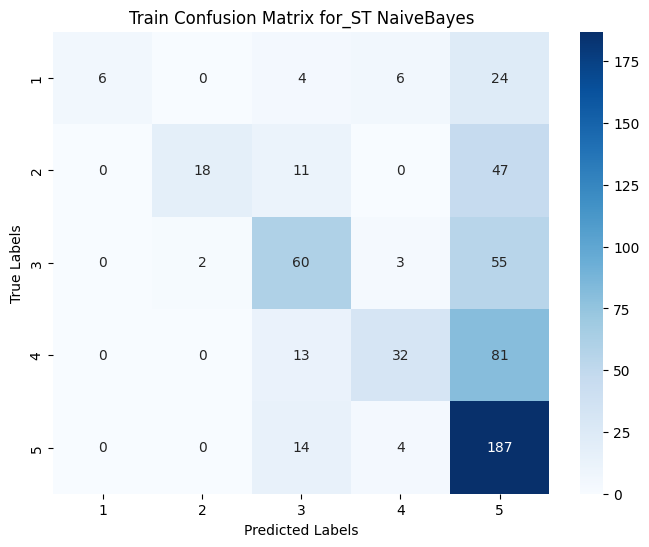

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00        14
           3       0.20      0.20      0.20        20
           4       0.20      0.06      0.09        34
           5       0.36      0.65      0.47        52

    accuracy                           0.32       124
   macro avg       0.15      0.18      0.15       124
weighted avg       0.24      0.32      0.25       124



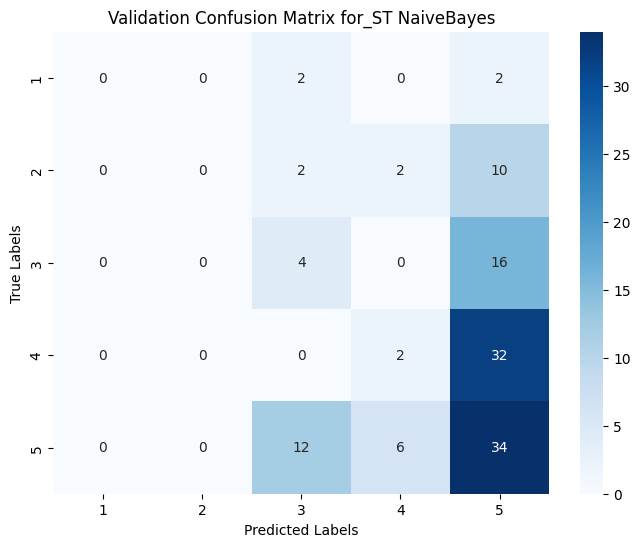

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.00      0.00      0.00        15
           3       0.33      0.31      0.32        16
           4       0.31      0.20      0.24        20
           5       0.09      0.75      0.16         4

    accuracy                           0.19        62
   macro avg       0.15      0.25      0.14        62
weighted avg       0.19      0.19      0.17        62



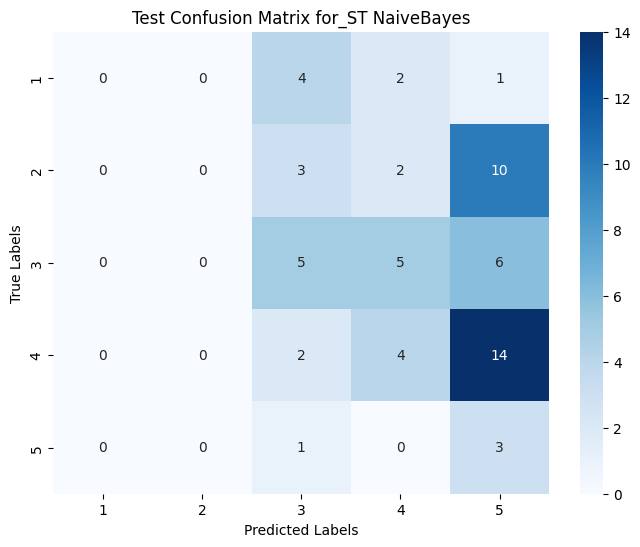


Evaluating DecisionTree model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        76
           3       1.00      1.00      1.00       120
           4       1.00      1.00      1.00       126
           5       1.00      1.00      1.00       205

    accuracy                           1.00       567
   macro avg       1.00      1.00      1.00       567
weighted avg       1.00      1.00      1.00       567



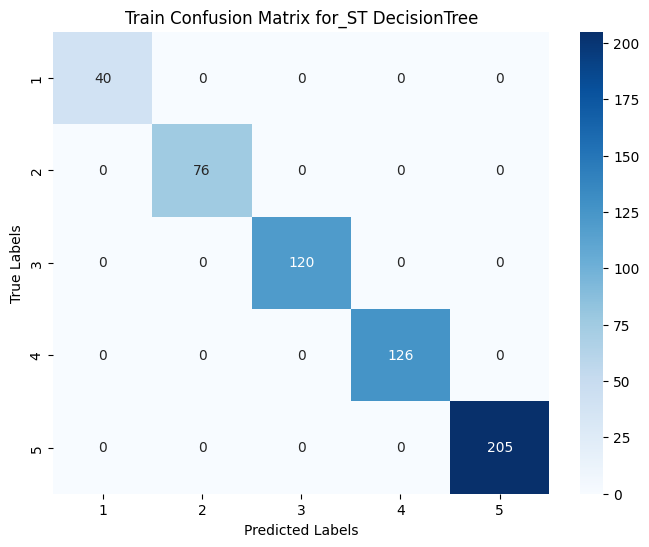

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.20      0.29      0.24        14
           3       0.23      0.30      0.26        20
           4       0.30      0.18      0.22        34
           5       0.62      0.62      0.62        52

    accuracy                           0.39       124
   macro avg       0.27      0.28      0.27       124
weighted avg       0.40      0.39      0.39       124



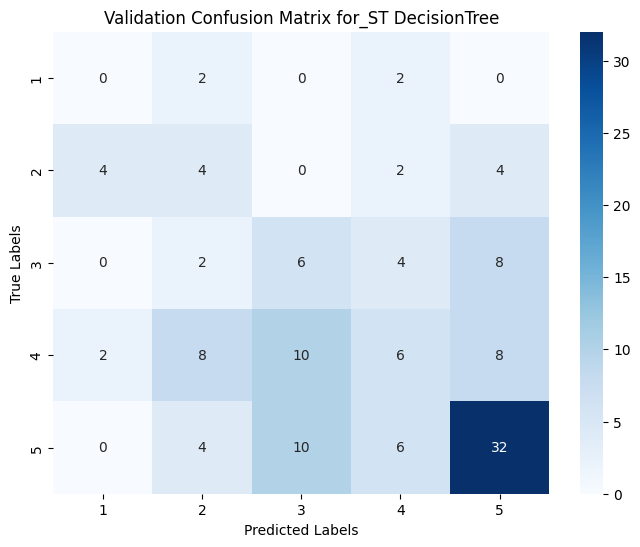

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.25      0.29      0.27         7
           2       0.17      0.13      0.15        15
           3       0.25      0.19      0.21        16
           4       0.21      0.15      0.18        20
           5       0.12      0.50      0.20         4

    accuracy                           0.19        62
   macro avg       0.20      0.25      0.20        62
weighted avg       0.21      0.19      0.19        62



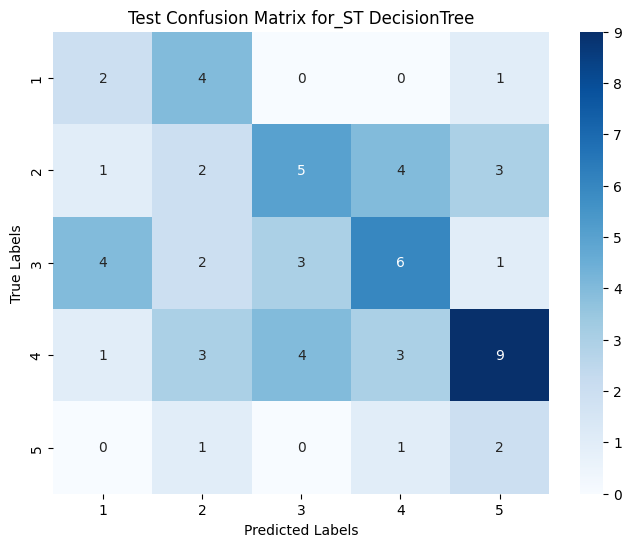


Evaluating GradientBoosting model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        76
           3       1.00      1.00      1.00       120
           4       1.00      1.00      1.00       126
           5       1.00      1.00      1.00       205

    accuracy                           1.00       567
   macro avg       1.00      1.00      1.00       567
weighted avg       1.00      1.00      1.00       567



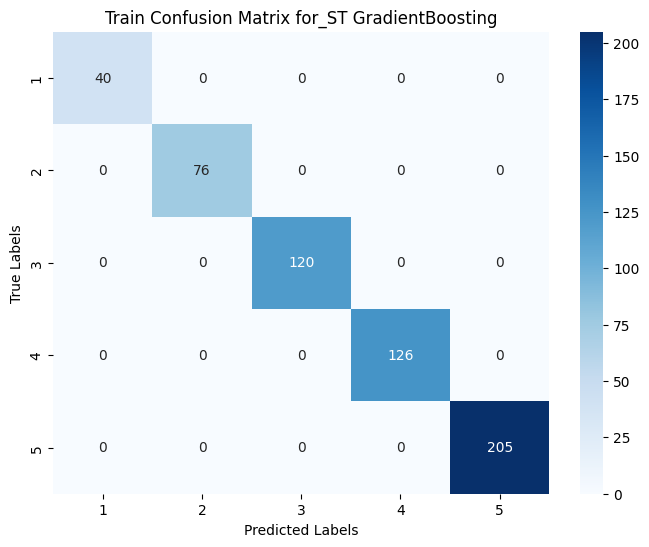

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.09      0.14      0.11        14
           3       0.17      0.20      0.18        20
           4       0.40      0.24      0.30        34
           5       0.52      0.58      0.55        52

    accuracy                           0.35       124
   macro avg       0.23      0.23      0.23       124
weighted avg       0.36      0.35      0.35       124



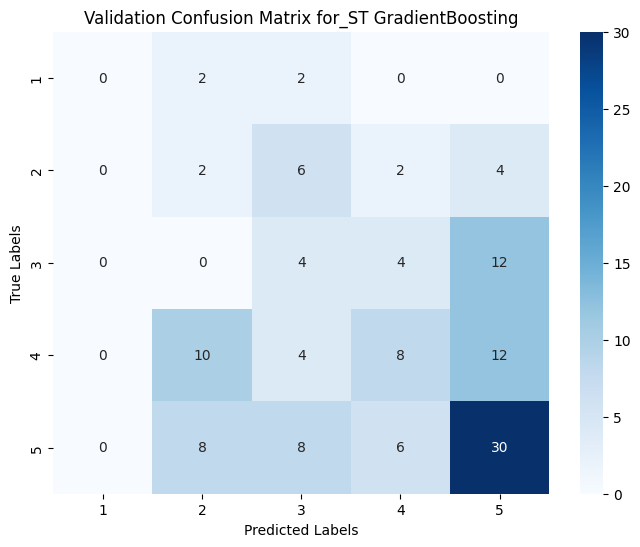

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.50      0.27      0.35        15
           3       0.29      0.12      0.17        16
           4       0.24      0.25      0.24        20
           5       0.08      0.50      0.13         4

    accuracy                           0.21        62
   macro avg       0.22      0.23      0.18        62
weighted avg       0.28      0.21      0.22        62



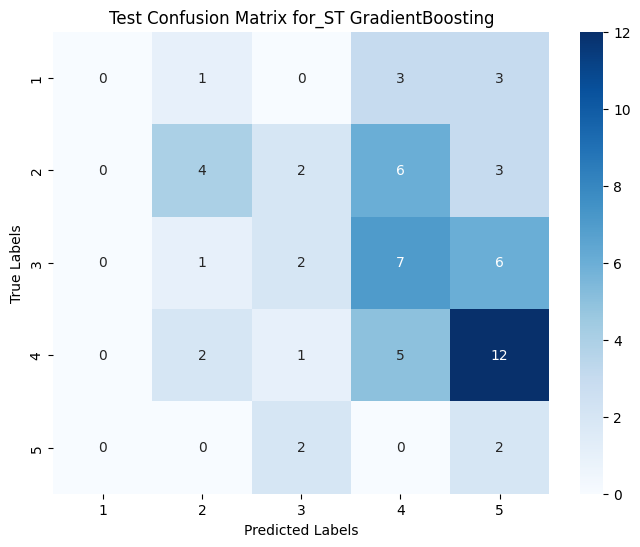


Evaluating AdaBoost model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.93      0.70      0.80        40
           2       0.66      0.50      0.57        76
           3       0.52      0.57      0.54       120
           4       0.43      0.60      0.50       126
           5       0.67      0.56      0.61       205

    accuracy                           0.57       567
   macro avg       0.64      0.59      0.60       567
weighted avg       0.60      0.57      0.58       567



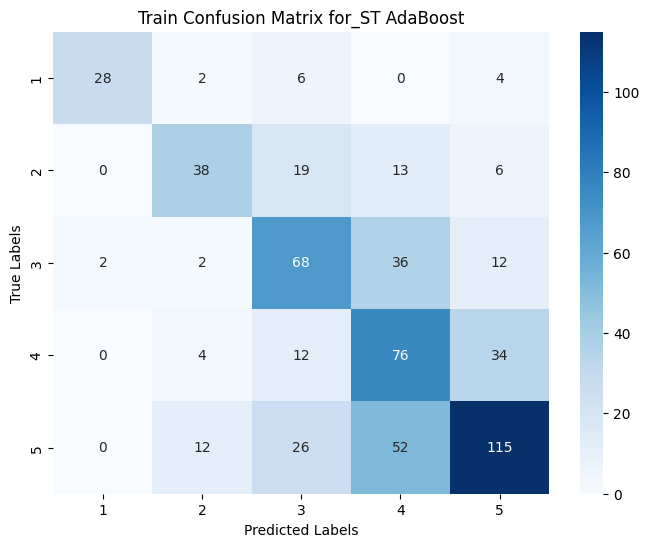

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.25      0.14      0.18        14
           3       0.11      0.30      0.16        20
           4       0.23      0.18      0.20        34
           5       0.67      0.46      0.55        52

    accuracy                           0.31       124
   macro avg       0.25      0.22      0.22       124
weighted avg       0.39      0.31      0.33       124



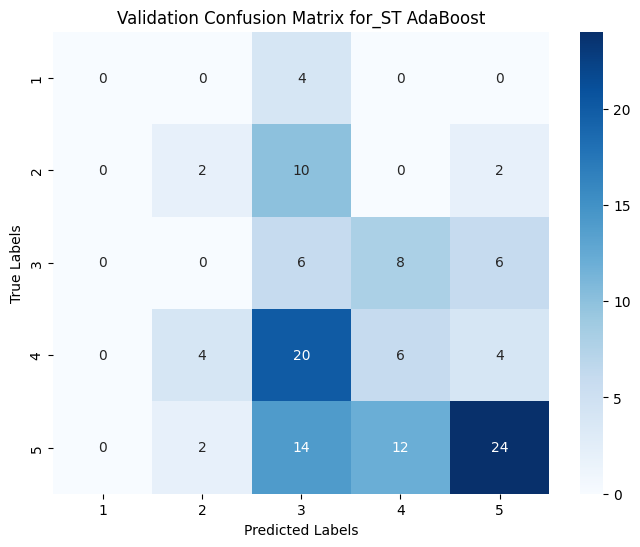

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.50      0.20      0.29        15
           3       0.22      0.38      0.28        16
           4       0.47      0.40      0.43        20
           5       0.18      0.50      0.27         4

    accuracy                           0.31        62
   macro avg       0.27      0.30      0.25        62
weighted avg       0.34      0.31      0.30        62



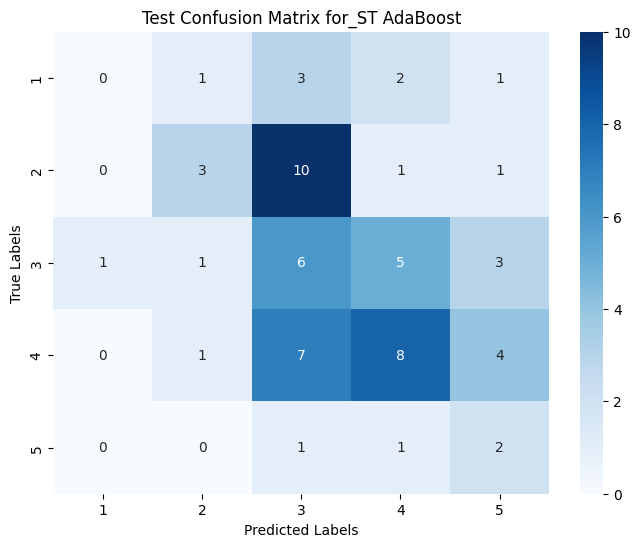


Evaluating Bagging model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        76
           3       1.00      1.00      1.00       120
           4       1.00      1.00      1.00       126
           5       1.00      1.00      1.00       205

    accuracy                           1.00       567
   macro avg       1.00      1.00      1.00       567
weighted avg       1.00      1.00      1.00       567



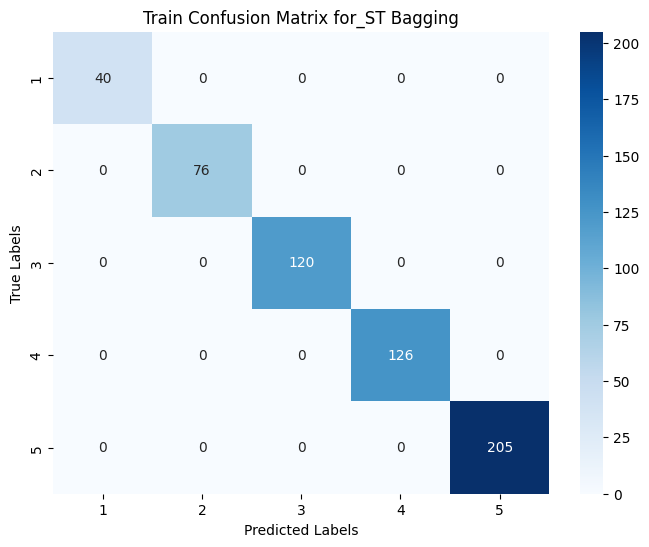

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.67      1.00      0.80         4
           2       0.10      0.14      0.12        14
           3       0.15      0.20      0.17        20
           4       0.25      0.18      0.21        34
           5       0.54      0.50      0.52        52

    accuracy                           0.34       124
   macro avg       0.34      0.40      0.36       124
weighted avg       0.35      0.34      0.34       124



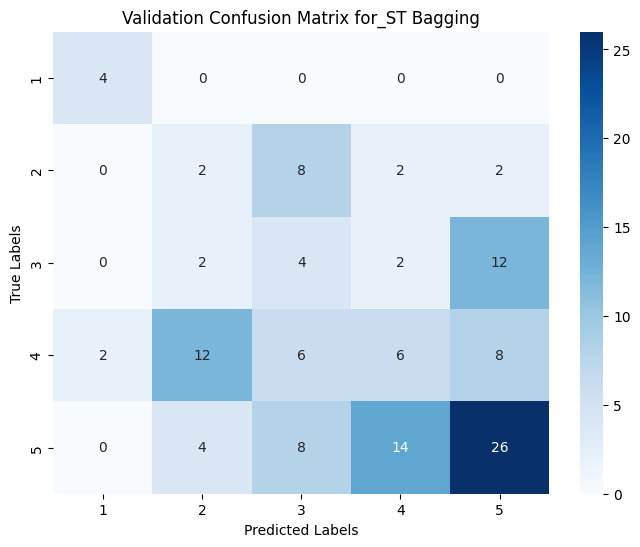

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.33      0.14      0.20         7
           2       0.33      0.33      0.33        15
           3       0.38      0.31      0.34        16
           4       0.43      0.30      0.35        20
           5       0.18      0.75      0.29         4

    accuracy                           0.32        62
   macro avg       0.33      0.37      0.30        62
weighted avg       0.37      0.32      0.32        62



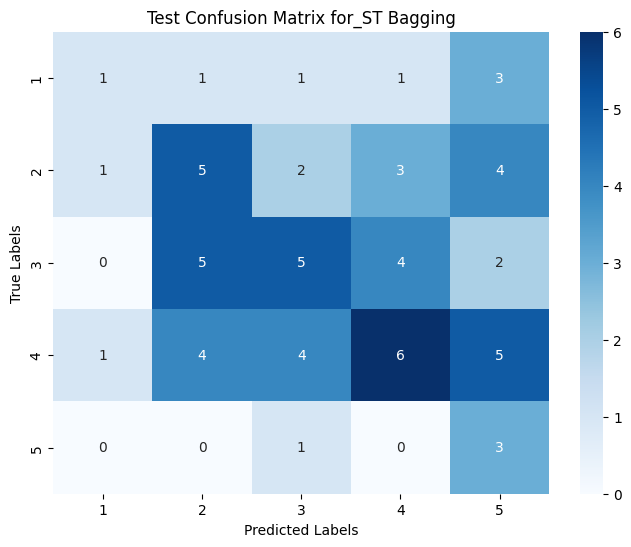

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler

# Define pipelines for each model_ST
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    "GradientBoosting": Pipeline([
        ("classifier", GradientBoostingClassifier(random_state=1))
    ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}
results = []
# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Train the model
    pipeline.fit(X_train, y_train)

     # Predict on train data
    y_train_pred = pipeline.predict(X_train)
    train_accuracy_st = accuracy_score(y_train, y_train_pred)
    train_precision_st = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = pipeline.predict(X_val)
    val_accuracy_st = accuracy_score(y_val, y_val_pred)
    val_precision_st = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = pipeline.predict(X_test)
    test_accuracy_st = accuracy_score(y_test, y_test_pred)
    test_precision_st = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st = f1_score(y_test, y_test_pred, average="weighted")

    # Predict on train data
    #y_train_pred = pipeline.predict(X_train)
    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(classification_report(y_train, y_train_pred))

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
   # y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(classification_report(y_val, y_val_pred))

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    #y_test_pred = pipeline.predict(X_test)
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df = pd.DataFrame(results)
print(results_df)
results_df.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_potential_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   0.277778  1.000000  0.434783     40.0
1        SVM  Train     2   0.341463  0.736842  0.466667     76.0
2        SVM  Train     3   0.684932  0.416667  0.518135    120.0
3        SVM  Train     4   0.487603  0.468254  0.477733    126.0
4        SVM  Train     5   1.000000  0.317073  0.481481    205.0
..       ...    ...   ...        ...       ...       ...      ...
130  Bagging   Test     1   0.333333  0.142857  0.200000      7.0
131  Bagging   Test     2   0.333333  0.333333  0.333333     15.0
132  Bagging   Test     3   0.384615  0.312500  0.344828     16.0
133  Bagging   Test     4   0.428571  0.300000  0.352941     20.0
134  Bagging   Test     5   0.176471  0.750000  0.285714      4.0

[135 rows x 7 columns]


## Hyperparameter Tuning- Sentence Transformer


Hyperparameter tuning and evaluating SVM model:
Best parameters for SVM: {'classifier__C': 100, 'classifier__gamma': 'scale', 'classifier__kernel': 'linear'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 76.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 120.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 205.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}}


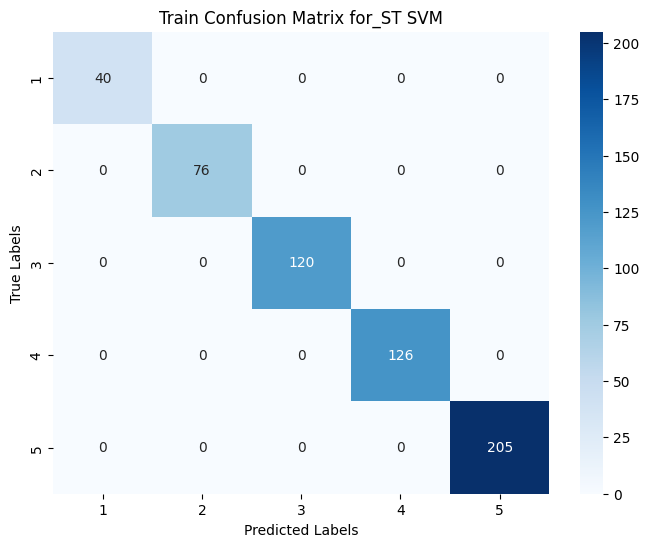

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.2857142857142857, 'recall': 0.2857142857142857, 'f1-score': 0.2857142857142857, 'support': 14.0}, '3': {'precision': 0.13333333333333333, 'recall': 0.2, 'f1-score': 0.16, 'support': 20.0}, '4': {'precision': 0.35294117647058826, 'recall': 0.35294117647058826, 'f1-score': 0.35294117647058826, 'support': 34.0}, '5': {'precision': 0.5263157894736842, 'recall': 0.38461538461538464, 'f1-score': 0.4444444444444444, 'support': 52.0}, 'accuracy': 0.3225806451612903, 'macro avg': {'precision': 0.25966091699837823, 'recall': 0.24465416936005174, 'f1-score': 0.2486199813258637, 'support': 124.0}, 'weighted avg': {'precision': 0.37125070741369554, 'recall': 0.3225806451612903, 'f1-score': 0.34121863799283153, 'support': 124.0}}


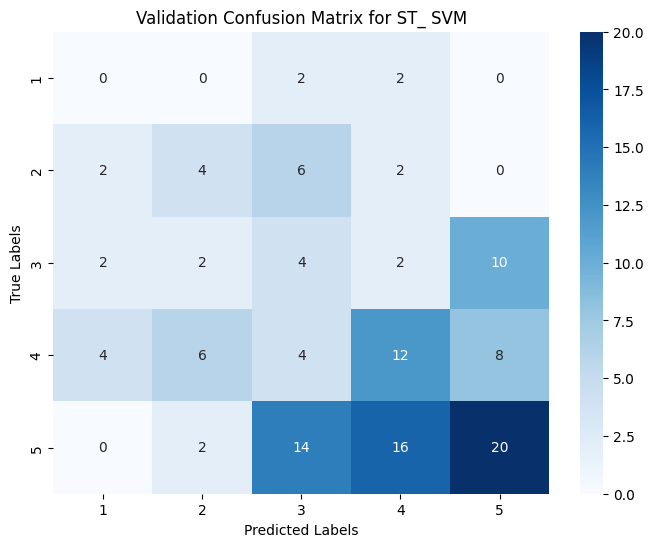

Test Classification Report_ST:
{'1': {'precision': 0.0625, 'recall': 0.14285714285714285, 'f1-score': 0.08695652173913043, 'support': 7.0}, '2': {'precision': 0.5333333333333333, 'recall': 0.5333333333333333, 'f1-score': 0.5333333333333333, 'support': 15.0}, '3': {'precision': 0.2222222222222222, 'recall': 0.125, 'f1-score': 0.16, 'support': 16.0}, '4': {'precision': 0.3, 'recall': 0.15, 'f1-score': 0.2, 'support': 20.0}, '5': {'precision': 0.16666666666666666, 'recall': 0.5, 'f1-score': 0.25, 'support': 4.0}, 'accuracy': 0.25806451612903225, 'macro avg': {'precision': 0.2569444444444445, 'recall': 0.2902380952380953, 'f1-score': 0.24605797101449278, 'support': 62.0}, 'weighted avg': {'precision': 0.30096326164874554, 'recall': 0.25806451612903225, 'f1-score': 0.26078541374474057, 'support': 62.0}}


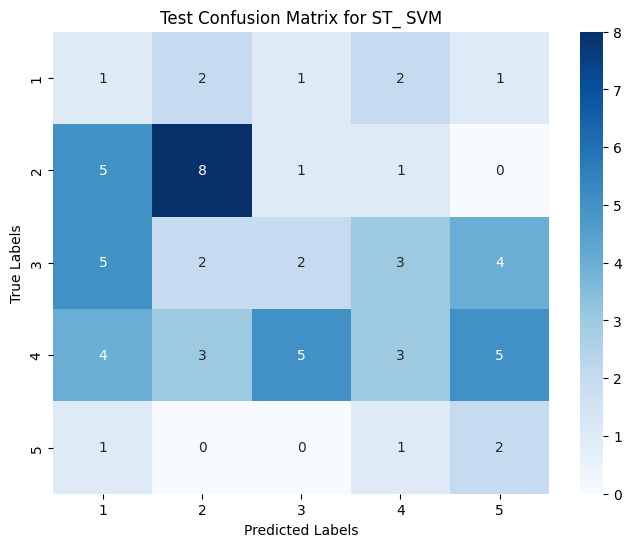


Hyperparameter tuning and evaluating RandomForest model:
Best parameters for RandomForest: {'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 50}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 76.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 120.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 205.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}}


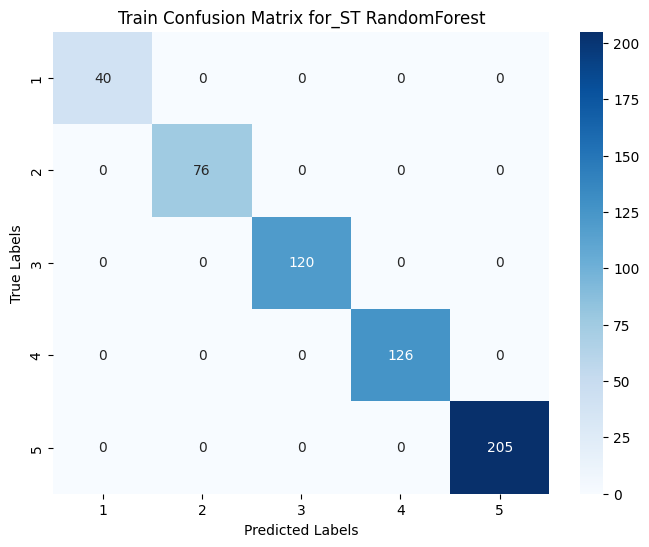

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14.0}, '3': {'precision': 0.18181818181818182, 'recall': 0.2, 'f1-score': 0.19047619047619047, 'support': 20.0}, '4': {'precision': 0.5, 'recall': 0.17647058823529413, 'f1-score': 0.2608695652173913, 'support': 34.0}, '5': {'precision': 0.4318181818181818, 'recall': 0.7307692307692307, 'f1-score': 0.5428571428571428, 'support': 52.0}, 'accuracy': 0.3870967741935484, 'macro avg': {'precision': 0.22272727272727275, 'recall': 0.22144796380090498, 'f1-score': 0.1988405797101449, 'support': 124.0}, 'weighted avg': {'precision': 0.34750733137829914, 'recall': 0.3870967741935484, 'f1-score': 0.32990048754424633, 'support': 124.0}}


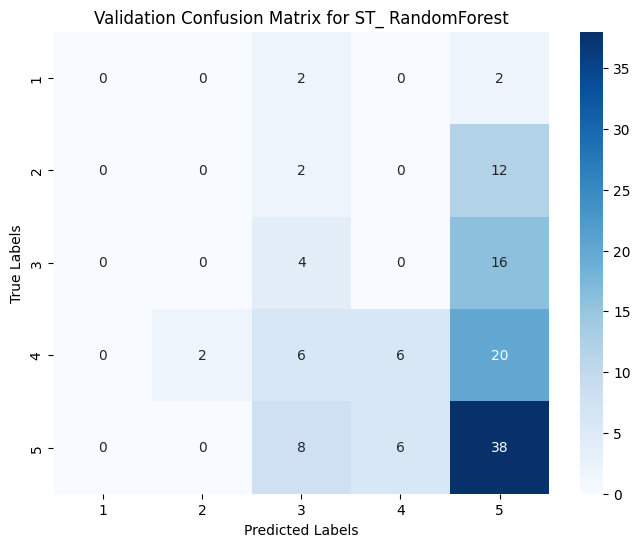

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 15.0}, '3': {'precision': 0.16666666666666666, 'recall': 0.0625, 'f1-score': 0.09090909090909091, 'support': 16.0}, '4': {'precision': 0.2857142857142857, 'recall': 0.1, 'f1-score': 0.14814814814814814, 'support': 20.0}, '5': {'precision': 0.08333333333333333, 'recall': 1.0, 'f1-score': 0.15384615384615385, 'support': 4.0}, 'accuracy': 0.11290322580645161, 'macro avg': {'precision': 0.10714285714285714, 'recall': 0.2325, 'f1-score': 0.07858067858067859, 'support': 62.0}, 'weighted avg': {'precision': 0.14055299539170504, 'recall': 0.11290322580645161, 'f1-score': 0.08117569407891986, 'support': 62.0}}


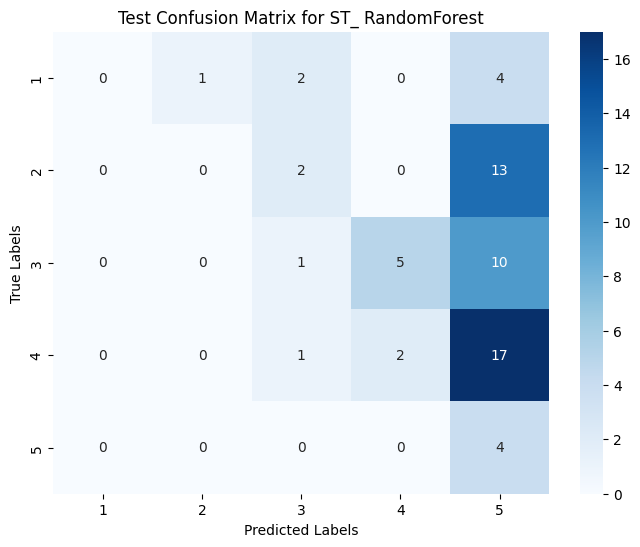


Hyperparameter tuning and evaluating LogisticRegression model:
Best parameters for LogisticRegression: {'classifier__C': 10, 'classifier__solver': 'lbfgs'}
Train Classification Report_ST:
{'1': {'precision': 0.9523809523809523, 'recall': 1.0, 'f1-score': 0.975609756097561, 'support': 40.0}, '2': {'precision': 0.9047619047619048, 'recall': 1.0, 'f1-score': 0.95, 'support': 76.0}, '3': {'precision': 0.9669421487603306, 'recall': 0.975, 'f1-score': 0.970954356846473, 'support': 120.0}, '4': {'precision': 0.9767441860465116, 'recall': 1.0, 'f1-score': 0.9882352941176471, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 0.9317073170731708, 'f1-score': 0.9646464646464646, 'support': 205.0}, 'accuracy': 0.9700176366843033, 'macro avg': {'precision': 0.9601658383899399, 'recall': 0.9813414634146342, 'f1-score': 0.9698891743416291, 'support': 567.0}, 'weighted avg': {'precision': 0.971710702205014, 'recall': 0.9700176366843033, 'f1-score': 0.9700336602765927, 'support': 567.0}}


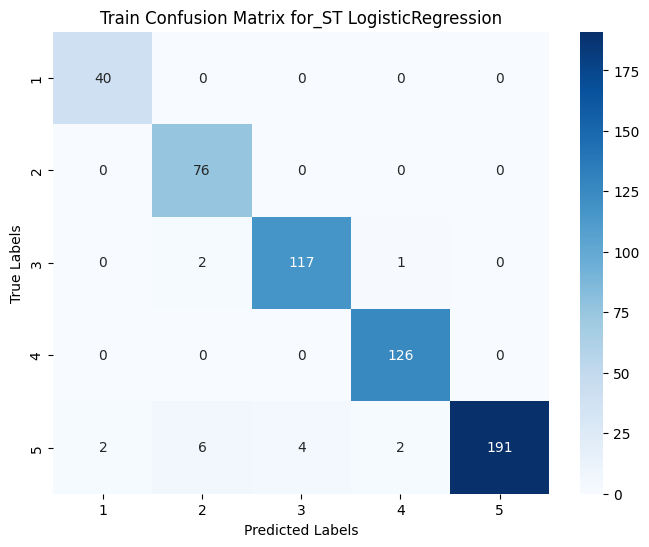

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.2222222222222222, 'recall': 0.2857142857142857, 'f1-score': 0.25, 'support': 14.0}, '3': {'precision': 0.3076923076923077, 'recall': 0.4, 'f1-score': 0.34782608695652173, 'support': 20.0}, '4': {'precision': 0.35714285714285715, 'recall': 0.29411764705882354, 'f1-score': 0.3225806451612903, 'support': 34.0}, '5': {'precision': 0.5454545454545454, 'recall': 0.46153846153846156, 'f1-score': 0.5, 'support': 52.0}, 'accuracy': 0.3709677419354839, 'macro avg': {'precision': 0.28650238650238646, 'recall': 0.2882740788623142, 'f1-score': 0.2840813464235624, 'support': 124.0}, 'weighted avg': {'precision': 0.4013826675116997, 'recall': 0.3709677419354839, 'f1-score': 0.38245373931140564, 'support': 124.0}}


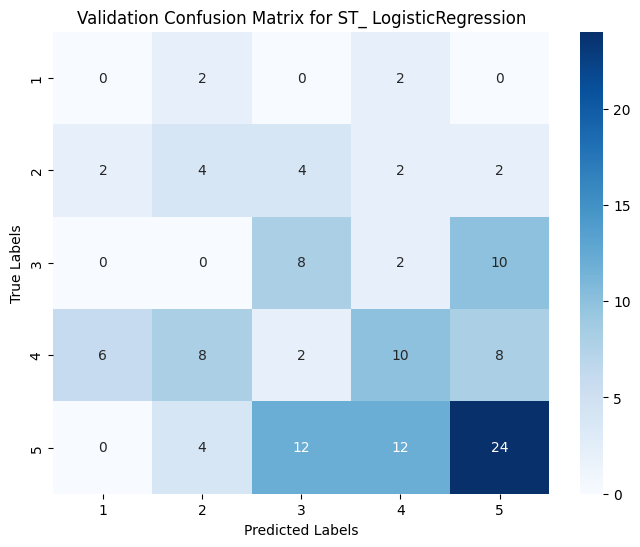

Test Classification Report_ST:
{'1': {'precision': 0.058823529411764705, 'recall': 0.14285714285714285, 'f1-score': 0.08333333333333333, 'support': 7.0}, '2': {'precision': 0.5, 'recall': 0.4666666666666667, 'f1-score': 0.4827586206896552, 'support': 15.0}, '3': {'precision': 0.125, 'recall': 0.0625, 'f1-score': 0.08333333333333333, 'support': 16.0}, '4': {'precision': 0.42857142857142855, 'recall': 0.3, 'f1-score': 0.35294117647058826, 'support': 20.0}, '5': {'precision': 0.2222222222222222, 'recall': 0.5, 'f1-score': 0.3076923076923077, 'support': 4.0}, 'accuracy': 0.27419354838709675, 'macro avg': {'precision': 0.26692343604108315, 'recall': 0.29440476190476195, 'f1-score': 0.26201175430384355, 'support': 62.0}, 'weighted avg': {'precision': 0.31245293816451314, 'recall': 0.27419354838709675, 'f1-score': 0.28141352801923375, 'support': 62.0}}


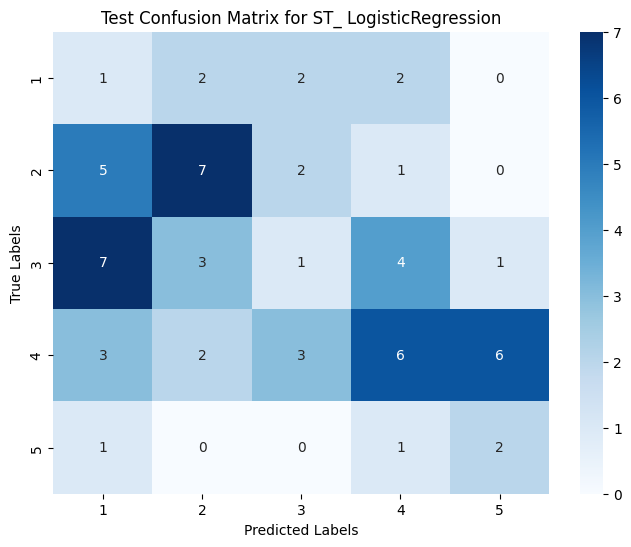


Hyperparameter tuning and evaluating KNeighbors model:
Best parameters for KNeighbors: {'classifier__n_neighbors': 3, 'classifier__weights': 'distance'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 76.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 120.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 205.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}}


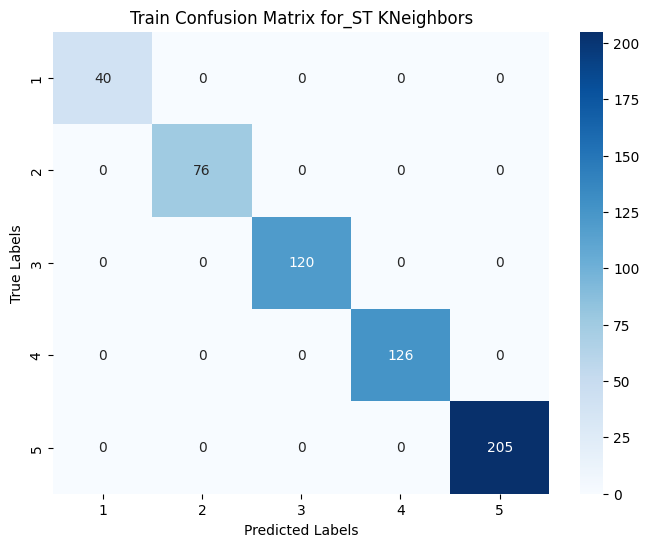

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.1111111111111111, 'recall': 0.14285714285714285, 'f1-score': 0.125, 'support': 14.0}, '3': {'precision': 0.0625, 'recall': 0.1, 'f1-score': 0.07692307692307693, 'support': 20.0}, '4': {'precision': 0.16666666666666666, 'recall': 0.11764705882352941, 'f1-score': 0.13793103448275862, 'support': 34.0}, '5': {'precision': 0.5217391304347826, 'recall': 0.46153846153846156, 'f1-score': 0.4897959183673469, 'support': 52.0}, 'accuracy': 0.25806451612903225, 'macro avg': {'precision': 0.17240338164251207, 'recall': 0.16440853264382677, 'f1-score': 0.1659300059546365, 'support': 124.0}, 'weighted avg': {'precision': 0.28711820165186225, 'recall': 0.25806451612903225, 'f1-score': 0.26973793924175304, 'support': 124.0}}


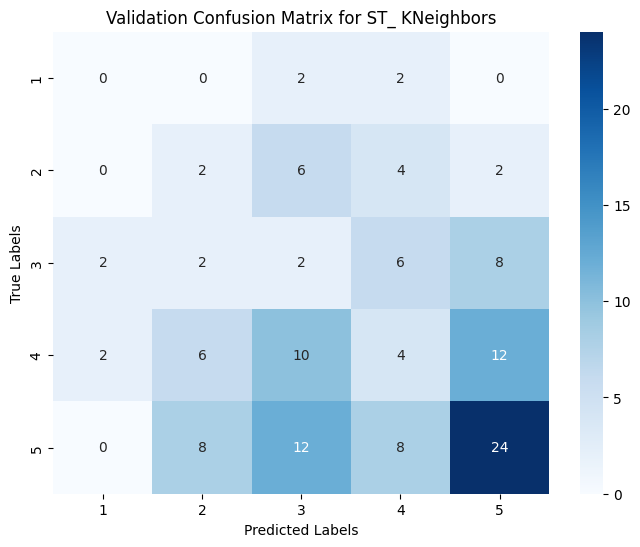

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.3333333333333333, 'recall': 0.2, 'f1-score': 0.25, 'support': 15.0}, '3': {'precision': 0.2857142857142857, 'recall': 0.25, 'f1-score': 0.26666666666666666, 'support': 16.0}, '4': {'precision': 0.4166666666666667, 'recall': 0.25, 'f1-score': 0.3125, 'support': 20.0}, '5': {'precision': 0.17647058823529413, 'recall': 0.75, 'f1-score': 0.2857142857142857, 'support': 4.0}, 'accuracy': 0.24193548387096775, 'macro avg': {'precision': 0.242436974789916, 'recall': 0.29, 'f1-score': 0.22297619047619044, 'support': 62.0}, 'weighted avg': {'precision': 0.30017168157585616, 'recall': 0.24193548387096775, 'f1-score': 0.2485407066052227, 'support': 62.0}}


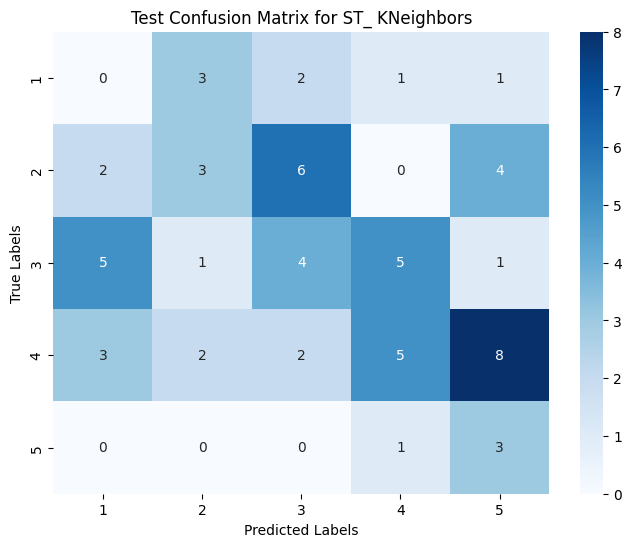


Hyperparameter tuning and evaluating NaiveBayes model:
Best parameters for NaiveBayes: {'classifier__alpha': 0.5}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 0.15, 'f1-score': 0.2608695652173913, 'support': 40.0}, '2': {'precision': 0.9090909090909091, 'recall': 0.2631578947368421, 'f1-score': 0.40816326530612246, 'support': 76.0}, '3': {'precision': 0.5882352941176471, 'recall': 0.5, 'f1-score': 0.5405405405405406, 'support': 120.0}, '4': {'precision': 0.7111111111111111, 'recall': 0.25396825396825395, 'f1-score': 0.3742690058479532, 'support': 126.0}, '5': {'precision': 0.4770408163265306, 'recall': 0.9121951219512195, 'f1-score': 0.626465661641541, 'support': 205.0}, 'accuracy': 0.5379188712522046, 'macro avg': {'precision': 0.7370956261292396, 'recall': 0.41586425413126304, 'f1-score': 0.44206160771070974, 'support': 567.0}, 'weighted avg': {'precision': 0.6473942005854771, 'recall': 0.5379188712522046, 'f1-score': 0.49718414640244063, 'support': 567.0}}


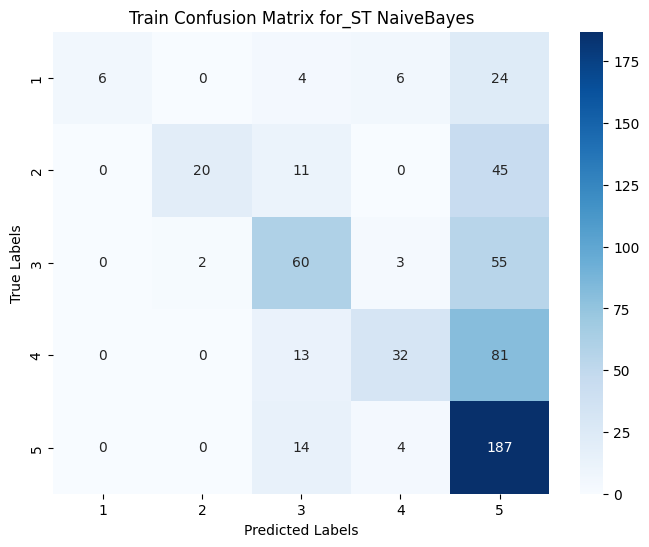

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14.0}, '3': {'precision': 0.2, 'recall': 0.2, 'f1-score': 0.2, 'support': 20.0}, '4': {'precision': 0.2, 'recall': 0.058823529411764705, 'f1-score': 0.09090909090909091, 'support': 34.0}, '5': {'precision': 0.3617021276595745, 'recall': 0.6538461538461539, 'f1-score': 0.4657534246575342, 'support': 52.0}, 'accuracy': 0.3225806451612903, 'macro avg': {'precision': 0.1523404255319149, 'recall': 0.18253393665158374, 'f1-score': 0.15133250311332502, 'support': 124.0}, 'weighted avg': {'precision': 0.23877831159917642, 'recall': 0.3225806451612903, 'f1-score': 0.25250070300887795, 'support': 124.0}}


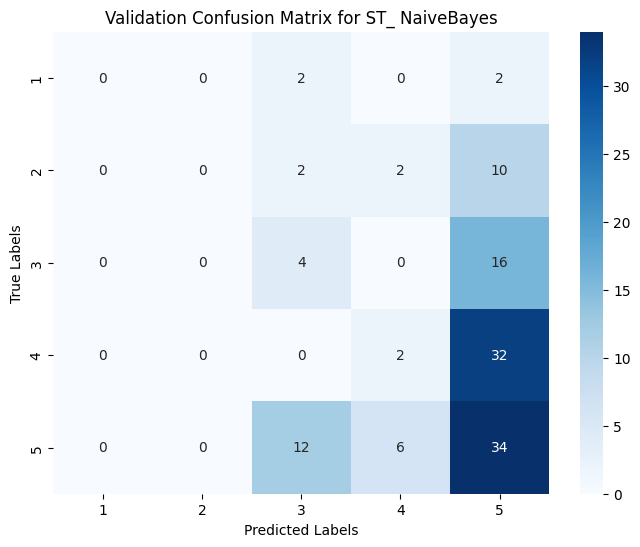

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 1.0, 'recall': 0.06666666666666667, 'f1-score': 0.125, 'support': 15.0}, '3': {'precision': 0.3333333333333333, 'recall': 0.3125, 'f1-score': 0.3225806451612903, 'support': 16.0}, '4': {'precision': 0.3076923076923077, 'recall': 0.2, 'f1-score': 0.24242424242424243, 'support': 20.0}, '5': {'precision': 0.09090909090909091, 'recall': 0.75, 'f1-score': 0.16216216216216217, 'support': 4.0}, 'accuracy': 0.20967741935483872, 'macro avg': {'precision': 0.34638694638694634, 'recall': 0.2658333333333333, 'f1-score': 0.17043340994953898, 'support': 62.0}, 'weighted avg': {'precision': 0.43307767501315886, 'recall': 0.20967741935483872, 'f1-score': 0.20215199709216358, 'support': 62.0}}


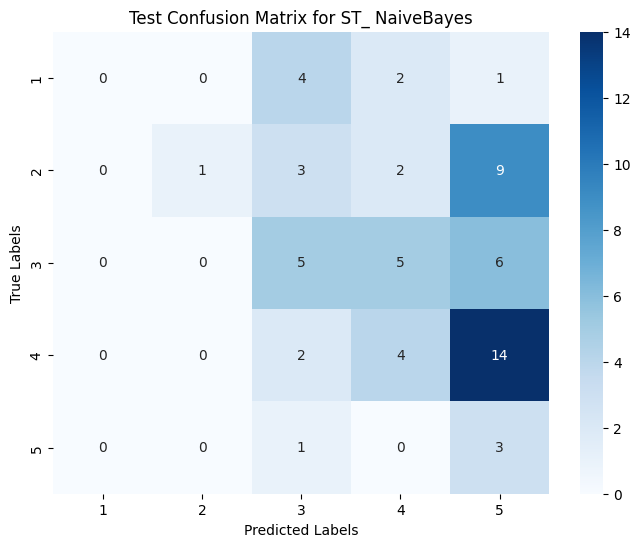


Hyperparameter tuning and evaluating DecisionTree model:
Best parameters for DecisionTree: {'classifier__max_depth': None, 'classifier__min_samples_split': 2}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 76.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 120.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 205.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}}


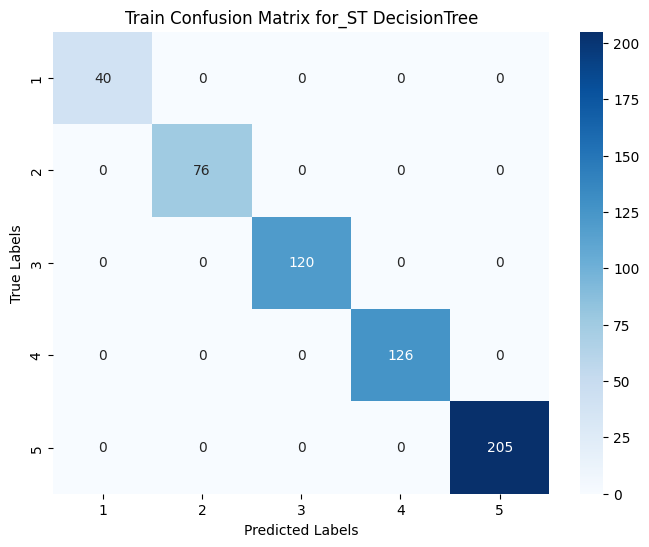

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.2, 'recall': 0.2857142857142857, 'f1-score': 0.23529411764705882, 'support': 14.0}, '3': {'precision': 0.23076923076923078, 'recall': 0.3, 'f1-score': 0.2608695652173913, 'support': 20.0}, '4': {'precision': 0.3, 'recall': 0.17647058823529413, 'f1-score': 0.2222222222222222, 'support': 34.0}, '5': {'precision': 0.6153846153846154, 'recall': 0.6153846153846154, 'f1-score': 0.6153846153846154, 'support': 52.0}, 'accuracy': 0.3870967741935484, 'macro avg': {'precision': 0.2692307692307693, 'recall': 0.27551389786683905, 'f1-score': 0.26675410409425754, 'support': 124.0}, 'weighted avg': {'precision': 0.40012406947890816, 'recall': 0.3870967741935484, 'f1-score': 0.3876376169916307, 'support': 124.0}}


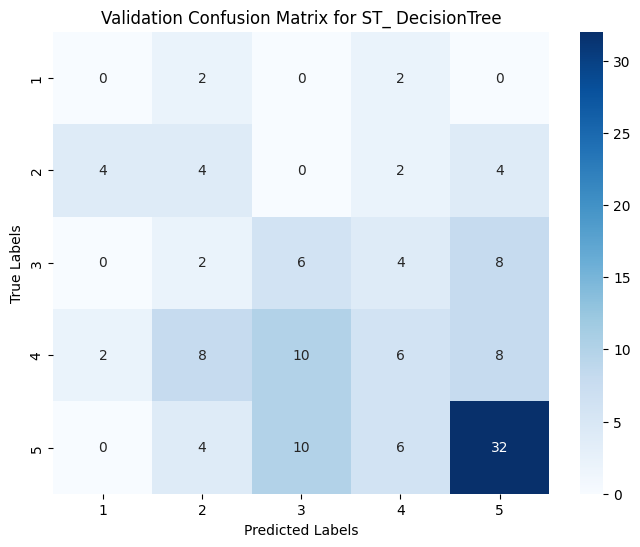

Test Classification Report_ST:
{'1': {'precision': 0.25, 'recall': 0.2857142857142857, 'f1-score': 0.26666666666666666, 'support': 7.0}, '2': {'precision': 0.16666666666666666, 'recall': 0.13333333333333333, 'f1-score': 0.14814814814814814, 'support': 15.0}, '3': {'precision': 0.25, 'recall': 0.1875, 'f1-score': 0.21428571428571427, 'support': 16.0}, '4': {'precision': 0.21428571428571427, 'recall': 0.15, 'f1-score': 0.17647058823529413, 'support': 20.0}, '5': {'precision': 0.125, 'recall': 0.5, 'f1-score': 0.2, 'support': 4.0}, 'accuracy': 0.1935483870967742, 'macro avg': {'precision': 0.2011904761904762, 'recall': 0.2513095238095238, 'f1-score': 0.20111422346716465, 'support': 62.0}, 'weighted avg': {'precision': 0.21025345622119815, 'recall': 0.1935483870967742, 'f1-score': 0.19107858197042257, 'support': 62.0}}


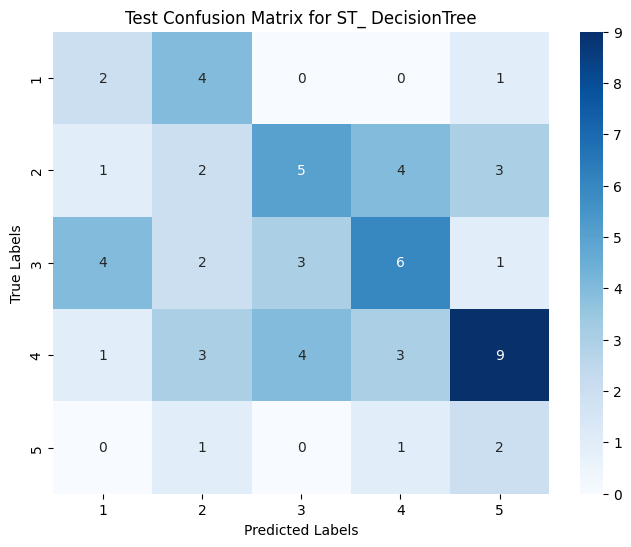


Hyperparameter tuning and evaluating AdaBoost model:
Best parameters for AdaBoost: {'classifier__learning_rate': 1.0, 'classifier__n_estimators': 200}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 0.7763157894736842, 'f1-score': 0.8740740740740741, 'support': 76.0}, '3': {'precision': 0.7704918032786885, 'recall': 0.7833333333333333, 'f1-score': 0.7768595041322314, 'support': 120.0}, '4': {'precision': 0.639344262295082, 'recall': 0.6190476190476191, 'f1-score': 0.6290322580645161, 'support': 126.0}, '5': {'precision': 0.7544642857142857, 'recall': 0.824390243902439, 'f1-score': 0.7878787878787878, 'support': 205.0}, 'accuracy': 0.7760141093474426, 'macro avg': {'precision': 0.8328600702576112, 'recall': 0.8006173971514151, 'f1-score': 0.8135689248299218, 'support': 567.0}, 'weighted avg': {'precision': 0.7825071816826306, 'recall': 0.7760141093474426, 'f1-score': 0.7767654076839117, 'suppor

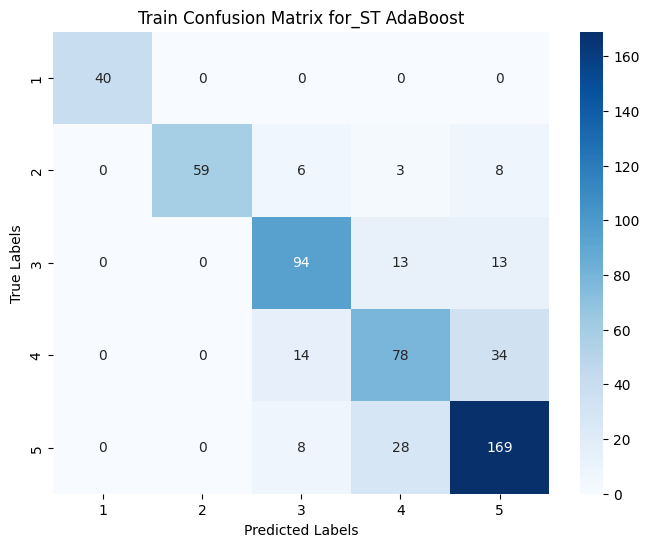

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.14285714285714285, 'recall': 0.14285714285714285, 'f1-score': 0.14285714285714285, 'support': 14.0}, '3': {'precision': 0.15, 'recall': 0.3, 'f1-score': 0.2, 'support': 20.0}, '4': {'precision': 0.3333333333333333, 'recall': 0.23529411764705882, 'f1-score': 0.27586206896551724, 'support': 34.0}, '5': {'precision': 0.6086956521739131, 'recall': 0.5384615384615384, 'f1-score': 0.5714285714285714, 'support': 52.0}, 'accuracy': 0.3548387096774194, 'macro avg': {'precision': 0.24697722567287786, 'recall': 0.24332255979314804, 'f1-score': 0.2380295566502463, 'support': 124.0}, 'weighted avg': {'precision': 0.3869798971482001, 'recall': 0.3548387096774194, 'f1-score': 0.36365803273478464, 'support': 124.0}}


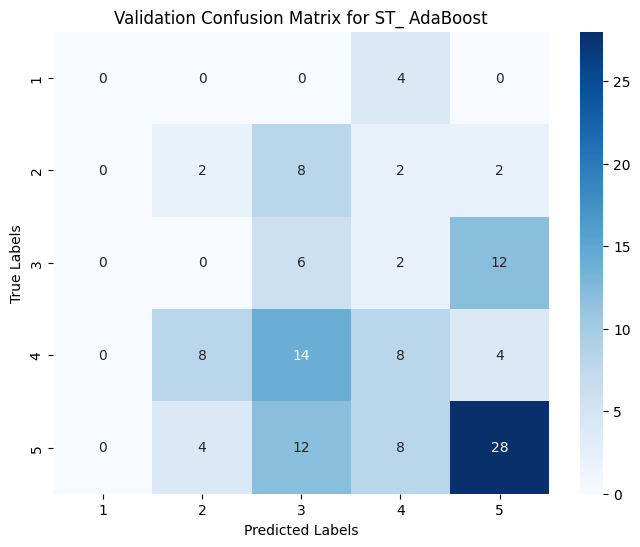

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.5, 'recall': 0.3333333333333333, 'f1-score': 0.4, 'support': 15.0}, '3': {'precision': 0.2222222222222222, 'recall': 0.25, 'f1-score': 0.23529411764705882, 'support': 16.0}, '4': {'precision': 0.4166666666666667, 'recall': 0.25, 'f1-score': 0.3125, 'support': 20.0}, '5': {'precision': 0.14285714285714285, 'recall': 0.75, 'f1-score': 0.24, 'support': 4.0}, 'accuracy': 0.27419354838709675, 'macro avg': {'precision': 0.2563492063492063, 'recall': 0.31666666666666665, 'f1-score': 0.23755882352941177, 'support': 62.0}, 'weighted avg': {'precision': 0.32194060419866877, 'recall': 0.27419354838709675, 'f1-score': 0.2737855787476281, 'support': 62.0}}


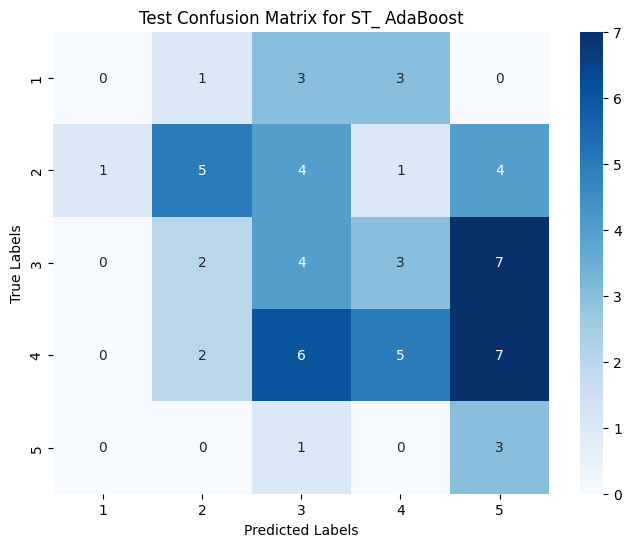


Hyperparameter tuning and evaluating Bagging model:
Best parameters for Bagging: {'classifier__max_samples': 0.7, 'classifier__n_estimators': 50}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 40.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 76.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 120.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 126.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 205.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 567.0}}


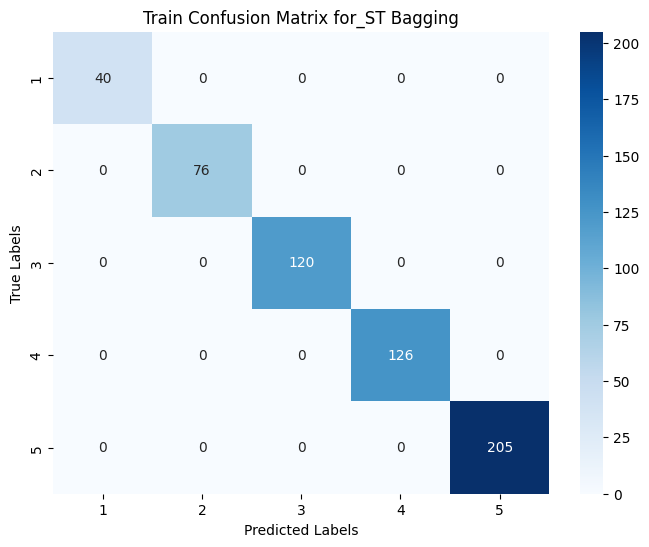

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 4.0}, '2': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 14.0}, '3': {'precision': 0.16666666666666666, 'recall': 0.3, 'f1-score': 0.21428571428571427, 'support': 20.0}, '4': {'precision': 0.45454545454545453, 'recall': 0.29411764705882354, 'f1-score': 0.35714285714285715, 'support': 34.0}, '5': {'precision': 0.5517241379310345, 'recall': 0.6153846153846154, 'f1-score': 0.5818181818181818, 'support': 52.0}, 'accuracy': 0.3870967741935484, 'macro avg': {'precision': 0.23458725182863116, 'recall': 0.2419004524886878, 'f1-score': 0.23064935064935063, 'support': 124.0}, 'weighted avg': {'precision': 0.38288333838945626, 'recall': 0.3870967741935484, 'f1-score': 0.3764767490573942, 'support': 124.0}}


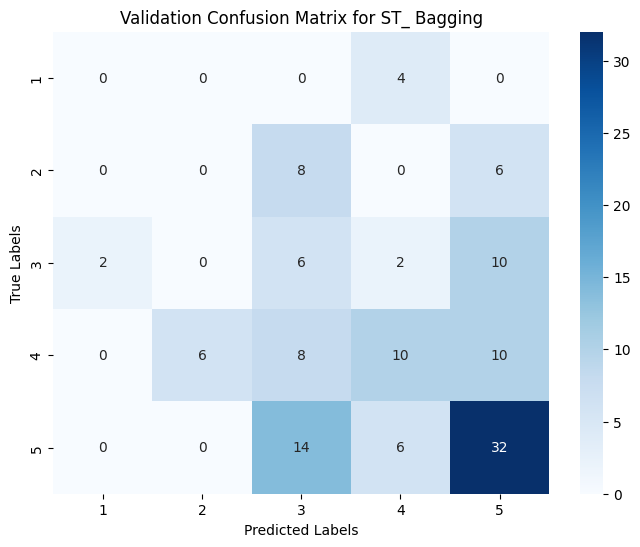

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.6666666666666666, 'recall': 0.26666666666666666, 'f1-score': 0.38095238095238093, 'support': 15.0}, '3': {'precision': 0.3076923076923077, 'recall': 0.25, 'f1-score': 0.27586206896551724, 'support': 16.0}, '4': {'precision': 0.3333333333333333, 'recall': 0.25, 'f1-score': 0.2857142857142857, 'support': 20.0}, '5': {'precision': 0.14814814814814814, 'recall': 1.0, 'f1-score': 0.25806451612903225, 'support': 4.0}, 'accuracy': 0.27419354838709675, 'macro avg': {'precision': 0.29116809116809117, 'recall': 0.35333333333333333, 'f1-score': 0.24011865035224322, 'support': 62.0}, 'weighted avg': {'precision': 0.357779615844132, 'recall': 0.27419354838709675, 'f1-score': 0.27217133220219086, 'support': 62.0}}


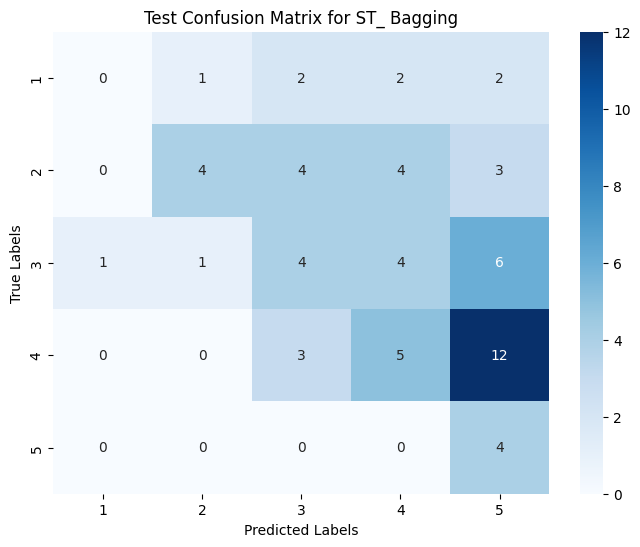

In [ ]:
# Define parameter grids for hyperparameter tuning
param_grids = {
    "SVM": {
        "classifier__C": [0.1, 1, 10, 100],
        "classifier__gamma": ["scale", "auto"],
        "classifier__kernel": ["linear", "rbf"]
    },
    "RandomForest": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    "LogisticRegression": {
        "classifier__C": [0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"]
    },
    "KNeighbors": {
        "classifier__n_neighbors": [3, 5, 7, 10],
        "classifier__weights": ["uniform", "distance"]
    },
    "NaiveBayes": {
        "classifier__alpha": [0.1, 0.5, 1.0]
    },
    "DecisionTree": {
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    # "GradientBoosting": {
    #     "classifier__n_estimators": [50, 100, 200],
    #     "classifier__learning_rate": [0.01, 0.1, 0.2],
    #     "classifier__max_depth": [3, 5, 7]
    # },
    "AdaBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__learning_rate": [0.01, 0.1, 1.0]
    },
    "Bagging": {
        "classifier__n_estimators": [10, 50, 100],
        "classifier__max_samples": [0.5, 0.7, 1.0]
    }
}

# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    # "GradientBoosting": Pipeline([
    #     ("classifier", GradientBoostingClassifier(random_state=1))
    # ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results_tuned = []

# Perform hyperparameter tuning and evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nHyperparameter tuning and evaluating {model_name} model:")

    # Perform Grid Search
    grid_search = GridSearchCV(pipeline, param_grid=param_grids[model_name], cv=3, scoring="accuracy")
    grid_search.fit(X_train, y_train)

    # Best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predict on train data
    best_model = grid_search.best_estimator_

     # Predict on train data
    y_train_pred = best_model.predict(X_train)
    train_accuracy_st_tune = accuracy_score(y_train, y_train_pred)
    train_precision_st_tune = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st_tune = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st_tune = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = best_model.predict(X_val)
    val_accuracy_st_tune = accuracy_score(y_val, y_val_pred)
    val_precision_st_tune = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st_tune = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st_tune = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = best_model.predict(X_test)
    test_accuracy_st_tune = accuracy_score(y_test, y_test_pred)
    test_precision_st_tune = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st_tune = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st_tune = f1_score(y_test, y_test_pred, average="weighted")


    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(train_report)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(val_report)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(test_report)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results_tuned.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results_tuned)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_tuned_potential_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   1.000000  1.000000  1.000000     40.0
1        SVM  Train     2   1.000000  1.000000  1.000000     76.0
2        SVM  Train     3   1.000000  1.000000  1.000000    120.0
3        SVM  Train     4   1.000000  1.000000  1.000000    126.0
4        SVM  Train     5   1.000000  1.000000  1.000000    205.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     1   0.000000  0.000000  0.000000      7.0
116  Bagging   Test     2   0.666667  0.266667  0.380952     15.0
117  Bagging   Test     3   0.307692  0.250000  0.275862     16.0
118  Bagging   Test     4   0.333333  0.250000  0.285714     20.0
119  Bagging   Test     5   0.148148  1.000000  0.258065      4.0

[120 rows x 7 columns]


# METHOD 3: SMOTE the Target variable - Potential Accident Level, Data Augumentation - Synonymn, Synthetic data

## Test - Train split

In [ ]:
# Define target and features
X = dataset_cleaned_original.drop(['Potential_Accident_Level_Encoded'], axis=1)
y = dataset_cleaned_original['Potential_Accident_Level_Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(287, 62, 62)

In [ ]:
y.value_counts()

,count
Potential_Accident_Level_Encoded,
4,138
3,106
2,95
1,43
5,29


In [ ]:
train_dataset = pd.concat([X_train, y_train], axis=1).reset_index(drop=True)
val_dataset = pd.concat([X_val, y_val], axis=1).reset_index(drop=True)
test_dataset = pd.concat([X_test, y_test], axis=1).reset_index(drop=True)

In [ ]:
train_dataset.head()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Accident_Level_Encoded,Potential_Accident_Level_Encoded
0,Mining,I,IV,Male,Third Party,Projection of fragments,moment collaborator carried inspection conveye...,1,4
1,Mining,I,IV,Male,Third Party,Others,circumstance dump truck laden ore entered unlo...,1,4
2,Mining,I,III,Male,Third Party,Others,mechanical technical proceeded perform mainten...,1,3
3,Mining,II,IV,Male,Third Party,Others,aligning right bracket tower n releasing tensi...,2,4
4,Mining,I,IV,Male,Employee,Others,please inspection lumbo check list equipment o...,1,4


In [ ]:
train_dataset.shape

(287, 9)

## Functions for Data augmentation and synthetic data generation, Data augmentation (using synonymn for description and using probablity sampling for target variable) and synthetic row generation


#### Augument accident level

In [ ]:
def accident_level_augumentation(row):
  levels = [1, 2, 3, 4, 5]
  curent_accident_level_idx = levels.index(row['Accident_Level_Encoded'])
  len_accident_levels = len(levels)
  # probabilties for each level
  prob = np.zeros(len_accident_levels)
  for i in range(len_accident_levels):
    dis = abs(i - curent_accident_level_idx)
    prob[i] = max(1/(1+dis), 0.05)
  prob /=prob.sum()
  new_accident_level = np.random.choice(levels,p=prob)
  return new_accident_level

#### Augument potential accident level

In [ ]:
def potential_accident_level_augumentation(accident_level):
  levels = [1, 2, 3, 4, 5]
  curent_potential_accident_level_idx = levels.index(accident_level)
  potential_idx = np.random.randint(curent_potential_accident_level_idx, len(levels))
  return levels[potential_idx]

#### Augument translated description

In [ ]:
def description_augumentation(description):
  words = description.split()
  words_augumented = []
  for word in words:
    word_synonyms = wordnet.synsets(word)
    if word_synonyms and random.random() < 0.2:
      word_synonym = word_synonyms[0].lemmas()[0].name().replace('_', ' ')
      words_augumented.append(word_synonym)
    else:
      words_augumented.append(word)
  return ' '.join(words_augumented)

#### Synthetic row generate function

In [ ]:
def synthetic_row_generate(row):
  extra_row = row.copy()
  extra_row['Accident_Level_Encoded'] = accident_level_augumentation(row)
  extra_row['Potential_Accident_Level_Encoded'] = potential_accident_level_augumentation(extra_row['Accident_Level_Encoded'])
  extra_row['Translated_Description'] = description_augumentation(row['Translated_Description'])
  return extra_row

## Apply augumentation and generate synthetic data for train


In [ ]:
train_dataset['Augmented_Accident_Level'] = train_dataset.apply(accident_level_augumentation, axis=1)
train_dataset['Augmented_Potential_Accident_Level'] = train_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
train_dataset['Augmented_Description'] = train_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_train = pd.DataFrame([synthetic_row_generate(row) for _, row in train_dataset.iterrows()])

In [ ]:
train_dataset_final = pd.concat([train_dataset, synthetic_data_train], ignore_index=True)
print(train_dataset_final.duplicated().sum())
train_dataset_final.drop_duplicates(inplace=True)
# Calculate the correlation between Accident Level and Potential Accident Level for training set

from scipy.stats import spearmanr

# Calculate Spearman's rank correlation
correlation, p_value = spearmanr(train_dataset_final['Augmented_Accident_Level'], train_dataset_final['Augmented_Potential_Accident_Level'])

# Display results
print("Spearman Correlation:", correlation)
print("P-Value:", p_value)

train_dataset_final.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final_potential_smote.csv', index=False)

6
Spearman Correlation: 0.5439599951628985
P-Value: 4.6752511215323666e-45


In [ ]:
train_dataset_final.shape

(568, 12)

In [ ]:
train_dataset_final.tail()

,Industry_Sector,Accident_Level,Potential_Accident_Level,Gender,Employee_Type,Critical_Risk,Translated_Description,Accident_Level_Encoded,Potential_Accident_Level_Encoded,Augmented_Accident_Level,Augmented_Potential_Accident_Level,Augmented_Description
569,Metals,I,III,Male,Third Party (Remote),Fall,employee transition grs area came slip agony t...,1,3,1,2,employee transition grs area came slip agony t...
570,Metals,I,III,Male,Third Party (Remote),Pressurized Systems,unloading operation ustulado bag need uncle di...,3,3,5,5,unloading operation ustulado bag need uncle di...
571,Others,I,I,Male,Third Party,Others,region povoado vista martin pole ce employee f...,1,5,1,2,region povoado vista martin pole ce employee f...
572,Mining,II,V,Male,Third Party,Vehicles and Mobile Equipment,blend em incimmet SA moved positive south camp...,2,3,2,3,mixed em incimmet sa moved positive South camp...
573,Metals,IV,IV,Male,Employee,Suspended Loads,section row cell worker perform anode lifting ...,1,3,3,5,section row cell worker perform anode lifting ...


## Apply augumentation and generate synthetic data for validation

In [ ]:
val_dataset['Augmented_Accident_Level'] = val_dataset.apply(accident_level_augumentation, axis=1)
val_dataset['Augmented_Potential_Accident_Level'] = val_dataset['Augmented_Accident_Level'].apply(potential_accident_level_augumentation)
val_dataset['Augmented_Description'] = val_dataset['Translated_Description'].apply(description_augumentation)

In [ ]:
synthetic_data_val = pd.DataFrame([synthetic_row_generate(row) for _, row in val_dataset.iterrows()])

val_dataset_final = pd.concat([val_dataset, synthetic_data_val], ignore_index=True)
print(val_dataset_final.duplicated().sum())
val_dataset_final.drop_duplicates(inplace=True)
val_dataset_final.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/val_dataset_final_potential_smote.csv', index=False)

1


In [ ]:
print(train_dataset_final['Accident_Level_Encoded'].value_counts())
print(train_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(train_dataset_final['Augmented_Accident_Level'].value_counts())
print(train_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    323
2     76
3     70
4     61
5     38
Name: count, dtype: int64
Potential_Accident_Level_Encoded
4    166
5    124
3    122
2    109
1     47
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    200
2    134
3     97
4     69
5     68
Name: count, dtype: int64
Augmented_Potential_Accident_Level
5    207
4    137
3    108
2     80
1     36
Name: count, dtype: int64


In [ ]:
print(val_dataset_final['Accident_Level_Encoded'].value_counts())
print(val_dataset_final['Potential_Accident_Level_Encoded'].value_counts())
print("*"*80)
print(val_dataset_final['Augmented_Accident_Level'].value_counts())
print(val_dataset_final['Augmented_Potential_Accident_Level'].value_counts())

Accident_Level_Encoded
1    63
2    27
5    13
4    11
3     9
Name: count, dtype: int64
Potential_Accident_Level_Encoded
4    35
5    32
3    27
2    19
1    10
Name: count, dtype: int64
********************************************************************************
Augmented_Accident_Level
1    39
3    36
2    28
4    10
5    10
Name: count, dtype: int64
Augmented_Potential_Accident_Level
3    42
5    30
4    24
2    20
1     7
Name: count, dtype: int64


## Sentence Transformer and Apply SMOTE

In [ ]:
train_dataset_final = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/train_dataset_final_potential_smote.csv')
val_dataset_final = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/val_dataset_final_potential_smote.csv')

In [ ]:
X_train_smote = train_dataset_final[['Augmented_Accident_Level', 'Augmented_Description']]
y_train_smote = train_dataset_final['Augmented_Potential_Accident_Level']
print(X_train_smote.columns)
print("*"*100)
print(train_dataset_final['Augmented_Potential_Accident_Level'].value_counts())
print(y_train_smote)

Index(['Augmented_Accident_Level', 'Augmented_Description'], dtype='object')
****************************************************************************************************
Augmented_Potential_Accident_Level
5    207
4    137
3    108
2     80
1     36
Name: count, dtype: int64
0      4
1      5
2      5
3      5
4      1
      ..
563    2
564    5
565    2
566    3
567    5
Name: Augmented_Potential_Accident_Level, Length: 568, dtype: int64


In [ ]:
X_train_smote.head()

,Augmented_Accident_Level,Augmented_Description
0,4,moment collaborator carried inspection conveye...
1,4,circumstance dump truck laden ore entered unlo...
2,4,mechanical technical proceeded perform mainten...
3,2,aligning right bracket tower n releasing tensi...
4,1,please inspection lumbo check list equipment o...


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

vec = TfidfVectorizer()
X_train_vec = vec.fit_transform(X_train_smote['Augmented_Description']).toarray()
print(X_train_vec.shape)

numeric_features = X_train_smote[X_train_smote.select_dtypes(include=['int64', 'float64']).columns]
print(numeric_features)

X_train_after_vec = np.hstack([numeric_features.values, X_train_vec])
print(X_train_after_vec.shape)

(568, 2293)
     Augmented_Accident_Level
0                           4
1                           4
2                           4
3                           2
4                           1
..                        ...
563                         1
564                         5
565                         1
566                         2
567                         3

[568 rows x 1 columns]
(568, 2294)


In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_after_vec, y_train_smote)

In [ ]:
y_train_resampled.value_counts()

,count
Augmented_Potential_Accident_Level,
4,207
5,207
1,207
3,207
2,207


In [ ]:
X_train_resampled = pd.DataFrame(X_train_resampled, columns=(numeric_features.columns.tolist() + vec.get_feature_names_out().tolist()))
X_train_resampled

,Augmented_Accident_Level,abdomen,able,abratech,abrupt,abruptly,absorb,absorbent,accepting,access,...,yahweh,yard,yes,yield,young,zat,zero,zigzag,zinc,zone
0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.135445,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1030,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.017410,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1031,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1032,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1033,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
train_dataset_smote = pd.concat([X_train_resampled['Augmented_Accident_Level'], y_train_resampled], axis=1)
train_dataset_smote["Augmented_Description"] = ""
print(train_dataset_smote["Augmented_Description"])
description_matrix = vec.inverse_transform(X_train_resampled.drop(numeric_features.columns, axis=1))
print(len(description_matrix))
train_dataset_smote["Augmented_Description"] = [" ". join(tokens) for tokens in description_matrix]

0        
1        
2        
3        
4        
       ..
1030     
1031     
1032     
1033     
1034     
Name: Augmented_Description, Length: 1035, dtype: object
1035


In [ ]:
train_dataset_smote

,Augmented_Accident_Level,Augmented_Potential_Accident_Level,Augmented_Description
0,4.0,4,access belt camp carried collaboration collabo...
1,4.0,5,accident alcohotest alone approaching approxim...
2,4.0,5,affected approximately area block bring burst ...
3,2.0,5,aligning applied assistant beating bracket eff...
4,1.0,1,apparently attention behind bottle center chec...
...,...,...,...
1030,4.0,4,access accident adapted area arm assistant bas...
1031,3.0,4,approve back balance belt bolted cause change ...
1032,2.0,4,burn causing change designing disrupted employ...
1033,1.0,4,activity appears blowing car chuteo copper cov...


In [ ]:
dataset_1 = train_dataset_smote['Augmented_Accident_Level']
# dataset_1 = pd.get_dummies(dataset_1, columns=['Industry_Sector'], drop_first=True)
# print(dataset_1.head())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(train_dataset_smote['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_train = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_train = pd.concat([dataset_1.reset_index(drop=True), embedding_df_train], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_train.head())


Batches:   0%|          | 0/33 [00:00<?, ?it/s]

Embedding Shape: (1035, 384)
   Augmented_Accident_Level  Embedding_0  Embedding_1  Embedding_2  \
0                       4.0    -0.042726     0.048354     0.095596   
1                       4.0     0.026565     0.079843     0.017716   
2                       4.0    -0.033525     0.050664     0.076938   
3                       2.0    -0.065072     0.028631     0.037408   
4                       1.0    -0.020057    -0.029560     0.044604   

   Embedding_3  Embedding_4  Embedding_5  Embedding_6  Embedding_7  \
0     0.040256    -0.029686    -0.054723     0.090484     0.036714   
1     0.030356     0.014720    -0.001773     0.049822     0.083078   
2    -0.000952     0.030311    -0.018024     0.090625     0.031508   
3    -0.014756    -0.169967    -0.006157    -0.067590    -0.001352   
4    -0.039573     0.055004    -0.067003     0.072021     0.048042   

   Embedding_8  ...  Embedding_374  Embedding_375  Embedding_376  \
0    -0.051340  ...       0.029347       0.086411      -0.017

In [ ]:
dataset_2 = val_dataset_final['Augmented_Accident_Level']
# dataset_2 = pd.get_dummies(dataset_2, columns=['Industry_Sector'], drop_first=True)
# print(dataset_2.head())
# for col in dataset_2.columns:
#     print(dataset_2[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(val_dataset_final['Augmented_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_val = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_val = pd.concat([dataset_2.reset_index(drop=True), embedding_df_val], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_val.head())

Batches:   0%|          | 0/4 [00:00<?, ?it/s]

Embedding Shape: (123, 384)
   Augmented_Accident_Level  Embedding_0  Embedding_1  Embedding_2  \
0                         3    -0.069278     0.025553    -0.036362   
1                         3    -0.062687     0.043664     0.109015   
2                         4    -0.004811    -0.006886     0.089850   
3                         3    -0.113879     0.039089     0.017150   
4                         3    -0.002422     0.039511     0.068759   

   Embedding_3  Embedding_4  Embedding_5  Embedding_6  Embedding_7  \
0    -0.034984    -0.053534     0.000153     0.004616     0.089788   
1     0.023673     0.087837    -0.055147     0.099319     0.011748   
2     0.018445    -0.042637    -0.071972     0.016386    -0.023304   
3    -0.032391    -0.021818     0.055957     0.010910     0.115862   
4    -0.005726    -0.113015    -0.010652     0.019232     0.123916   

   Embedding_8  ...  Embedding_374  Embedding_375  Embedding_376  \
0    -0.029978  ...       0.024316       0.053285       0.0947

In [ ]:
dataset_3 = test_dataset['Accident_Level_Encoded']
# dataset_3 = pd.get_dummies(dataset_3, columns=['Industry_Sector'], drop_first=True)
# print(dataset_3.head())
# for col in dataset_3.columns:
#     print(dataset_3[col].unique())
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(test_dataset['Translated_Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df_test = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
dataset_with_embeddings_test = pd.concat([dataset_3.reset_index(drop=True), embedding_df_test], axis=1)

# Display the updated DataFrame
print(dataset_with_embeddings_test.head())

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

Embedding Shape: (62, 384)
   Accident_Level_Encoded  Embedding_0  Embedding_1  Embedding_2  Embedding_3  \
0                       1    -0.022400     0.062483     0.079677    -0.001679   
1                       1    -0.095470     0.045174     0.000306    -0.005226   
2                       1    -0.065827    -0.029026     0.075985    -0.013752   
3                       1     0.054801     0.021772     0.080981     0.003338   
4                       1     0.040250     0.007201     0.070623    -0.002933   

   Embedding_4  Embedding_5  Embedding_6  Embedding_7  Embedding_8  ...  \
0    -0.023498    -0.065519    -0.002901     0.054930    -0.049121  ...   
1    -0.056687    -0.009017    -0.024360    -0.004062     0.024352  ...   
2     0.040360     0.029976     0.044509    -0.002035    -0.022453  ...   
3     0.035736     0.016516    -0.005083     0.033196    -0.042251  ...   
4     0.057667    -0.015966     0.104493     0.003889    -0.026115  ...   

   Embedding_374  Embedding_375  Em

In [ ]:
X_train = dataset_with_embeddings_train.rename(columns={'Augmented_Accident_Level':'Final_Accident_Level'})
y_train = train_dataset_smote['Augmented_Potential_Accident_Level'].rename('Final_Potential_Accident_Level')
print(X_train.columns)
print("*"*100)
print(y_train.value_counts())

X_val = dataset_with_embeddings_val.rename(columns={'Augmented_Accident_Level':'Final_Accident_Level'})
y_val = val_dataset_final['Augmented_Potential_Accident_Level'].rename('Final_Potential_Accident_Level')
print(X_val.columns)
print("*"*100)
print(y_val)

Index(['Final_Accident_Level', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       'Embedding_7', 'Embedding_8',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=385)
****************************************************************************************************
Final_Potential_Accident_Level
4    207
5    207
1    207
3    207
2    207
Name: count, dtype: int64
Index(['Final_Accident_Level', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       'Embedding_7', 'Embedding_8',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'

In [ ]:
X_test = dataset_with_embeddings_test.rename(columns={'Accident_Level_Encoded':'Final_Accident_Level'})
y_test = test_dataset['Potential_Accident_Level_Encoded'].rename('Final_Potential_Accident_Level')
print(X_test.columns)
print("*"*100)
print(y_test)

Index(['Final_Accident_Level', 'Embedding_0', 'Embedding_1', 'Embedding_2',
       'Embedding_3', 'Embedding_4', 'Embedding_5', 'Embedding_6',
       'Embedding_7', 'Embedding_8',
       ...
       'Embedding_374', 'Embedding_375', 'Embedding_376', 'Embedding_377',
       'Embedding_378', 'Embedding_379', 'Embedding_380', 'Embedding_381',
       'Embedding_382', 'Embedding_383'],
      dtype='object', length=385)
****************************************************************************************************
0     2
1     3
2     4
3     1
4     1
     ..
57    4
58    2
59    4
60    3
61    3
Name: Final_Potential_Accident_Level, Length: 62, dtype: int64


### Model pipeline without tuning


Evaluating SVM model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.78      1.00      0.88       207
           2       0.74      0.96      0.83       207
           3       0.79      0.82      0.80       207
           4       0.81      0.73      0.77       207
           5       1.00      0.47      0.64       207

    accuracy                           0.80      1035
   macro avg       0.82      0.80      0.79      1035
weighted avg       0.82      0.80      0.79      1035



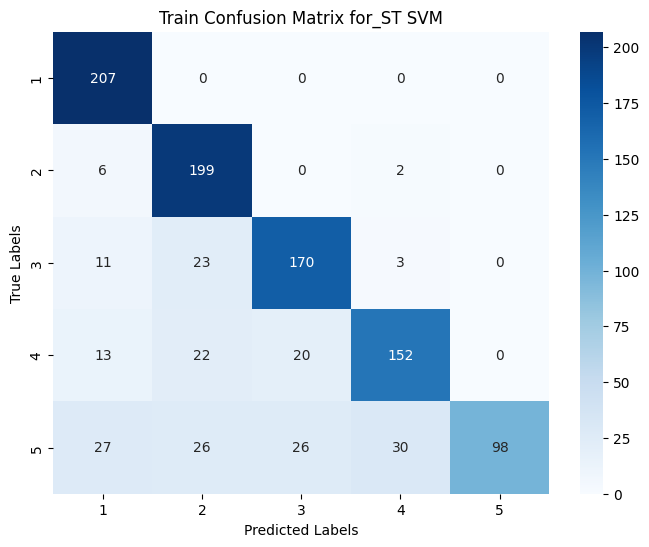

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.25      0.57      0.35         7
           2       0.32      0.60      0.41        20
           3       0.64      0.38      0.48        42
           4       0.38      0.50      0.43        24
           5       0.83      0.33      0.48        30

    accuracy                           0.44       123
   macro avg       0.48      0.48      0.43       123
weighted avg       0.56      0.44      0.45       123



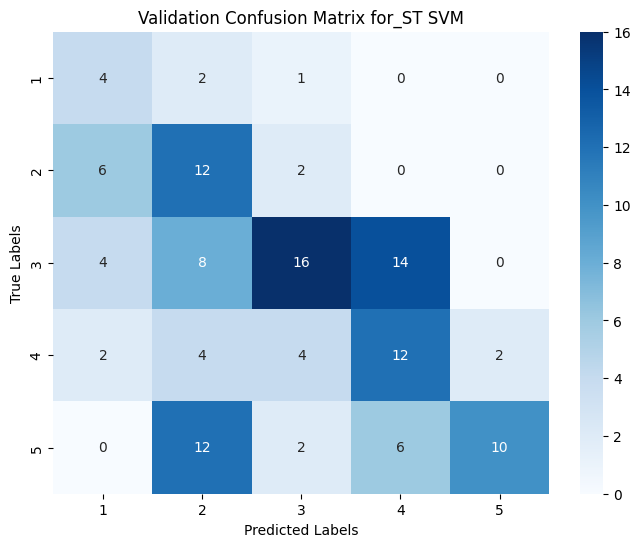

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.14      0.29      0.19         7
           2       0.38      0.53      0.44        15
           3       0.35      0.38      0.36        16
           4       0.71      0.25      0.37        20
           5       0.67      0.50      0.57         4

    accuracy                           0.37        62
   macro avg       0.45      0.39      0.39        62
weighted avg       0.47      0.37      0.38        62



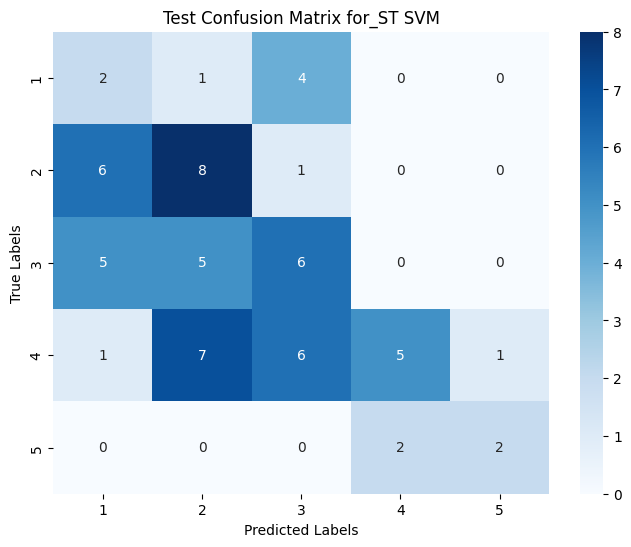


Evaluating RandomForest model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       207
           2       1.00      1.00      1.00       207
           3       1.00      1.00      1.00       207
           4       1.00      1.00      1.00       207
           5       1.00      1.00      1.00       207

    accuracy                           1.00      1035
   macro avg       1.00      1.00      1.00      1035
weighted avg       1.00      1.00      1.00      1035



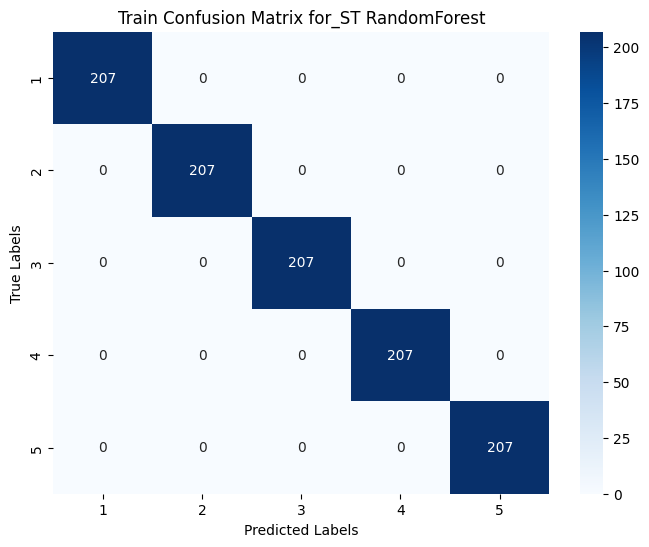

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.31      0.20      0.24        20
           3       0.50      0.29      0.36        42
           4       0.00      0.00      0.00        24
           5       0.27      0.53      0.36        30

    accuracy                           0.26       123
   macro avg       0.21      0.20      0.19       123
weighted avg       0.29      0.26      0.25       123



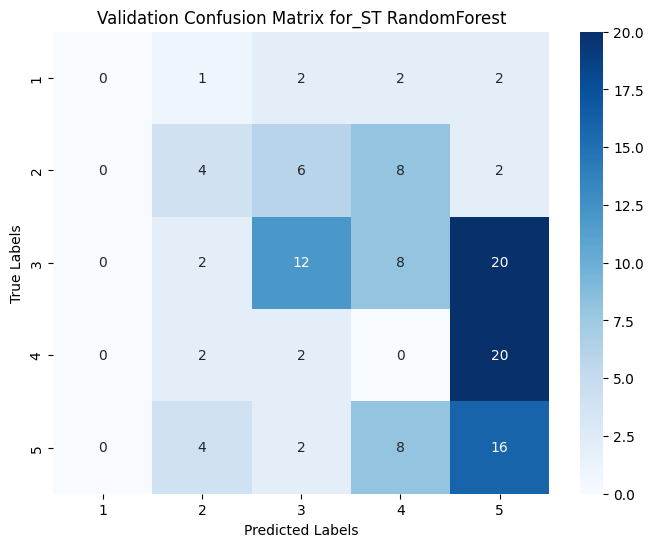

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.40      0.13      0.20        15
           3       0.36      0.25      0.30        16
           4       0.45      0.45      0.45        20
           5       0.12      0.75      0.20         4

    accuracy                           0.29        62
   macro avg       0.27      0.32      0.23        62
weighted avg       0.34      0.29      0.28        62



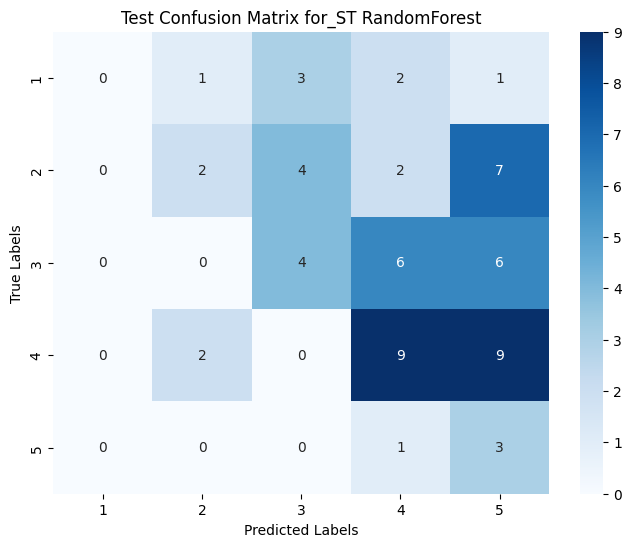


Evaluating LogisticRegression model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.88      1.00      0.94       207
           2       0.89      0.94      0.91       207
           3       0.87      0.85      0.86       207
           4       0.88      0.75      0.81       207
           5       0.80      0.78      0.79       207

    accuracy                           0.86      1035
   macro avg       0.86      0.86      0.86      1035
weighted avg       0.86      0.86      0.86      1035



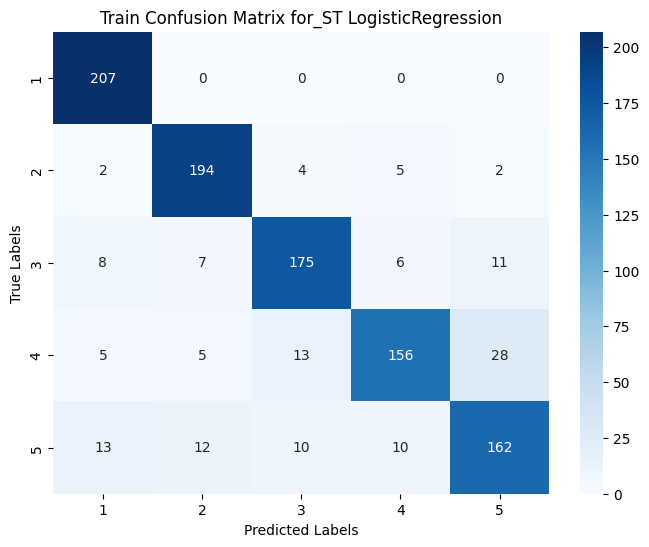

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.33      0.57      0.42         7
           2       0.42      0.50      0.45        20
           3       0.36      0.10      0.15        42
           4       0.08      0.08      0.08        24
           5       0.27      0.47      0.34        30

    accuracy                           0.28       123
   macro avg       0.29      0.34      0.29       123
weighted avg       0.29      0.28      0.25       123



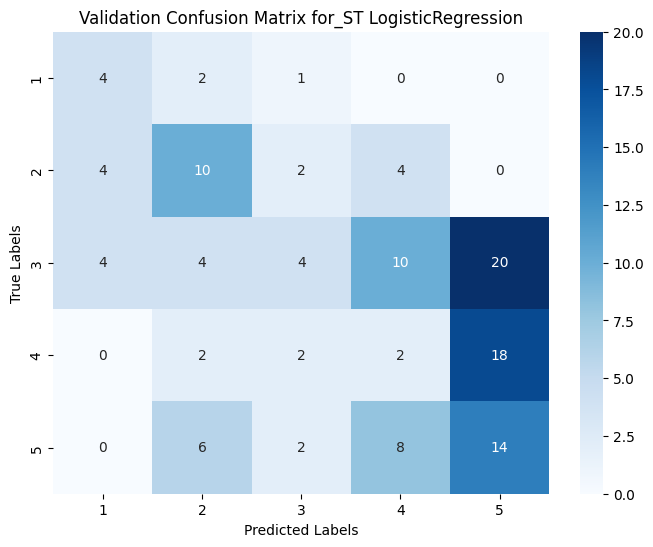

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.10      0.14      0.12         7
           2       0.50      0.47      0.48        15
           3       0.27      0.19      0.22        16
           4       0.39      0.35      0.37        20
           5       0.22      0.50      0.31         4

    accuracy                           0.32        62
   macro avg       0.30      0.33      0.30        62
weighted avg       0.34      0.32      0.33        62



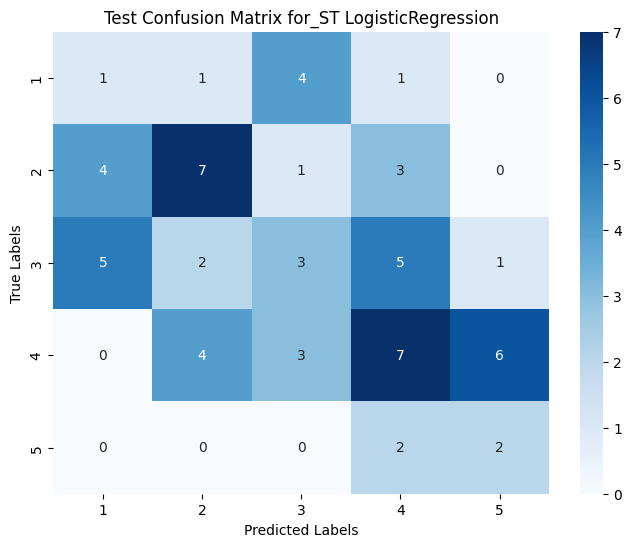


Evaluating KNeighbors model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.92      1.00      0.96       207
           2       0.92      1.00      0.96       207
           3       0.89      0.98      0.93       207
           4       0.87      0.97      0.92       207
           5       0.99      0.61      0.75       207

    accuracy                           0.91      1035
   macro avg       0.92      0.91      0.90      1035
weighted avg       0.92      0.91      0.90      1035



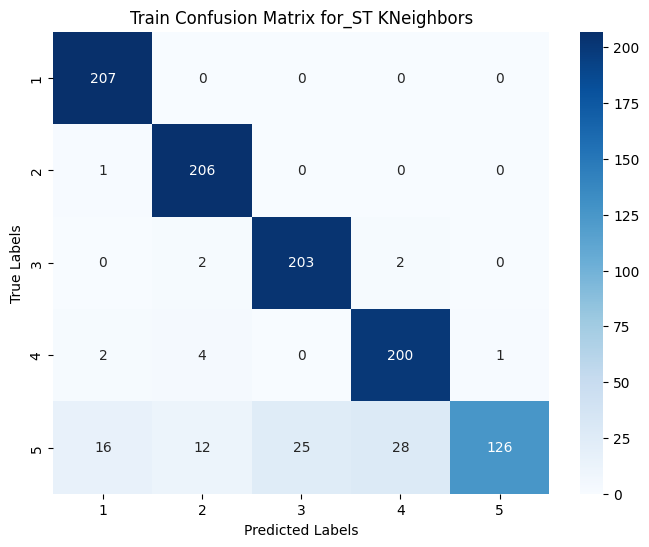

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.17      0.57      0.26         7
           2       0.30      0.40      0.34        20
           3       0.46      0.29      0.35        42
           4       0.33      0.25      0.29        24
           5       0.43      0.40      0.41        30

    accuracy                           0.34       123
   macro avg       0.34      0.38      0.33       123
weighted avg       0.38      0.34      0.35       123



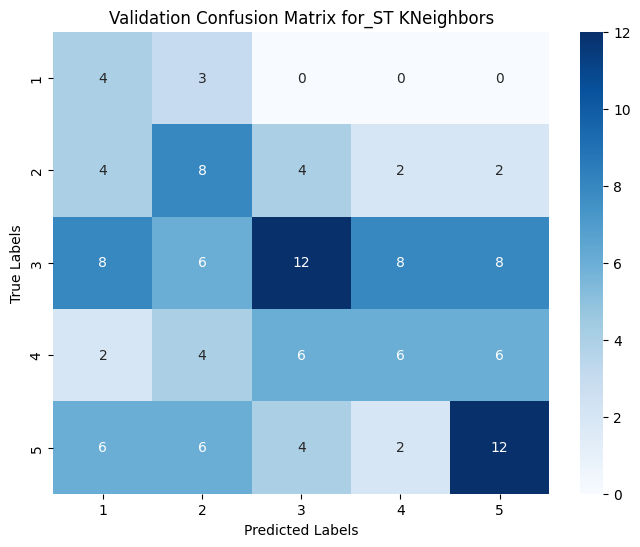

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.13      0.29      0.18         7
           2       0.33      0.40      0.36        15
           3       0.38      0.31      0.34        16
           4       0.55      0.30      0.39        20
           5       0.60      0.75      0.67         4

    accuracy                           0.35        62
   macro avg       0.40      0.41      0.39        62
weighted avg       0.41      0.35      0.37        62



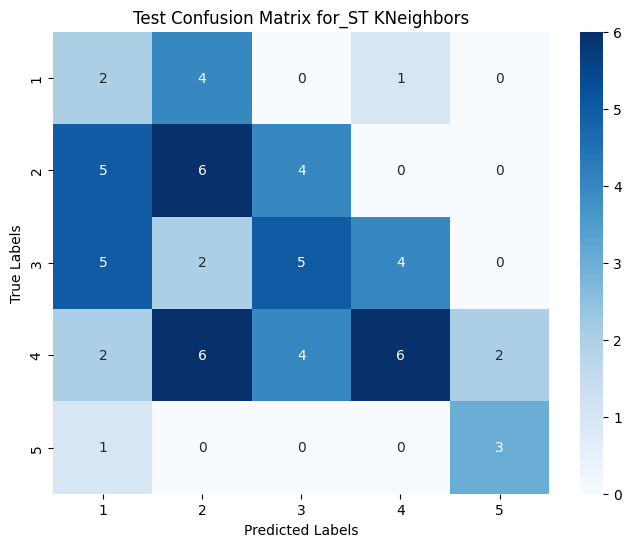


Evaluating NaiveBayes model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.82      0.91      0.86       207
           2       0.77      0.79      0.78       207
           3       0.65      0.58      0.62       207
           4       0.63      0.60      0.61       207
           5       0.65      0.67      0.66       207

    accuracy                           0.71      1035
   macro avg       0.71      0.71      0.71      1035
weighted avg       0.71      0.71      0.71      1035



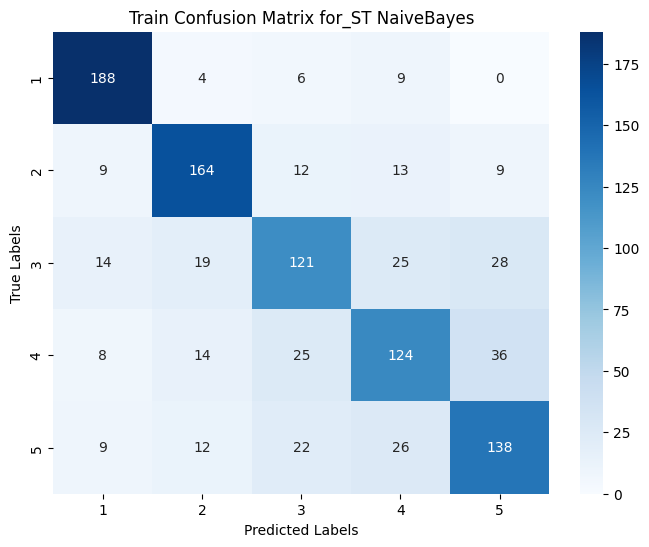

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.20      0.29      0.24         7
           2       0.33      0.30      0.32        20
           3       0.17      0.10      0.12        42
           4       0.15      0.17      0.16        24
           5       0.22      0.33      0.26        30

    accuracy                           0.21       123
   macro avg       0.22      0.24      0.22       123
weighted avg       0.21      0.21      0.20       123



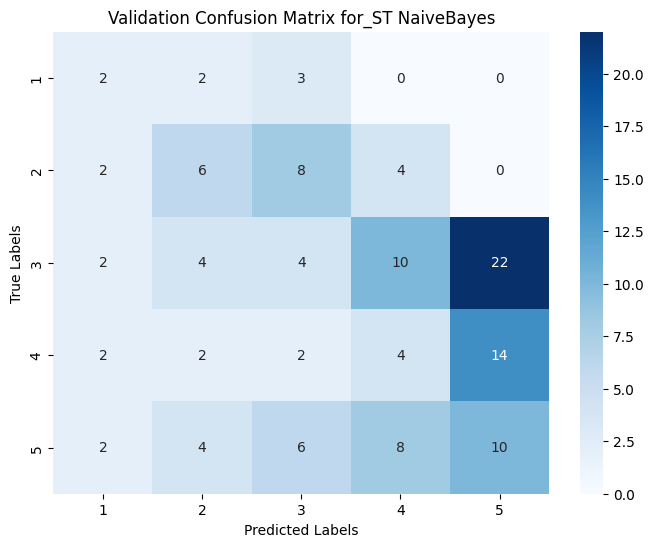

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.25      0.20      0.22        15
           3       0.12      0.12      0.12        16
           4       0.44      0.35      0.39        20
           5       0.15      0.50      0.24         4

    accuracy                           0.23        62
   macro avg       0.19      0.24      0.19        62
weighted avg       0.24      0.23      0.23        62



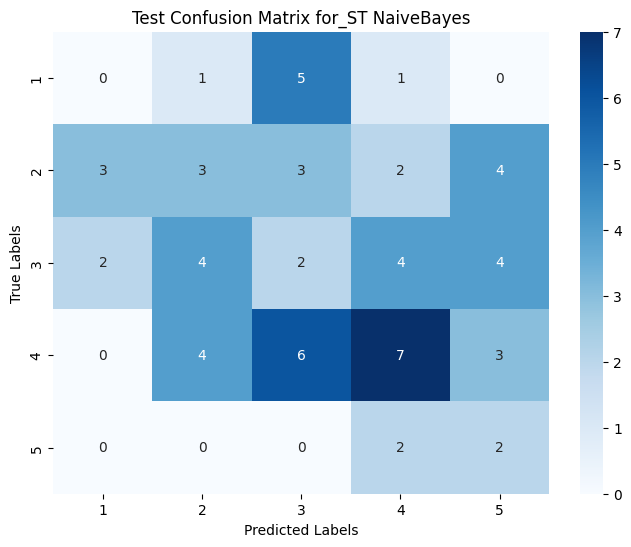


Evaluating DecisionTree model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       207
           2       1.00      1.00      1.00       207
           3       1.00      1.00      1.00       207
           4       1.00      1.00      1.00       207
           5       1.00      1.00      1.00       207

    accuracy                           1.00      1035
   macro avg       1.00      1.00      1.00      1035
weighted avg       1.00      1.00      1.00      1035



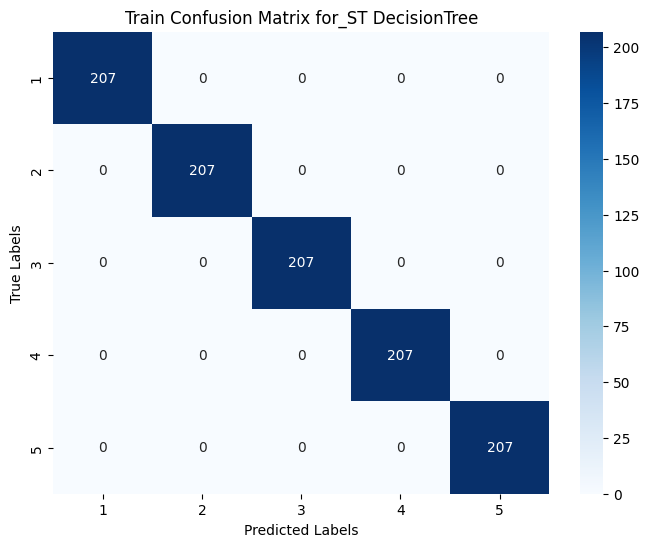

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.27      0.30      0.29        20
           3       0.45      0.33      0.38        42
           4       0.29      0.42      0.34        24
           5       0.40      0.40      0.40        30

    accuracy                           0.34       123
   macro avg       0.28      0.29      0.28       123
weighted avg       0.35      0.34      0.34       123



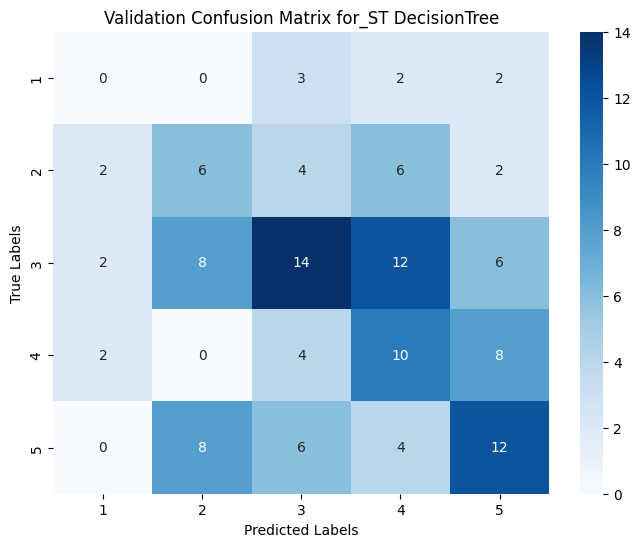

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.60      0.43      0.50         7
           2       0.42      0.33      0.37        15
           3       0.18      0.12      0.15        16
           4       0.44      0.35      0.39        20
           5       0.11      0.50      0.18         4

    accuracy                           0.31        62
   macro avg       0.35      0.35      0.32        62
weighted avg       0.36      0.31      0.32        62



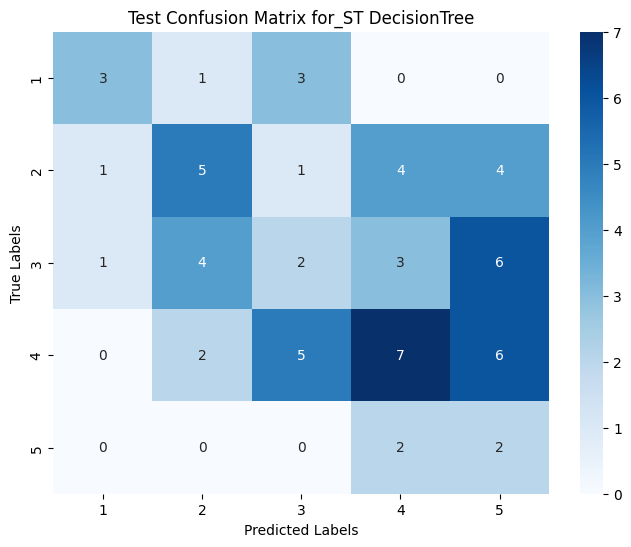


Evaluating AdaBoost model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       0.80      0.92      0.85       207
           2       0.75      0.54      0.63       207
           3       0.71      0.57      0.64       207
           4       0.41      0.63      0.50       207
           5       0.55      0.43      0.49       207

    accuracy                           0.62      1035
   macro avg       0.64      0.62      0.62      1035
weighted avg       0.64      0.62      0.62      1035



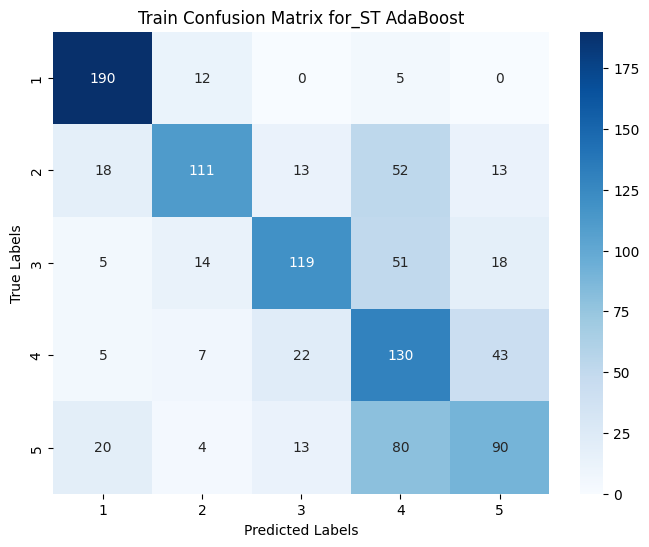

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         7
           2       0.00      0.00      0.00        20
           3       0.30      0.14      0.19        42
           4       0.19      0.42      0.26        24
           5       0.36      0.33      0.34        30

    accuracy                           0.21       123
   macro avg       0.17      0.18      0.16       123
weighted avg       0.23      0.21      0.20       123



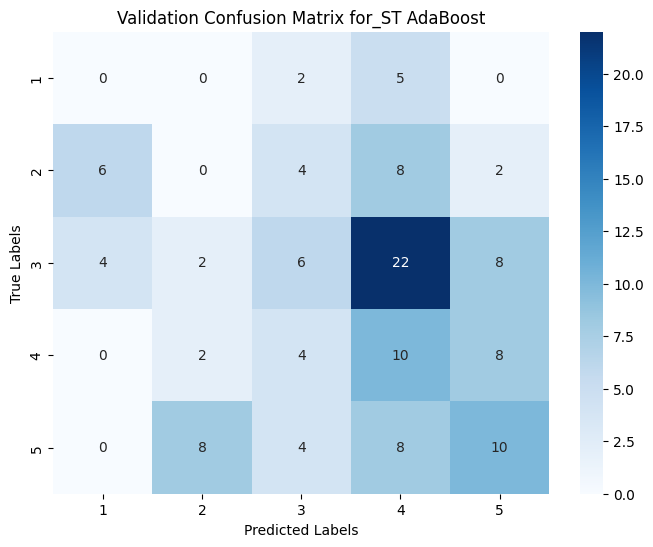

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.36      0.57      0.44         7
           2       0.54      0.47      0.50        15
           3       0.55      0.38      0.44        16
           4       0.41      0.45      0.43        20
           5       0.20      0.25      0.22         4

    accuracy                           0.44        62
   macro avg       0.41      0.42      0.41        62
weighted avg       0.46      0.44      0.44        62



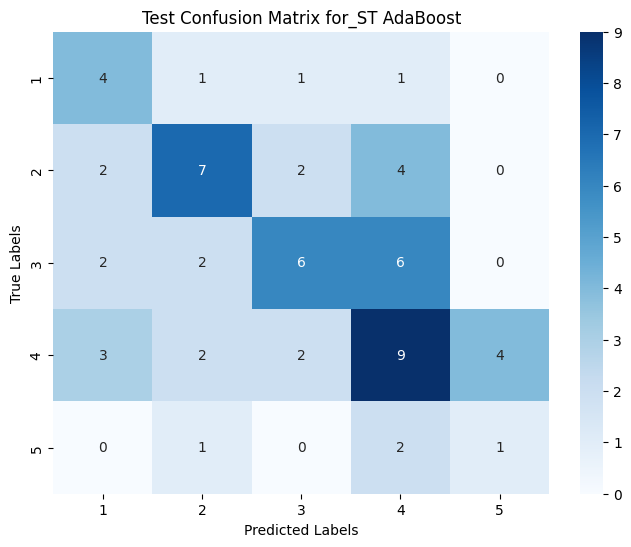


Evaluating Bagging model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       207
           2       1.00      1.00      1.00       207
           3       1.00      1.00      1.00       207
           4       1.00      1.00      1.00       207
           5       1.00      1.00      1.00       207

    accuracy                           1.00      1035
   macro avg       1.00      1.00      1.00      1035
weighted avg       1.00      1.00      1.00      1035



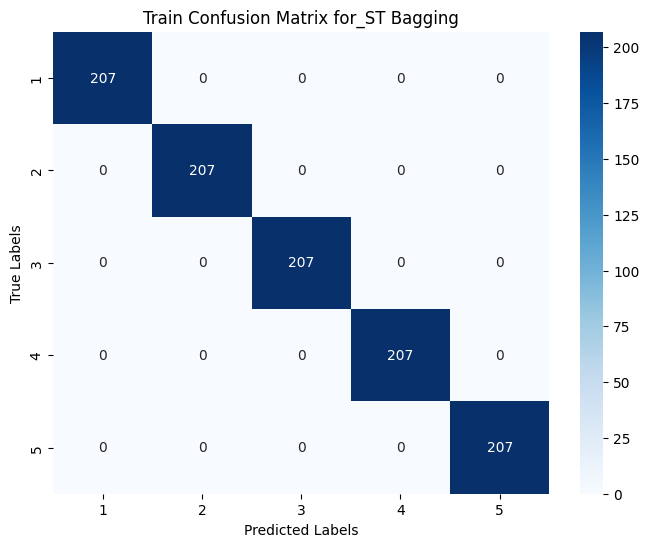

Validation Classification Report_ST:
              precision    recall  f1-score   support

           1       0.17      0.29      0.21         7
           2       0.22      0.20      0.21        20
           3       0.39      0.29      0.33        42
           4       0.20      0.25      0.22        24
           5       0.38      0.40      0.39        30

    accuracy                           0.29       123
   macro avg       0.27      0.28      0.27       123
weighted avg       0.31      0.29      0.30       123



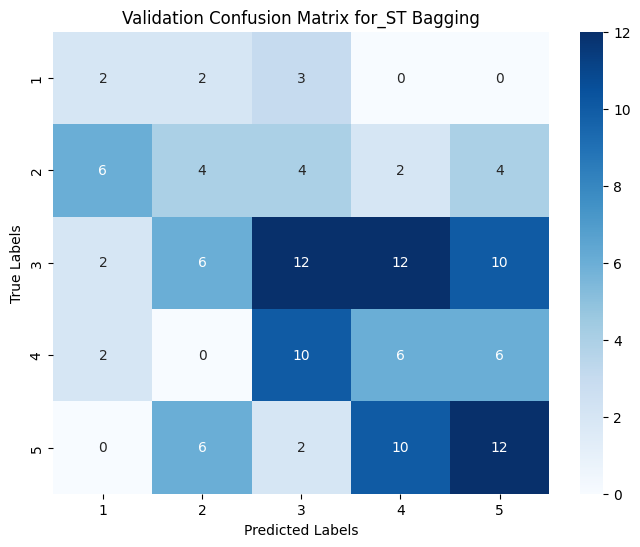

Test Classification Report_ST:
              precision    recall  f1-score   support

           1       0.18      0.29      0.22         7
           2       0.23      0.20      0.21        15
           3       0.25      0.31      0.28        16
           4       0.46      0.30      0.36        20
           5       0.40      0.50      0.44         4

    accuracy                           0.29        62
   macro avg       0.30      0.32      0.30        62
weighted avg       0.32      0.29      0.29        62



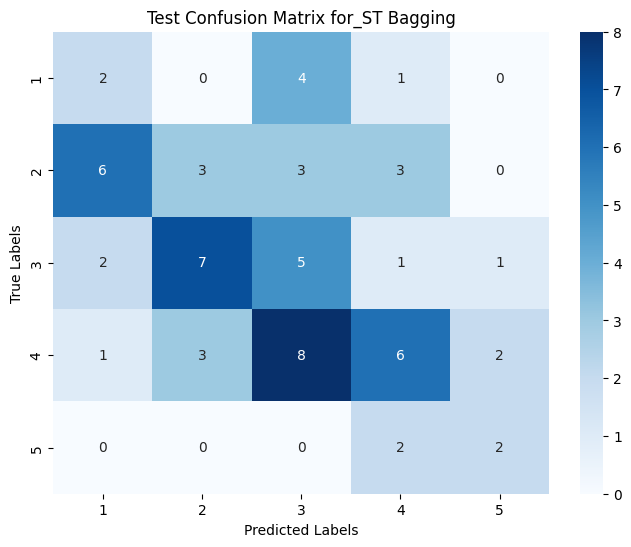

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import MinMaxScaler

# Define pipelines for each model_ST
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    # "GradientBoosting": Pipeline([
    #     ("classifier", GradientBoostingClassifier(random_state=1))
    # ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}
results = []
# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Train the model
    pipeline.fit(X_train, y_train)

     # Predict on train data
    y_train_pred = pipeline.predict(X_train)
    train_accuracy_st = accuracy_score(y_train, y_train_pred)
    train_precision_st = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = pipeline.predict(X_val)
    val_accuracy_st = accuracy_score(y_val, y_val_pred)
    val_precision_st = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = pipeline.predict(X_test)
    test_accuracy_st = accuracy_score(y_test, y_test_pred)
    test_precision_st = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st = f1_score(y_test, y_test_pred, average="weighted")

    # Predict on train data
    #y_train_pred = pipeline.predict(X_train)
    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(classification_report(y_train, y_train_pred))

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
   # y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(classification_report(y_val, y_val_pred))

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    #y_test_pred = pipeline.predict(X_test)
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df = pd.DataFrame(results)
print(results_df)
results_df.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_smote_potential_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   0.784091  1.000000  0.878981    207.0
1        SVM  Train     2   0.737037  0.961353  0.834382    207.0
2        SVM  Train     3   0.787037  0.821256  0.803783    207.0
3        SVM  Train     4   0.812834  0.734300  0.771574    207.0
4        SVM  Train     5   1.000000  0.473430  0.642623    207.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     1   0.181818  0.285714  0.222222      7.0
116  Bagging   Test     2   0.230769  0.200000  0.214286     15.0
117  Bagging   Test     3   0.250000  0.312500  0.277778     16.0
118  Bagging   Test     4   0.461538  0.300000  0.363636     20.0
119  Bagging   Test     5   0.400000  0.500000  0.444444      4.0

[120 rows x 7 columns]


## Hyperparameter Tuning- Sentence Transformer


Hyperparameter tuning and evaluating SVM model:
Best parameters for SVM: {'classifier__C': 100, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}}


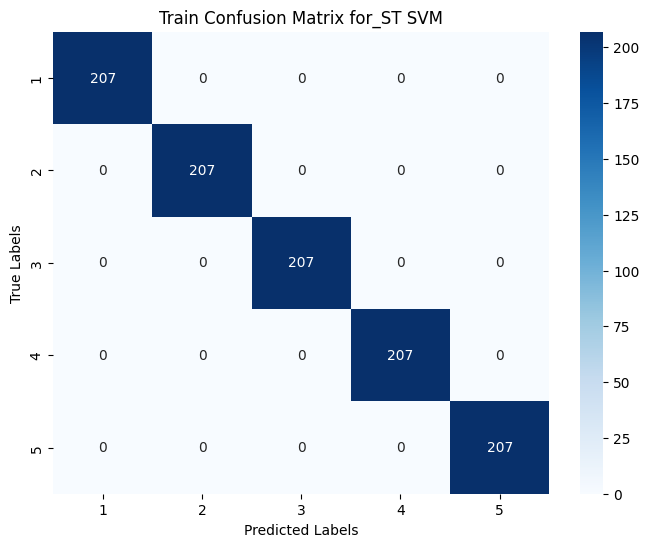

Validation Classification Report_ST:
{'1': {'precision': 0.3333333333333333, 'recall': 0.5714285714285714, 'f1-score': 0.42105263157894735, 'support': 7.0}, '2': {'precision': 0.3076923076923077, 'recall': 0.4, 'f1-score': 0.34782608695652173, 'support': 20.0}, '3': {'precision': 0.47058823529411764, 'recall': 0.19047619047619047, 'f1-score': 0.2711864406779661, 'support': 42.0}, '4': {'precision': 0.29411764705882354, 'recall': 0.4166666666666667, 'f1-score': 0.3448275862068966, 'support': 24.0}, '5': {'precision': 0.47058823529411764, 'recall': 0.5333333333333333, 'f1-score': 0.5, 'support': 30.0}, 'accuracy': 0.37398373983739835, 'macro avg': {'precision': 0.37526395173453997, 'recall': 0.4223809523809524, 'f1-score': 0.37697854908406636, 'support': 123.0}, 'weighted avg': {'precision': 0.40185655250217667, 'recall': 0.37398373983739835, 'f1-score': 0.3623543312001883, 'support': 123.0}}


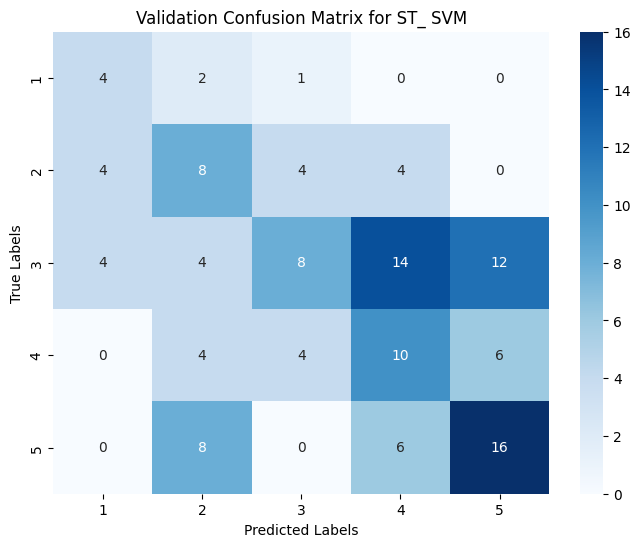

Test Classification Report_ST:
{'1': {'precision': 0.14285714285714285, 'recall': 0.14285714285714285, 'f1-score': 0.14285714285714285, 'support': 7.0}, '2': {'precision': 0.29411764705882354, 'recall': 0.3333333333333333, 'f1-score': 0.3125, 'support': 15.0}, '3': {'precision': 0.26666666666666666, 'recall': 0.25, 'f1-score': 0.25806451612903225, 'support': 16.0}, '4': {'precision': 0.5, 'recall': 0.4, 'f1-score': 0.4444444444444444, 'support': 20.0}, '5': {'precision': 0.2857142857142857, 'recall': 0.5, 'f1-score': 0.36363636363636365, 'support': 4.0}, 'accuracy': 0.3225806451612903, 'macro avg': {'precision': 0.2978711484593838, 'recall': 0.3252380952380952, 'f1-score': 0.30430049341339666, 'support': 62.0}, 'weighted avg': {'precision': 0.33582723411945425, 'recall': 0.3225806451612903, 'f1-score': 0.32516075163707836, 'support': 62.0}}


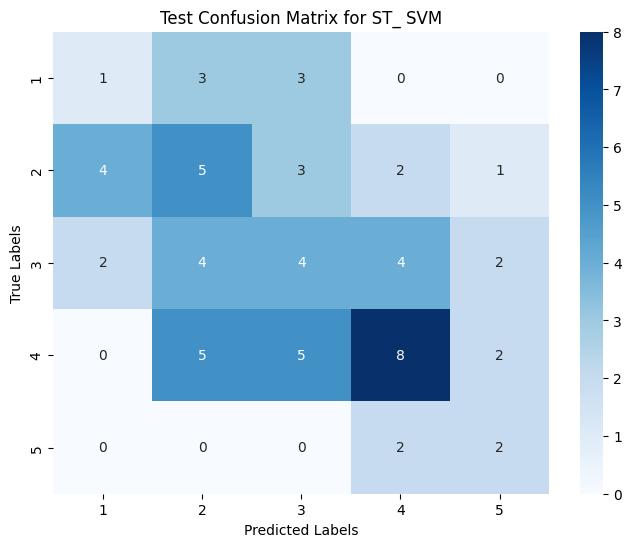


Hyperparameter tuning and evaluating RandomForest model:
Best parameters for RandomForest: {'classifier__max_depth': 10, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}}


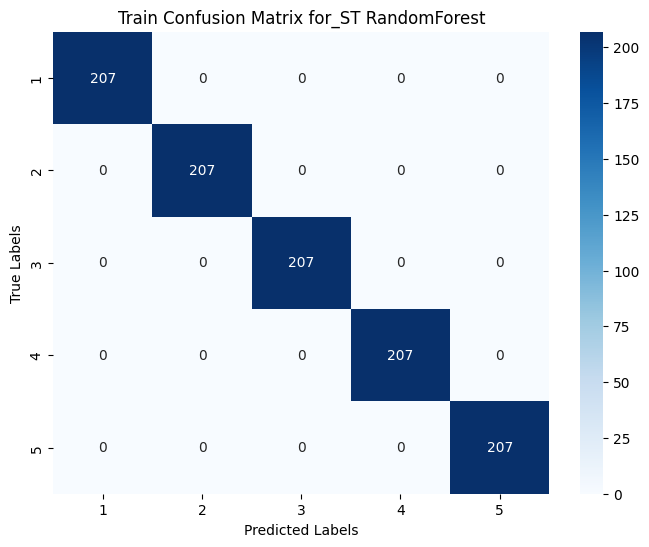

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.6, 'recall': 0.3, 'f1-score': 0.4, 'support': 20.0}, '3': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 42.0}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 24.0}, '5': {'precision': 0.2631578947368421, 'recall': 0.6666666666666666, 'f1-score': 0.37735849056603776, 'support': 30.0}, 'accuracy': 0.21138211382113822, 'macro avg': {'precision': 0.1726315789473684, 'recall': 0.1933333333333333, 'f1-score': 0.15547169811320755, 'support': 123.0}, 'weighted avg': {'precision': 0.16174582798459564, 'recall': 0.21138211382113822, 'f1-score': 0.15707930664212305, 'support': 123.0}}


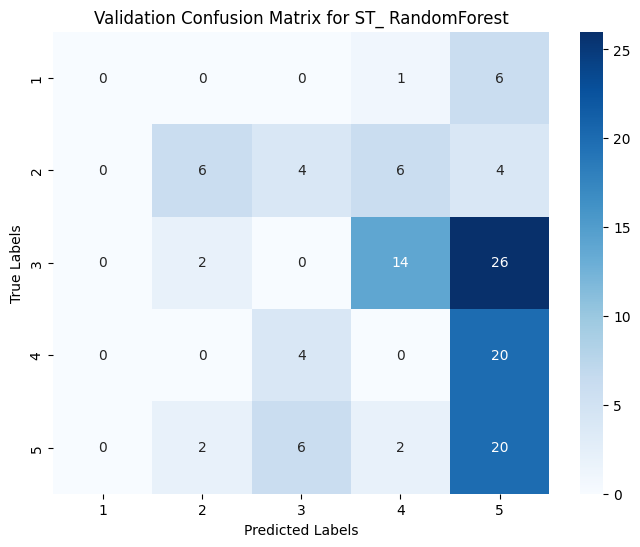

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.3333333333333333, 'recall': 0.13333333333333333, 'f1-score': 0.19047619047619047, 'support': 15.0}, '3': {'precision': 0.3, 'recall': 0.1875, 'f1-score': 0.23076923076923078, 'support': 16.0}, '4': {'precision': 0.45, 'recall': 0.45, 'f1-score': 0.45, 'support': 20.0}, '5': {'precision': 0.15384615384615385, 'recall': 1.0, 'f1-score': 0.26666666666666666, 'support': 4.0}, 'accuracy': 0.2903225806451613, 'macro avg': {'precision': 0.24743589743589745, 'recall': 0.35416666666666663, 'f1-score': 0.22758241758241757, 'support': 62.0}, 'weighted avg': {'precision': 0.313151364764268, 'recall': 0.2903225806451613, 'f1-score': 0.26800189058253576, 'support': 62.0}}


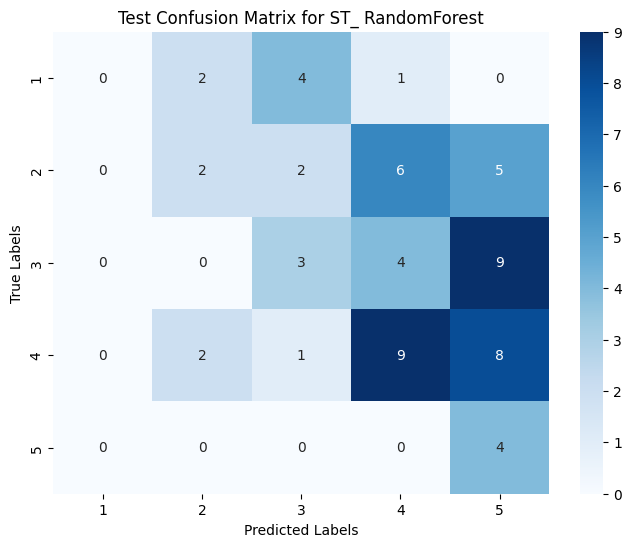


Hyperparameter tuning and evaluating LogisticRegression model:
Best parameters for LogisticRegression: {'classifier__C': 10, 'classifier__solver': 'lbfgs'}
Train Classification Report_ST:
{'1': {'precision': 0.9857142857142858, 'recall': 1.0, 'f1-score': 0.9928057553956835, 'support': 207.0}, '2': {'precision': 0.9902439024390244, 'recall': 0.9806763285024155, 'f1-score': 0.9854368932038835, 'support': 207.0}, '3': {'precision': 0.981042654028436, 'recall': 1.0, 'f1-score': 0.9904306220095693, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 0.9710144927536232, 'f1-score': 0.9852941176470589, 'support': 207.0}, '5': {'precision': 0.9615384615384616, 'recall': 0.966183574879227, 'f1-score': 0.963855421686747, 'support': 207.0}, 'accuracy': 0.9835748792270531, 'macro avg': {'precision': 0.9837078607440416, 'recall': 0.9835748792270531, 'f1-score': 0.9835645619885884, 'support': 1035.0}, 'weighted avg': {'precision': 0.9837078607440415, 'recall': 0.9835748792270531, 'f1-score': 0.983

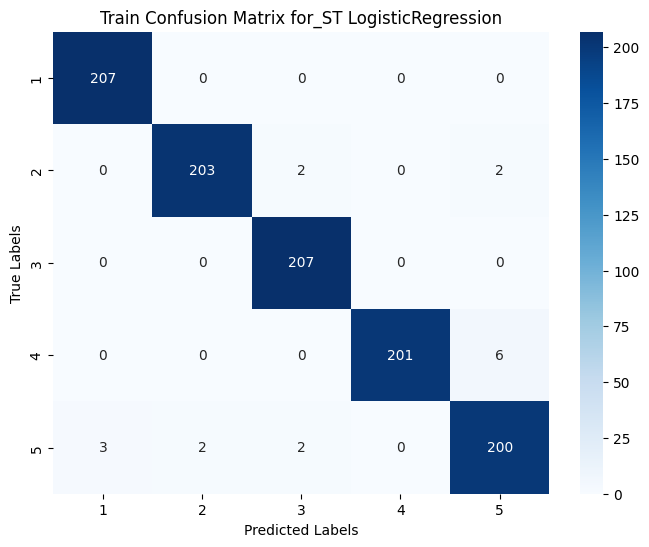

Validation Classification Report_ST:
{'1': {'precision': 0.25, 'recall': 0.2857142857142857, 'f1-score': 0.26666666666666666, 'support': 7.0}, '2': {'precision': 0.38461538461538464, 'recall': 0.5, 'f1-score': 0.43478260869565216, 'support': 20.0}, '3': {'precision': 0.5714285714285714, 'recall': 0.19047619047619047, 'f1-score': 0.2857142857142857, 'support': 42.0}, '4': {'precision': 0.14814814814814814, 'recall': 0.16666666666666666, 'f1-score': 0.1568627450980392, 'support': 24.0}, '5': {'precision': 0.25, 'recall': 0.4, 'f1-score': 0.3076923076923077, 'support': 30.0}, 'accuracy': 0.2926829268292683, 'macro avg': {'precision': 0.32083842083842085, 'recall': 0.30857142857142855, 'f1-score': 0.29034372277339027, 'support': 123.0}, 'weighted avg': {'precision': 0.3617712459175874, 'recall': 0.2926829268292683, 'f1-score': 0.2890877557211535, 'support': 123.0}}


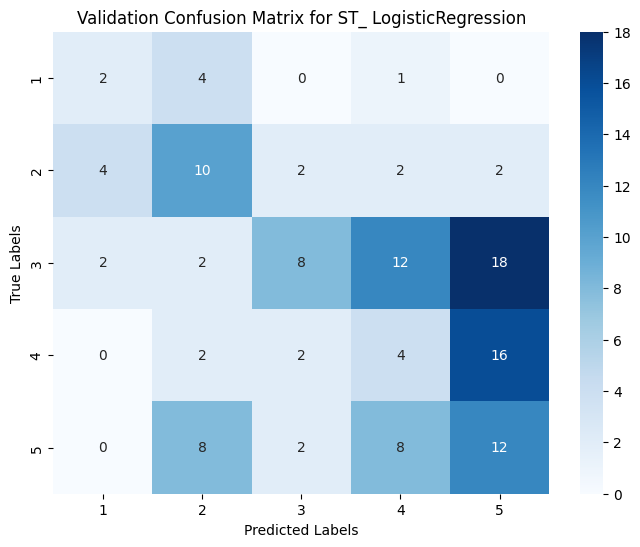

Test Classification Report_ST:
{'1': {'precision': 0.125, 'recall': 0.14285714285714285, 'f1-score': 0.13333333333333333, 'support': 7.0}, '2': {'precision': 0.42857142857142855, 'recall': 0.4, 'f1-score': 0.41379310344827586, 'support': 15.0}, '3': {'precision': 0.3333333333333333, 'recall': 0.25, 'f1-score': 0.2857142857142857, 'support': 16.0}, '4': {'precision': 0.3684210526315789, 'recall': 0.35, 'f1-score': 0.358974358974359, 'support': 20.0}, '5': {'precision': 0.2222222222222222, 'recall': 0.5, 'f1-score': 0.3076923076923077, 'support': 4.0}, 'accuracy': 0.3225806451612903, 'macro avg': {'precision': 0.2955096073517126, 'recall': 0.32857142857142857, 'f1-score': 0.2999014778325123, 'support': 62.0}, 'weighted avg': {'precision': 0.33700346295847144, 'recall': 0.3225806451612903, 'f1-score': 0.32454701397971697, 'support': 62.0}}


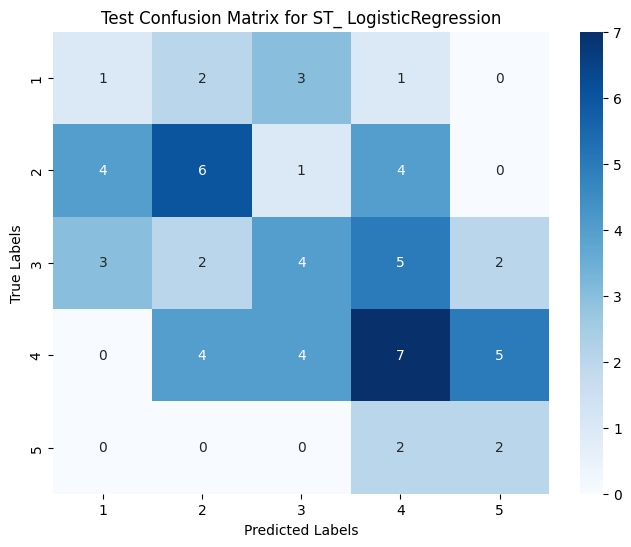


Hyperparameter tuning and evaluating KNeighbors model:
Best parameters for KNeighbors: {'classifier__n_neighbors': 3, 'classifier__weights': 'distance'}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}}


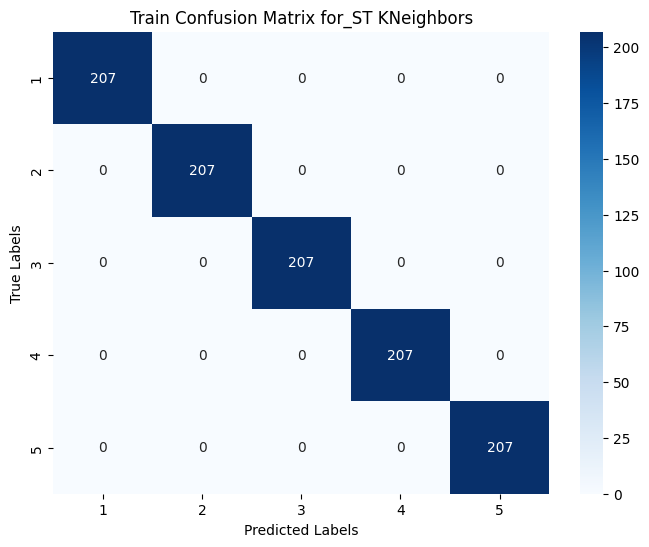

Validation Classification Report_ST:
{'1': {'precision': 0.2, 'recall': 0.5714285714285714, 'f1-score': 0.2962962962962963, 'support': 7.0}, '2': {'precision': 0.4, 'recall': 0.4, 'f1-score': 0.4, 'support': 20.0}, '3': {'precision': 0.5454545454545454, 'recall': 0.2857142857142857, 'f1-score': 0.375, 'support': 42.0}, '4': {'precision': 0.34782608695652173, 'recall': 0.3333333333333333, 'f1-score': 0.3404255319148936, 'support': 24.0}, '5': {'precision': 0.3157894736842105, 'recall': 0.4, 'f1-score': 0.35294117647058826, 'support': 30.0}, 'accuracy': 0.35772357723577236, 'macro avg': {'precision': 0.36181402121905554, 'recall': 0.3980952380952381, 'f1-score': 0.35293260093635564, 'support': 123.0}, 'weighted avg': {'precision': 0.4075658634680792, 'recall': 0.35772357723577236, 'f1-score': 0.36245952954592825, 'support': 123.0}}


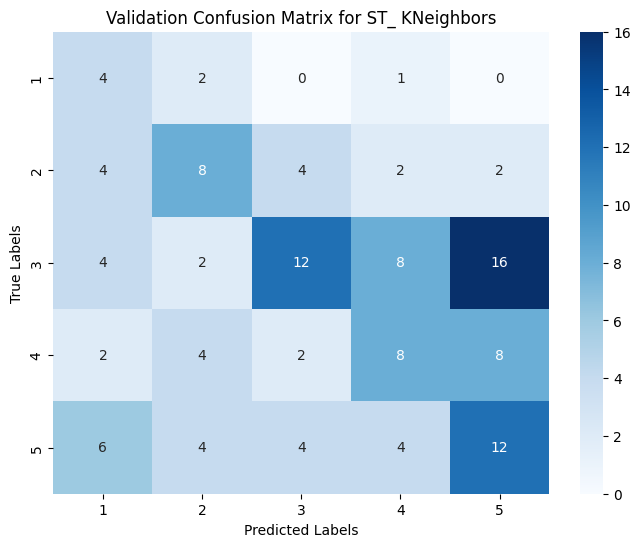

Test Classification Report_ST:
{'1': {'precision': 0.08333333333333333, 'recall': 0.14285714285714285, 'f1-score': 0.10526315789473684, 'support': 7.0}, '2': {'precision': 0.38461538461538464, 'recall': 0.3333333333333333, 'f1-score': 0.35714285714285715, 'support': 15.0}, '3': {'precision': 0.4666666666666667, 'recall': 0.4375, 'f1-score': 0.45161290322580644, 'support': 16.0}, '4': {'precision': 0.42857142857142855, 'recall': 0.15, 'f1-score': 0.2222222222222222, 'support': 20.0}, '5': {'precision': 0.2, 'recall': 0.75, 'f1-score': 0.3157894736842105, 'support': 4.0}, 'accuracy': 0.3064516129032258, 'macro avg': {'precision': 0.31263736263736264, 'recall': 0.36273809523809525, 'f1-score': 0.29040612283396666, 'support': 62.0}, 'weighted avg': {'precision': 0.3740428925912797, 'recall': 0.3064516129032258, 'f1-score': 0.3068934476322614, 'support': 62.0}}


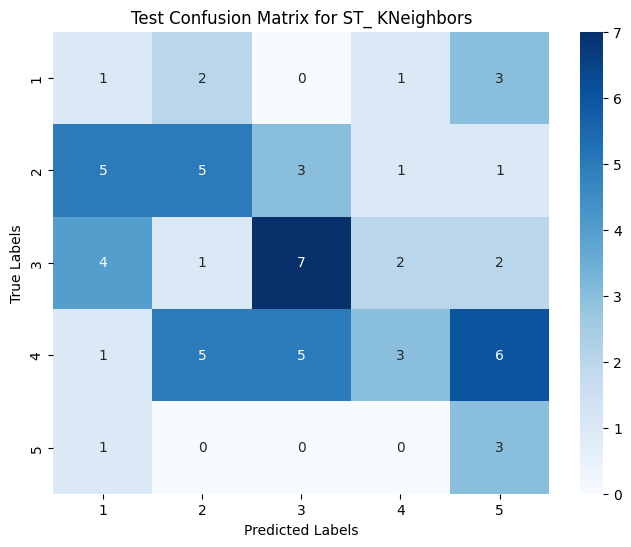


Hyperparameter tuning and evaluating NaiveBayes model:
Best parameters for NaiveBayes: {'classifier__alpha': 1.0}
Train Classification Report_ST:
{'1': {'precision': 0.8245614035087719, 'recall': 0.9082125603864735, 'f1-score': 0.864367816091954, 'support': 207.0}, '2': {'precision': 0.7699530516431925, 'recall': 0.7922705314009661, 'f1-score': 0.780952380952381, 'support': 207.0}, '3': {'precision': 0.6505376344086021, 'recall': 0.5845410628019324, 'f1-score': 0.6157760814249363, 'support': 207.0}, '4': {'precision': 0.6294416243654822, 'recall': 0.5990338164251208, 'f1-score': 0.6138613861386139, 'support': 207.0}, '5': {'precision': 0.6540284360189573, 'recall': 0.6666666666666666, 'f1-score': 0.6602870813397129, 'support': 207.0}, 'accuracy': 0.7101449275362319, 'macro avg': {'precision': 0.7057044299890012, 'recall': 0.7101449275362318, 'f1-score': 0.7070489491895197, 'support': 1035.0}, 'weighted avg': {'precision': 0.7057044299890012, 'recall': 0.7101449275362319, 'f1-score': 0

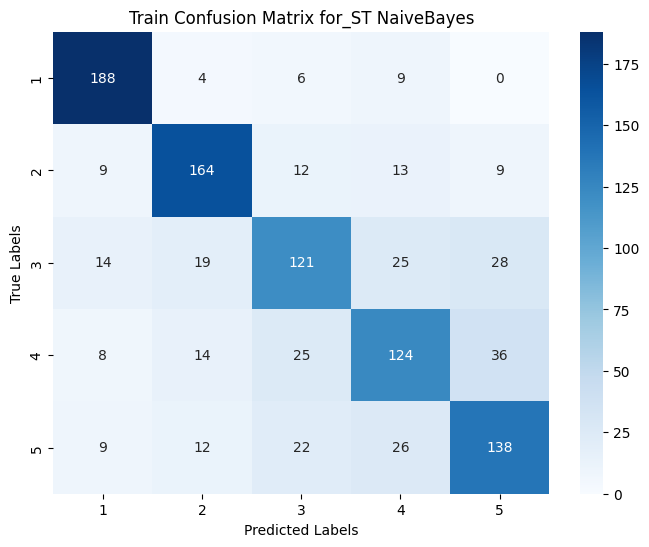

Validation Classification Report_ST:
{'1': {'precision': 0.2, 'recall': 0.2857142857142857, 'f1-score': 0.23529411764705882, 'support': 7.0}, '2': {'precision': 0.3333333333333333, 'recall': 0.3, 'f1-score': 0.3157894736842105, 'support': 20.0}, '3': {'precision': 0.17391304347826086, 'recall': 0.09523809523809523, 'f1-score': 0.12307692307692308, 'support': 42.0}, '4': {'precision': 0.15384615384615385, 'recall': 0.16666666666666666, 'f1-score': 0.16, 'support': 24.0}, '5': {'precision': 0.21739130434782608, 'recall': 0.3333333333333333, 'f1-score': 0.2631578947368421, 'support': 30.0}, 'accuracy': 0.21138211382113822, 'macro avg': {'precision': 0.21569676700111481, 'recall': 0.23619047619047615, 'f1-score': 0.2194636818290069, 'support': 123.0}, 'weighted avg': {'precision': 0.2080086285812691, 'recall': 0.21138211382113822, 'f1-score': 0.20216923502885897, 'support': 123.0}}


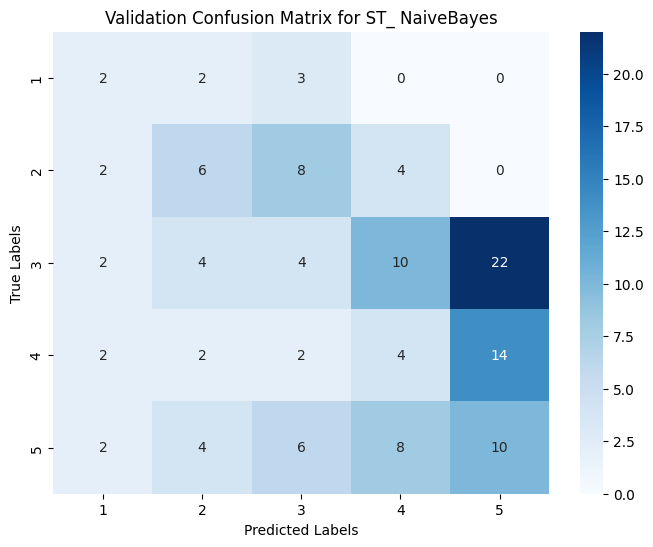

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.25, 'recall': 0.2, 'f1-score': 0.2222222222222222, 'support': 15.0}, '3': {'precision': 0.125, 'recall': 0.125, 'f1-score': 0.125, 'support': 16.0}, '4': {'precision': 0.4375, 'recall': 0.35, 'f1-score': 0.3888888888888889, 'support': 20.0}, '5': {'precision': 0.15384615384615385, 'recall': 0.5, 'f1-score': 0.23529411764705882, 'support': 4.0}, 'accuracy': 0.22580645161290322, 'macro avg': {'precision': 0.19326923076923078, 'recall': 0.23500000000000001, 'f1-score': 0.19428104575163402, 'support': 62.0}, 'weighted avg': {'precision': 0.24379652605459057, 'recall': 0.22580645161290322, 'f1-score': 0.22664979970482815, 'support': 62.0}}


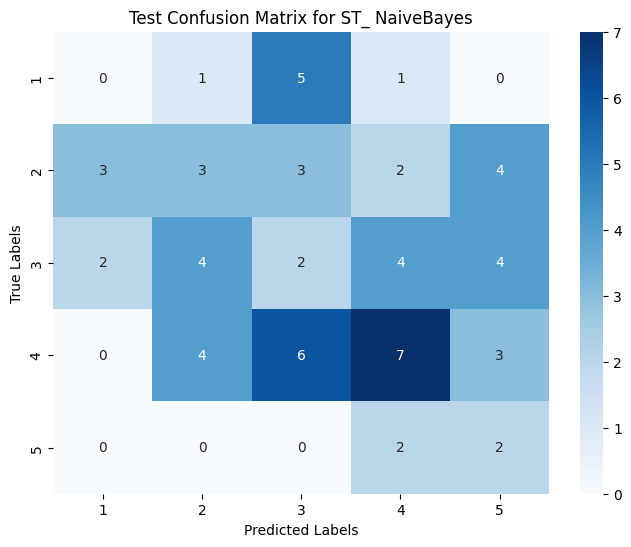


Hyperparameter tuning and evaluating DecisionTree model:
Best parameters for DecisionTree: {'classifier__max_depth': None, 'classifier__min_samples_split': 2}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}}


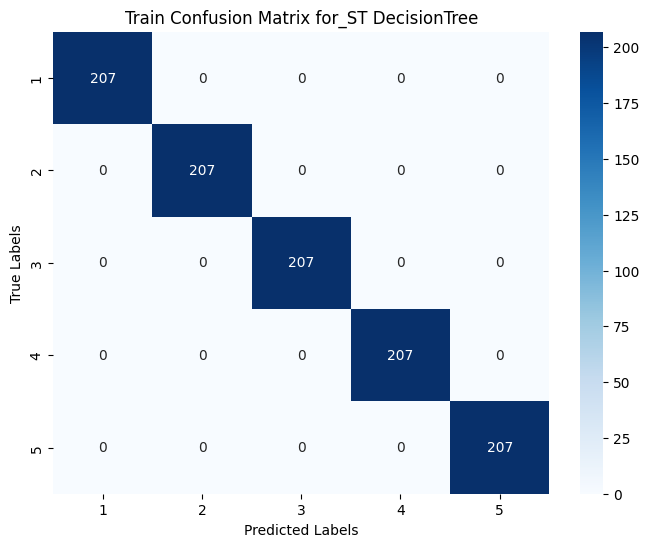

Validation Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.2727272727272727, 'recall': 0.3, 'f1-score': 0.2857142857142857, 'support': 20.0}, '3': {'precision': 0.45161290322580644, 'recall': 0.3333333333333333, 'f1-score': 0.3835616438356164, 'support': 42.0}, '4': {'precision': 0.29411764705882354, 'recall': 0.4166666666666667, 'f1-score': 0.3448275862068966, 'support': 24.0}, '5': {'precision': 0.4, 'recall': 0.4, 'f1-score': 0.4, 'support': 30.0}, 'accuracy': 0.34146341463414637, 'macro avg': {'precision': 0.28369156460238054, 'recall': 0.29000000000000004, 'f1-score': 0.2828207031513597, 'support': 123.0}, 'weighted avg': {'precision': 0.3535049668247243, 'recall': 0.34146341463414637, 'f1-score': 0.3422742831247733, 'support': 123.0}}


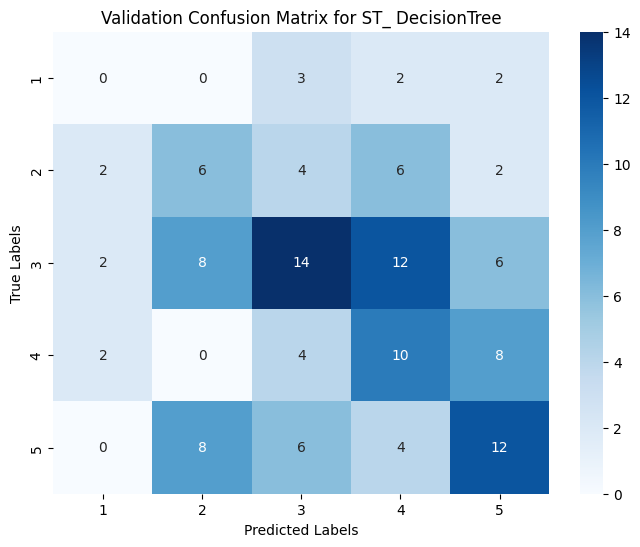

Test Classification Report_ST:
{'1': {'precision': 0.6, 'recall': 0.42857142857142855, 'f1-score': 0.5, 'support': 7.0}, '2': {'precision': 0.4166666666666667, 'recall': 0.3333333333333333, 'f1-score': 0.37037037037037035, 'support': 15.0}, '3': {'precision': 0.18181818181818182, 'recall': 0.125, 'f1-score': 0.14814814814814814, 'support': 16.0}, '4': {'precision': 0.4375, 'recall': 0.35, 'f1-score': 0.3888888888888889, 'support': 20.0}, '5': {'precision': 0.1111111111111111, 'recall': 0.5, 'f1-score': 0.18181818181818182, 'support': 4.0}, 'accuracy': 0.3064516129032258, 'macro avg': {'precision': 0.3494191919191919, 'recall': 0.3473809523809524, 'f1-score': 0.3178451178451179, 'support': 62.0}, 'weighted avg': {'precision': 0.3637666992505702, 'recall': 0.3064516129032258, 'f1-score': 0.3214673617899424, 'support': 62.0}}


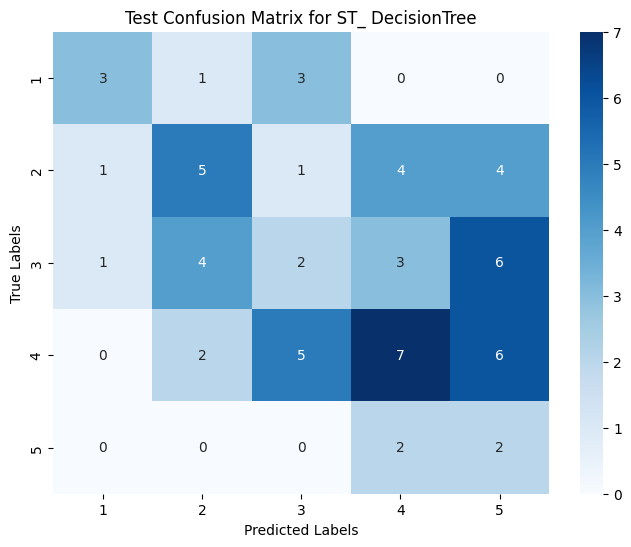


Hyperparameter tuning and evaluating AdaBoost model:
Best parameters for AdaBoost: {'classifier__learning_rate': 1.0, 'classifier__n_estimators': 200}
Train Classification Report_ST:
{'1': {'precision': 0.981042654028436, 'recall': 1.0, 'f1-score': 0.9904306220095693, 'support': 207.0}, '2': {'precision': 0.9937106918238994, 'recall': 0.7632850241545893, 'f1-score': 0.8633879781420765, 'support': 207.0}, '3': {'precision': 0.8072289156626506, 'recall': 0.6473429951690821, 'f1-score': 0.7184986595174263, 'support': 207.0}, '4': {'precision': 0.5057034220532319, 'recall': 0.642512077294686, 'f1-score': 0.5659574468085107, 'support': 207.0}, '5': {'precision': 0.6228813559322034, 'recall': 0.7101449275362319, 'f1-score': 0.6636568848758465, 'support': 207.0}, 'accuracy': 0.7526570048309179, 'macro avg': {'precision': 0.7821134079000842, 'recall': 0.7526570048309179, 'f1-score': 0.7603863182706858, 'support': 1035.0}, 'weighted avg': {'precision': 0.7821134079000842, 'recall': 0.752657004

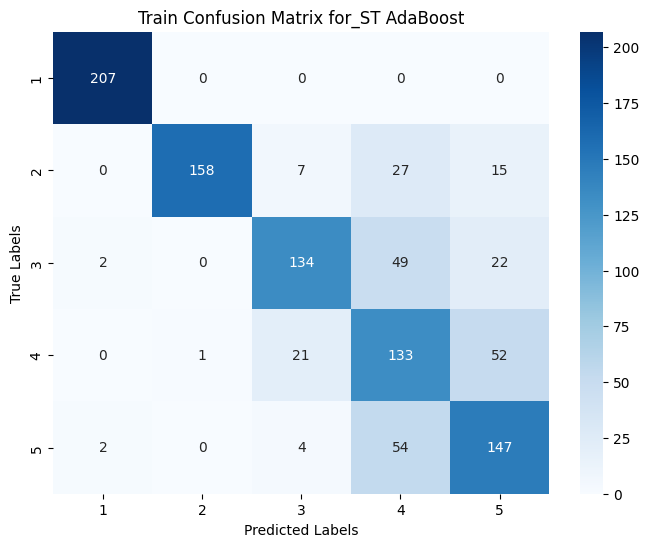

Validation Classification Report_ST:
{'1': {'precision': 0.42857142857142855, 'recall': 0.42857142857142855, 'f1-score': 0.42857142857142855, 'support': 7.0}, '2': {'precision': 0.14285714285714285, 'recall': 0.1, 'f1-score': 0.11764705882352941, 'support': 20.0}, '3': {'precision': 0.14285714285714285, 'recall': 0.047619047619047616, 'f1-score': 0.07142857142857142, 'support': 42.0}, '4': {'precision': 0.25, 'recall': 0.5, 'f1-score': 0.3333333333333333, 'support': 24.0}, '5': {'precision': 0.3, 'recall': 0.4, 'f1-score': 0.34285714285714286, 'support': 30.0}, 'accuracy': 0.25203252032520324, 'macro avg': {'precision': 0.25285714285714284, 'recall': 0.29523809523809524, 'f1-score': 0.2587675070028011, 'support': 123.0}, 'weighted avg': {'precision': 0.2183507549361208, 'recall': 0.25203252032520324, 'f1-score': 0.21657443465190954, 'support': 123.0}}


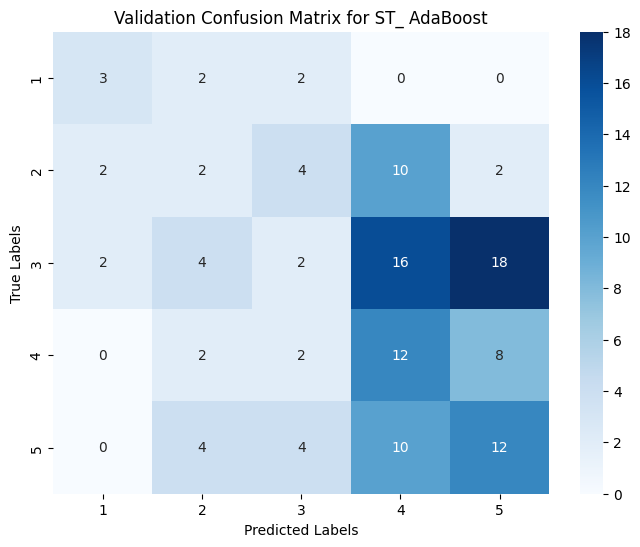

Test Classification Report_ST:
{'1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 7.0}, '2': {'precision': 0.375, 'recall': 0.2, 'f1-score': 0.2608695652173913, 'support': 15.0}, '3': {'precision': 0.3, 'recall': 0.375, 'f1-score': 0.3333333333333333, 'support': 16.0}, '4': {'precision': 0.36363636363636365, 'recall': 0.4, 'f1-score': 0.38095238095238093, 'support': 20.0}, '5': {'precision': 0.125, 'recall': 0.25, 'f1-score': 0.16666666666666666, 'support': 4.0}, 'accuracy': 0.2903225806451613, 'macro avg': {'precision': 0.23272727272727273, 'recall': 0.24500000000000002, 'f1-score': 0.22836438923395447, 'support': 62.0}, 'weighted avg': {'precision': 0.2935117302052786, 'recall': 0.2903225806451613, 'f1-score': 0.28277566285981437, 'support': 62.0}}


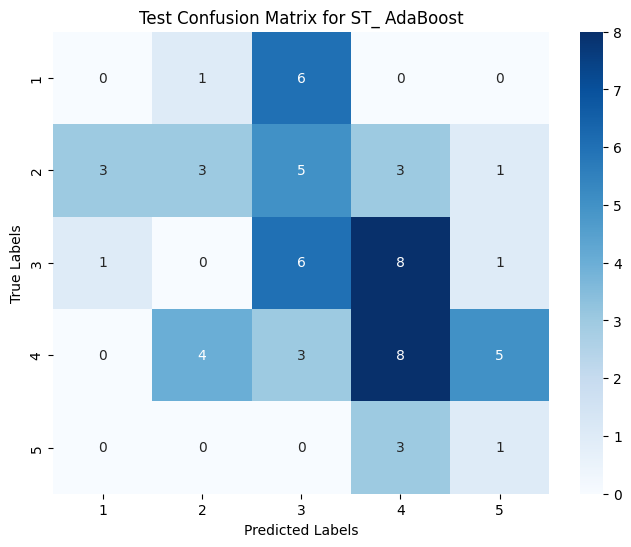


Hyperparameter tuning and evaluating Bagging model:
Best parameters for Bagging: {'classifier__max_samples': 1.0, 'classifier__n_estimators': 100}
Train Classification Report_ST:
{'1': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '2': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '3': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '4': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, '5': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 207.0}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 1035.0}}


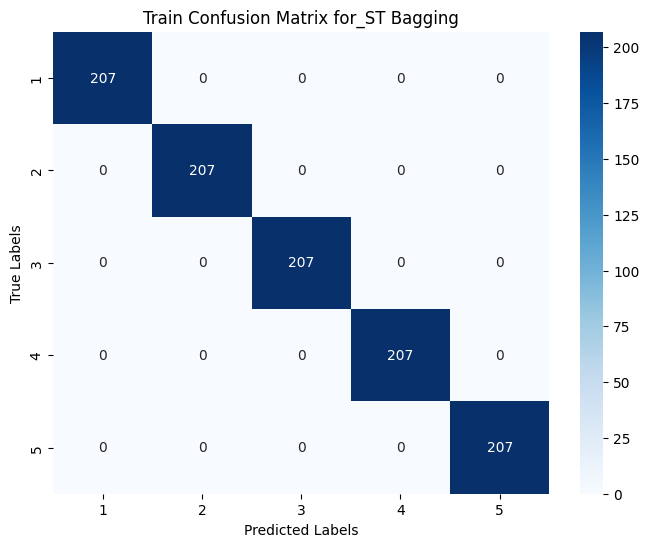

Validation Classification Report_ST:
{'1': {'precision': 0.25, 'recall': 0.2857142857142857, 'f1-score': 0.26666666666666666, 'support': 7.0}, '2': {'precision': 0.42857142857142855, 'recall': 0.6, 'f1-score': 0.5, 'support': 20.0}, '3': {'precision': 0.5, 'recall': 0.3333333333333333, 'f1-score': 0.4, 'support': 42.0}, '4': {'precision': 0.17142857142857143, 'recall': 0.25, 'f1-score': 0.2033898305084746, 'support': 24.0}, '5': {'precision': 0.4166666666666667, 'recall': 0.3333333333333333, 'f1-score': 0.37037037037037035, 'support': 30.0}, 'accuracy': 0.35772357723577236, 'macro avg': {'precision': 0.3533333333333334, 'recall': 0.36047619047619045, 'f1-score': 0.34808537350910224, 'support': 123.0}, 'weighted avg': {'precision': 0.38972125435540067, 'recall': 0.35772357723577236, 'f1-score': 0.3630823878860257, 'support': 123.0}}


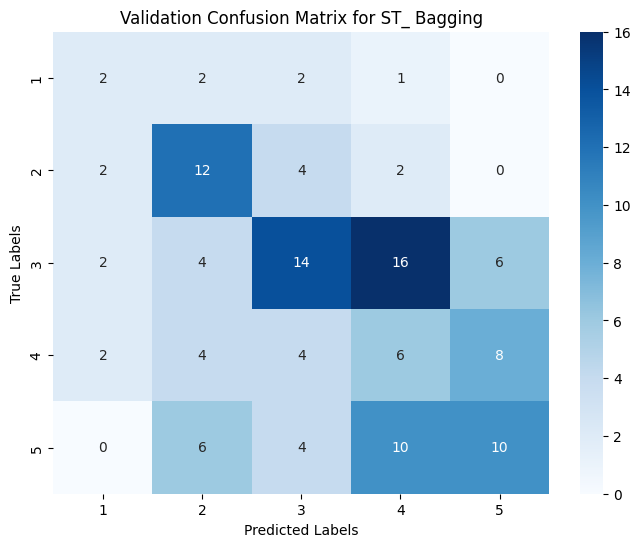

Test Classification Report_ST:
{'1': {'precision': 0.4, 'recall': 0.2857142857142857, 'f1-score': 0.3333333333333333, 'support': 7.0}, '2': {'precision': 0.3, 'recall': 0.4, 'f1-score': 0.34285714285714286, 'support': 15.0}, '3': {'precision': 0.4117647058823529, 'recall': 0.4375, 'f1-score': 0.42424242424242425, 'support': 16.0}, '4': {'precision': 0.4166666666666667, 'recall': 0.25, 'f1-score': 0.3125, 'support': 20.0}, '5': {'precision': 0.25, 'recall': 0.5, 'f1-score': 0.3333333333333333, 'support': 4.0}, 'accuracy': 0.3548387096774194, 'macro avg': {'precision': 0.35568627450980395, 'recall': 0.37464285714285717, 'f1-score': 0.34925324675324676, 'support': 62.0}, 'weighted avg': {'precision': 0.37454142947501584, 'recall': 0.3548387096774194, 'f1-score': 0.35237746124842895, 'support': 62.0}}


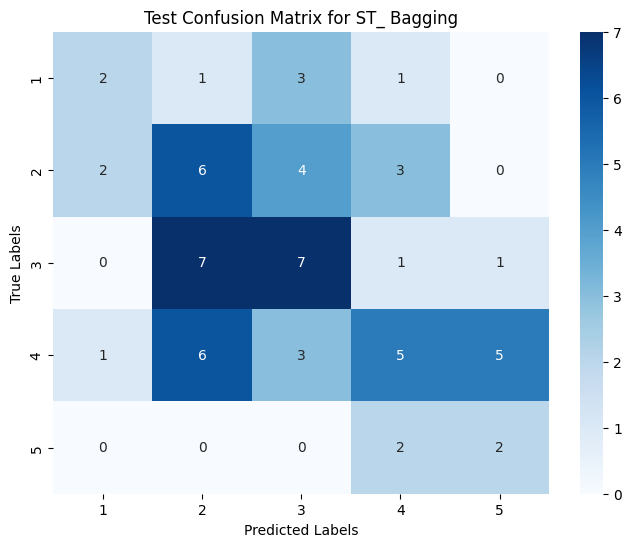

In [ ]:
# Define parameter grids for hyperparameter tuning
param_grids = {
    "SVM": {
        "classifier__C": [0.1, 1, 10, 100],
        "classifier__gamma": ["scale", "auto"],
        "classifier__kernel": ["linear", "rbf"]
    },
    "RandomForest": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    "LogisticRegression": {
        "classifier__C": [0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"]
    },
    "KNeighbors": {
        "classifier__n_neighbors": [3, 5, 7, 10],
        "classifier__weights": ["uniform", "distance"]
    },
    "NaiveBayes": {
        "classifier__alpha": [0.1, 0.5, 1.0]
    },
    "DecisionTree": {
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    # "GradientBoosting": {
    #     "classifier__n_estimators": [50, 100, 200],
    #     "classifier__learning_rate": [0.01, 0.1, 0.2],
    #     "classifier__max_depth": [3, 5, 7]
    # },
    "AdaBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__learning_rate": [0.01, 0.1, 1.0]
    },
    "Bagging": {
        "classifier__n_estimators": [10, 50, 100],
        "classifier__max_samples": [0.5, 0.7, 1.0]
    }
}

# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    # "GradientBoosting": Pipeline([
    #     ("classifier", GradientBoostingClassifier(random_state=1))
    # ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results_tuned = []

# Perform hyperparameter tuning and evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nHyperparameter tuning and evaluating {model_name} model:")

    # Perform Grid Search
    grid_search = GridSearchCV(pipeline, param_grid=param_grids[model_name], cv=3, scoring="accuracy")
    grid_search.fit(X_train, y_train)

    # Best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predict on train data
    best_model = grid_search.best_estimator_

     # Predict on train data
    y_train_pred = best_model.predict(X_train)
    train_accuracy_st_tune = accuracy_score(y_train, y_train_pred)
    train_precision_st_tune = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st_tune = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st_tune = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = best_model.predict(X_val)
    val_accuracy_st_tune = accuracy_score(y_val, y_val_pred)
    val_precision_st_tune = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st_tune = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st_tune = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = best_model.predict(X_test)
    test_accuracy_st_tune = accuracy_score(y_test, y_test_pred)
    test_precision_st_tune = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st_tune = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st_tune = f1_score(y_test, y_test_pred, average="weighted")


    print("Train Classification Report_ST:")
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)
    print(train_report)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
    print("Validation Classification Report_ST:")
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)
    print(val_report)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    print("Test Classification Report_ST:")
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)
    print(test_report)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(1,6):
          level = str(level)
          results_tuned.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results_tuned)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_smote_tuned_potential_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     1   1.000000  1.000000  1.000000    207.0
1        SVM  Train     2   1.000000  1.000000  1.000000    207.0
2        SVM  Train     3   1.000000  1.000000  1.000000    207.0
3        SVM  Train     4   1.000000  1.000000  1.000000    207.0
4        SVM  Train     5   1.000000  1.000000  1.000000    207.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     1   0.400000  0.285714  0.333333      7.0
116  Bagging   Test     2   0.300000  0.400000  0.342857     15.0
117  Bagging   Test     3   0.411765  0.437500  0.424242     16.0
118  Bagging   Test     4   0.416667  0.250000  0.312500     20.0
119  Bagging   Test     5   0.250000  0.500000  0.333333      4.0

[120 rows x 7 columns]


# METHOD 4: Target variable - Accident Level, Data Augumentation - paraphrasing, Synthetic data.

In [ ]:
Accident_Level = dataset_cleaned_original['Accident_Level']
Potential_Accident_Level = dataset_cleaned_original['Potential_Accident_Level']
Descriptions_correc = dataset_cleaned_original['Translated_Description']

# Combine into a DataFrame
original_data = pd.DataFrame({
    'Accident Level': Accident_Level,
    'Potential Accident Level': Potential_Accident_Level,
    'Description': Descriptions_correc
})

# Save the synthetic data to a CSV file
output_file = "/content/drive/MyDrive/AIML-Git/Capstone project/org_data.csv"
original_data.to_csv(output_file, index=False)
print("cleaned data saved to 'org_data.csv'")

cleaned data saved to 'org_data.csv'


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Load the newly uploaded dataset
org_data = pd.read_csv("/content/drive/MyDrive/AIML-Git/Capstone project/org_data.csv")

# Check if there is a column suitable for vectorization
if 'Description' in org_data.columns:
    # Apply TF-IDF Vectorization on the 'Description' column
    vectorizer = TfidfVectorizer(max_features=500)
    tfidf_matrix = vectorizer.fit_transform(org_data['Description'].fillna(''))

    # Convert the matrix to a DataFrame for inspection
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

    # Display the vectorized data
    print("TF-IDF Vectorization of Descriptions:")
    print(tfidf_df.head())
else:
    print("Column 'Description' not found in the dataset.")

TF-IDF Vectorization of Descriptions:
   access  accident  accompanied  acid  activate  activity  air  allergic  \
0     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
1     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
2     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
3     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
4     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   

   anchor  ankle  ...  without  wooden      work    worker  workshop  would  \
0     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
1     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
2     0.0    0.0  ...      0.0     0.0  0.171515  0.000000       0.0    0.0   
3     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
4     0.0    0.0  ...      0.0     0.0  0.000000  0.132987       0.0    0.0   

   wound   xx  zinc  zon

In [ ]:
import pandas as pd
from gensim.models import Word2Vec

# Check if the 'Description' column exists for word embeddings
if 'Description' in org_data.columns:
    # Preprocess the text data
    org_data['Processed_Description'] = (
        org_data['Description']
        .fillna('')
        .str.lower()
        .str.replace(r'[^\w\s]', '', regex=True)  # Remove punctuation and special characters
    )
    tokenized_descriptions = org_data['Processed_Description'].apply(str.split).tolist()

    # Train Word2Vec model on the tokenized descriptions
    word2vec_model = Word2Vec(
        sentences=tokenized_descriptions,
        vector_size=100,
        window=5,
        min_count=1,
        workers=4,
        sg=1,  # Skip-gram model
    )

    # Save the word embeddings for inspection
    word_embeddings = {word: word2vec_model.wv[word] for word in word2vec_model.wv.index_to_key}

    # Convert embeddings dictionary to a DataFrame for inspection
    embeddings_preview = pd.DataFrame(word_embeddings).T.head()

    # Display the embeddings for the first few words
    print("Word Embeddings Preview:")
    print(embeddings_preview)
else:
    print("Column 'Description' not found in the dataset.")

Word Embeddings Preview:
                0         1         2         3         4         5   \
hand     -0.060939  0.232127  0.068065  0.018131  0.057582 -0.412371   
employee -0.075367  0.237121  0.078671  0.004215  0.081500 -0.408831   
causing  -0.058991  0.230212  0.056608  0.009505  0.073658 -0.390088   
left     -0.070945  0.242416  0.061990  0.005125  0.072578 -0.405029   
right    -0.074057  0.238755  0.055167  0.001276  0.072473 -0.399855   

                6         7         8         9   ...        90        91  \
hand      0.105714  0.442716 -0.214300 -0.051229  ...  0.301828  0.070290   
employee  0.102752  0.434577 -0.208834 -0.055460  ...  0.298161  0.072042   
causing   0.098368  0.429598 -0.213706 -0.037615  ...  0.292763  0.075406   
left      0.102791  0.435736 -0.205830 -0.051183  ...  0.289908  0.069009   
right     0.104102  0.432854 -0.218519 -0.036103  ...  0.305939  0.063878   

                92        93        94        95        96        97  \
hand   

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder for each target column
accident_level_encoder = LabelEncoder()
potential_accident_level_encoder = LabelEncoder()

# Encode the target variables
org_data['Accident Level Encoded'] = accident_level_encoder.fit_transform(org_data['Accident Level'])
org_data['Potential Accident Level Encoded'] = potential_accident_level_encoder.fit_transform(org_data['Potential Accident Level'])

## **Test - Train split**

In [ ]:
# Define target and features
X = org_data['Processed_Description']
y = org_data['Accident Level Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(287, 62, 62)

## **Data augmentation (using paraphrasing for description and using probablity sampling for target variable) and synthetic row generation**

In [ ]:
from sklearn.utils import resample
import random
from sklearn.preprocessing import LabelEncoder
from transformers import pipeline

# Synthetic data generation for categorical columns (Accident Level, Potential Accident Level)
def generate_synthetic_levels(data, column_name, num_samples):
    levels = data[column_name].value_counts(normalize=True)
    synthetic_levels = np.random.choice(levels.index, size=num_samples, p=levels.values)
    return synthetic_levels

# Load a pre-trained text generation model for paraphrasing
text_generator = pipeline("text2text-generation", model="t5-base")

# Function to generate synthetic descriptions
def generate_synthetic_descriptions(descriptions, num_variations=1):
    augmented_descriptions = []
    for description in descriptions:
        try:
            # Generate variations of the description
            variations = text_generator(description, max_length=300, num_return_sequences=num_variations)
            augmented_descriptions.extend([var["generated_text"] for var in variations])
        except Exception as e:
            # If an error occurs, use the original description as a fallback
            augmented_descriptions.append(description)
    return augmented_descriptions

# Function to augment a single description
def augment_description(description):
    augmented = generate_synthetic_descriptions([description], num_variations=1)
    return augmented[0] if augmented else description

# Synthetic training data generation
def generate_train_synthetic_data(X_train, y_train, org_data, num_samples):
    synthetic_data = []

    # Generate synthetic Accident Level and Potential Accident Level
    synthetic_accident_levels = generate_synthetic_levels(org_data, 'Accident Level', num_samples)
    synthetic_potential_levels = generate_synthetic_levels(org_data, 'Potential Accident Level', num_samples)

    # Generate synthetic descriptions
    for _ in range(num_samples):
        random_desc = X_train.sample(1).values[0]
        augmented_desc = augment_description(random_desc)
        synthetic_data.append({
            'Accident Level': np.random.choice(synthetic_accident_levels),
            'Potential Accident Level': np.random.choice(synthetic_potential_levels),
            'Description': augmented_desc
        })

    return pd.DataFrame(synthetic_data)

# Assuming X_train and y_train are prepared, and org_data is the full dataset with original columns
num_samples = 600  # Number of synthetic samples to generate
synthetic_train_data = generate_train_synthetic_data(X_train, y_train, org_data, num_samples=num_samples)

# Encode target variables in synthetic data
target_encoder_AL = LabelEncoder()
target_encoder_PAL = LabelEncoder()

synthetic_train_data['Accident Level Encoded'] = target_encoder_AL.fit_transform(synthetic_train_data['Accident Level'])
synthetic_train_data['Potential Accident Level Encoded'] = target_encoder_PAL.fit_transform(synthetic_train_data['Potential Accident Level'])

# Combine synthetic data with the original training data
X_train_combined = pd.concat([X_train, synthetic_train_data['Description']], ignore_index=True)
y_train_AL_combined = pd.concat([y_train, synthetic_train_data['Accident Level Encoded']], ignore_index=True)
y_train_PAL_combined = pd.concat([y_train, synthetic_train_data['Potential Accident Level Encoded']], ignore_index=True)

# Save combined training data to CSV (optional)
combined_data = pd.DataFrame({
    'Description': X_train_combined,
    'Accident Level Encoded': y_train_AL_combined,
    'Potential Accident Level Encoded': y_train_PAL_combined
})
combined_data.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/combined_training_data.csv', index=False)
print("Synthetic data encoded and saved to 'combined_training_data.csv'")

Device set to use cuda:0


Synthetic data encoded and saved to 'combined_training_data.csv'


## Combined data

In [ ]:
data_tr = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/combined_training_data.csv')
data_tr.head()

,Description,Accident Level Encoded,Potential Accident Level Encoded
0,access level installation activity hydraulic f...,4,4
1,workshop level box two mechanic manipulated st...,0,0
2,hour approximately circumstance administrative...,1,1
3,circumstance staff performing shying pipe susp...,2,2
4,maintenance limb pump projection delicate pulp...,0,0


In [ ]:
data_tr.duplicated().sum()

86

In [ ]:
data_tr.drop_duplicates(inplace=True)

In [ ]:
# Define target and features
X_train_syn = data_tr['Description']
y_train_syn = data_tr['Accident Level Encoded']

## **Sentence Tranformer -Pipeline for all models**

In [ ]:
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(data_tr['Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
#dataset_with_embeddings = pd.concat([dataset_1.reset_index(drop=True), embedding_df], axis=1)

# Display the updated DataFrame
print(embedding_df.head())

Batches:   0%|          | 0/26 [00:00<?, ?it/s]

Embedding Shape: (801, 384)
   Embedding_0  Embedding_1  Embedding_2  Embedding_3  Embedding_4  \
0     0.025426    -0.007923     0.077794    -0.061466    -0.055655   
1    -0.033886     0.068002    -0.006193    -0.008196    -0.019726   
2    -0.005738     0.016733    -0.004303     0.027280    -0.091831   
3    -0.023543    -0.023537     0.053262    -0.007740    -0.087264   
4    -0.033219     0.008573     0.018551    -0.038607    -0.122745   

   Embedding_5  Embedding_6  Embedding_7  Embedding_8  Embedding_9  ...  \
0     0.019216     0.067826     0.101867    -0.082401     0.011257  ...   
1     0.044129    -0.030286     0.036553    -0.048438     0.025429  ...   
2    -0.022488     0.020508     0.005072    -0.044912     0.010998  ...   
3     0.028651     0.063999     0.050380    -0.002670     0.005102  ...   
4    -0.019023     0.042801     0.072747    -0.100993    -0.000698  ...   

   Embedding_374  Embedding_375  Embedding_376  Embedding_377  Embedding_378  \
0       0.008072    

In [ ]:
# Define target and features
X = embedding_df
y = data_tr['Accident Level Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(560, 120, 121)

### Model pipeline without tuning


Evaluating SVM model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       1.00      0.67      0.80       398
           1       0.51      0.92      0.66        61
           2       0.48      0.87      0.62        54
           3       0.51      0.95      0.66        41
           4       0.75      1.00      0.86         6

    accuracy                           0.74       560
   macro avg       0.65      0.88      0.72       560
weighted avg       0.86      0.74      0.76       560



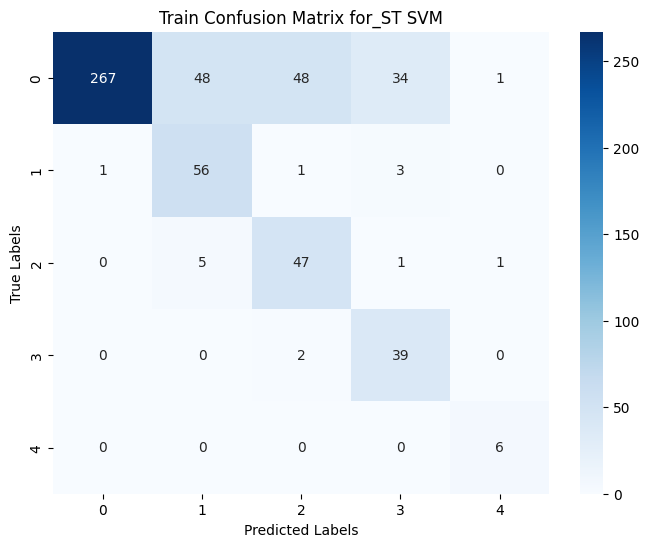

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.70      0.58      0.63        85
           1       0.21      0.23      0.22        13
           2       0.09      0.17      0.12        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.45       120
   macro avg       0.20      0.19      0.19       120
weighted avg       0.53      0.45      0.48       120



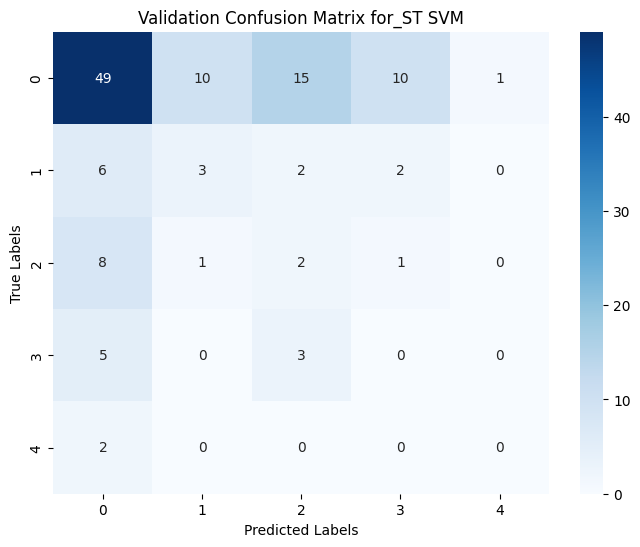

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.55      0.63        86
           1       0.12      0.15      0.13        13
           2       0.04      0.08      0.06        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.41       121
   macro avg       0.18      0.16      0.16       121
weighted avg       0.54      0.41      0.47       121



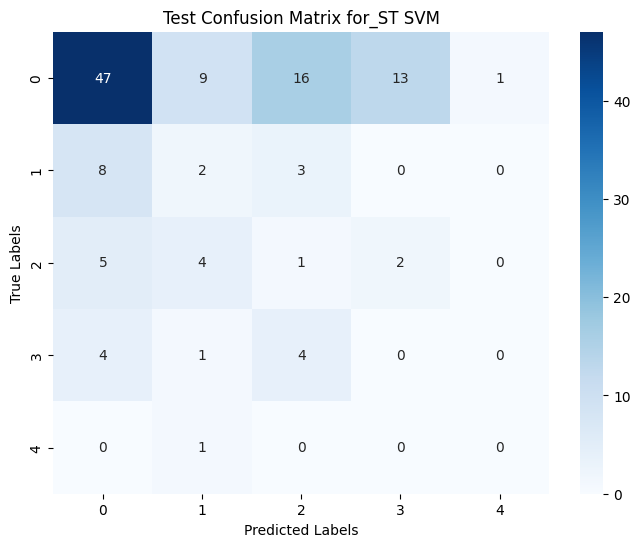


Evaluating RandomForest model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.99      0.84      0.91       398
           1       0.68      0.82      0.75        61
           2       0.62      0.93      0.74        54
           3       0.65      0.95      0.77        41
           4       0.75      1.00      0.86         6

    accuracy                           0.86       560
   macro avg       0.74      0.91      0.80       560
weighted avg       0.89      0.86      0.86       560



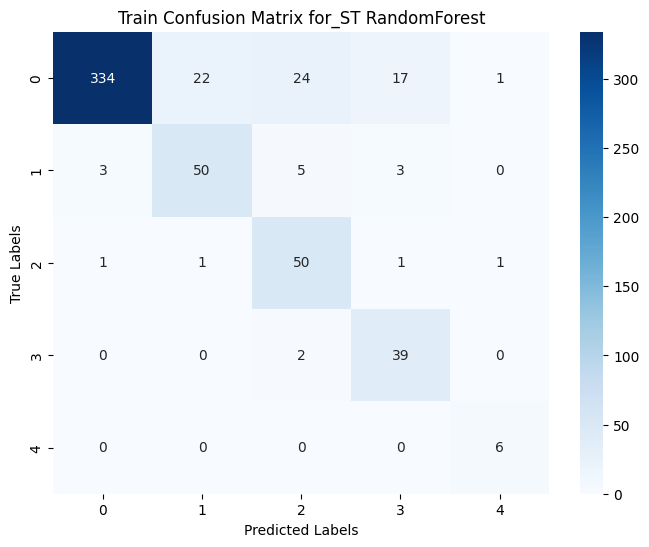

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.79      0.74        85
           1       0.14      0.08      0.10        13
           2       0.10      0.08      0.09        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.57       120
   macro avg       0.19      0.19      0.19       120
weighted avg       0.53      0.57      0.55       120



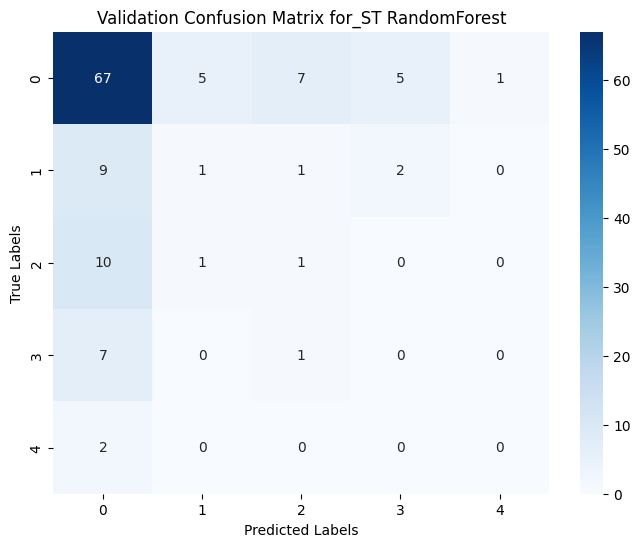

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.91      0.81        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.64       121
   macro avg       0.15      0.18      0.16       121
weighted avg       0.52      0.64      0.57       121



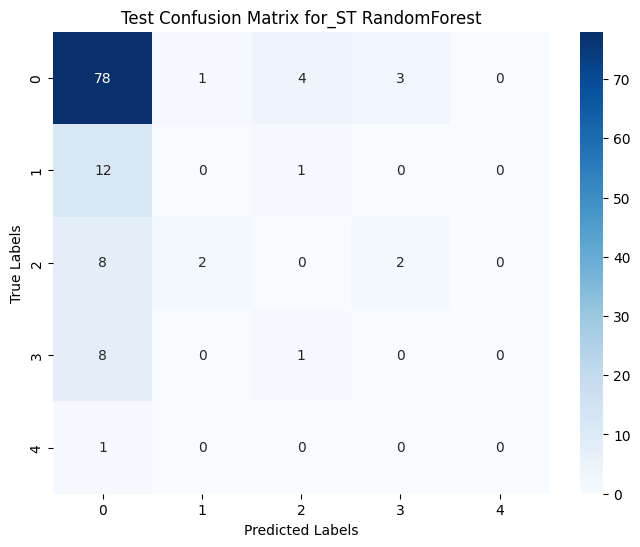


Evaluating LogisticRegression model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.97      0.45      0.61       398
           1       0.36      0.74      0.48        61
           2       0.33      0.80      0.47        54
           3       0.34      0.85      0.49        41
           4       0.38      1.00      0.55         6

    accuracy                           0.55       560
   macro avg       0.47      0.77      0.52       560
weighted avg       0.79      0.55      0.58       560



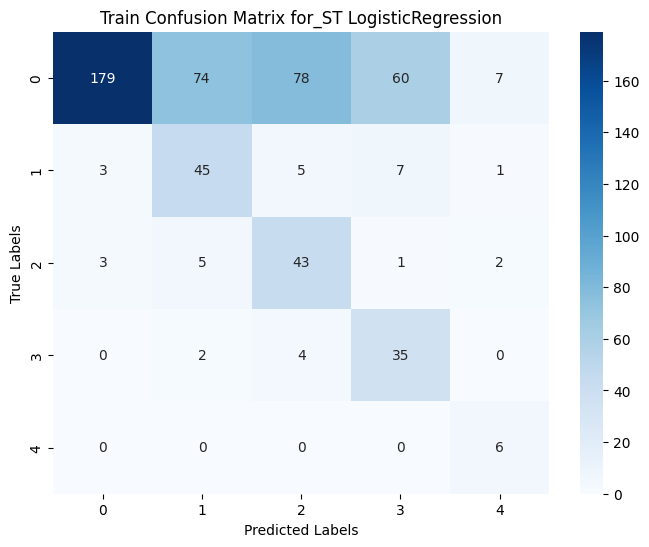

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.68      0.31      0.42        85
           1       0.08      0.15      0.10        13
           2       0.12      0.33      0.18        12
           3       0.05      0.12      0.07         8
           4       0.50      0.50      0.50         2

    accuracy                           0.28       120
   macro avg       0.29      0.28      0.25       120
weighted avg       0.52      0.28      0.34       120



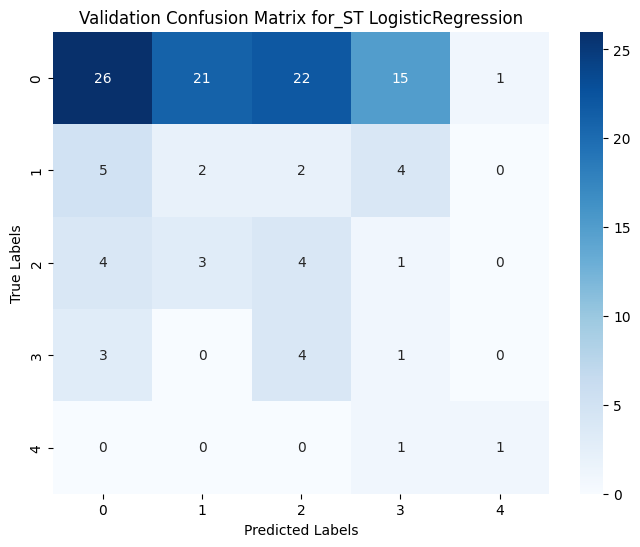

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.74      0.40      0.52        86
           1       0.11      0.23      0.15        13
           2       0.07      0.17      0.10        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.32       121
   macro avg       0.18      0.16      0.15       121
weighted avg       0.54      0.32      0.39       121



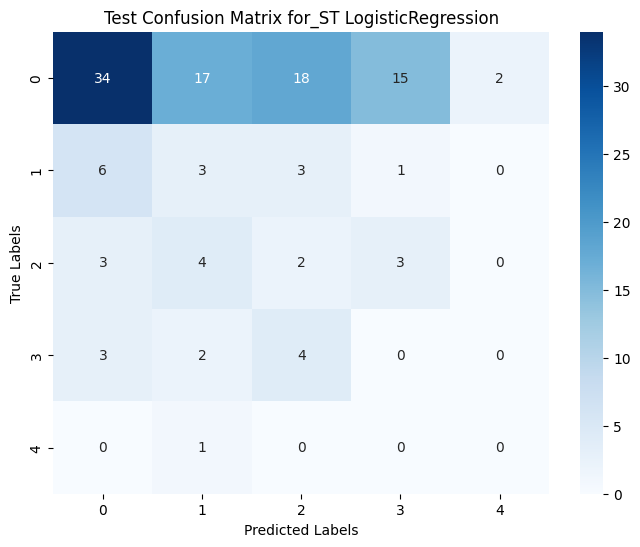


Evaluating KNeighbors model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.98      0.83       398
           1       0.70      0.11      0.20        61
           2       0.38      0.11      0.17        54
           3       0.00      0.00      0.00        41
           4       0.00      0.00      0.00         6

    accuracy                           0.72       560
   macro avg       0.36      0.24      0.24       560
weighted avg       0.63      0.72      0.63       560



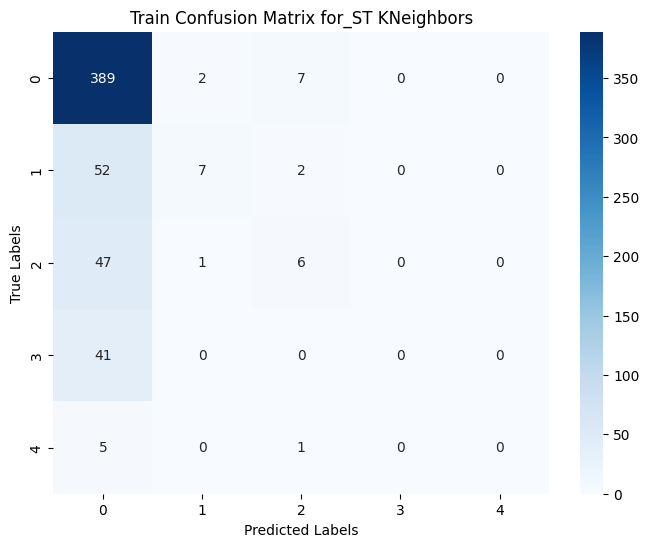

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.66       120
   macro avg       0.14      0.19      0.16       120
weighted avg       0.49      0.66      0.56       120



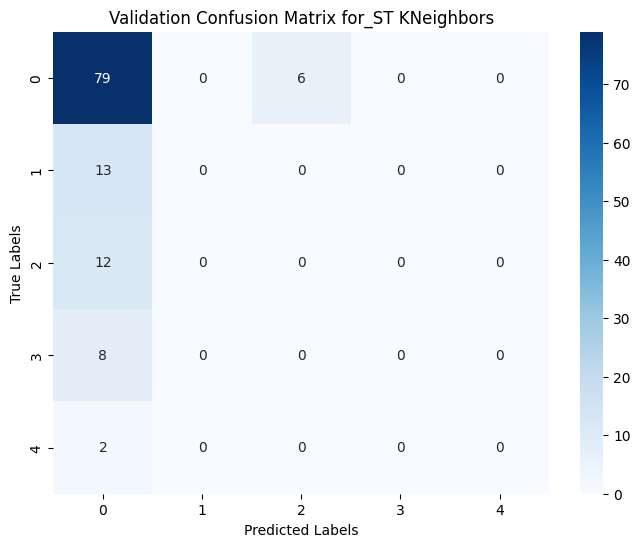

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.95      0.81        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.68       121
   macro avg       0.14      0.19      0.16       121
weighted avg       0.50      0.68      0.58       121



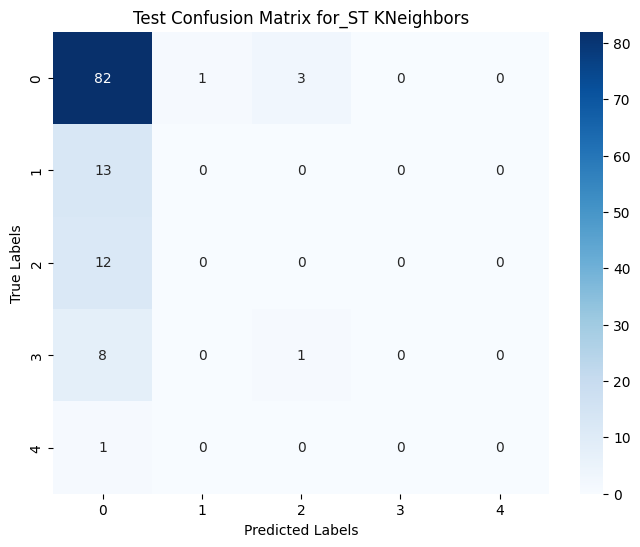


Evaluating NaiveBayes model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       398
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00        54
           3       0.00      0.00      0.00        41
           4       0.00      0.00      0.00         6

    accuracy                           0.71       560
   macro avg       0.14      0.20      0.17       560
weighted avg       0.51      0.71      0.59       560



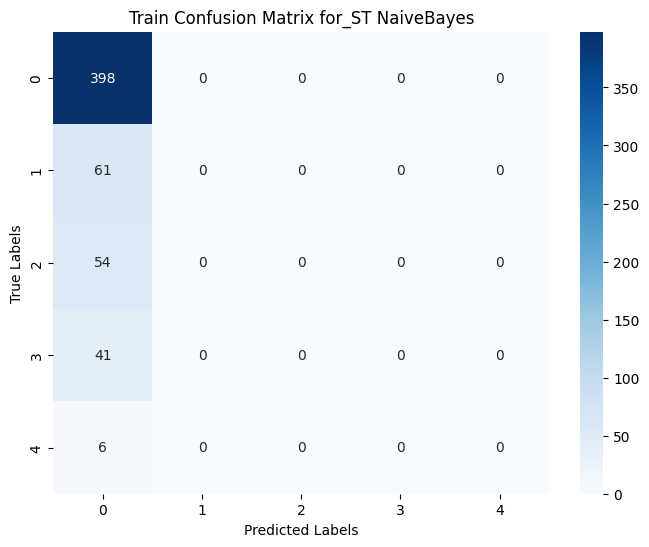

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



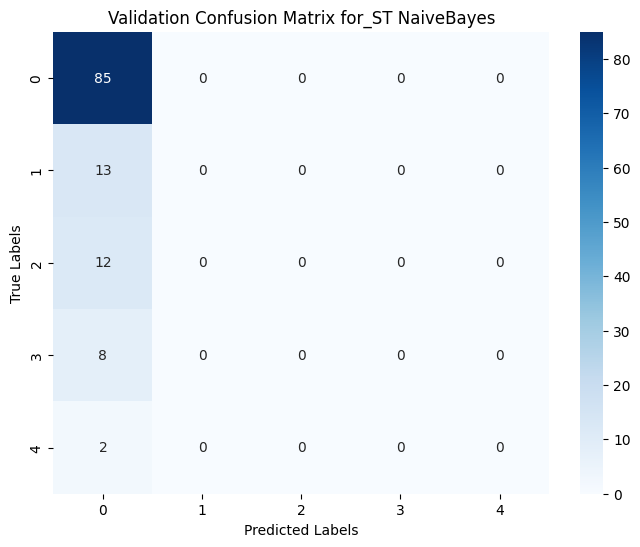

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.71       121
   macro avg       0.14      0.20      0.17       121
weighted avg       0.51      0.71      0.59       121



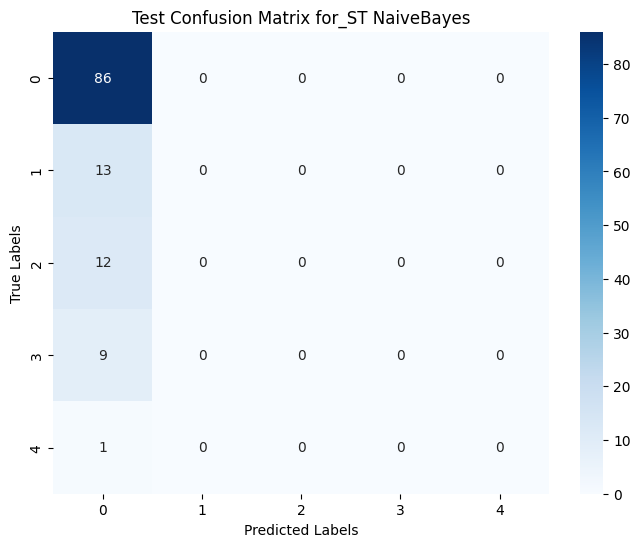


Evaluating DecisionTree model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       1.00      0.82      0.90       398
           1       0.66      0.85      0.74        61
           2       0.60      0.94      0.73        54
           3       0.65      0.98      0.78        41
           4       0.75      1.00      0.86         6

    accuracy                           0.85       560
   macro avg       0.73      0.92      0.80       560
weighted avg       0.90      0.85      0.86       560



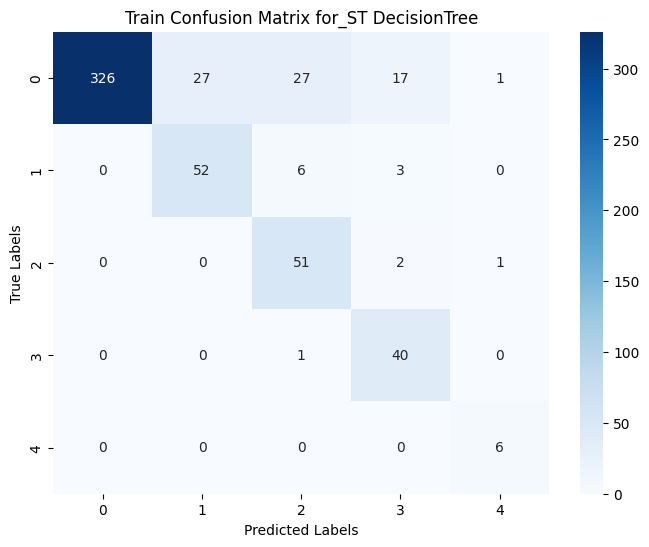

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.70      0.64      0.67        85
           1       0.10      0.08      0.09        13
           2       0.11      0.17      0.13        12
           3       0.08      0.12      0.10         8
           4       0.00      0.00      0.00         2

    accuracy                           0.48       120
   macro avg       0.20      0.20      0.20       120
weighted avg       0.52      0.48      0.50       120



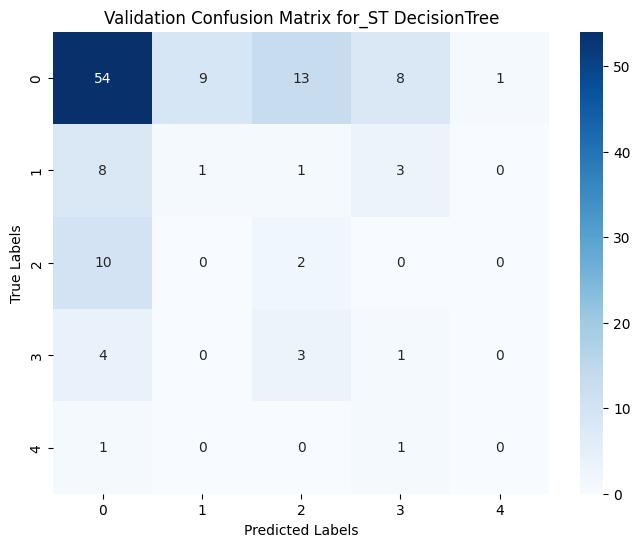

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.71      0.72        86
           1       0.15      0.15      0.15        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.52       121
   macro avg       0.18      0.17      0.17       121
weighted avg       0.53      0.52      0.53       121



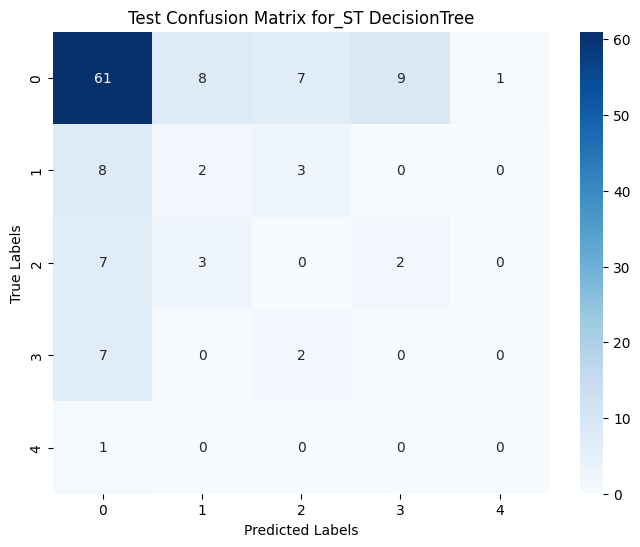


Evaluating GradientBoosting model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.87      0.99      0.92       398
           1       1.00      0.54      0.70        61
           2       0.86      0.59      0.70        54
           3       0.93      0.63      0.75        41
           4       0.75      1.00      0.86         6

    accuracy                           0.88       560
   macro avg       0.88      0.75      0.79       560
weighted avg       0.89      0.88      0.87       560



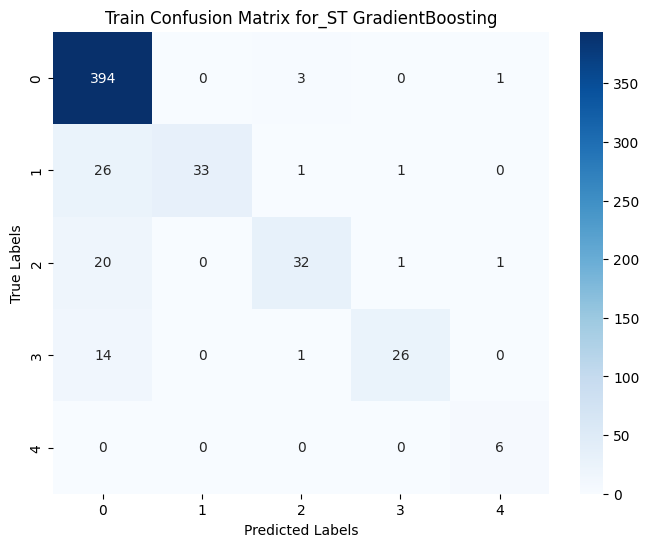

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.72      0.89      0.80        85
           1       0.25      0.08      0.12        13
           2       0.20      0.08      0.12        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.65       120
   macro avg       0.23      0.21      0.21       120
weighted avg       0.55      0.65      0.59       120



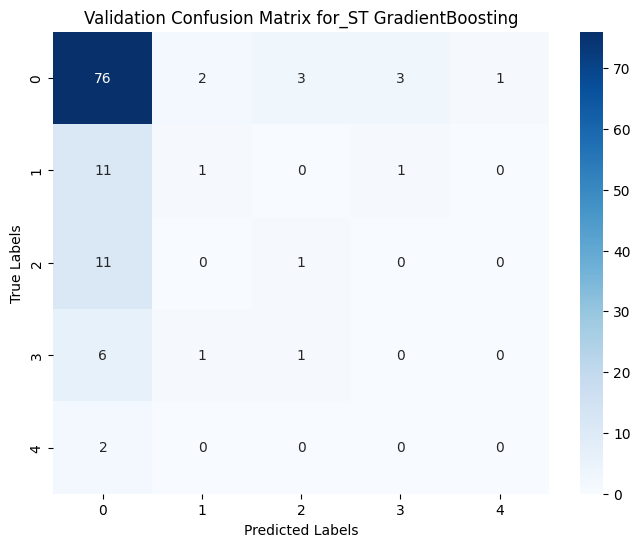

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.70      0.91      0.79        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.64       121
   macro avg       0.14      0.18      0.16       121
weighted avg       0.50      0.64      0.56       121



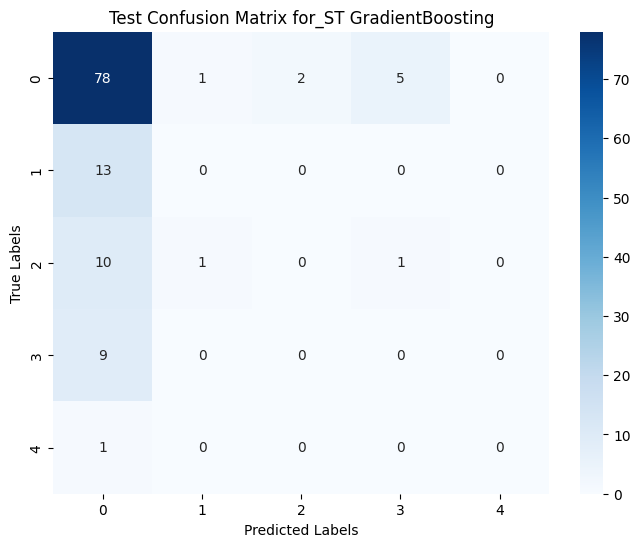


Evaluating AdaBoost model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.74      0.93      0.82       398
           1       0.48      0.16      0.24        61
           2       0.39      0.17      0.23        54
           3       0.50      0.17      0.25        41
           4       0.00      0.00      0.00         6

    accuracy                           0.71       560
   macro avg       0.42      0.29      0.31       560
weighted avg       0.65      0.71      0.65       560



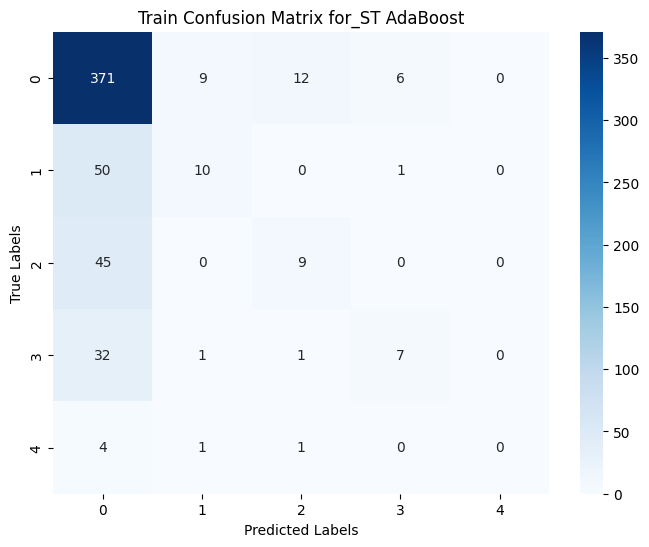

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.88      0.79        85
           1       0.00      0.00      0.00        13
           2       0.33      0.08      0.13        12
           3       0.33      0.25      0.29         8
           4       0.00      0.00      0.00         2

    accuracy                           0.65       120
   macro avg       0.27      0.24      0.24       120
weighted avg       0.56      0.65      0.59       120



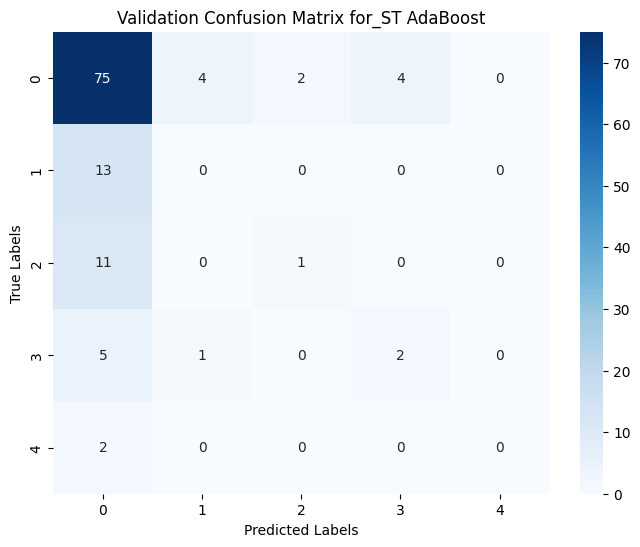

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.69      0.84      0.76        86
           1       0.00      0.00      0.00        13
           2       0.14      0.08      0.11        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.60       121
   macro avg       0.17      0.18      0.17       121
weighted avg       0.51      0.60      0.55       121



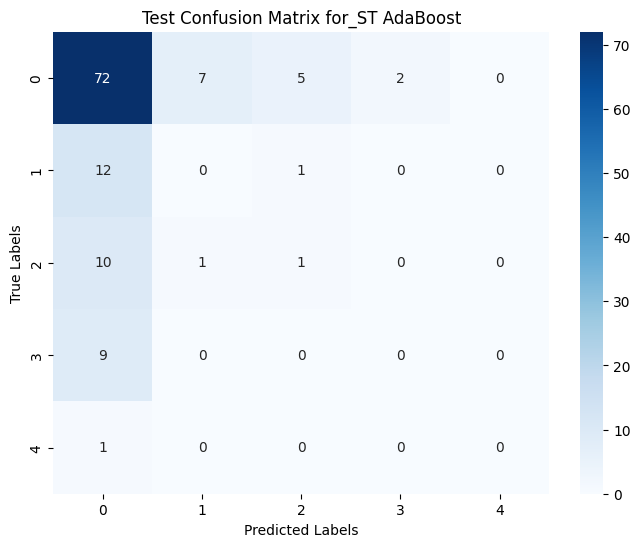


Evaluating Bagging model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.88      0.95      0.91       398
           1       0.81      0.57      0.67        61
           2       0.71      0.67      0.69        54
           3       0.79      0.63      0.70        41
           4       1.00      0.50      0.67         6

    accuracy                           0.85       560
   macro avg       0.84      0.66      0.73       560
weighted avg       0.85      0.85      0.85       560



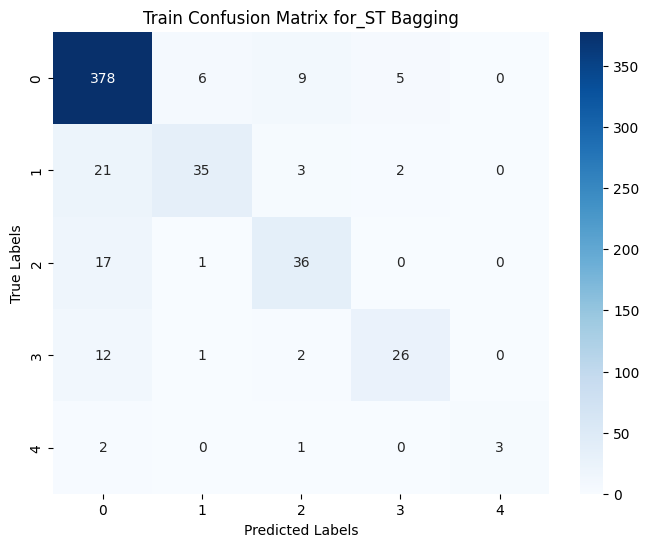

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.91      0.81        85
           1       0.00      0.00      0.00        13
           2       0.17      0.08      0.11        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.65       120
   macro avg       0.18      0.20      0.18       120
weighted avg       0.54      0.65      0.59       120



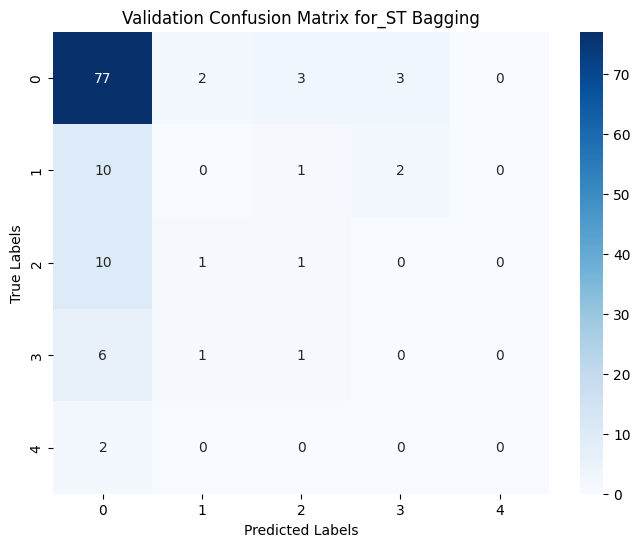

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.88      0.79        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.63       121
   macro avg       0.14      0.18      0.16       121
weighted avg       0.50      0.63      0.56       121



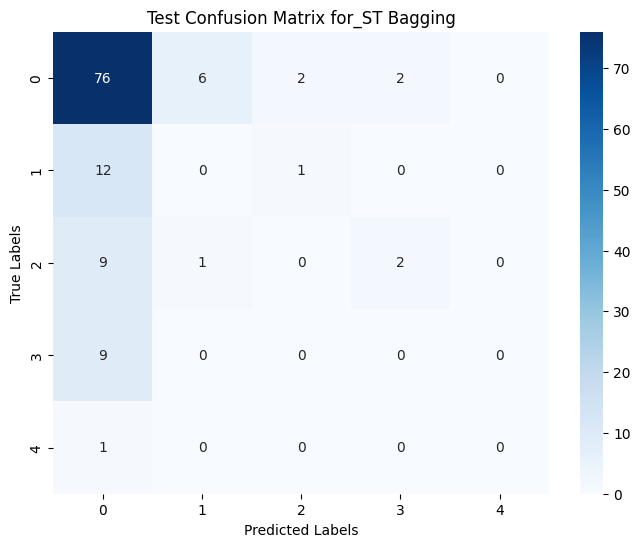

In [ ]:
# Define pipelines for each model_ST
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    "GradientBoosting": Pipeline([
        ("classifier", GradientBoostingClassifier(random_state=1))
    ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}
results = []

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Train the model
    pipeline.fit(X_train, y_train)

     # Predict on train data
    y_train_pred = pipeline.predict(X_train)
    train_accuracy_st = accuracy_score(y_train, y_train_pred)
    train_precision_st = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = pipeline.predict(X_val)
    val_accuracy_st = accuracy_score(y_val, y_val_pred)
    val_precision_st = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = pipeline.predict(X_test)
    test_accuracy_st = accuracy_score(y_test, y_test_pred)
    test_precision_st = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st = f1_score(y_test, y_test_pred, average="weighted")

    # Predict on train data
    #y_train_pred = pipeline.predict(X_train)
    print("Train Classification Report_ST:")
    print(classification_report(y_train, y_train_pred))
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
   # y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report_ST:")
    print(classification_report(y_val, y_val_pred))
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    #y_test_pred = pipeline.predict(X_test)
    print("Test Classification Report_ST:")
    print(classification_report(y_test, y_test_pred))
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(0,5):
          level = str(level)
          results.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_paraphrasing_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     0   0.996269  0.670854  0.801802    398.0
1        SVM  Train     1   0.513761  0.918033  0.658824     61.0
2        SVM  Train     2   0.479592  0.870370  0.618421     54.0
3        SVM  Train     3   0.506494  0.951220  0.661017     41.0
4        SVM  Train     4   0.750000  1.000000  0.857143      6.0
..       ...    ...   ...        ...       ...       ...      ...
130  Bagging   Test     0   0.710280  0.883721  0.787565     86.0
131  Bagging   Test     1   0.000000  0.000000  0.000000     13.0
132  Bagging   Test     2   0.000000  0.000000  0.000000     12.0
133  Bagging   Test     3   0.000000  0.000000  0.000000      9.0
134  Bagging   Test     4   0.000000  0.000000  0.000000      1.0

[135 rows x 7 columns]


### **Cross Validation results**


Evaluating SVM model with Cross-Validation:
Cross-Validation Accuracy: 0.446 ± 0.021
Cross-Validation Precision: 0.520 ± 0.015
Cross-Validation Recall: 0.446 ± 0.021
Cross-Validation F1-Score: 0.476 ± 0.020

Test Accuracy: 0.413
Test Precision: 0.539
Test Recall: 0.413
Test F1-Score: 0.465


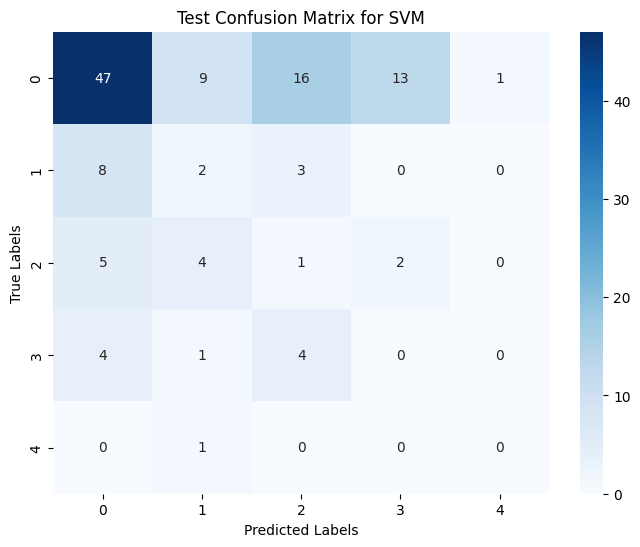


Evaluating RandomForest model with Cross-Validation:
Cross-Validation Accuracy: 0.605 ± 0.012
Cross-Validation Precision: 0.520 ± 0.020
Cross-Validation Recall: 0.605 ± 0.012
Cross-Validation F1-Score: 0.558 ± 0.014

Test Accuracy: 0.645
Test Precision: 0.518
Test Recall: 0.645
Test F1-Score: 0.574


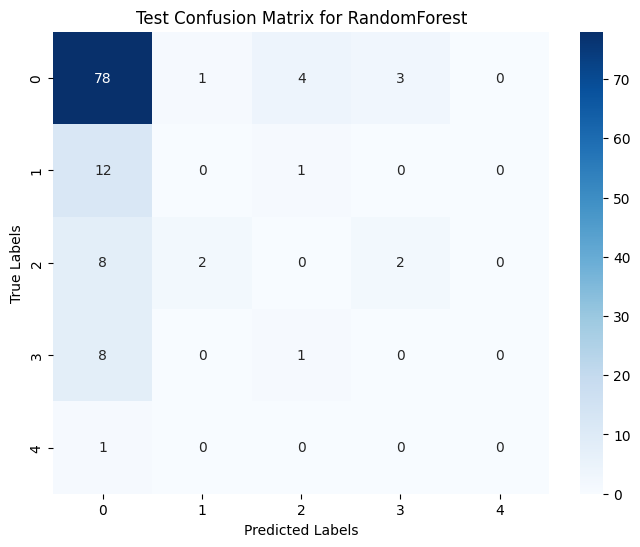


Evaluating LogisticRegression model with Cross-Validation:
Cross-Validation Accuracy: 0.321 ± 0.026
Cross-Validation Precision: 0.537 ± 0.035
Cross-Validation Recall: 0.321 ± 0.026
Cross-Validation F1-Score: 0.381 ± 0.025

Test Accuracy: 0.322
Test Precision: 0.545
Test Recall: 0.322
Test F1-Score: 0.392


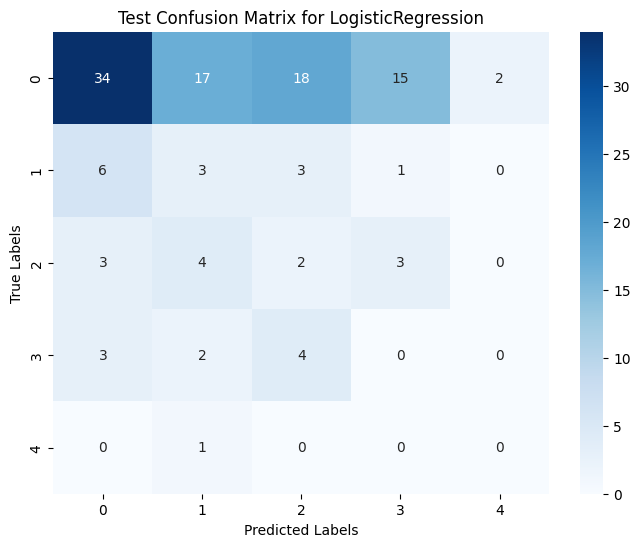


Evaluating KNeighbors model with Cross-Validation:
Cross-Validation Accuracy: 0.677 ± 0.007
Cross-Validation Precision: 0.506 ± 0.013
Cross-Validation Recall: 0.677 ± 0.007
Cross-Validation F1-Score: 0.578 ± 0.007

Test Accuracy: 0.678
Test Precision: 0.502
Test Recall: 0.678
Test F1-Score: 0.577


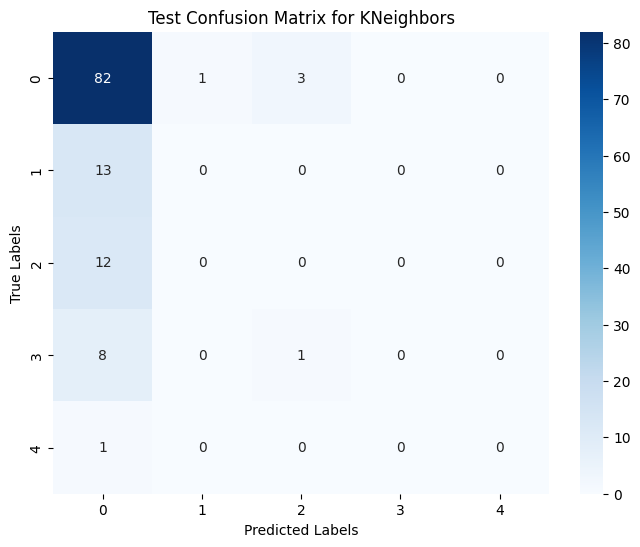


Evaluating NaiveBayes model with Cross-Validation:
Cross-Validation Accuracy: 0.711 ± 0.004
Cross-Validation Precision: 0.505 ± 0.006
Cross-Validation Recall: 0.711 ± 0.004
Cross-Validation F1-Score: 0.591 ± 0.006

Test Accuracy: 0.711
Test Precision: 0.505
Test Recall: 0.711
Test F1-Score: 0.591


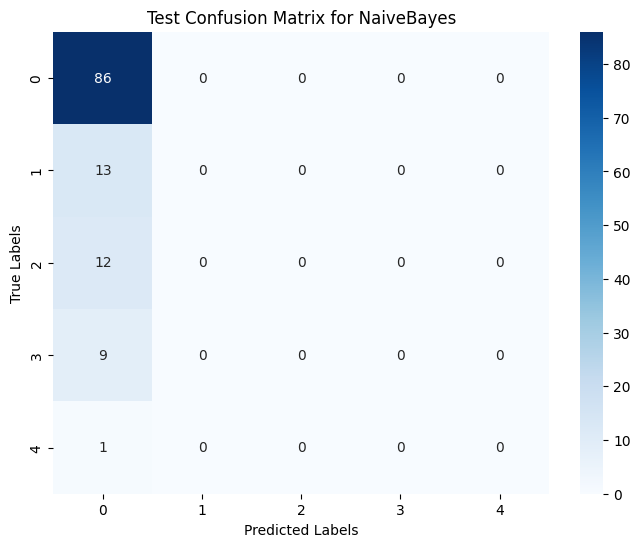


Evaluating DecisionTree model with Cross-Validation:
Cross-Validation Accuracy: 0.468 ± 0.030
Cross-Validation Precision: 0.526 ± 0.020
Cross-Validation Recall: 0.468 ± 0.030
Cross-Validation F1-Score: 0.493 ± 0.015

Test Accuracy: 0.521
Test Precision: 0.533
Test Recall: 0.521
Test F1-Score: 0.527


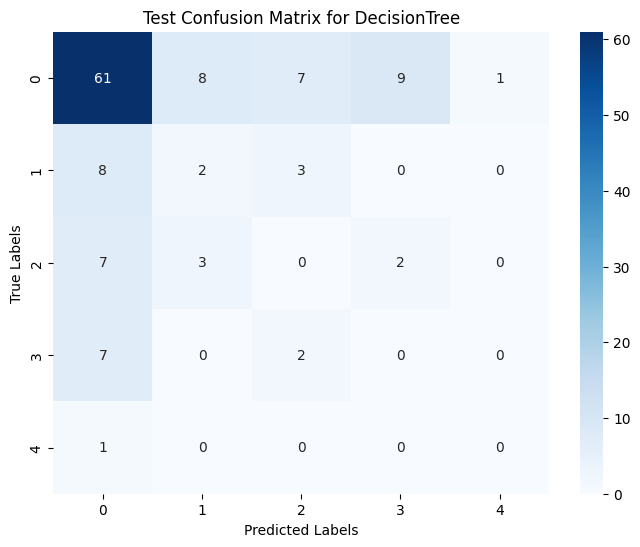


Evaluating GradientBoosting model with Cross-Validation:
Cross-Validation Accuracy: 0.605 ± 0.013
Cross-Validation Precision: 0.526 ± 0.051
Cross-Validation Recall: 0.605 ± 0.013
Cross-Validation F1-Score: 0.551 ± 0.016

Test Accuracy: 0.645
Test Precision: 0.499
Test Recall: 0.645
Test F1-Score: 0.563


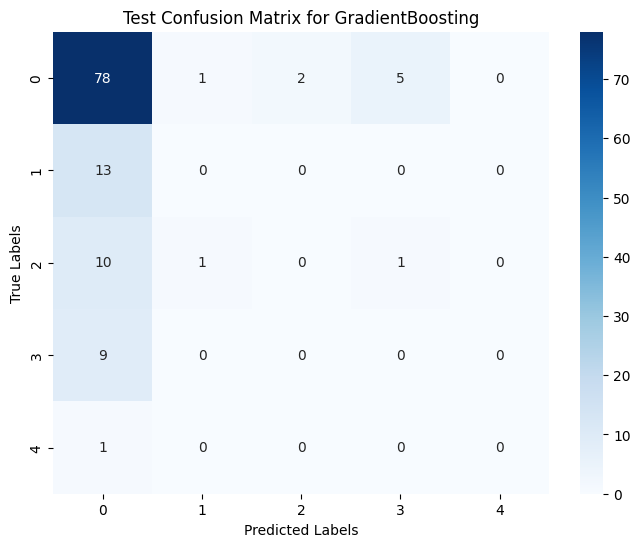


Evaluating AdaBoost model with Cross-Validation:
Cross-Validation Accuracy: 0.662 ± 0.032
Cross-Validation Precision: 0.527 ± 0.033
Cross-Validation Recall: 0.662 ± 0.032
Cross-Validation F1-Score: 0.581 ± 0.023

Test Accuracy: 0.603
Test Precision: 0.506
Test Recall: 0.603
Test F1-Score: 0.549


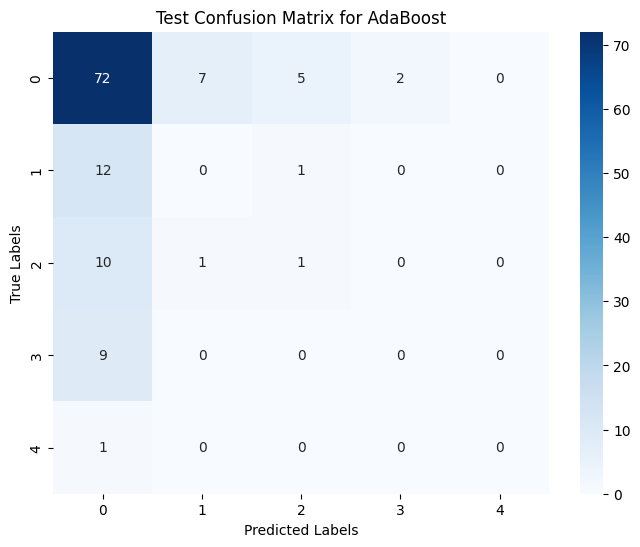


Evaluating Bagging model with Cross-Validation:
Cross-Validation Accuracy: 0.618 ± 0.015
Cross-Validation Precision: 0.515 ± 0.031
Cross-Validation Recall: 0.618 ± 0.015
Cross-Validation F1-Score: 0.560 ± 0.022

Test Accuracy: 0.628
Test Precision: 0.505
Test Recall: 0.628
Test F1-Score: 0.560


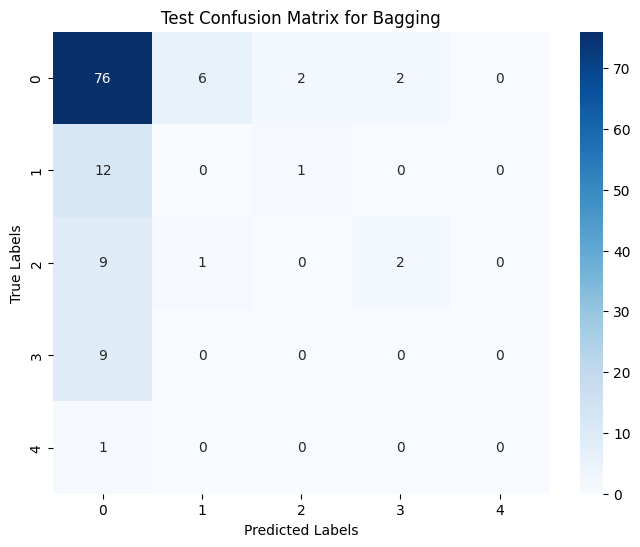

In [ ]:
# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model with Cross-Validation:")

    # Perform cross-validation and calculate metrics
    scoring = {
        "accuracy": make_scorer(accuracy_score),
        "precision": make_scorer(precision_score, average="weighted"),
        "recall": make_scorer(recall_score, average="weighted"),
        "f1": make_scorer(f1_score, average="weighted")
    }
    cv_results = cross_validate(pipeline, X_train, y_train, cv=cv, scoring=scoring, n_jobs=-1)

    # Calculate mean and standard deviation of metrics
    mean_accuracy = cv_results["test_accuracy"].mean()
    std_accuracy = cv_results["test_accuracy"].std()
    mean_precision = cv_results["test_precision"].mean()
    std_precision = cv_results["test_precision"].std()
    mean_recall = cv_results["test_recall"].mean()
    std_recall = cv_results["test_recall"].std()
    mean_f1 = cv_results["test_f1"].mean()
    std_f1 = cv_results["test_f1"].std()

    print(f"Cross-Validation Accuracy: {mean_accuracy:.3f} ± {std_accuracy:.3f}")
    print(f"Cross-Validation Precision: {mean_precision:.3f} ± {std_precision:.3f}")
    print(f"Cross-Validation Recall: {mean_recall:.3f} ± {std_recall:.3f}")
    print(f"Cross-Validation F1-Score: {mean_f1:.3f} ± {std_f1:.3f}")

    # Fit the pipeline on the entire training set
    pipeline.fit(X_train, y_train)

    # Evaluate on the test set
    y_test_pred = pipeline.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred, average="weighted")
    test_recall = recall_score(y_test, y_test_pred, average="weighted")
    test_f1 = f1_score(y_test, y_test_pred, average="weighted")

    print(f"\nTest Accuracy: {test_accuracy:.3f}")
    print(f"Test Precision: {test_precision:.3f}")
    print(f"Test Recall: {test_recall:.3f}")
    print(f"Test F1-Score: {test_f1:.3f}")

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()


In [ ]:
results_st=[]
 # Append results
results_st.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy_st,
        "Train Precision": train_precision_st,
        "Train Recall": train_recall_st,
        "Train F1": train_f1_st,
        "Validation Accuracy": val_accuracy_st,
        "Validation Precision": val_precision_st,
        "Validation Recall": val_recall_st,
        "Validation F1": val_f1_st,
        "Test Accuracy": test_accuracy_st,
        "Test Precision": test_precision_st,
        "Test Recall": test_recall_st,
        "Test F1": test_f1_st
    })

# Create a DataFrame from results
results_st_df = pd.DataFrame(results_st)

# Display results
print("\nModel Performance Metrics (ST):")
print(results_st_df)

# Find the best model based on Validation F1 score
best_model_st = results_st_df.sort_values(by="Validation F1", ascending=False).iloc[0]
print("\nBest Model (ST):")
print(best_model_st)


Model Performance Metrics (ST):
     Model  Train Accuracy  Train Precision  Train Recall  Train F1  \
0  Bagging        0.853571         0.849896      0.853571  0.846944   

   Validation Accuracy  Validation Precision  Validation Recall  \
0                 0.65              0.536111               0.65   

   Validation F1  Test Accuracy  Test Precision  Test Recall   Test F1  
0       0.585234       0.628099        0.504827     0.628099  0.559757  

Best Model (ST):
Model                    Bagging
Train Accuracy          0.853571
Train Precision         0.849896
Train Recall            0.853571
Train F1                0.846944
Validation Accuracy         0.65
Validation Precision    0.536111
Validation Recall           0.65
Validation F1           0.585234
Test Accuracy           0.628099
Test Precision          0.504827
Test Recall             0.628099
Test F1                 0.559757
Name: 0, dtype: object


### **Hyperparameter Tuning- Sentence Transformer**


Hyperparameter tuning and evaluating SVM model:
Best parameters for SVM: {'classifier__C': 100, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       1.00      0.81      0.89       398
           1       0.63      0.85      0.72        61
           2       0.60      0.94      0.73        54
           3       0.65      0.98      0.78        41
           4       0.75      1.00      0.86         6

    accuracy                           0.84       560
   macro avg       0.72      0.92      0.80       560
weighted avg       0.89      0.84      0.85       560



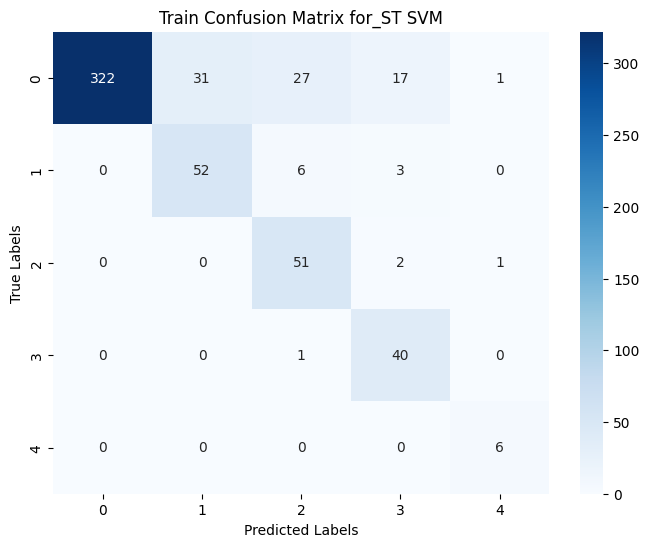

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.69      0.71      0.70        85
           1       0.12      0.08      0.10        13
           2       0.14      0.17      0.15        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.53       120
   macro avg       0.19      0.19      0.19       120
weighted avg       0.52      0.53      0.52       120



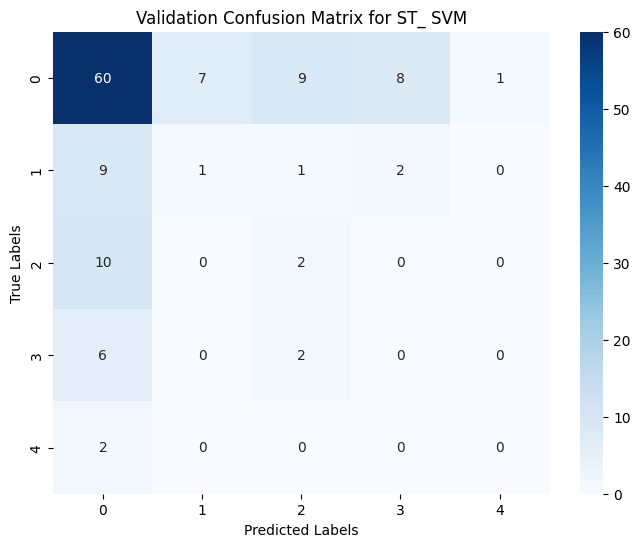

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.76      0.73        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.54       121
   macro avg       0.14      0.15      0.15       121
weighted avg       0.50      0.54      0.52       121



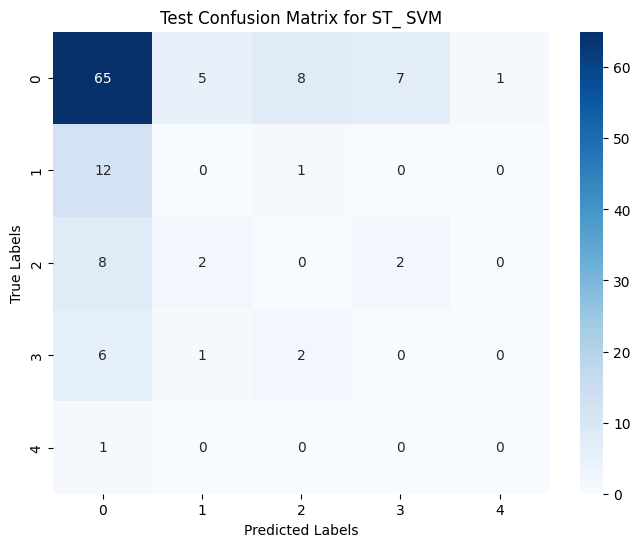


Hyperparameter tuning and evaluating RandomForest model:
Best parameters for RandomForest: {'classifier__max_depth': 10, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 50}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.99      0.83      0.90       398
           1       0.64      0.87      0.74        61
           2       0.63      0.89      0.74        54
           3       0.65      0.98      0.78        41
           4       0.75      1.00      0.86         6

    accuracy                           0.85       560
   macro avg       0.73      0.91      0.80       560
weighted avg       0.89      0.85      0.86       560



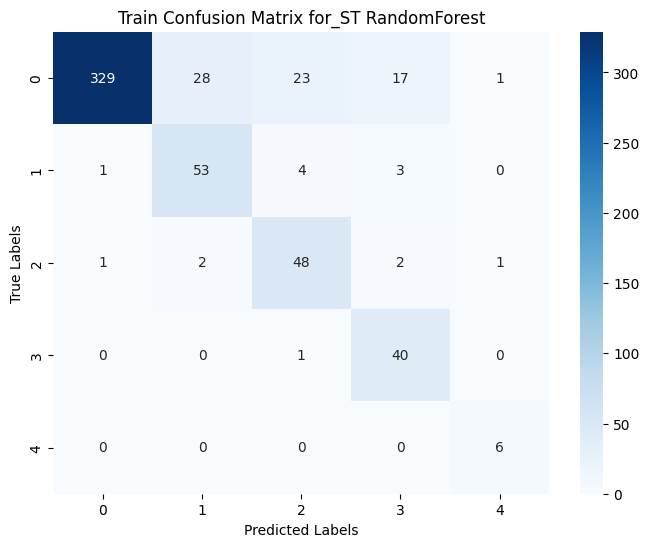

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.79      0.74        85
           1       0.25      0.15      0.19        13
           2       0.11      0.08      0.10        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.58       120
   macro avg       0.21      0.21      0.21       120
weighted avg       0.54      0.58      0.56       120



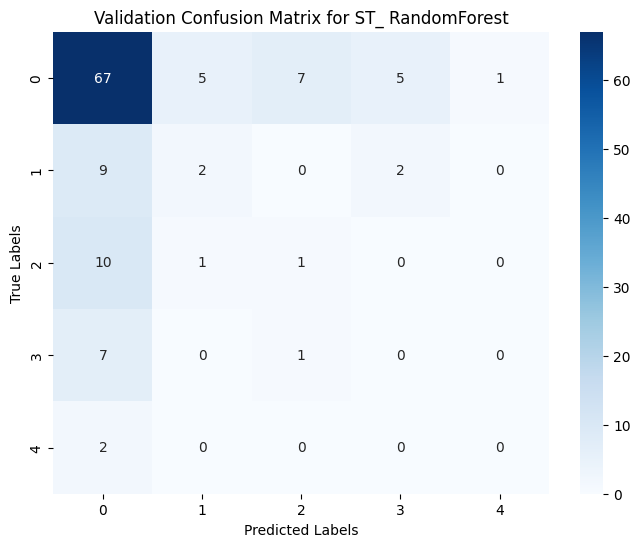

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.72      0.88      0.80        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.63       121
   macro avg       0.14      0.18      0.16       121
weighted avg       0.51      0.63      0.57       121



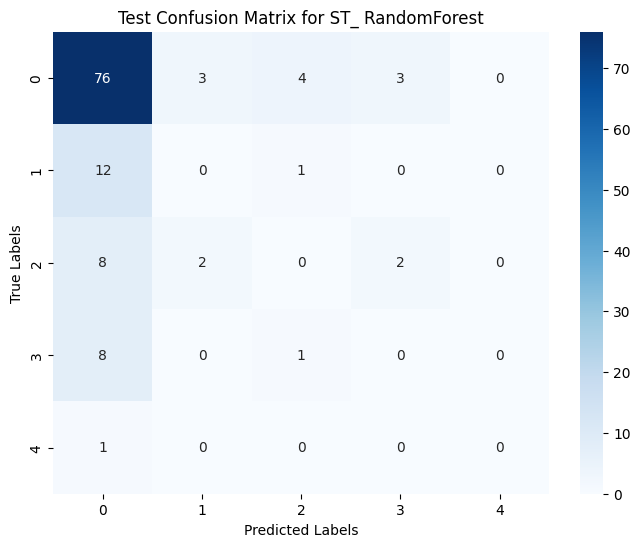


Hyperparameter tuning and evaluating LogisticRegression model:
Best parameters for LogisticRegression: {'classifier__C': 0.1, 'classifier__solver': 'liblinear'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       398
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00        54
           3       0.00      0.00      0.00        41
           4       1.00      0.17      0.29         6

    accuracy                           0.71       560
   macro avg       0.34      0.23      0.22       560
weighted avg       0.52      0.71      0.59       560



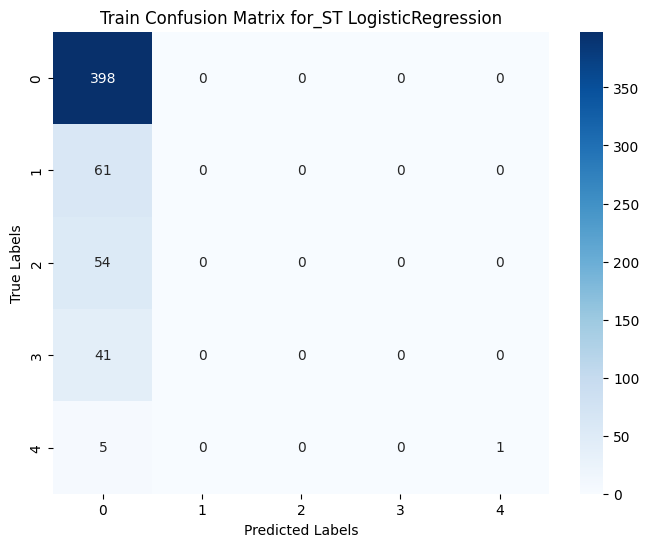

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



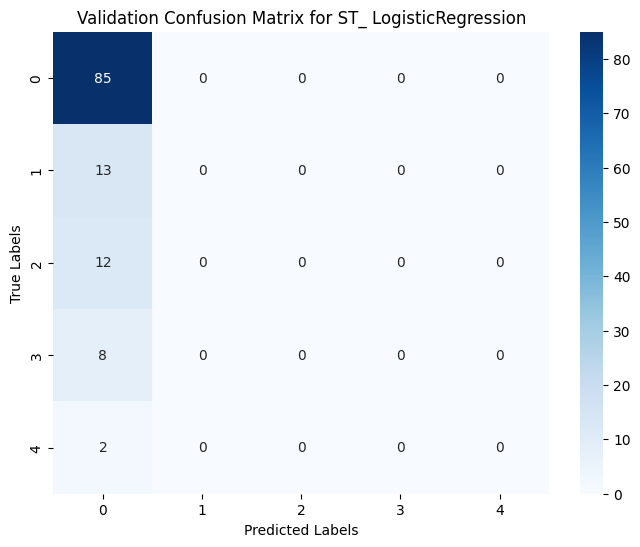

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.71       121
   macro avg       0.14      0.20      0.17       121
weighted avg       0.51      0.71      0.59       121



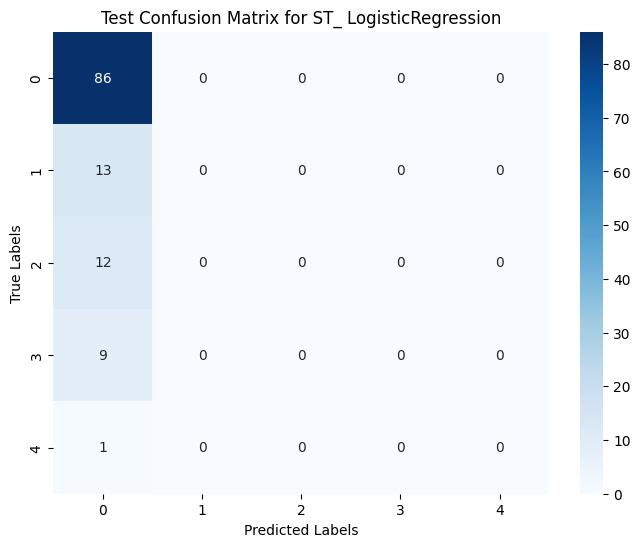


Hyperparameter tuning and evaluating KNeighbors model:
Best parameters for KNeighbors: {'classifier__n_neighbors': 10, 'classifier__weights': 'uniform'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       398
           1       0.00      0.00      0.00        61
           2       0.33      0.02      0.04        54
           3       0.00      0.00      0.00        41
           4       0.00      0.00      0.00         6

    accuracy                           0.71       560
   macro avg       0.21      0.20      0.17       560
weighted avg       0.54      0.71      0.59       560



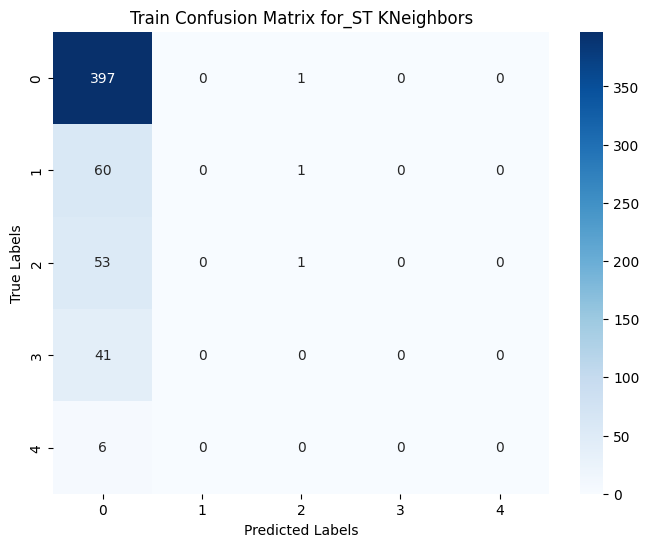

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



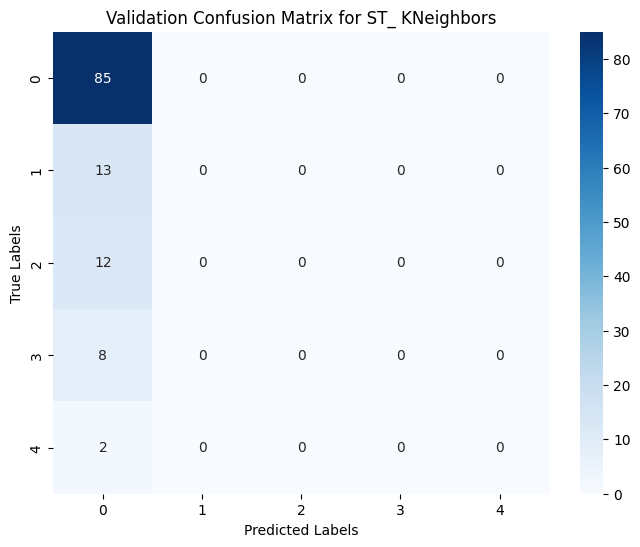

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.99      0.83        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.70       121
   macro avg       0.14      0.20      0.17       121
weighted avg       0.50      0.70      0.59       121



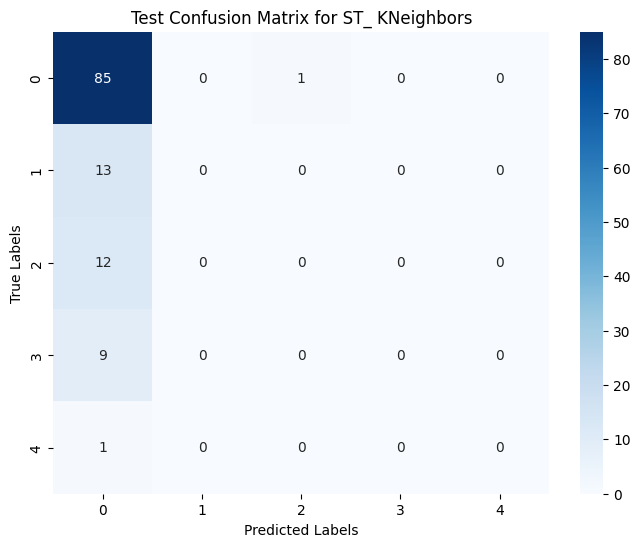


Hyperparameter tuning and evaluating NaiveBayes model:
Best parameters for NaiveBayes: {'classifier__alpha': 0.1}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       398
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00        54
           3       0.00      0.00      0.00        41
           4       1.00      0.17      0.29         6

    accuracy                           0.71       560
   macro avg       0.34      0.23      0.22       560
weighted avg       0.52      0.71      0.59       560



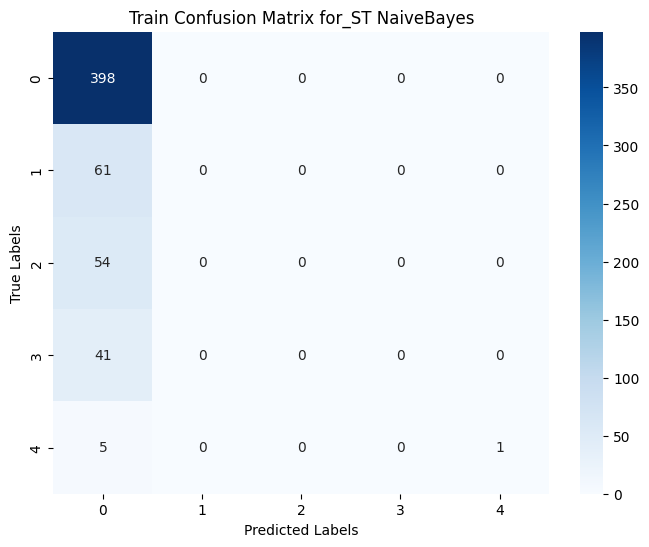

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



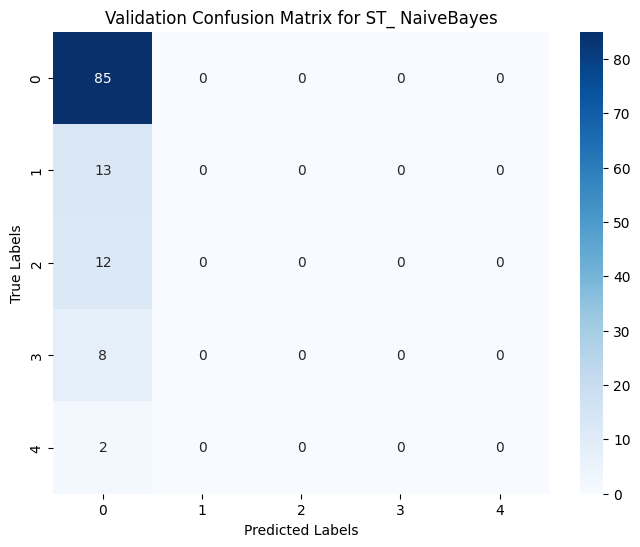

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.71       121
   macro avg       0.14      0.20      0.17       121
weighted avg       0.51      0.71      0.59       121



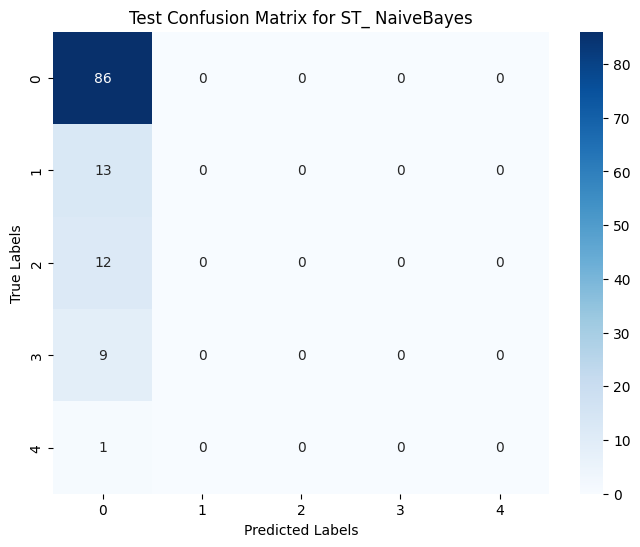


Hyperparameter tuning and evaluating DecisionTree model:
Best parameters for DecisionTree: {'classifier__max_depth': None, 'classifier__min_samples_split': 5}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       1.00      0.82      0.90       398
           1       0.66      0.85      0.74        61
           2       0.60      0.94      0.73        54
           3       0.65      0.98      0.78        41
           4       0.75      1.00      0.86         6

    accuracy                           0.85       560
   macro avg       0.73      0.92      0.80       560
weighted avg       0.90      0.85      0.86       560



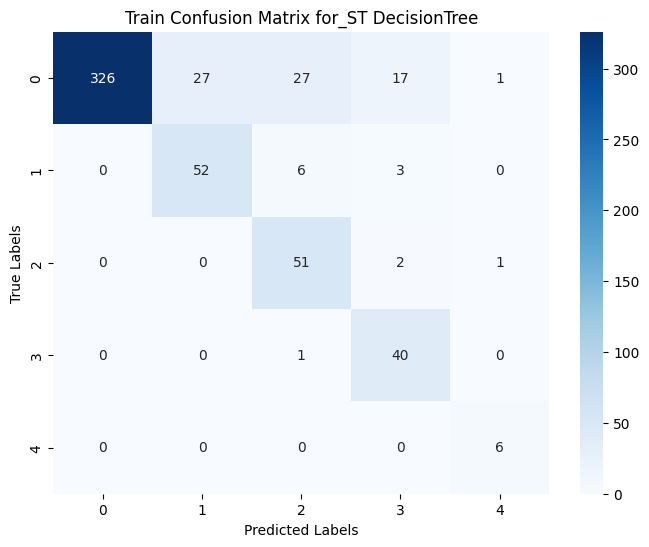

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.61      0.66        85
           1       0.17      0.15      0.16        13
           2       0.08      0.17      0.11        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.47       120
   macro avg       0.19      0.19      0.19       120
weighted avg       0.53      0.47      0.49       120



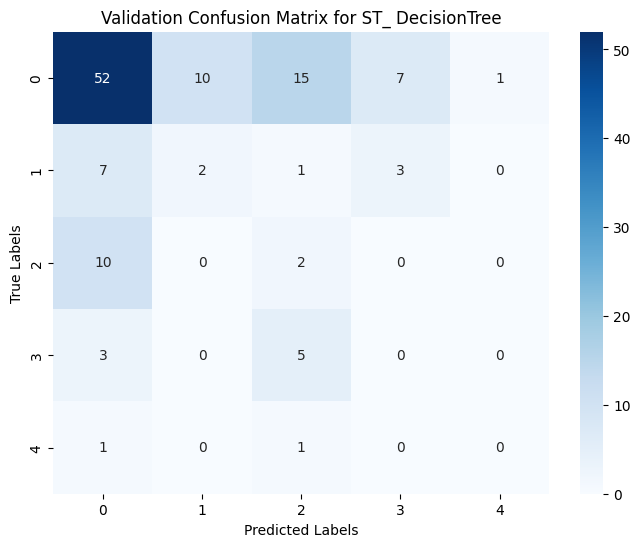

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.69      0.69      0.69        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.49       121
   macro avg       0.14      0.14      0.14       121
weighted avg       0.49      0.49      0.49       121



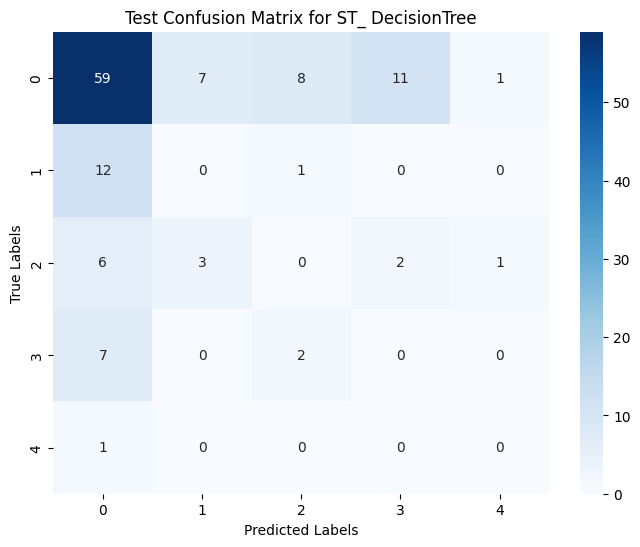


Hyperparameter tuning and evaluating AdaBoost model:
Best parameters for AdaBoost: {'classifier__learning_rate': 0.01, 'classifier__n_estimators': 50}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83       398
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00        54
           3       0.00      0.00      0.00        41
           4       0.00      0.00      0.00         6

    accuracy                           0.71       560
   macro avg       0.14      0.20      0.17       560
weighted avg       0.51      0.71      0.59       560



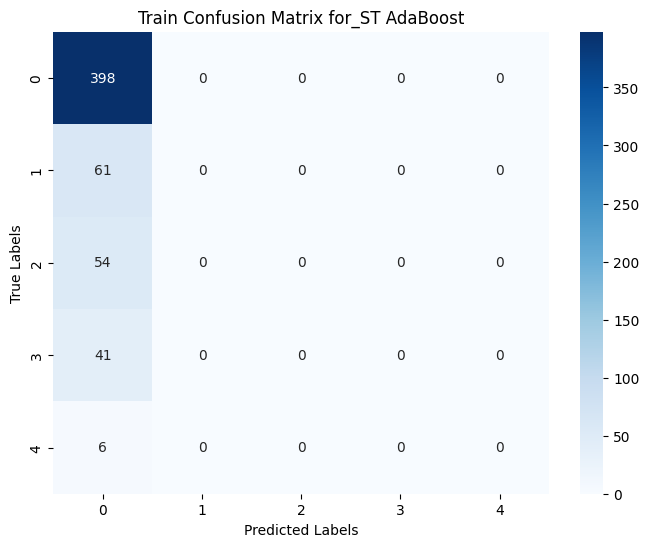

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



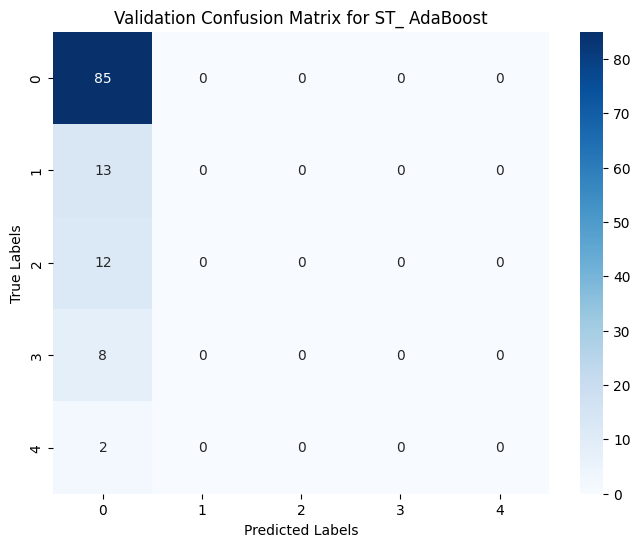

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.71       121
   macro avg       0.14      0.20      0.17       121
weighted avg       0.51      0.71      0.59       121



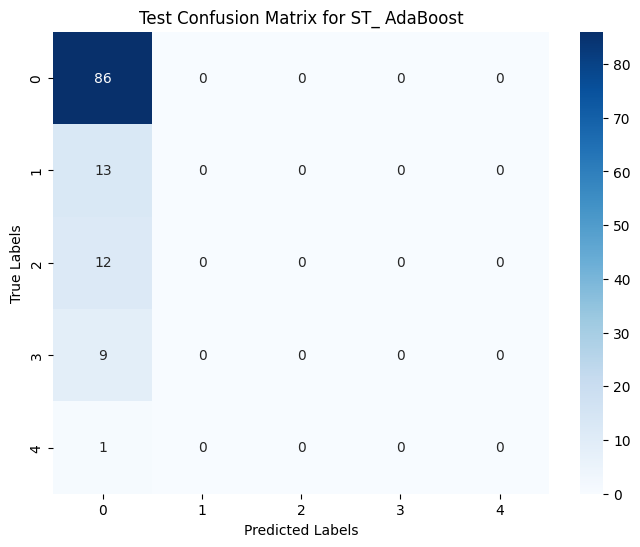


Hyperparameter tuning and evaluating Bagging model:
Best parameters for Bagging: {'classifier__max_samples': 0.5, 'classifier__n_estimators': 50}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.82      0.99      0.89       398
           1       0.90      0.46      0.61        61
           2       0.81      0.41      0.54        54
           3       0.93      0.34      0.50        41
           4       0.80      0.67      0.73         6

    accuracy                           0.82       560
   macro avg       0.85      0.57      0.65       560
weighted avg       0.83      0.82      0.80       560



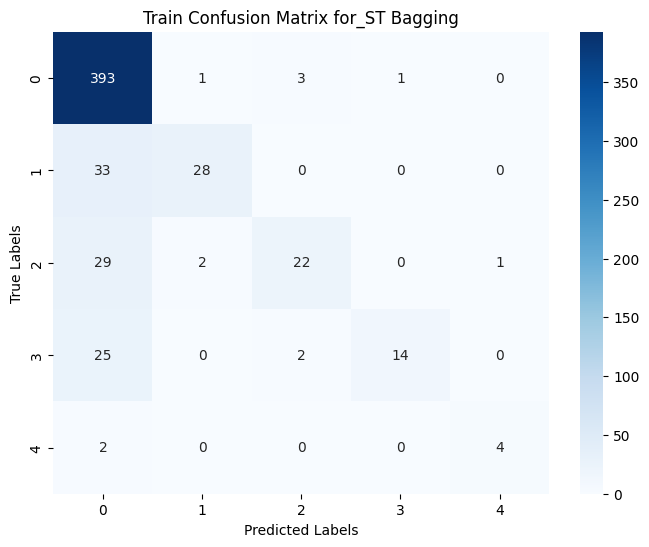

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.71      0.92      0.80        85
           1       0.00      0.00      0.00        13
           2       0.25      0.08      0.12        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.66       120
   macro avg       0.19      0.20      0.18       120
weighted avg       0.53      0.66      0.58       120



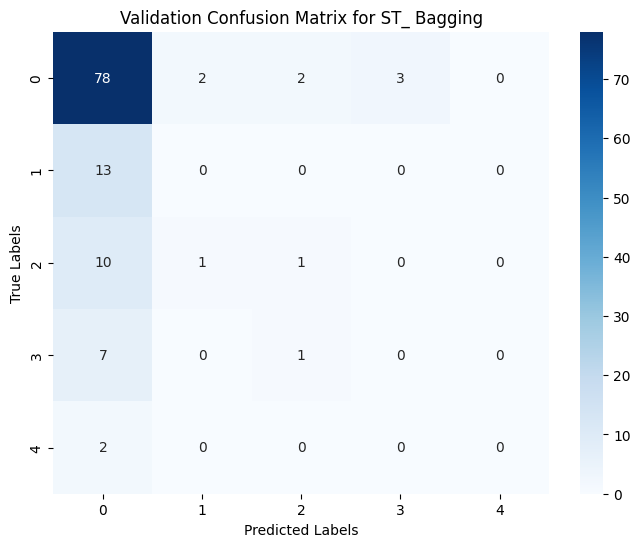

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.72      0.97      0.82        86
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         9
           4       0.00      0.00      0.00         1

    accuracy                           0.69       121
   macro avg       0.14      0.19      0.16       121
weighted avg       0.51      0.69      0.58       121



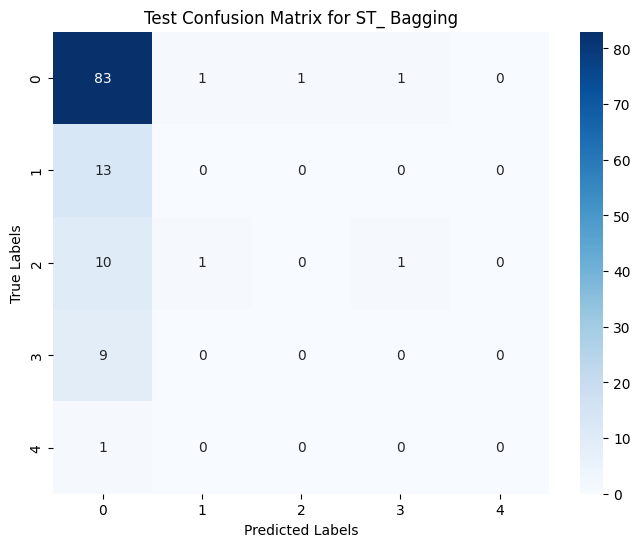

In [ ]:
# Define parameter grids for hyperparameter tuning
param_grids = {
    "SVM": {
        "classifier__C": [0.1, 1, 10, 100],
        "classifier__gamma": ["scale", "auto"],
        "classifier__kernel": ["linear", "rbf"]
    },
    "RandomForest": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    "LogisticRegression": {
        "classifier__C": [0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"]
    },
    "KNeighbors": {
        "classifier__n_neighbors": [3, 5, 7, 10],
        "classifier__weights": ["uniform", "distance"]
    },
    "NaiveBayes": {
        "classifier__alpha": [0.1, 0.5, 1.0]
    },
    "DecisionTree": {
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
  #  "GradientBoosting": {
   #     "classifier__n_estimators": [50, 100, 200],
    #    "classifier__learning_rate": [0.01, 0.1, 0.2],
     #   "classifier__max_depth": [3, 5, 7]
#    },
    "AdaBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__learning_rate": [0.01, 0.1, 1.0]
    },
    "Bagging": {
        "classifier__n_estimators": [10, 50, 100],
        "classifier__max_samples": [0.5, 0.7, 1.0]
    }
}

# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
#    "GradientBoosting": Pipeline([
 #       ("classifier", GradientBoostingClassifier(random_state=1))
  #  ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results = []

# Perform hyperparameter tuning and evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nHyperparameter tuning and evaluating {model_name} model:")

    # Perform Grid Search
    grid_search = GridSearchCV(pipeline, param_grid=param_grids[model_name], cv=3, scoring="accuracy")
    grid_search.fit(X_train, y_train)

    # Best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predict on train data
    best_model = grid_search.best_estimator_

     # Predict on train data
    y_train_pred = best_model.predict(X_train)
    train_accuracy_st_tune = accuracy_score(y_train, y_train_pred)
    train_precision_st_tune = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st_tune = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st_tune = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = best_model.predict(X_val)
    val_accuracy_st_tune = accuracy_score(y_val, y_val_pred)
    val_precision_st_tune = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st_tune = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st_tune = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = best_model.predict(X_test)
    test_accuracy_st_tune = accuracy_score(y_test, y_test_pred)
    test_precision_st_tune = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st_tune = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st_tune = f1_score(y_test, y_test_pred, average="weighted")


    print("Train Classification Report_ST:")
    print(classification_report(y_train, y_train_pred))
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
    print("Validation Classification Report_ST:")
    print(classification_report(y_val, y_val_pred))
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    print("Test Classification Report_ST:")
    print(classification_report(y_test, y_test_pred))
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
        # print(report)
        # print(phase)
        for level in range(0,5):
          level = str(level)
          results.append({"Model": model_name,
                            "Phase": phase,
                            "Level": level,
                            "Precision": report[level]["precision"],
                            "Recall": report[level]["recall"],
                            "F1-Score": report[level]["f1-score"],
                            "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_tuned_paraphrasing_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     0   1.000000  0.809045  0.894444    398.0
1        SVM  Train     1   0.626506  0.852459  0.722222     61.0
2        SVM  Train     2   0.600000  0.944444  0.733813     54.0
3        SVM  Train     3   0.645161  0.975610  0.776699     41.0
4        SVM  Train     4   0.750000  1.000000  0.857143      6.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     0   0.715517  0.965116  0.821782     86.0
116  Bagging   Test     1   0.000000  0.000000  0.000000     13.0
117  Bagging   Test     2   0.000000  0.000000  0.000000     12.0
118  Bagging   Test     3   0.000000  0.000000  0.000000      9.0
119  Bagging   Test     4   0.000000  0.000000  0.000000      1.0

[120 rows x 7 columns]


### **Cross validation results**


Evaluating SVM model:
Accuracy: 0.446 ± 0.021
Precision: 0.520 ± 0.015
Recall: 0.446 ± 0.021
F1-Score: 0.476 ± 0.020
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.58      0.63        85
           1       0.21      0.23      0.22        13
           2       0.09      0.17      0.12        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.45       120
   macro avg       0.20      0.19      0.19       120
weighted avg       0.53      0.45      0.48       120



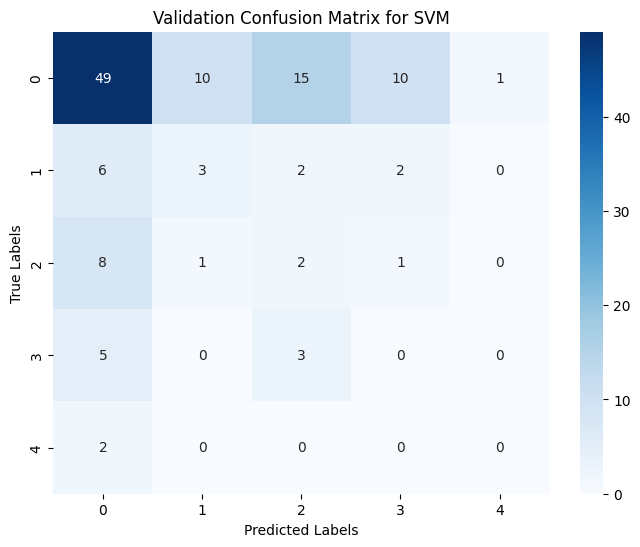


Evaluating RandomForest model:
Accuracy: 0.605 ± 0.012
Precision: 0.520 ± 0.020
Recall: 0.605 ± 0.012
F1-Score: 0.558 ± 0.014
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.79      0.74        85
           1       0.14      0.08      0.10        13
           2       0.10      0.08      0.09        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.57       120
   macro avg       0.19      0.19      0.19       120
weighted avg       0.53      0.57      0.55       120



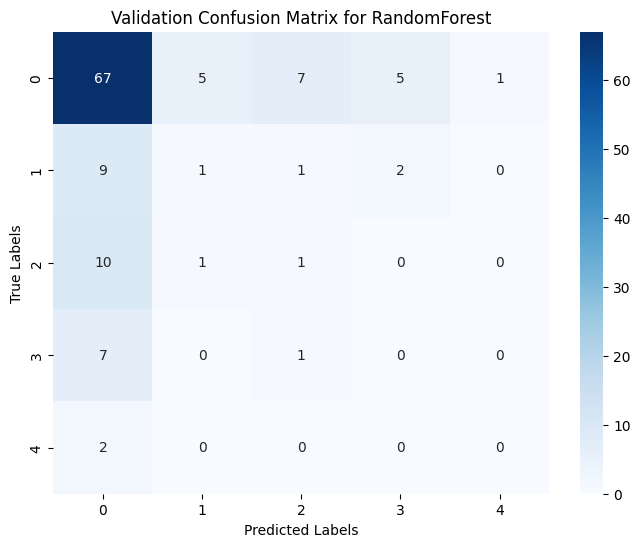


Evaluating LogisticRegression model:
Accuracy: 0.321 ± 0.026
Precision: 0.537 ± 0.035
Recall: 0.321 ± 0.026
F1-Score: 0.381 ± 0.025
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.31      0.42        85
           1       0.08      0.15      0.10        13
           2       0.12      0.33      0.18        12
           3       0.05      0.12      0.07         8
           4       0.50      0.50      0.50         2

    accuracy                           0.28       120
   macro avg       0.29      0.28      0.25       120
weighted avg       0.52      0.28      0.34       120



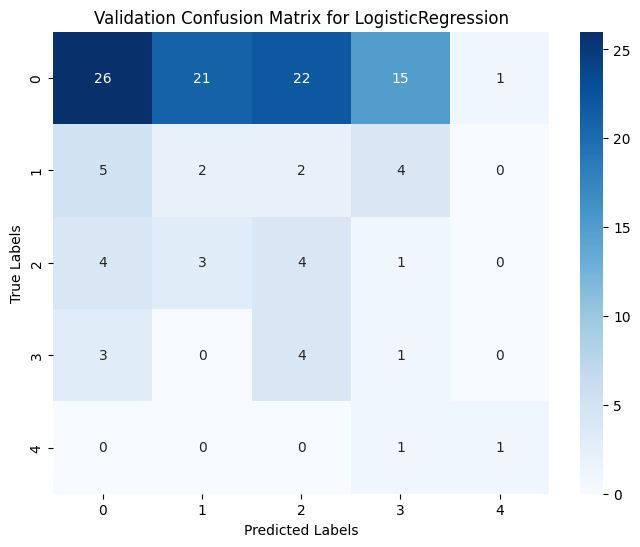


Evaluating KNeighbors model:
Accuracy: 0.677 ± 0.007
Precision: 0.506 ± 0.013
Recall: 0.677 ± 0.007
F1-Score: 0.578 ± 0.007
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.93      0.79        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.66       120
   macro avg       0.14      0.19      0.16       120
weighted avg       0.49      0.66      0.56       120



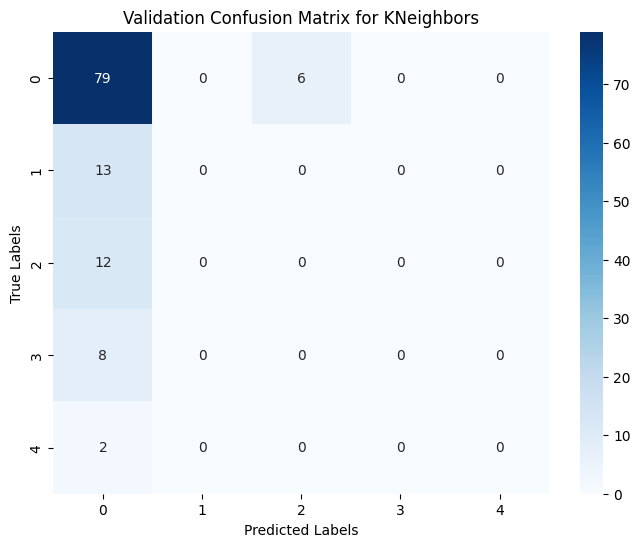


Evaluating NaiveBayes model:
Accuracy: 0.711 ± 0.004
Precision: 0.505 ± 0.006
Recall: 0.711 ± 0.004
F1-Score: 0.591 ± 0.006
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.71      1.00      0.83        85
           1       0.00      0.00      0.00        13
           2       0.00      0.00      0.00        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.71       120
   macro avg       0.14      0.20      0.17       120
weighted avg       0.50      0.71      0.59       120



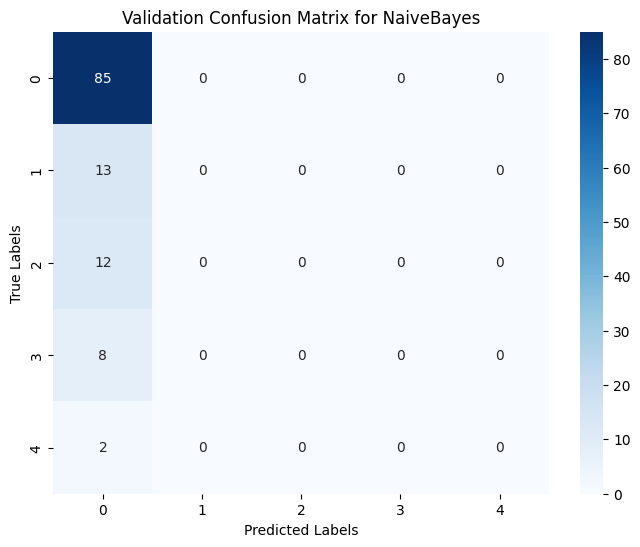


Evaluating DecisionTree model:
Accuracy: 0.468 ± 0.030
Precision: 0.526 ± 0.020
Recall: 0.468 ± 0.030
F1-Score: 0.493 ± 0.015
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.64      0.67        85
           1       0.10      0.08      0.09        13
           2       0.11      0.17      0.13        12
           3       0.08      0.12      0.10         8
           4       0.00      0.00      0.00         2

    accuracy                           0.48       120
   macro avg       0.20      0.20      0.20       120
weighted avg       0.52      0.48      0.50       120



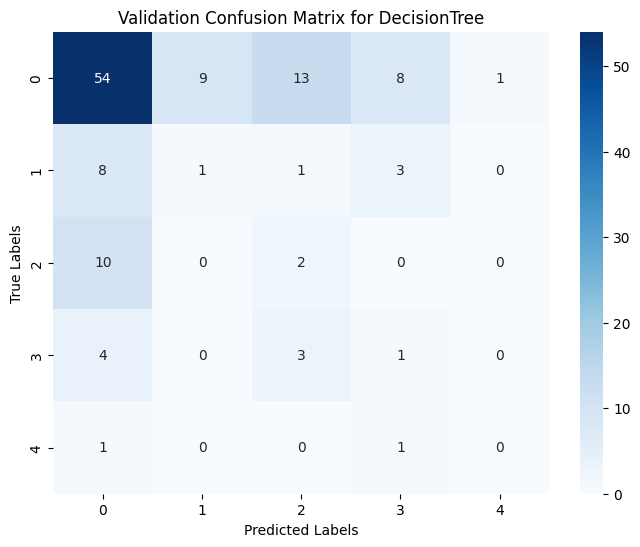


Evaluating AdaBoost model:
Accuracy: 0.662 ± 0.032
Precision: 0.527 ± 0.033
Recall: 0.662 ± 0.032
F1-Score: 0.581 ± 0.023
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.88      0.79        85
           1       0.00      0.00      0.00        13
           2       0.33      0.08      0.13        12
           3       0.33      0.25      0.29         8
           4       0.00      0.00      0.00         2

    accuracy                           0.65       120
   macro avg       0.27      0.24      0.24       120
weighted avg       0.56      0.65      0.59       120



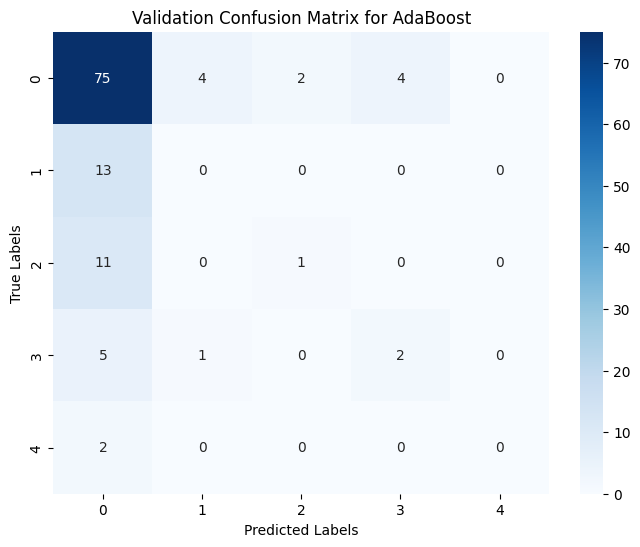


Evaluating Bagging model:
Accuracy: 0.618 ± 0.015
Precision: 0.515 ± 0.031
Recall: 0.618 ± 0.015
F1-Score: 0.560 ± 0.022
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.91      0.81        85
           1       0.00      0.00      0.00        13
           2       0.17      0.08      0.11        12
           3       0.00      0.00      0.00         8
           4       0.00      0.00      0.00         2

    accuracy                           0.65       120
   macro avg       0.18      0.20      0.18       120
weighted avg       0.54      0.65      0.59       120



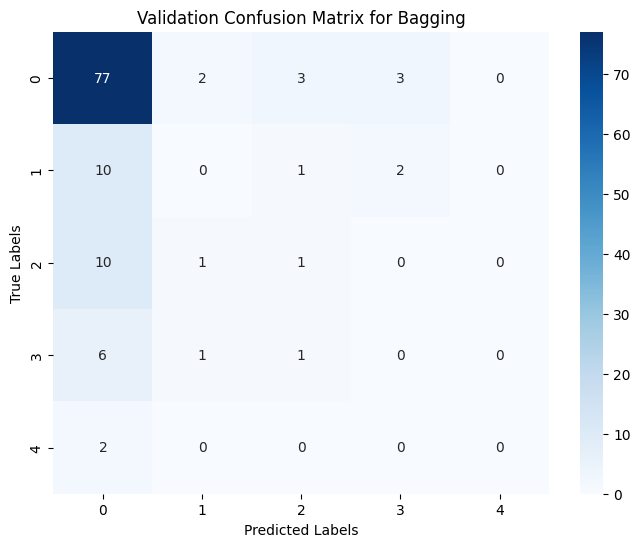

In [ ]:
# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
 #   "GradientBoosting": Pipeline([
 #       ("classifier", GradientBoostingClassifier(random_state=1))
 #   ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Cross-validate accuracy
    accuracy_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(accuracy_score)
    )
    print(f"Accuracy: {np.mean(accuracy_scores):.3f} ± {np.std(accuracy_scores):.3f}")

    # Cross-validate precision
    precision_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(precision_score, average="weighted")
    )
    print(f"Precision: {np.mean(precision_scores):.3f} ± {np.std(precision_scores):.3f}")

    # Cross-validate recall
    recall_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(recall_score, average="weighted")
    )
    print(f"Recall: {np.mean(recall_scores):.3f} ± {np.std(recall_scores):.3f}")

    # Cross-validate F1-score
    f1_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(f1_score, average="weighted")
    )
    print(f"F1-Score: {np.mean(f1_scores):.3f} ± {np.std(f1_scores):.3f}")

    # Fit the pipeline on the training data
    pipeline.fit(X_train, y_train)

    # Predict on the validation set
    y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report:")
    print(classification_report(y_val, y_val_pred))

    # Plot confusion matrix for validation set
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()


In [ ]:
results_st_tuned=[]
 # Append results
results_st_tuned.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy_st_tune,
        "Train Precision": train_precision_st_tune,
        "Train Recall": train_recall_st_tune,
        "Train F1": train_f1_st_tune,
        "Validation Accuracy": val_accuracy_st_tune,
        "Validation Precision": val_precision_st_tune,
        "Validation Recall": val_recall_st_tune,
        "Validation F1": val_f1_st_tune,
        "Test Accuracy": test_accuracy_st_tune,
        "Test Precision": test_precision_st_tune,
        "Test Recall": test_recall_st_tune,
        "Test F1": test_f1_st_tune
    })

# Create a DataFrame from results
results_st_tuned_df = pd.DataFrame(results_st_tuned)

# Display results
print("\nModel Performance Metrics (ST):")
print(results_st_tuned_df)

# Find the best model based on Validation F1 score
best_model_st_tuned = results_st_tuned_df.sort_values(by="Validation F1", ascending=False).iloc[0]
print("\nBest Model (ST):")
print(best_model_st_tuned)


Model Performance Metrics (ST):
     Model  Train Accuracy  Train Precision  Train Recall  Train F1  \
0  Bagging        0.823214         0.833346      0.823214  0.797882   

   Validation Accuracy  Validation Precision  Validation Recall  \
0             0.658333              0.527273           0.658333   

   Validation F1  Test Accuracy  Test Precision  Test Recall   Test F1  
0       0.579167        0.68595        0.508549      0.68595  0.584077  

Best Model (ST):
Model                    Bagging
Train Accuracy          0.823214
Train Precision         0.833346
Train Recall            0.823214
Train F1                0.797882
Validation Accuracy     0.658333
Validation Precision    0.527273
Validation Recall       0.658333
Validation F1           0.579167
Test Accuracy            0.68595
Test Precision          0.508549
Test Recall              0.68595
Test F1                 0.584077
Name: 0, dtype: object


# METHOD 5: Target variable - Potential Accident Level, Data Augumentation - paraphrasing, Synthetic data

In [ ]:
Accident_Level = dataset_cleaned_original['Accident_Level']
Potential_Accident_Level = dataset_cleaned_original['Potential_Accident_Level']
Descriptions_correc = dataset_cleaned_original['Translated_Description']

# Combine into a DataFrame
original_data = pd.DataFrame({
    'Accident Level': Accident_Level,
    'Potential Accident Level': Potential_Accident_Level,
    'Description': Descriptions_correc
})

# Save the synthetic data to a CSV file
output_file = "/content/drive/MyDrive/AIML-Git/Capstone project/org_data.csv"
original_data.to_csv(output_file, index=False)
print("cleaned data saved to 'org_data.csv'")

cleaned data saved to 'org_data.csv'


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Load the newly uploaded dataset
org_data = pd.read_csv("/content/drive/MyDrive/AIML-Git/Capstone project/org_data.csv")

# Check if there is a column suitable for vectorization
if 'Description' in org_data.columns:
    # Apply TF-IDF Vectorization on the 'Description' column
    vectorizer = TfidfVectorizer(max_features=500)
    tfidf_matrix = vectorizer.fit_transform(org_data['Description'].fillna(''))

    # Convert the matrix to a DataFrame for inspection
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

    # Display the vectorized data
    print("TF-IDF Vectorization of Descriptions:")
    print(tfidf_df.head())
else:
    print("Column 'Description' not found in the dataset.")

TF-IDF Vectorization of Descriptions:
   access  accident  accompanied  acid  activate  activity  air  allergic  \
0     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
1     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
2     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
3     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   
4     0.0       0.0          0.0   0.0       0.0       0.0  0.0       0.0   

   anchor  ankle  ...  without  wooden      work    worker  workshop  would  \
0     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
1     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
2     0.0    0.0  ...      0.0     0.0  0.171515  0.000000       0.0    0.0   
3     0.0    0.0  ...      0.0     0.0  0.000000  0.000000       0.0    0.0   
4     0.0    0.0  ...      0.0     0.0  0.000000  0.132987       0.0    0.0   

   wound   xx  zinc  zon

In [ ]:
import pandas as pd
from gensim.models import Word2Vec

# Check if the 'Description' column exists for word embeddings
if 'Description' in org_data.columns:
    # Preprocess the text data
    org_data['Processed_Description'] = (
        org_data['Description']
        .fillna('')
        .str.lower()
        .str.replace(r'[^\w\s]', '', regex=True)  # Remove punctuation and special characters
    )
    tokenized_descriptions = org_data['Processed_Description'].apply(str.split).tolist()

    # Train Word2Vec model on the tokenized descriptions
    word2vec_model = Word2Vec(
        sentences=tokenized_descriptions,
        vector_size=100,
        window=5,
        min_count=1,
        workers=4,
        sg=1,  # Skip-gram model
    )

    # Save the word embeddings for inspection
    word_embeddings = {word: word2vec_model.wv[word] for word in word2vec_model.wv.index_to_key}

    # Convert embeddings dictionary to a DataFrame for inspection
    embeddings_preview = pd.DataFrame(word_embeddings).T.head()

    # Display the embeddings for the first few words
    print("Word Embeddings Preview:")
    print(embeddings_preview)
else:
    print("Column 'Description' not found in the dataset.")

Word Embeddings Preview:
                0         1         2         3         4         5   \
hand     -0.063894  0.237286  0.068076  0.025629  0.061720 -0.410156   
employee -0.078539  0.242468  0.078547  0.012269  0.085303 -0.406725   
causing  -0.062592  0.235918  0.056910  0.017161  0.077996 -0.388866   
left     -0.074284  0.247665  0.062268  0.013166  0.075998 -0.403162   
right    -0.077209  0.244221  0.055046  0.009317  0.076332 -0.397608   

                6         7         8         9   ...        90        91  \
hand      0.095615  0.448950 -0.216132 -0.055110  ...  0.301235  0.068197   
employee  0.092923  0.440686 -0.210872 -0.059205  ...  0.296910  0.070359   
causing   0.088454  0.436504 -0.215922 -0.041509  ...  0.291767  0.073539   
left      0.092885  0.442208 -0.207984 -0.054864  ...  0.289148  0.066965   
right     0.094145  0.439412 -0.220472 -0.039957  ...  0.305056  0.062043   

                92        93        94        95        96        97  \
hand   

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder for each target column
accident_level_encoder = LabelEncoder()
potential_accident_level_encoder = LabelEncoder()

# Encode the target variables
org_data['Accident Level Encoded'] = accident_level_encoder.fit_transform(org_data['Accident Level'])
org_data['Potential Accident Level Encoded'] = potential_accident_level_encoder.fit_transform(org_data['Potential Accident Level'])

## **Test - Train split**

In [ ]:
# Define target and features
X = org_data['Processed_Description']
y = org_data['Potential Accident Level Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(287, 62, 62)

## **Data augmentation (using paraphrasing for description and using probability sampling for targer variable) and synthetic row generation**

In [ ]:
from sklearn.utils import resample
import random
from sklearn.preprocessing import LabelEncoder
from transformers import pipeline

# Synthetic data generation for categorical columns (Accident Level, Potential Accident Level)
def generate_synthetic_levels(data, column_name, num_samples):
    levels = data[column_name].value_counts(normalize=True)
    synthetic_levels = np.random.choice(levels.index, size=num_samples, p=levels.values)
    return synthetic_levels

# Load a pre-trained text generation model for paraphrasing
text_generator = pipeline("text2text-generation", model="t5-base")

# Function to generate synthetic descriptions
def generate_synthetic_descriptions(descriptions, num_variations=1):
    augmented_descriptions = []
    for description in descriptions:
        try:
            # Generate variations of the description
            variations = text_generator(description, max_length=300, num_return_sequences=num_variations)
            augmented_descriptions.extend([var["generated_text"] for var in variations])
        except Exception as e:
            # If an error occurs, use the original description as a fallback
            augmented_descriptions.append(description)
    return augmented_descriptions

# Function to augment a single description
def augment_description(description):
    augmented = generate_synthetic_descriptions([description], num_variations=1)
    return augmented[0] if augmented else description

# Synthetic training data generation
def generate_train_synthetic_data(X_train, y_train, org_data, num_samples):
    synthetic_data = []

    # Generate synthetic Accident Level and Potential Accident Level
    synthetic_accident_levels = generate_synthetic_levels(org_data, 'Accident Level', num_samples)
    synthetic_potential_levels = generate_synthetic_levels(org_data, 'Potential Accident Level', num_samples)

    # Generate synthetic descriptions
    for _ in range(num_samples):
        random_desc = X_train.sample(1).values[0]
        augmented_desc = augment_description(random_desc)
        synthetic_data.append({
            'Accident Level': np.random.choice(synthetic_accident_levels),
            'Potential Accident Level': np.random.choice(synthetic_potential_levels),
            'Description': augmented_desc
        })

    return pd.DataFrame(synthetic_data)

# Assuming X_train and y_train are prepared, and org_data is the full dataset with original columns
num_samples = 600  # Number of synthetic samples to generate
synthetic_train_data = generate_train_synthetic_data(X_train, y_train, org_data, num_samples=num_samples)

# Encode target variables in synthetic data
target_encoder_AL = LabelEncoder()
target_encoder_PAL = LabelEncoder()

synthetic_train_data['Accident Level Encoded'] = target_encoder_AL.fit_transform(synthetic_train_data['Accident Level'])
synthetic_train_data['Potential Accident Level Encoded'] = target_encoder_PAL.fit_transform(synthetic_train_data['Potential Accident Level'])

# Combine synthetic data with the original training data
X_train_combined = pd.concat([X_train, synthetic_train_data['Description']], ignore_index=True)
y_train_AL_combined = pd.concat([y_train, synthetic_train_data['Accident Level Encoded']], ignore_index=True)
y_train_PAL_combined = pd.concat([y_train, synthetic_train_data['Potential Accident Level Encoded']], ignore_index=True)

# Save combined training data to CSV (optional)
combined_data = pd.DataFrame({
    'Description': X_train_combined,
    'Accident Level Encoded': y_train_AL_combined,
    'Potential Accident Level Encoded': y_train_PAL_combined
})
combined_data.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/combined_training_data_potential.csv', index=False)
print("Synthetic data encoded and saved to 'combined_training_data.csv'")

Device set to use cuda:0


Synthetic data encoded and saved to 'combined_training_data.csv'


## Combined data

In [ ]:
data_tr = pd.read_csv('/content/drive/MyDrive/AIML-Git/Capstone project/combined_training_data_potential.csv')
data_tr.head()

,Description,Accident Level Encoded,Potential Accident Level Encoded
0,moment collaborator carried inspection conveye...,3,3
1,circumstance dump truck laden ore entered unlo...,3,3
2,mechanical technical proceeded perform mainten...,2,2
3,aligning right bracket tower n releasing tensi...,3,3
4,please inspection lumbo check list equipment o...,3,3


In [ ]:
data_tr.duplicated().sum()

75

In [ ]:
data_tr.drop_duplicates(inplace=True)

In [ ]:
# Define target and features
X_train_syn = data_tr['Description']
y_train_syn = data_tr['Accident Level Encoded']

## **Sentence Tranformer -Pipeline for all models**

In [ ]:
from sentence_transformers import SentenceTransformer

# Extract the 'description' column
descriptions_list = list(data_tr['Description'])

# Load a pre-trained Sentence Transformer model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings for each description
sentence_embeddings = model.encode(descriptions_list, show_progress_bar=True)

# Display the shape of the embeddings
print(f"Embedding Shape: {sentence_embeddings.shape}")

# Convert embeddings to a DataFrame
embedding_df = pd.DataFrame(sentence_embeddings, columns=[f'Embedding_{i}' for i in range(sentence_embeddings.shape[1])])

# Concatenate the embeddings with the original dataset
#dataset_with_embeddings = pd.concat([dataset_1.reset_index(drop=True), embedding_df], axis=1)

# Display the updated DataFrame
print(embedding_df.head())

Batches:   0%|          | 0/26 [00:00<?, ?it/s]

Embedding Shape: (812, 384)
   Embedding_0  Embedding_1  Embedding_2  Embedding_3  Embedding_4  \
0    -0.065341     0.046732     0.073658     0.022510    -0.019959   
1    -0.014692     0.011046     0.059244     0.036180    -0.004180   
2    -0.085370     0.035438     0.033266     0.008585     0.020264   
3    -0.071000     0.042054     0.024686     0.005759    -0.176036   
4    -0.000110    -0.040544     0.074425    -0.009640     0.068202   

   Embedding_5  Embedding_6  Embedding_7  Embedding_8  Embedding_9  ...  \
0    -0.055164     0.074391     0.023100    -0.025322    -0.054902  ...   
1    -0.035266     0.034393     0.047448    -0.100050    -0.035364  ...   
2    -0.048881     0.061063     0.030150    -0.039138     0.029621  ...   
3     0.063216    -0.054052     0.004064    -0.028970     0.050694  ...   
4    -0.077358     0.101720     0.031761    -0.047109    -0.071243  ...   

   Embedding_374  Embedding_375  Embedding_376  Embedding_377  Embedding_378  \
0      -0.004185    

In [ ]:
# Define target and features
X = embedding_df
y = data_tr['Accident Level Encoded']

# Splitting the data into train, validation, and test sets (70% train, 15% validation, 15% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=1, stratify=y_temp)

# Checking the sizes of each split
train_size = len(X_train)
val_size = len(X_val)
test_size = len(X_test)

train_size, val_size, test_size

(568, 122, 122)

### Model pipeline without tuning


Evaluating SVM model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.87      0.80      0.84       285
           1       0.72      0.79      0.75        80
           2       0.76      0.86      0.81        81
           3       0.78      0.75      0.77       102
           4       0.69      1.00      0.82        20

    accuracy                           0.81       568
   macro avg       0.77      0.84      0.80       568
weighted avg       0.81      0.81      0.81       568



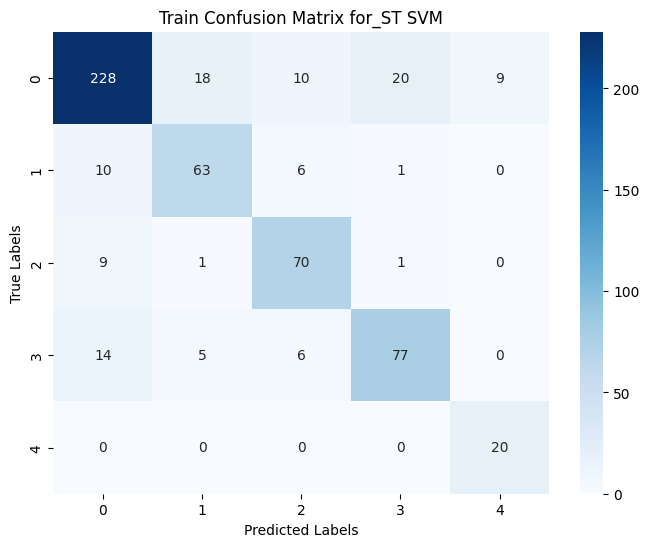

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.56      0.58        61
           1       0.35      0.35      0.35        17
           2       0.20      0.18      0.19        17
           3       0.28      0.36      0.31        22
           4       0.20      0.20      0.20         5

    accuracy                           0.43       122
   macro avg       0.33      0.33      0.33       122
weighted avg       0.44      0.43      0.43       122



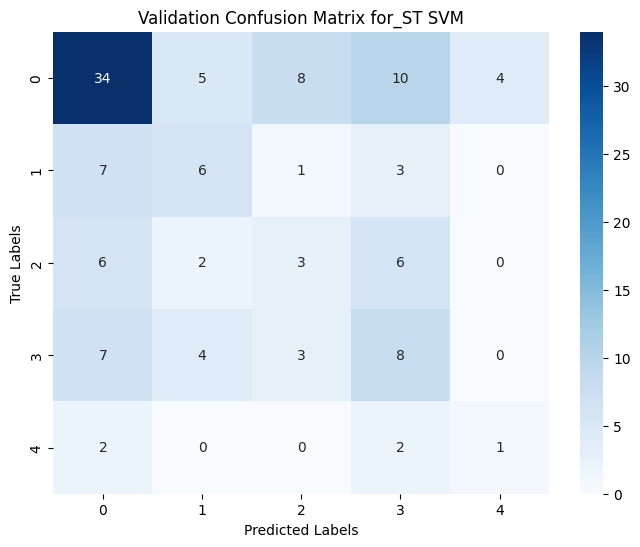

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.68      0.66      0.67        62
           1       0.31      0.24      0.27        17
           2       0.22      0.29      0.25        17
           3       0.35      0.36      0.36        22
           4       0.00      0.00      0.00         4

    accuracy                           0.48       122
   macro avg       0.31      0.31      0.31       122
weighted avg       0.48      0.48      0.48       122



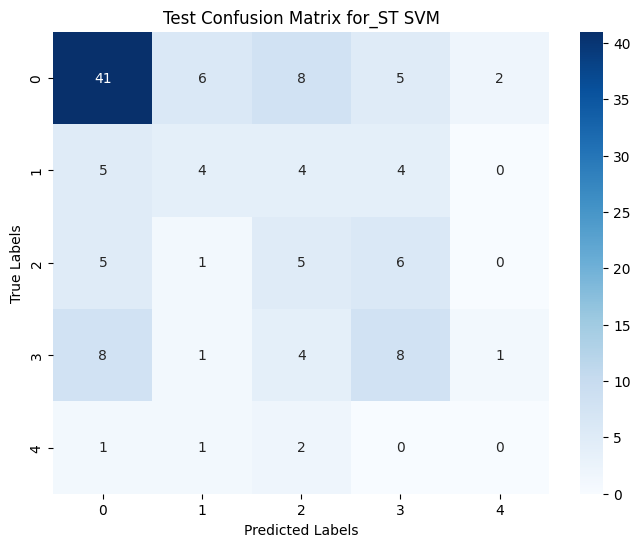


Evaluating RandomForest model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.94      0.84      0.89       285
           1       0.78      0.91      0.84        80
           2       0.83      0.93      0.88        81
           3       0.87      0.89      0.88       102
           4       0.74      1.00      0.85        20

    accuracy                           0.88       568
   macro avg       0.83      0.91      0.87       568
weighted avg       0.88      0.88      0.88       568



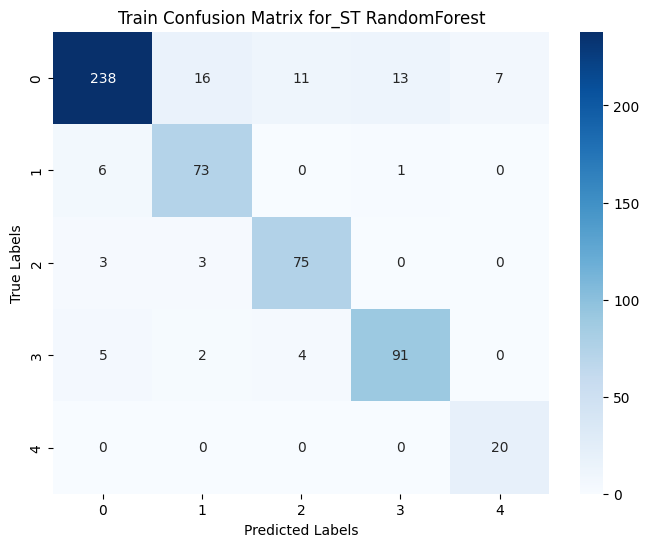

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.43      0.62      0.51        61
           1       0.18      0.12      0.14        17
           2       0.12      0.06      0.08        17
           3       0.09      0.05      0.06        22
           4       0.00      0.00      0.00         5

    accuracy                           0.34       122
   macro avg       0.17      0.17      0.16       122
weighted avg       0.28      0.34      0.30       122



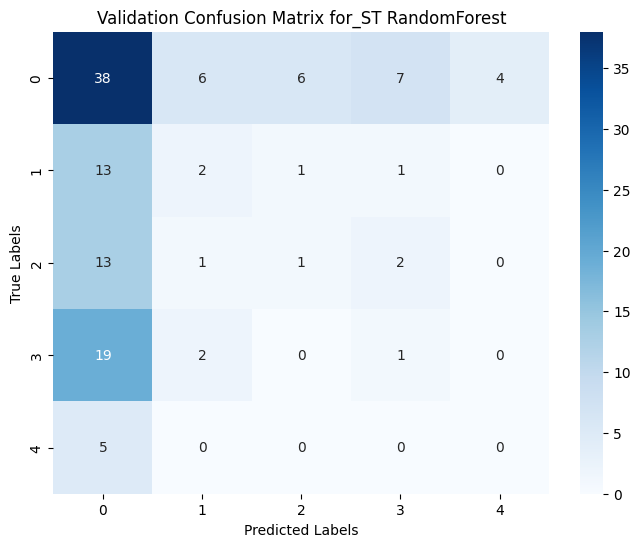

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.52      0.76      0.62        62
           1       0.45      0.29      0.36        17
           2       0.21      0.18      0.19        17
           3       0.33      0.09      0.14        22
           4       0.00      0.00      0.00         4

    accuracy                           0.47       122
   macro avg       0.30      0.26      0.26       122
weighted avg       0.42      0.47      0.42       122



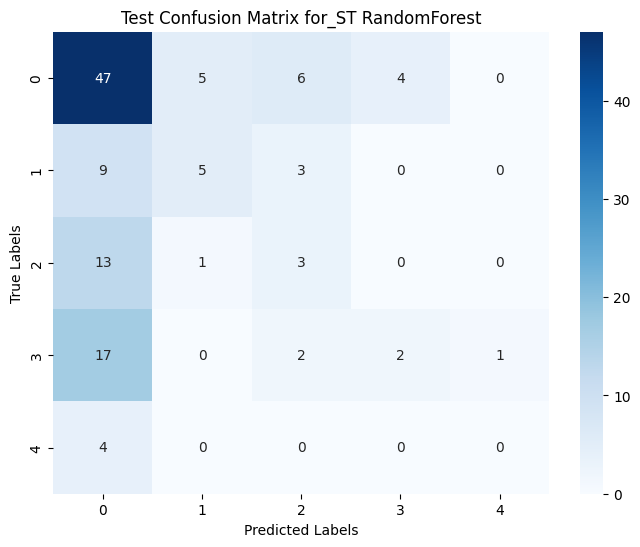


Evaluating LogisticRegression model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.83      0.69      0.75       285
           1       0.52      0.65      0.58        80
           2       0.57      0.60      0.59        81
           3       0.60      0.54      0.57       102
           4       0.37      1.00      0.54        20

    accuracy                           0.65       568
   macro avg       0.58      0.70      0.61       568
weighted avg       0.69      0.65      0.66       568



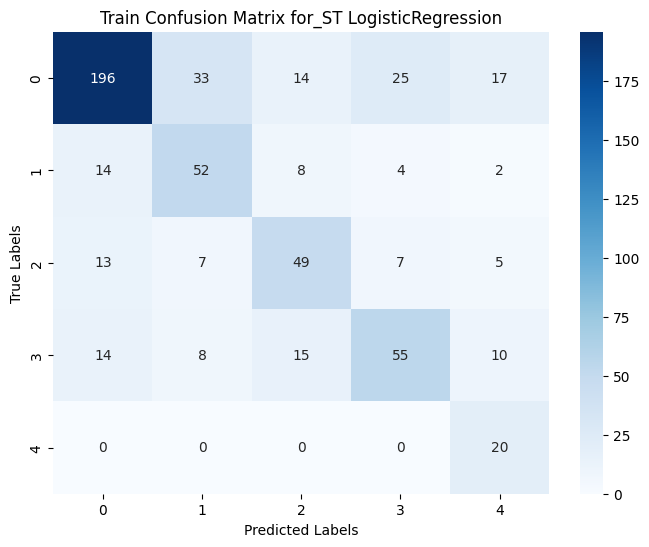

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.70      0.52      0.60        61
           1       0.40      0.47      0.43        17
           2       0.31      0.29      0.30        17
           3       0.24      0.32      0.27        22
           4       0.09      0.20      0.12         5

    accuracy                           0.43       122
   macro avg       0.35      0.36      0.35       122
weighted avg       0.49      0.43      0.46       122



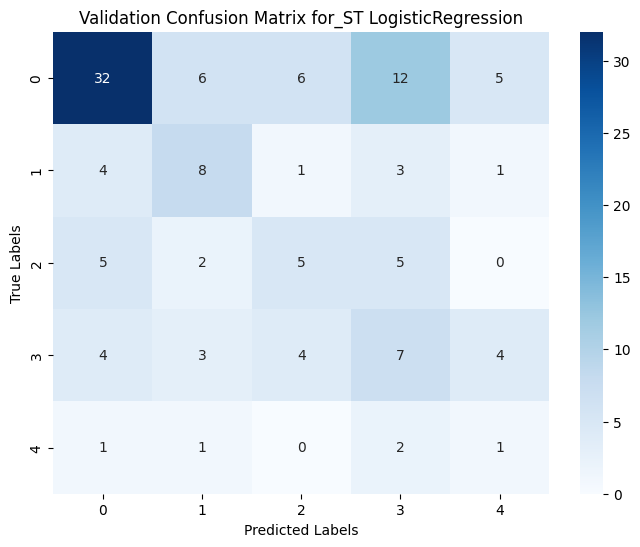

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.73      0.56      0.64        62
           1       0.21      0.24      0.22        17
           2       0.28      0.47      0.35        17
           3       0.45      0.23      0.30        22
           4       0.00      0.00      0.00         4

    accuracy                           0.43       122
   macro avg       0.33      0.30      0.30       122
weighted avg       0.52      0.43      0.46       122



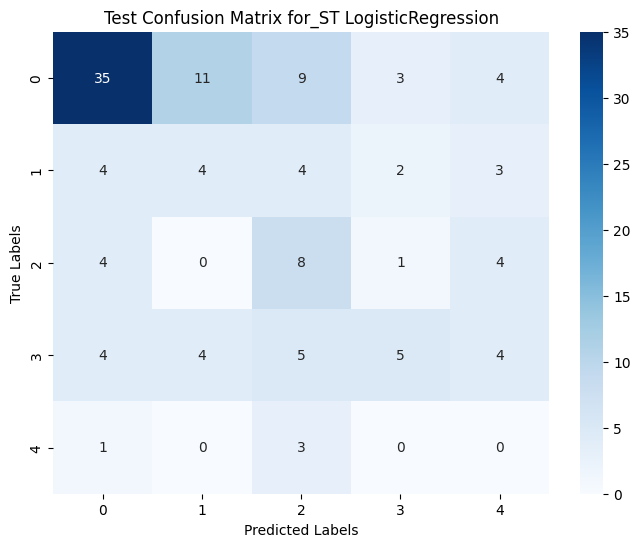


Evaluating KNeighbors model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.66      0.92      0.77       285
           1       0.56      0.36      0.44        80
           2       0.60      0.33      0.43        81
           3       0.61      0.37      0.46       102
           4       0.38      0.15      0.21        20

    accuracy                           0.63       568
   macro avg       0.56      0.43      0.46       568
weighted avg       0.62      0.63      0.60       568



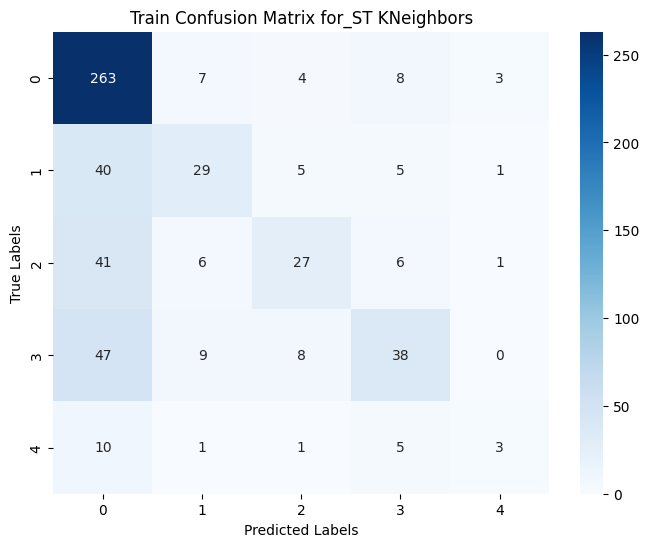

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.55      0.84      0.67        61
           1       0.30      0.18      0.22        17
           2       0.14      0.06      0.08        17
           3       0.36      0.18      0.24        22
           4       0.00      0.00      0.00         5

    accuracy                           0.48       122
   macro avg       0.27      0.25      0.24       122
weighted avg       0.40      0.48      0.42       122



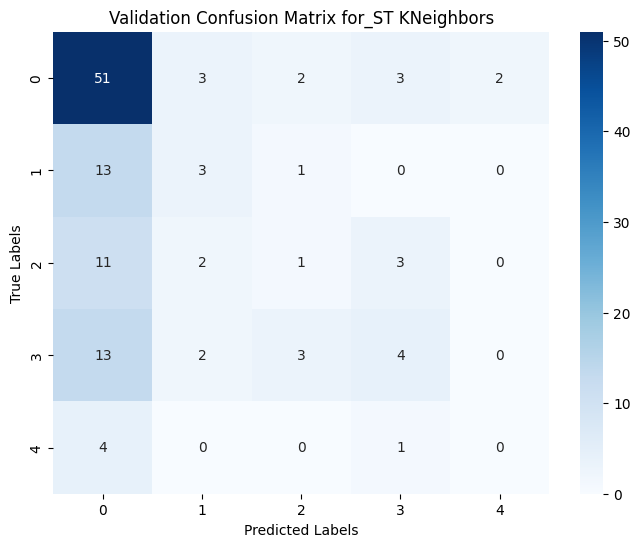

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.57      0.87      0.69        62
           1       0.25      0.06      0.10        17
           2       0.36      0.24      0.29        17
           3       0.17      0.09      0.12        22
           4       0.00      0.00      0.00         4

    accuracy                           0.50       122
   macro avg       0.27      0.25      0.24       122
weighted avg       0.41      0.50      0.43       122



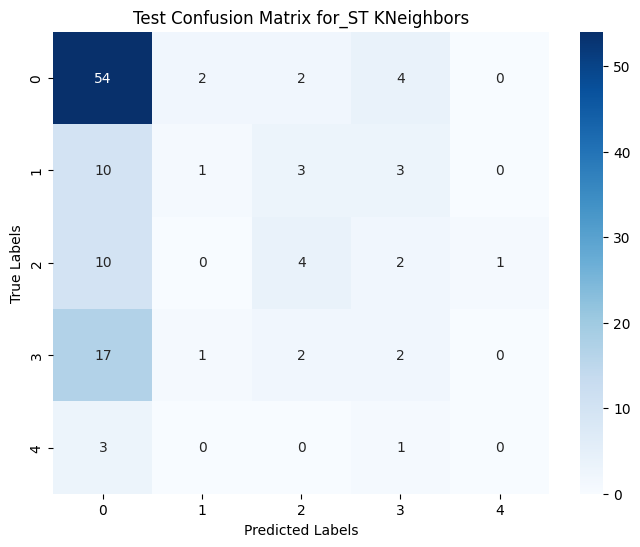


Evaluating NaiveBayes model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.58      0.98      0.73       285
           1       0.62      0.23      0.33        80
           2       0.59      0.23      0.34        81
           3       0.63      0.17      0.26       102
           4       0.00      0.00      0.00        20

    accuracy                           0.59       568
   macro avg       0.49      0.32      0.33       568
weighted avg       0.58      0.59      0.51       568



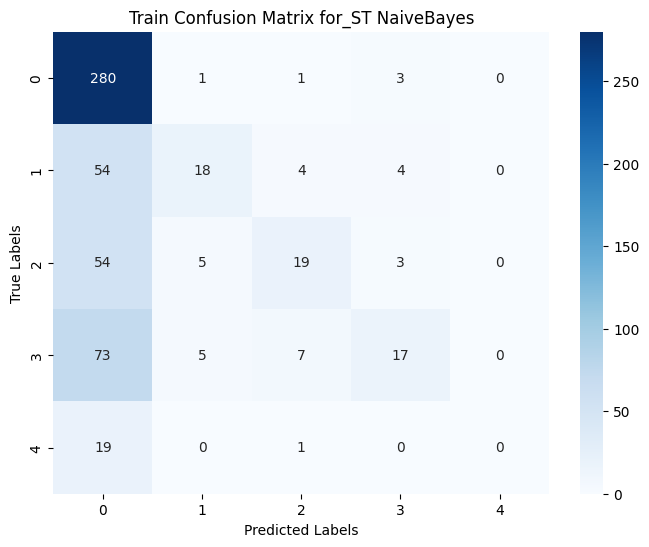

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.57      0.98      0.72        61
           1       0.50      0.18      0.26        17
           2       0.33      0.06      0.10        17
           3       0.62      0.23      0.33        22
           4       0.00      0.00      0.00         5

    accuracy                           0.57       122
   macro avg       0.41      0.29      0.28       122
weighted avg       0.51      0.57      0.47       122



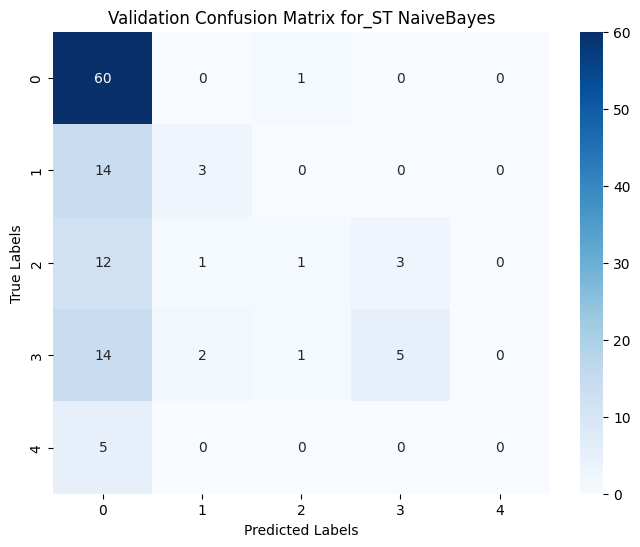

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.57      0.98      0.72        62
           1       0.67      0.12      0.20        17
           2       0.44      0.24      0.31        17
           3       0.67      0.09      0.16        22
           4       0.00      0.00      0.00         4

    accuracy                           0.57       122
   macro avg       0.47      0.29      0.28       122
weighted avg       0.56      0.57      0.47       122



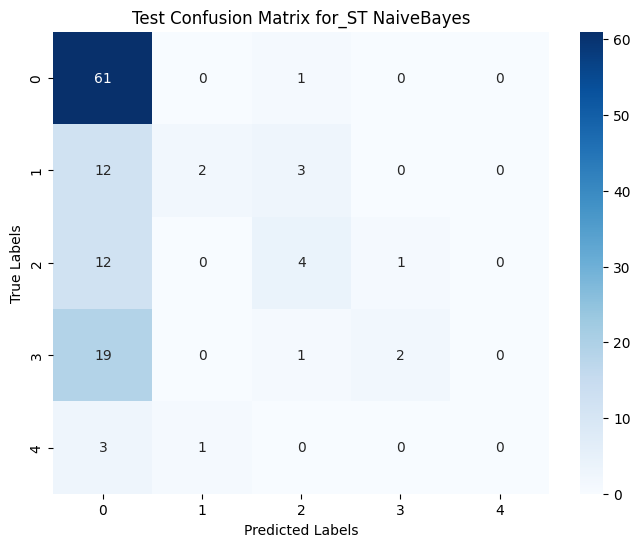


Evaluating DecisionTree model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       1.00      0.75      0.86       285
           1       0.68      1.00      0.81        80
           2       0.79      0.96      0.87        81
           3       0.83      0.91      0.87       102
           4       0.74      1.00      0.85        20

    accuracy                           0.85       568
   macro avg       0.81      0.92      0.85       568
weighted avg       0.89      0.85      0.85       568



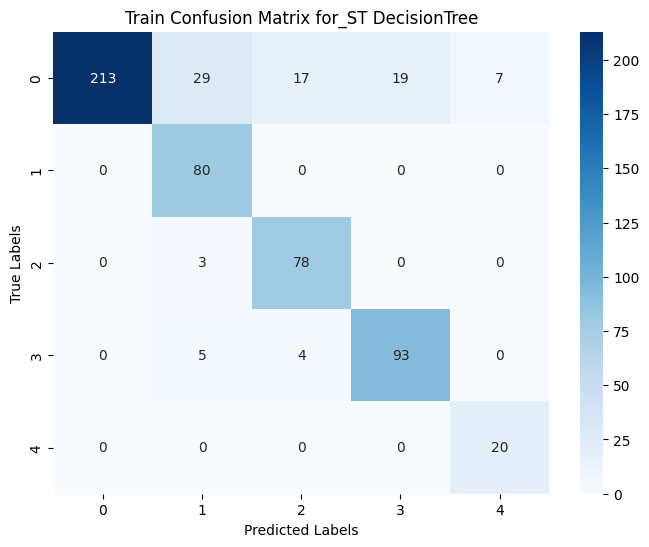

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.56      0.41      0.47        61
           1       0.35      0.47      0.40        17
           2       0.09      0.12      0.10        17
           3       0.11      0.14      0.12        22
           4       0.00      0.00      0.00         5

    accuracy                           0.31       122
   macro avg       0.22      0.23      0.22       122
weighted avg       0.36      0.31      0.33       122



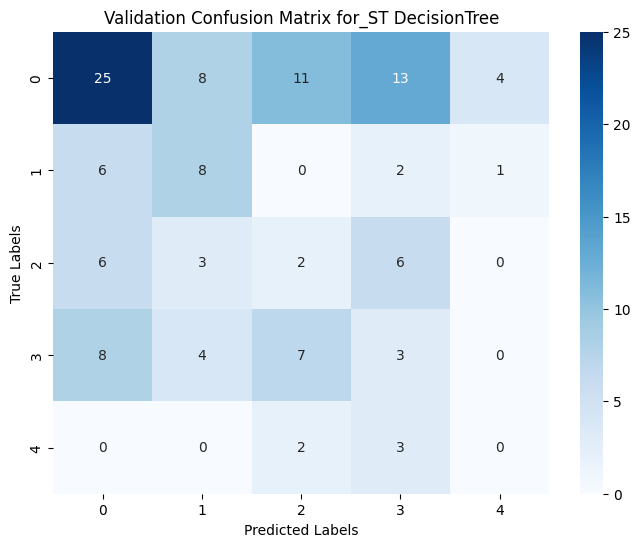

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.64      0.56      0.60        62
           1       0.25      0.29      0.27        17
           2       0.25      0.29      0.27        17
           3       0.25      0.27      0.26        22
           4       0.00      0.00      0.00         4

    accuracy                           0.42       122
   macro avg       0.28      0.29      0.28       122
weighted avg       0.44      0.42      0.43       122



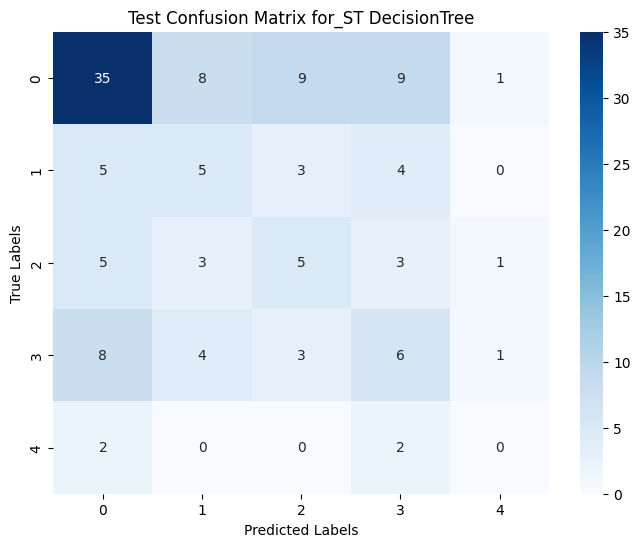


Evaluating GradientBoosting model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.82      0.99      0.90       285
           1       0.98      0.74      0.84        80
           2       0.98      0.79      0.88        81
           3       0.95      0.80      0.87       102
           4       1.00      0.75      0.86        20

    accuracy                           0.88       568
   macro avg       0.95      0.81      0.87       568
weighted avg       0.90      0.88      0.88       568



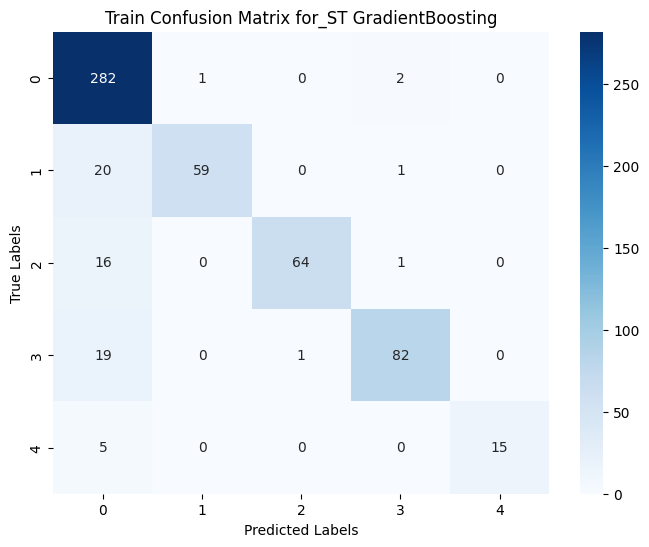

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.64      0.75      0.69        61
           1       0.40      0.35      0.38        17
           2       0.09      0.06      0.07        17
           3       0.40      0.36      0.38        22
           4       0.00      0.00      0.00         5

    accuracy                           0.50       122
   macro avg       0.31      0.31      0.30       122
weighted avg       0.46      0.50      0.48       122



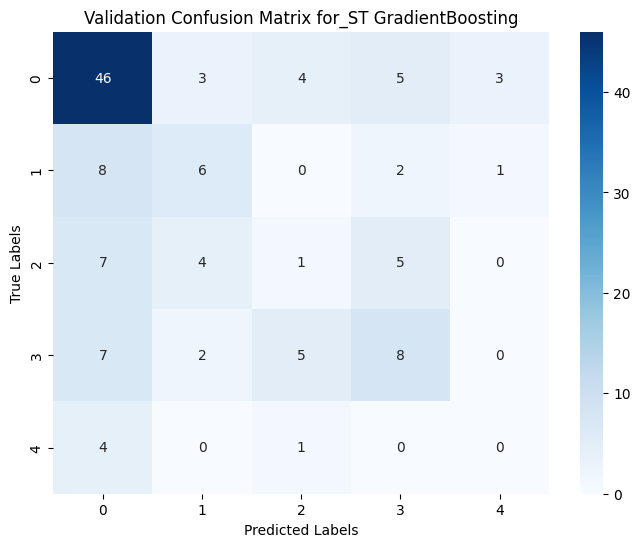

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.64      0.76      0.70        62
           1       0.45      0.29      0.36        17
           2       0.18      0.18      0.18        17
           3       0.32      0.27      0.29        22
           4       0.00      0.00      0.00         4

    accuracy                           0.50       122
   macro avg       0.32      0.30      0.30       122
weighted avg       0.47      0.50      0.48       122



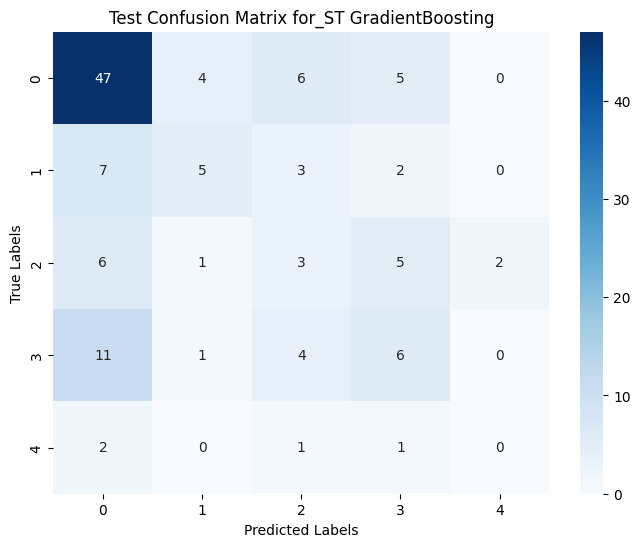


Evaluating AdaBoost model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.65      0.92      0.76       285
           1       0.41      0.20      0.27        80
           2       0.58      0.40      0.47        81
           3       0.46      0.29      0.36       102
           4       1.00      0.15      0.26        20

    accuracy                           0.61       568
   macro avg       0.62      0.39      0.42       568
weighted avg       0.58      0.61      0.56       568



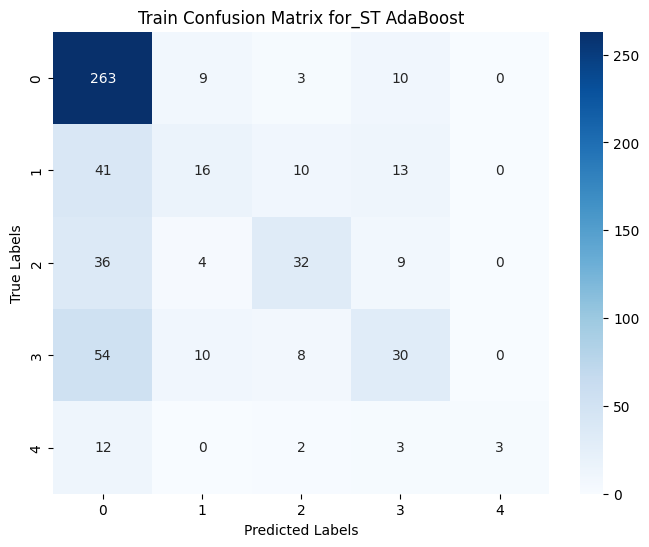

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.87      0.72        61
           1       0.27      0.18      0.21        17
           2       0.33      0.12      0.17        17
           3       0.28      0.23      0.25        22
           4       0.00      0.00      0.00         5

    accuracy                           0.52       122
   macro avg       0.30      0.28      0.27       122
weighted avg       0.44      0.52      0.46       122



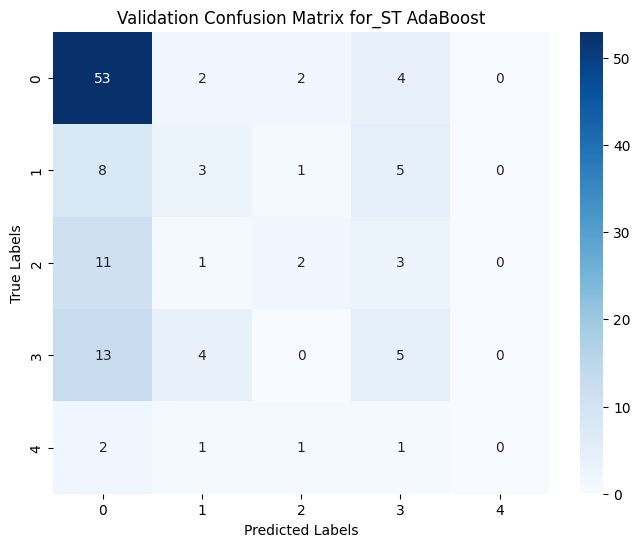

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.63      0.95      0.76        62
           1       0.56      0.29      0.38        17
           2       0.25      0.12      0.16        17
           3       0.17      0.09      0.12        22
           4       0.00      0.00      0.00         4

    accuracy                           0.56       122
   macro avg       0.32      0.29      0.28       122
weighted avg       0.46      0.56      0.48       122



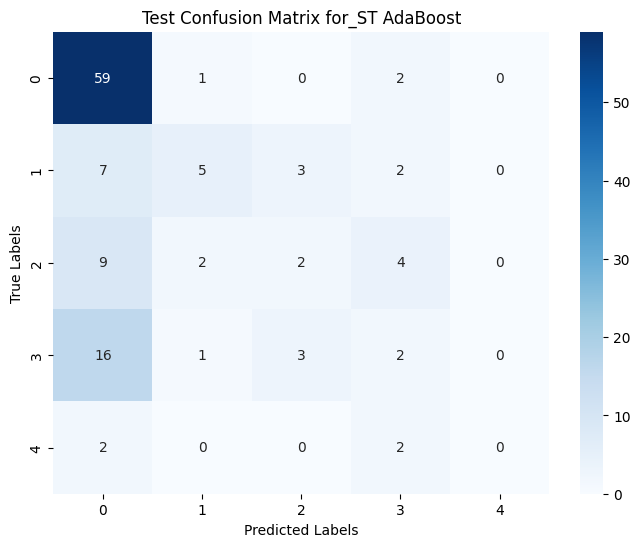


Evaluating Bagging model:
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.86      0.92      0.89       285
           1       0.89      0.81      0.85        80
           2       0.86      0.85      0.86        81
           3       0.90      0.81      0.86       102
           4       0.83      0.75      0.79        20

    accuracy                           0.87       568
   macro avg       0.87      0.83      0.85       568
weighted avg       0.87      0.87      0.87       568



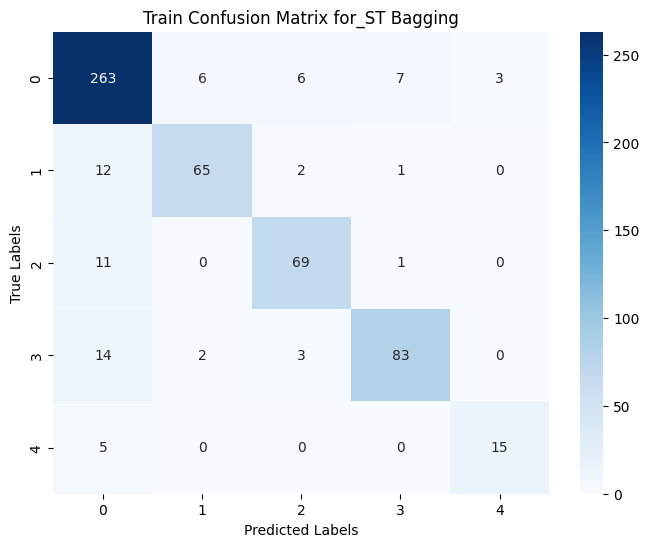

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.69      0.65        61
           1       0.32      0.35      0.33        17
           2       0.40      0.35      0.38        17
           3       0.19      0.14      0.16        22
           4       0.00      0.00      0.00         5

    accuracy                           0.47       122
   macro avg       0.30      0.31      0.30       122
weighted avg       0.44      0.47      0.45       122



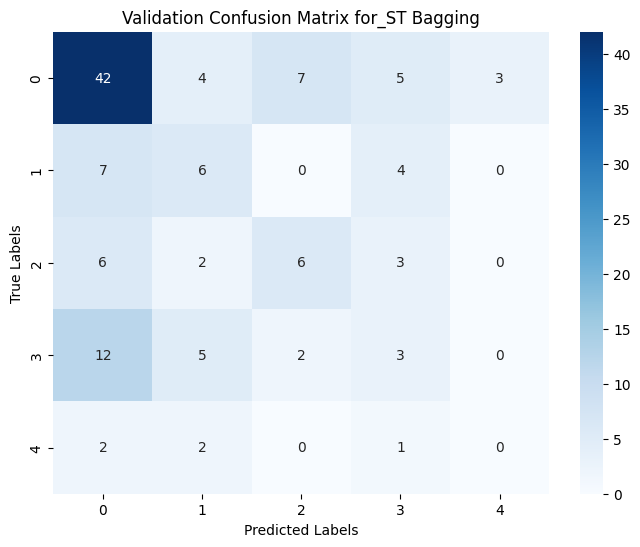

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.62      0.74      0.68        62
           1       0.35      0.35      0.35        17
           2       0.29      0.24      0.26        17
           3       0.29      0.23      0.26        22
           4       0.00      0.00      0.00         4

    accuracy                           0.50       122
   macro avg       0.31      0.31      0.31       122
weighted avg       0.46      0.50      0.48       122



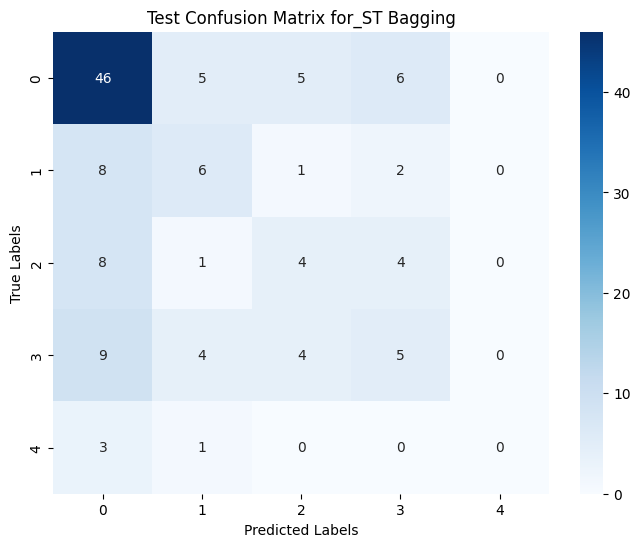

In [ ]:
# Define pipelines for each model_ST
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
    "GradientBoosting": Pipeline([
        ("classifier", GradientBoostingClassifier(random_state=1))
    ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results = []

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Train the model
    pipeline.fit(X_train, y_train)

     # Predict on train data
    y_train_pred = pipeline.predict(X_train)
    train_accuracy_st = accuracy_score(y_train, y_train_pred)
    train_precision_st = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = pipeline.predict(X_val)
    val_accuracy_st = accuracy_score(y_val, y_val_pred)
    val_precision_st = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = pipeline.predict(X_test)
    test_accuracy_st = accuracy_score(y_test, y_test_pred)
    test_precision_st = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st = f1_score(y_test, y_test_pred, average="weighted")

    # Predict on train data
    #y_train_pred = pipeline.predict(X_train)
    print("Train Classification Report_ST:")
    print(classification_report(y_train, y_train_pred))
    train_report = classification_report(y_train, y_train_pred, output_dict=True, zero_division=0)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
   # y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report_ST:")
    print(classification_report(y_val, y_val_pred))
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    #y_test_pred = pipeline.predict(X_test)
    print("Test Classification Report_ST:")
    print(classification_report(y_test, y_test_pred))
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
      for level in range(0,5):
        level = str(level)
        results.append({"Model": model_name,
                          "Phase": phase,
                          "Level": level,
                          "Precision": report[level]["precision"],
                          "Recall": report[level]["recall"],
                          "F1-Score": report[level]["f1-score"],
                          "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_paraphrasing_potential_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     0   0.873563  0.800000  0.835165    285.0
1        SVM  Train     1   0.724138  0.787500  0.754491     80.0
2        SVM  Train     2   0.760870  0.864198  0.809249     81.0
3        SVM  Train     3   0.777778  0.754902  0.766169    102.0
4        SVM  Train     4   0.689655  1.000000  0.816327     20.0
..       ...    ...   ...        ...       ...       ...      ...
130  Bagging   Test     0   0.621622  0.741935  0.676471     62.0
131  Bagging   Test     1   0.352941  0.352941  0.352941     17.0
132  Bagging   Test     2   0.285714  0.235294  0.258065     17.0
133  Bagging   Test     3   0.294118  0.227273  0.256410     22.0
134  Bagging   Test     4   0.000000  0.000000  0.000000      4.0

[135 rows x 7 columns]


### **Cross validation results**


Evaluating SVM model with Cross-Validation:
Cross-Validation Accuracy: 0.486 ± 0.024
Cross-Validation Precision: 0.492 ± 0.008
Cross-Validation Recall: 0.486 ± 0.024
Cross-Validation F1-Score: 0.486 ± 0.014

Test Accuracy: 0.475
Test Precision: 0.483
Test Recall: 0.475
Test F1-Score: 0.478


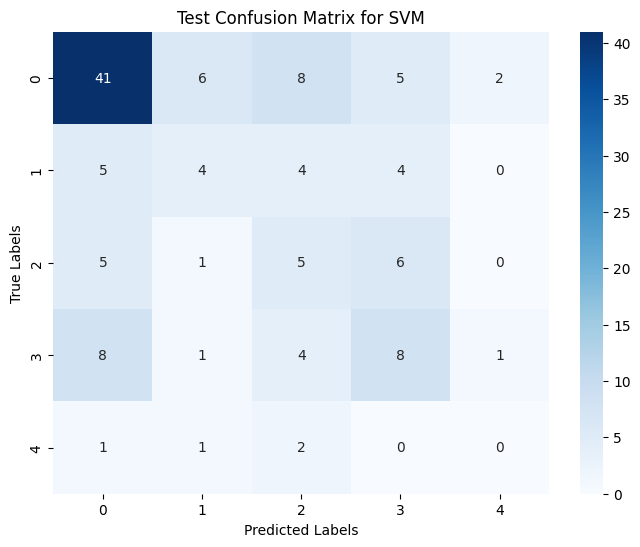


Evaluating RandomForest model with Cross-Validation:
Cross-Validation Accuracy: 0.440 ± 0.040
Cross-Validation Precision: 0.365 ± 0.074
Cross-Validation Recall: 0.440 ± 0.040
Cross-Validation F1-Score: 0.372 ± 0.044

Test Accuracy: 0.467
Test Precision: 0.419
Test Recall: 0.467
Test F1-Score: 0.417


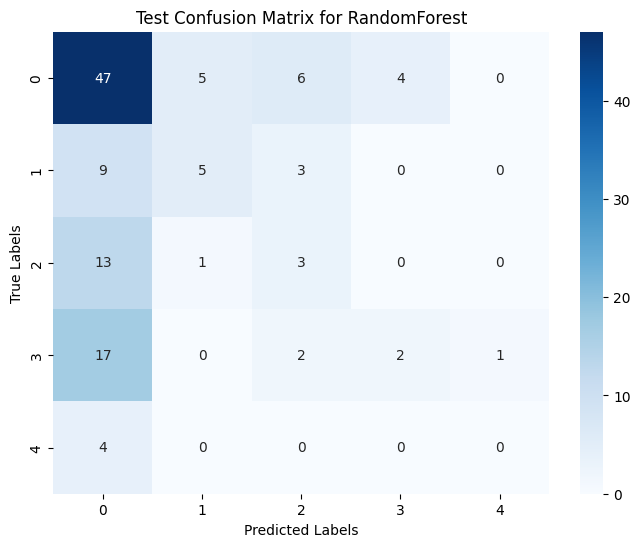


Evaluating LogisticRegression model with Cross-Validation:
Cross-Validation Accuracy: 0.438 ± 0.014
Cross-Validation Precision: 0.495 ± 0.020
Cross-Validation Recall: 0.438 ± 0.014
Cross-Validation F1-Score: 0.458 ± 0.004

Test Accuracy: 0.426
Test Precision: 0.520
Test Recall: 0.426
Test F1-Score: 0.457


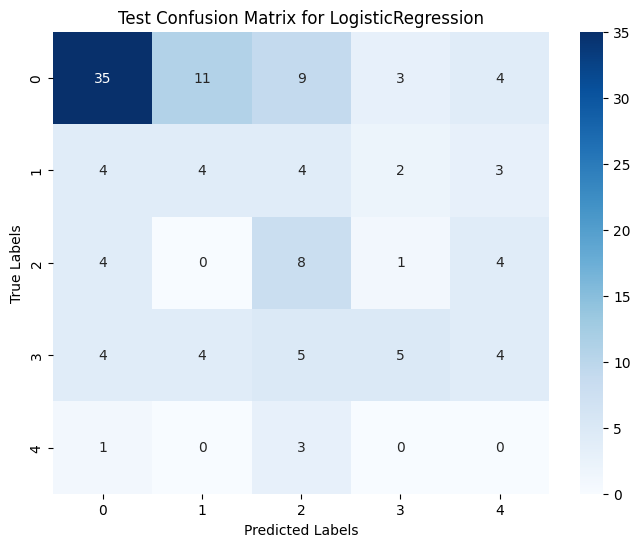


Evaluating KNeighbors model with Cross-Validation:
Cross-Validation Accuracy: 0.498 ± 0.047
Cross-Validation Precision: 0.452 ± 0.070
Cross-Validation Recall: 0.498 ± 0.047
Cross-Validation F1-Score: 0.439 ± 0.042

Test Accuracy: 0.500
Test Precision: 0.408
Test Recall: 0.500
Test F1-Score: 0.426


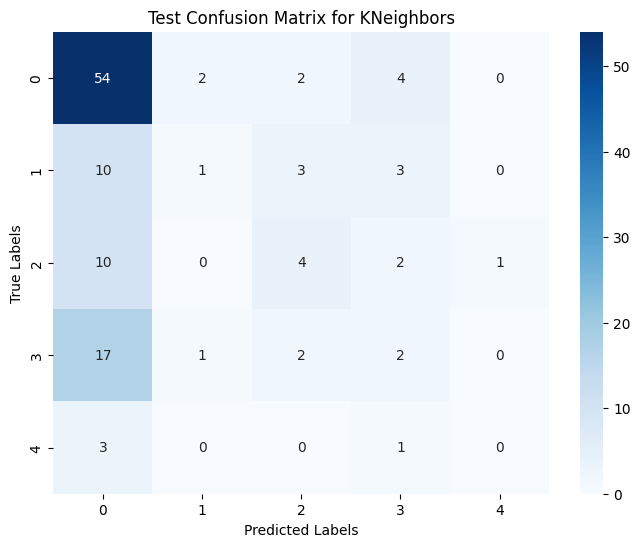


Evaluating NaiveBayes model with Cross-Validation:
Cross-Validation Accuracy: 0.526 ± 0.013
Cross-Validation Precision: 0.417 ± 0.054
Cross-Validation Recall: 0.526 ± 0.013
Cross-Validation F1-Score: 0.413 ± 0.021

Test Accuracy: 0.566
Test Precision: 0.565
Test Recall: 0.566
Test F1-Score: 0.466


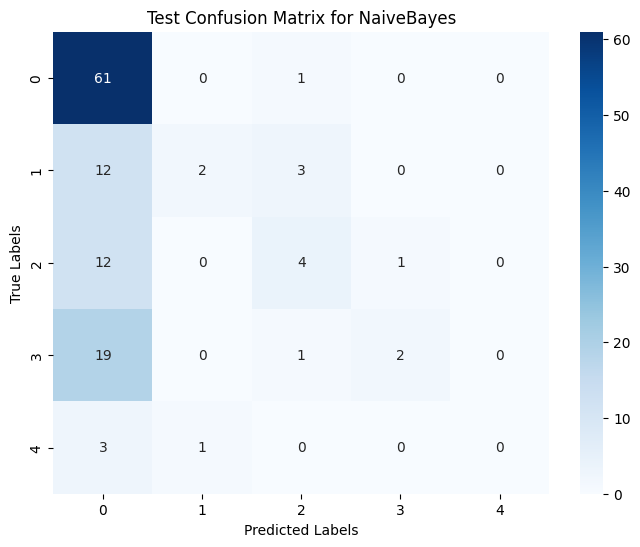


Evaluating DecisionTree model with Cross-Validation:
Cross-Validation Accuracy: 0.412 ± 0.033
Cross-Validation Precision: 0.426 ± 0.026
Cross-Validation Recall: 0.412 ± 0.033
Cross-Validation F1-Score: 0.415 ± 0.027

Test Accuracy: 0.418
Test Precision: 0.438
Test Recall: 0.418
Test F1-Score: 0.426


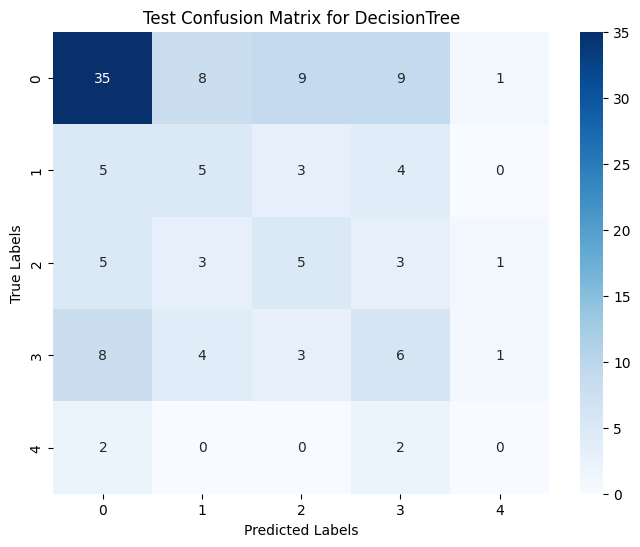


Evaluating GradientBoosting model with Cross-Validation:
Cross-Validation Accuracy: 0.498 ± 0.017
Cross-Validation Precision: 0.452 ± 0.015
Cross-Validation Recall: 0.498 ± 0.017
Cross-Validation F1-Score: 0.464 ± 0.019

Test Accuracy: 0.500
Test Precision: 0.472
Test Recall: 0.500
Test F1-Score: 0.481


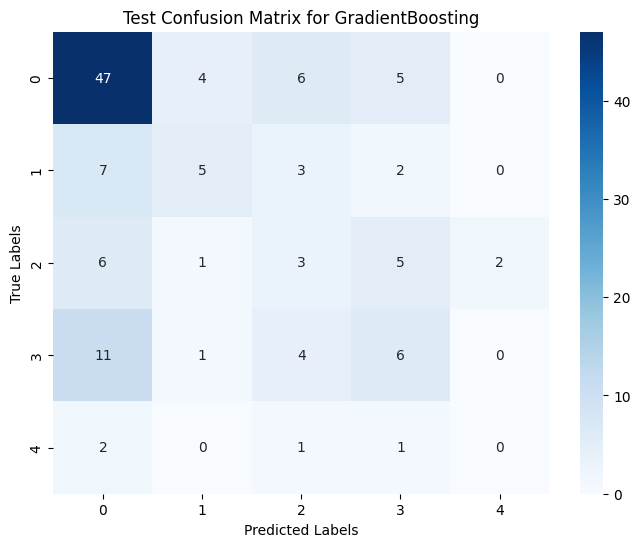


Evaluating AdaBoost model with Cross-Validation:
Cross-Validation Accuracy: 0.526 ± 0.045
Cross-Validation Precision: 0.463 ± 0.038
Cross-Validation Recall: 0.526 ± 0.045
Cross-Validation F1-Score: 0.479 ± 0.039

Test Accuracy: 0.557
Test Precision: 0.465
Test Recall: 0.557
Test F1-Score: 0.484


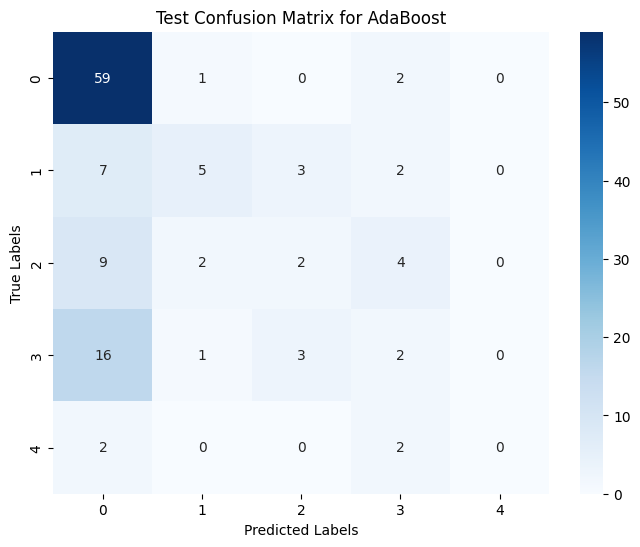


Evaluating Bagging model with Cross-Validation:
Cross-Validation Accuracy: 0.465 ± 0.017
Cross-Validation Precision: 0.413 ± 0.019
Cross-Validation Recall: 0.465 ± 0.017
Cross-Validation F1-Score: 0.431 ± 0.015

Test Accuracy: 0.500
Test Precision: 0.458
Test Recall: 0.500
Test F1-Score: 0.475


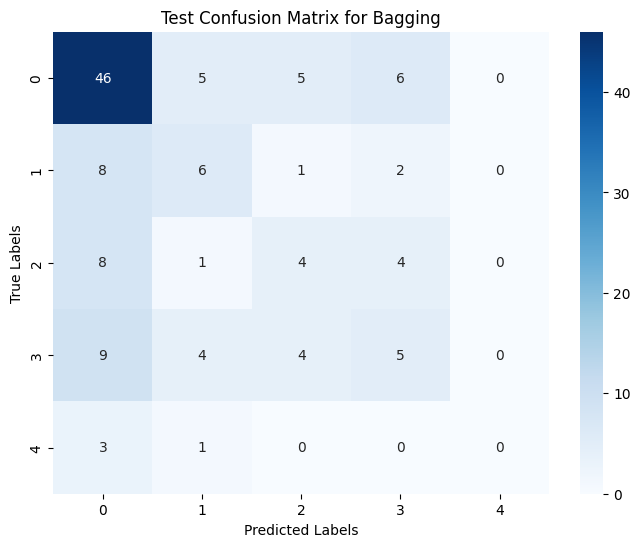

In [ ]:
# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model with Cross-Validation:")

    # Perform cross-validation and calculate metrics
    scoring = {
        "accuracy": make_scorer(accuracy_score),
        "precision": make_scorer(precision_score, average="weighted"),
        "recall": make_scorer(recall_score, average="weighted"),
        "f1": make_scorer(f1_score, average="weighted")
    }
    cv_results = cross_validate(pipeline, X_train, y_train, cv=cv, scoring=scoring, n_jobs=-1)

    # Calculate mean and standard deviation of metrics
    mean_accuracy = cv_results["test_accuracy"].mean()
    std_accuracy = cv_results["test_accuracy"].std()
    mean_precision = cv_results["test_precision"].mean()
    std_precision = cv_results["test_precision"].std()
    mean_recall = cv_results["test_recall"].mean()
    std_recall = cv_results["test_recall"].std()
    mean_f1 = cv_results["test_f1"].mean()
    std_f1 = cv_results["test_f1"].std()

    print(f"Cross-Validation Accuracy: {mean_accuracy:.3f} ± {std_accuracy:.3f}")
    print(f"Cross-Validation Precision: {mean_precision:.3f} ± {std_precision:.3f}")
    print(f"Cross-Validation Recall: {mean_recall:.3f} ± {std_recall:.3f}")
    print(f"Cross-Validation F1-Score: {mean_f1:.3f} ± {std_f1:.3f}")

    # Fit the pipeline on the entire training set
    pipeline.fit(X_train, y_train)

    # Evaluate on the test set
    y_test_pred = pipeline.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred, average="weighted")
    test_recall = recall_score(y_test, y_test_pred, average="weighted")
    test_f1 = f1_score(y_test, y_test_pred, average="weighted")

    print(f"\nTest Accuracy: {test_accuracy:.3f}")
    print(f"Test Precision: {test_precision:.3f}")
    print(f"Test Recall: {test_recall:.3f}")
    print(f"Test F1-Score: {test_f1:.3f}")

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()


In [ ]:
results_st=[]
 # Append results
results_st.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy_st,
        "Train Precision": train_precision_st,
        "Train Recall": train_recall_st,
        "Train F1": train_f1_st,
        "Validation Accuracy": val_accuracy_st,
        "Validation Precision": val_precision_st,
        "Validation Recall": val_recall_st,
        "Validation F1": val_f1_st,
        "Test Accuracy": test_accuracy_st,
        "Test Precision": test_precision_st,
        "Test Recall": test_recall_st,
        "Test F1": test_f1_st
    })

# Create a DataFrame from results
results_st_df = pd.DataFrame(results_st)

# Display results
print("\nModel Performance Metrics (ST):")
print(results_st_df)

# Find the best model based on Validation F1 score
best_model_st = results_st_df.sort_values(by="Validation F1", ascending=False).iloc[0]
print("\nBest Model (ST):")
print(best_model_st)


Model Performance Metrics (ST):
     Model  Train Accuracy  Train Precision  Train Recall  Train F1  \
0  Bagging        0.871479         0.872426      0.871479  0.870695   

   Validation Accuracy  Validation Precision  Validation Recall  \
0             0.467213                0.4379           0.467213   

   Validation F1  Test Accuracy  Test Precision  Test Recall   Test F1  
0       0.450252            0.5        0.457937          0.5  0.475158  

Best Model (ST):
Model                    Bagging
Train Accuracy          0.871479
Train Precision         0.872426
Train Recall            0.871479
Train F1                0.870695
Validation Accuracy     0.467213
Validation Precision      0.4379
Validation Recall       0.467213
Validation F1           0.450252
Test Accuracy                0.5
Test Precision          0.457937
Test Recall                  0.5
Test F1                 0.475158
Name: 0, dtype: object


### **Hyperparameter Tuning- Sentence Transformer**


Hyperparameter tuning and evaluating SVM model:
Best parameters for SVM: {'classifier__C': 1, 'classifier__gamma': 'scale', 'classifier__kernel': 'rbf'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.87      0.80      0.84       285
           1       0.72      0.79      0.75        80
           2       0.76      0.86      0.81        81
           3       0.78      0.75      0.77       102
           4       0.69      1.00      0.82        20

    accuracy                           0.81       568
   macro avg       0.77      0.84      0.80       568
weighted avg       0.81      0.81      0.81       568



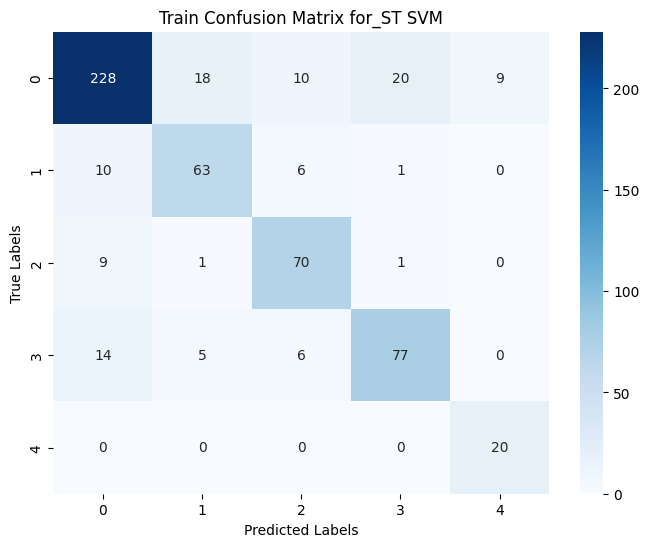

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.56      0.58        61
           1       0.35      0.35      0.35        17
           2       0.20      0.18      0.19        17
           3       0.28      0.36      0.31        22
           4       0.20      0.20      0.20         5

    accuracy                           0.43       122
   macro avg       0.33      0.33      0.33       122
weighted avg       0.44      0.43      0.43       122



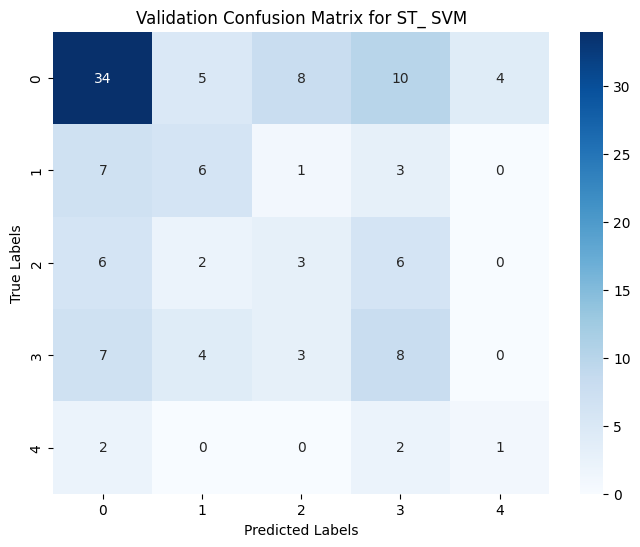

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.68      0.66      0.67        62
           1       0.31      0.24      0.27        17
           2       0.22      0.29      0.25        17
           3       0.35      0.36      0.36        22
           4       0.00      0.00      0.00         4

    accuracy                           0.48       122
   macro avg       0.31      0.31      0.31       122
weighted avg       0.48      0.48      0.48       122



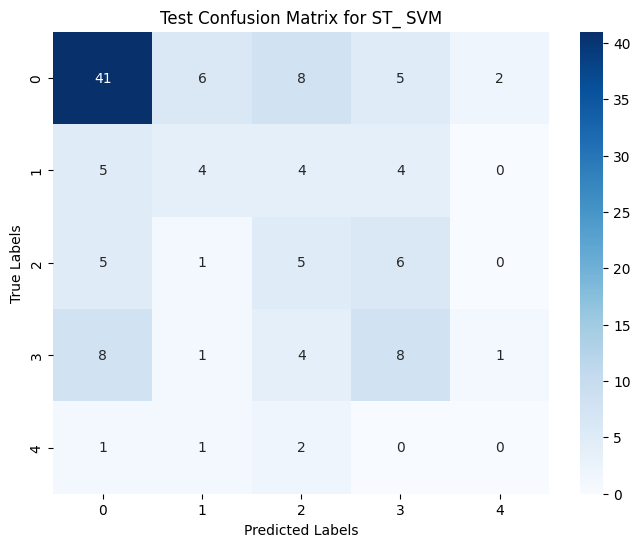


Hyperparameter tuning and evaluating RandomForest model:
Best parameters for RandomForest: {'classifier__max_depth': 10, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 100}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.96      0.81      0.88       285
           1       0.78      0.93      0.85        80
           2       0.78      0.96      0.86        81
           3       0.86      0.89      0.88       102
           4       0.74      1.00      0.85        20

    accuracy                           0.87       568
   macro avg       0.82      0.92      0.86       568
weighted avg       0.88      0.87      0.87       568



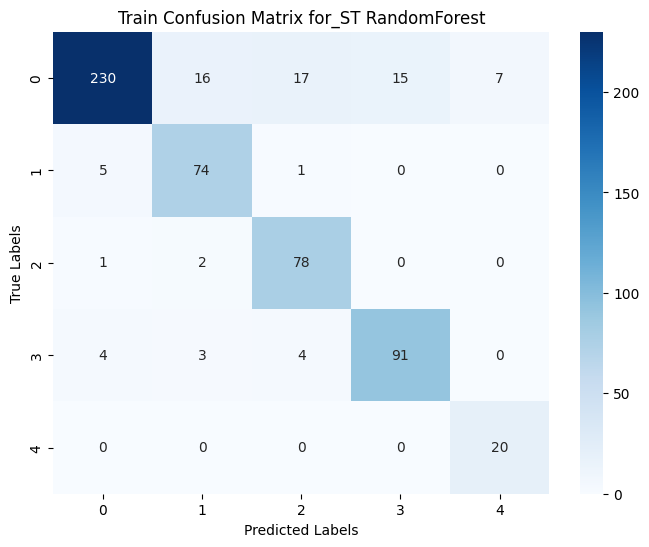

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.51      0.59      0.55        61
           1       0.33      0.24      0.28        17
           2       0.21      0.18      0.19        17
           3       0.23      0.23      0.23        22
           4       0.00      0.00      0.00         5

    accuracy                           0.39       122
   macro avg       0.26      0.25      0.25       122
weighted avg       0.37      0.39      0.38       122



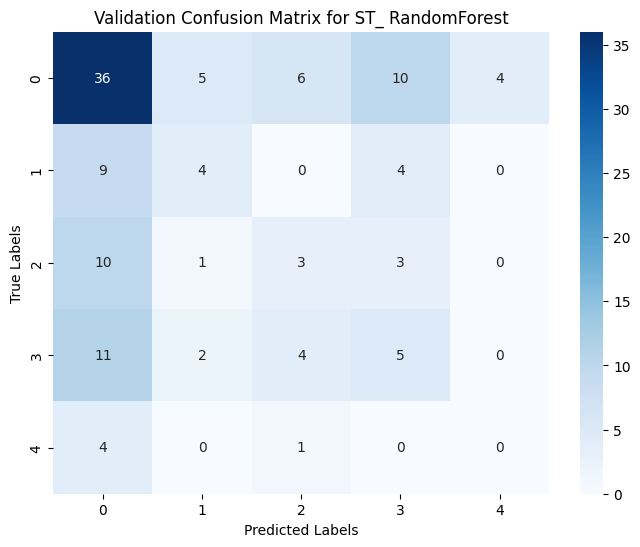

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.69      0.65        62
           1       0.43      0.35      0.39        17
           2       0.39      0.41      0.40        17
           3       0.50      0.41      0.45        22
           4       0.00      0.00      0.00         4

    accuracy                           0.53       122
   macro avg       0.38      0.37      0.38       122
weighted avg       0.51      0.53      0.52       122



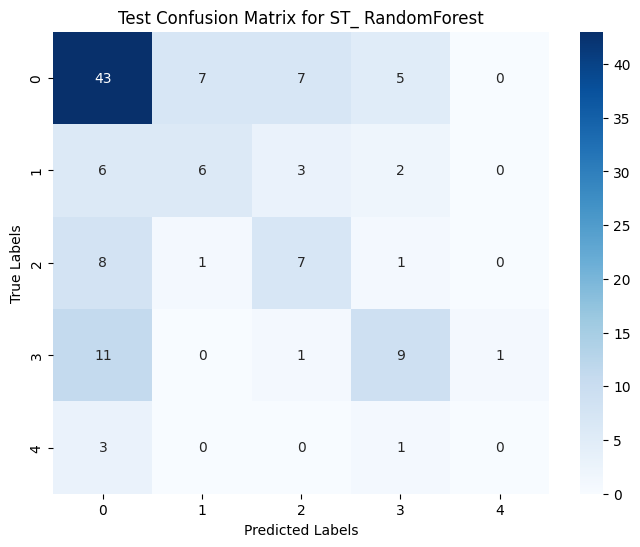


Hyperparameter tuning and evaluating LogisticRegression model:
Best parameters for LogisticRegression: {'classifier__C': 1, 'classifier__solver': 'liblinear'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.76      0.88      0.82       285
           1       0.71      0.42      0.53        80
           2       0.64      0.54      0.59        81
           3       0.64      0.53      0.58       102
           4       0.45      0.75      0.57        20

    accuracy                           0.70       568
   macro avg       0.64      0.63      0.62       568
weighted avg       0.70      0.70      0.69       568



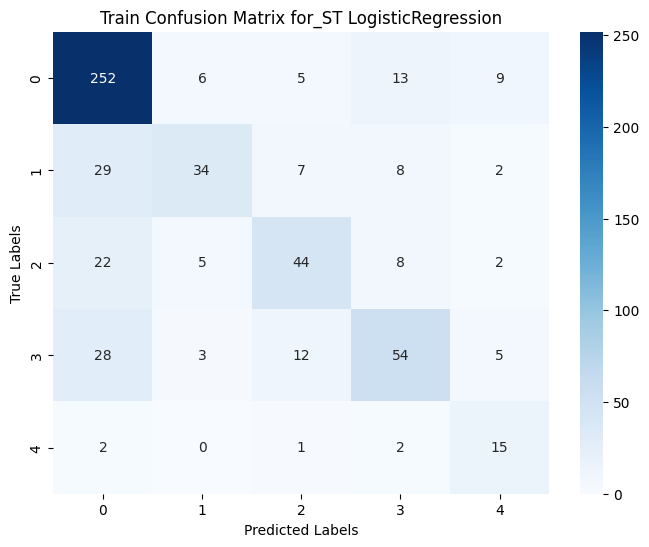

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.66      0.75      0.70        61
           1       0.50      0.24      0.32        17
           2       0.36      0.24      0.29        17
           3       0.35      0.41      0.38        22
           4       0.14      0.20      0.17         5

    accuracy                           0.52       122
   macro avg       0.40      0.37      0.37       122
weighted avg       0.52      0.52      0.51       122



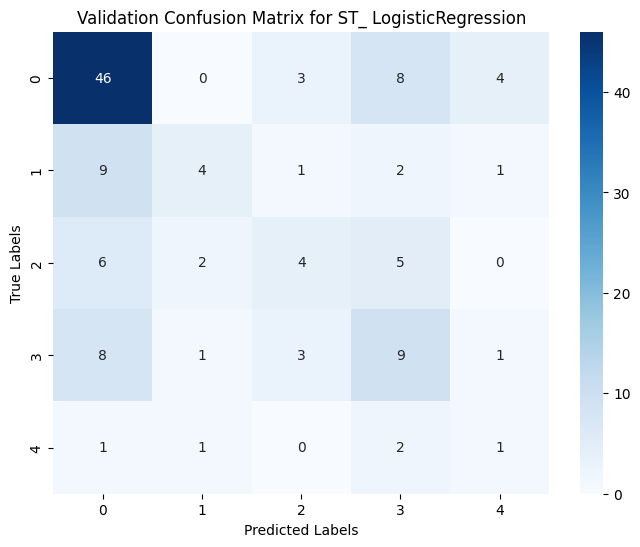

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.70      0.81      0.75        62
           1       0.44      0.24      0.31        17
           2       0.33      0.41      0.37        17
           3       0.58      0.32      0.41        22
           4       0.00      0.00      0.00         4

    accuracy                           0.56       122
   macro avg       0.41      0.35      0.37       122
weighted avg       0.57      0.56      0.55       122



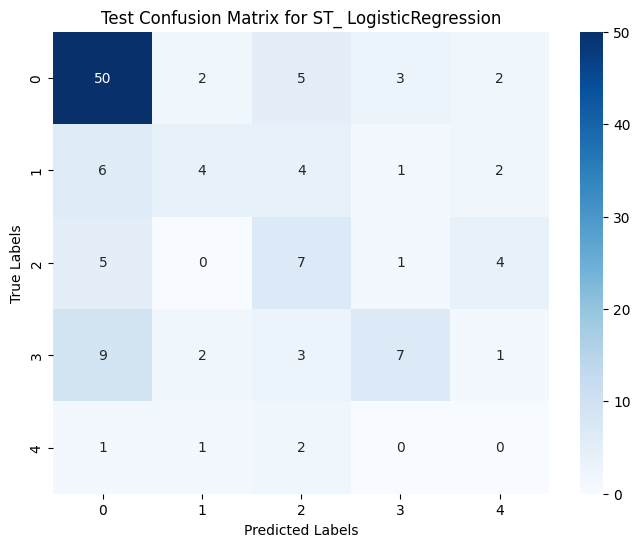


Hyperparameter tuning and evaluating KNeighbors model:
Best parameters for KNeighbors: {'classifier__n_neighbors': 10, 'classifier__weights': 'uniform'}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.95      0.74       285
           1       0.44      0.26      0.33        80
           2       0.60      0.26      0.36        81
           3       0.47      0.21      0.29       102
           4       0.00      0.00      0.00        20

    accuracy                           0.59       568
   macro avg       0.42      0.34      0.34       568
weighted avg       0.54      0.59      0.52       568



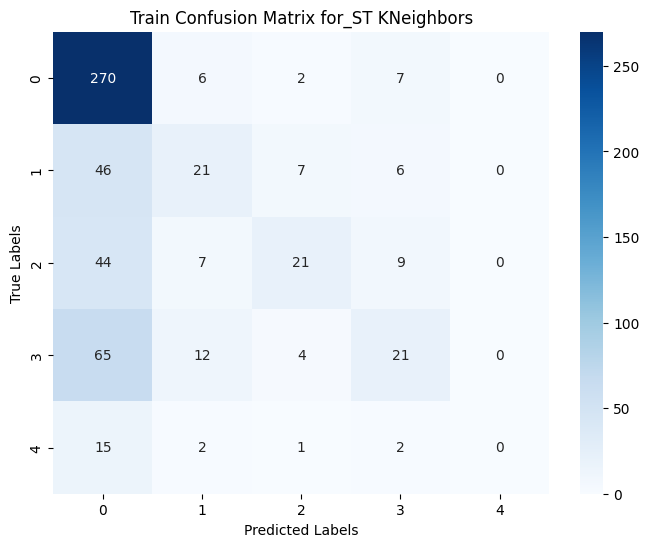

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.60      0.95      0.73        61
           1       0.57      0.24      0.33        17
           2       0.25      0.06      0.10        17
           3       0.31      0.18      0.23        22
           4       0.00      0.00      0.00         5

    accuracy                           0.55       122
   macro avg       0.35      0.29      0.28       122
weighted avg       0.47      0.55      0.47       122



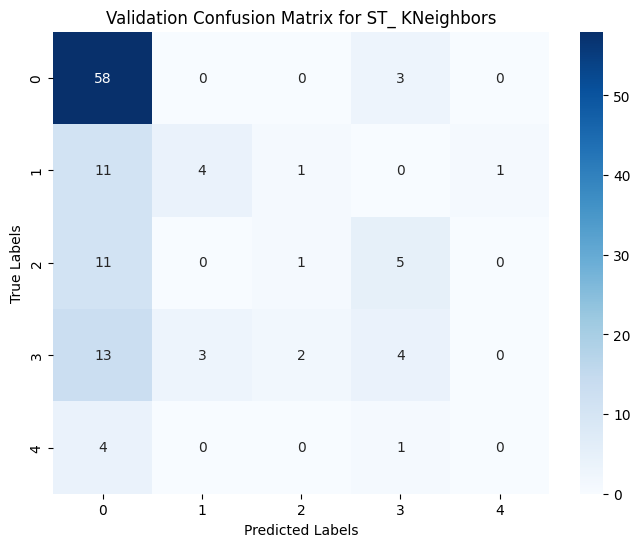

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.55      0.90      0.68        62
           1       0.25      0.06      0.10        17
           2       0.33      0.12      0.17        17
           3       0.22      0.09      0.13        22
           4       0.00      0.00      0.00         4

    accuracy                           0.50       122
   macro avg       0.27      0.23      0.22       122
weighted avg       0.40      0.50      0.41       122



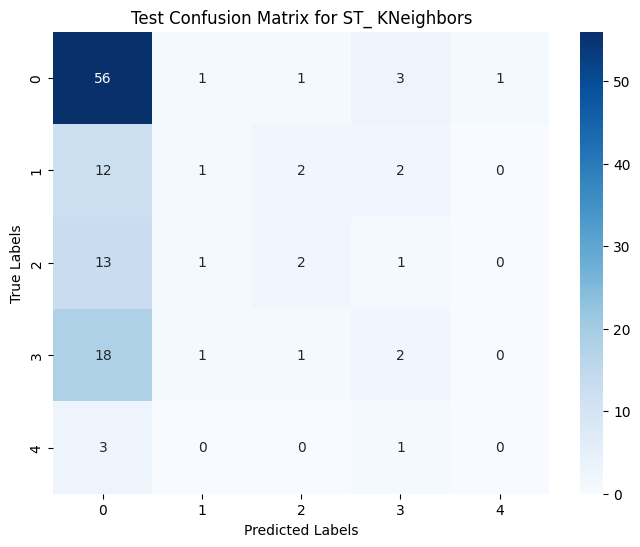


Hyperparameter tuning and evaluating NaiveBayes model:
Best parameters for NaiveBayes: {'classifier__alpha': 0.1}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.59      0.98      0.74       285
           1       0.56      0.23      0.32        80
           2       0.64      0.28      0.39        81
           3       0.62      0.18      0.27       102
           4       0.00      0.00      0.00        20

    accuracy                           0.60       568
   macro avg       0.48      0.33      0.35       568
weighted avg       0.58      0.60      0.52       568



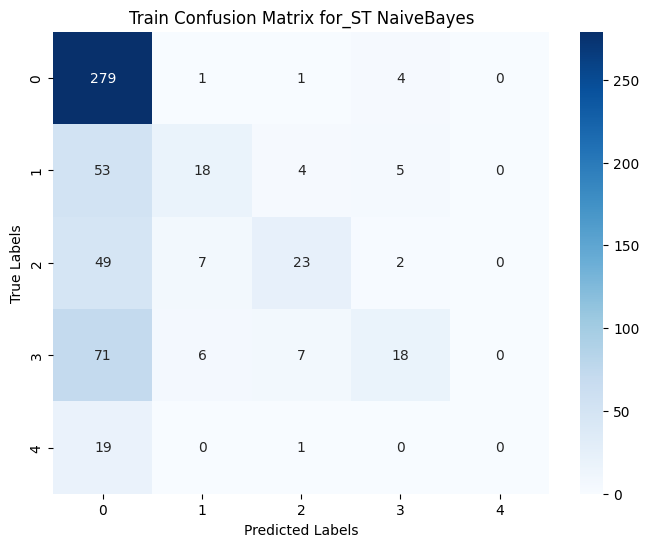

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.57      0.97      0.72        61
           1       0.43      0.18      0.25        17
           2       0.33      0.06      0.10        17
           3       0.62      0.23      0.33        22
           4       0.00      0.00      0.00         5

    accuracy                           0.56       122
   macro avg       0.39      0.29      0.28       122
weighted avg       0.50      0.56      0.47       122



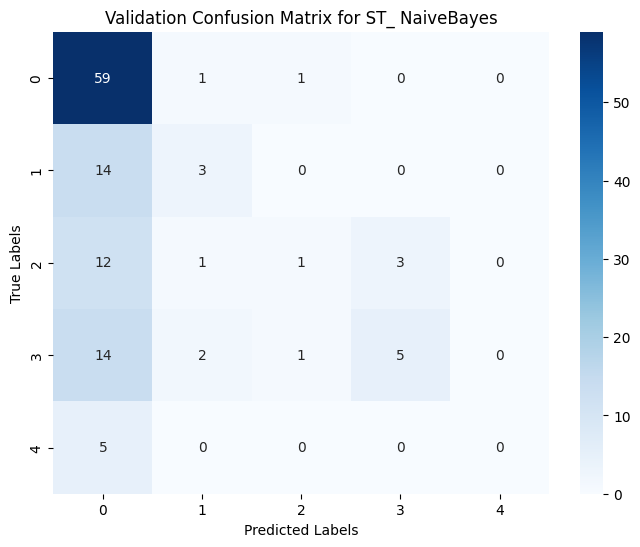

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.58      0.98      0.73        62
           1       0.67      0.12      0.20        17
           2       0.44      0.24      0.31        17
           3       0.50      0.09      0.15        22
           4       0.00      0.00      0.00         4

    accuracy                           0.57       122
   macro avg       0.44      0.29      0.28       122
weighted avg       0.54      0.57      0.47       122



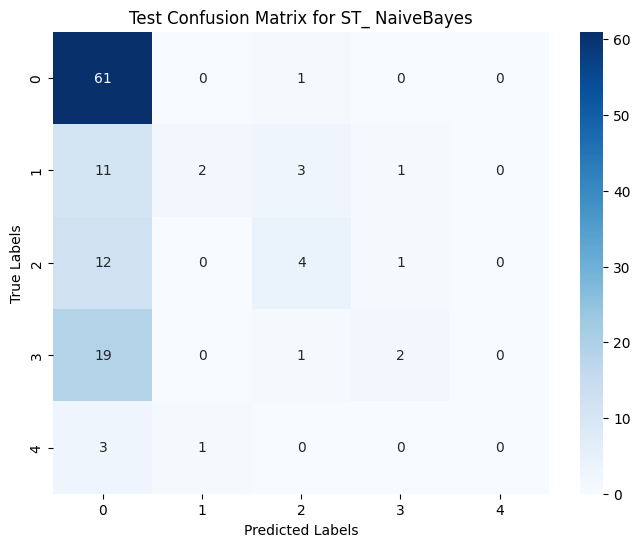


Hyperparameter tuning and evaluating DecisionTree model:
Best parameters for DecisionTree: {'classifier__max_depth': 10, 'classifier__min_samples_split': 2}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.94      0.62      0.75       285
           1       0.47      0.97      0.63        80
           2       0.77      0.91      0.84        81
           3       0.89      0.77      0.83       102
           4       0.74      1.00      0.85        20

    accuracy                           0.76       568
   macro avg       0.76      0.86      0.78       568
weighted avg       0.83      0.76      0.76       568



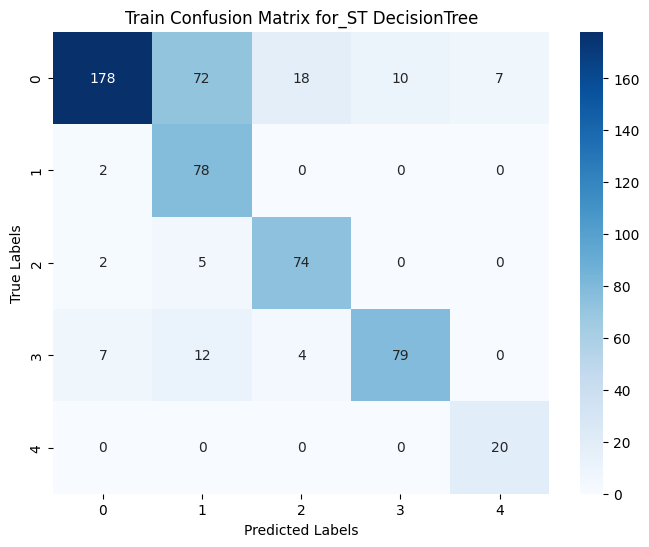

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.50      0.38      0.43        61
           1       0.27      0.59      0.37        17
           2       0.18      0.18      0.18        17
           3       0.18      0.14      0.15        22
           4       0.00      0.00      0.00         5

    accuracy                           0.32       122
   macro avg       0.22      0.26      0.23       122
weighted avg       0.34      0.32      0.32       122



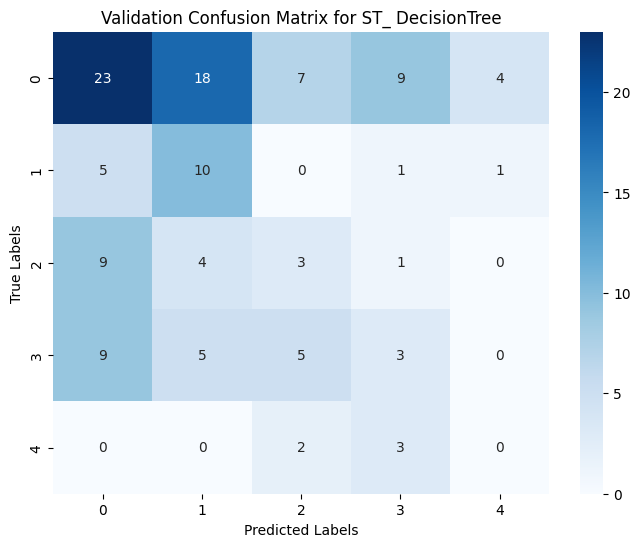

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.50      0.55        62
           1       0.16      0.29      0.21        17
           2       0.28      0.29      0.29        17
           3       0.31      0.23      0.26        22
           4       0.00      0.00      0.00         4

    accuracy                           0.38       122
   macro avg       0.27      0.26      0.26       122
weighted avg       0.43      0.38      0.40       122



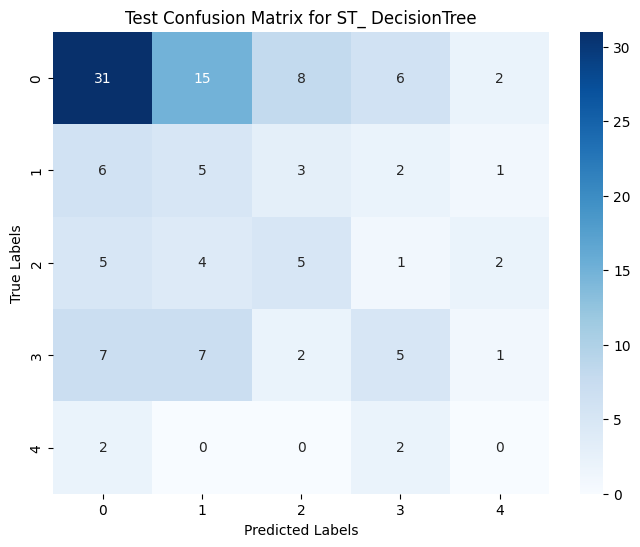


Hyperparameter tuning and evaluating AdaBoost model:
Best parameters for AdaBoost: {'classifier__learning_rate': 0.1, 'classifier__n_estimators': 100}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.98      0.75       285
           1       0.42      0.19      0.26        80
           2       0.50      0.16      0.24        81
           3       0.41      0.20      0.26       102
           4       0.00      0.00      0.00        20

    accuracy                           0.57       568
   macro avg       0.39      0.30      0.30       568
weighted avg       0.51      0.57      0.49       568



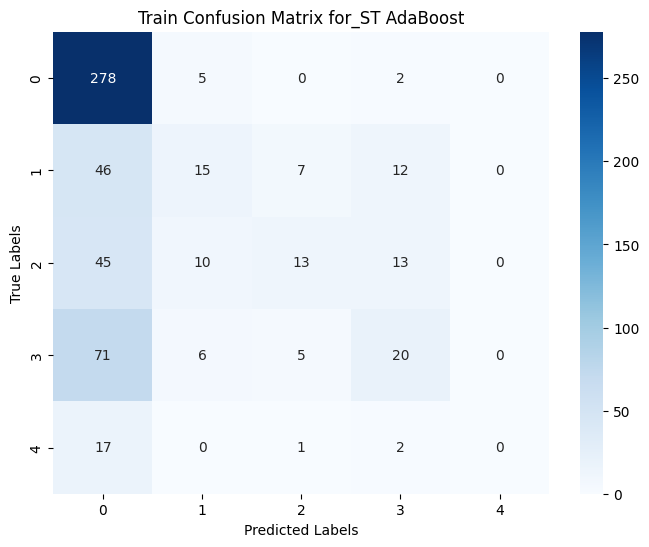

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.56      0.93      0.70        61
           1       0.22      0.12      0.15        17
           2       0.00      0.00      0.00        17
           3       0.50      0.23      0.31        22
           4       0.00      0.00      0.00         5

    accuracy                           0.52       122
   macro avg       0.26      0.26      0.23       122
weighted avg       0.40      0.52      0.43       122



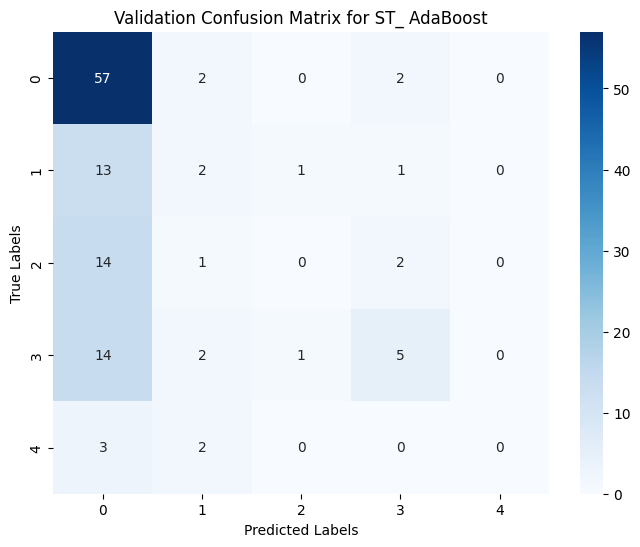

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.59      0.97      0.73        62
           1       0.50      0.12      0.19        17
           2       0.25      0.12      0.16        17
           3       0.25      0.09      0.13        22
           4       0.00      0.00      0.00         4

    accuracy                           0.54       122
   macro avg       0.32      0.26      0.24       122
weighted avg       0.45      0.54      0.44       122



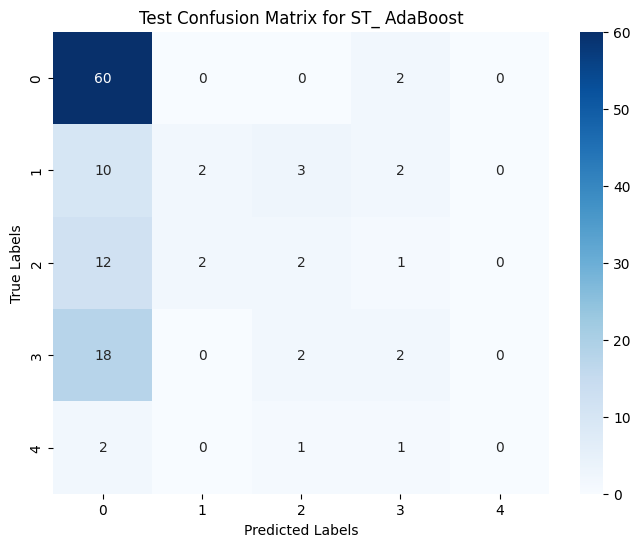


Hyperparameter tuning and evaluating Bagging model:
Best parameters for Bagging: {'classifier__max_samples': 0.5, 'classifier__n_estimators': 100}
Train Classification Report_ST:
              precision    recall  f1-score   support

           0       0.80      0.99      0.88       285
           1       0.98      0.68      0.80        80
           2       0.98      0.78      0.87        81
           3       0.96      0.76      0.85       102
           4       0.88      0.70      0.78        20

    accuracy                           0.86       568
   macro avg       0.92      0.78      0.84       568
weighted avg       0.88      0.86      0.86       568



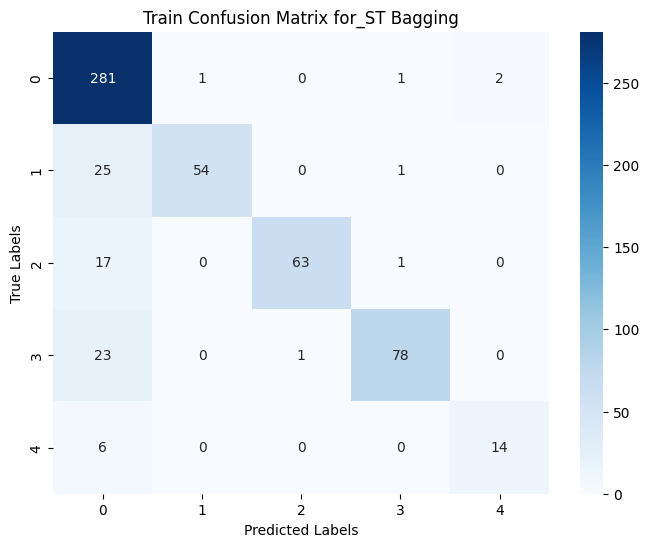

Validation Classification Report_ST:
              precision    recall  f1-score   support

           0       0.59      0.75      0.66        61
           1       0.45      0.29      0.36        17
           2       0.33      0.41      0.37        17
           3       0.22      0.09      0.13        22
           4       0.00      0.00      0.00         5

    accuracy                           0.49       122
   macro avg       0.32      0.31      0.30       122
weighted avg       0.44      0.49      0.46       122



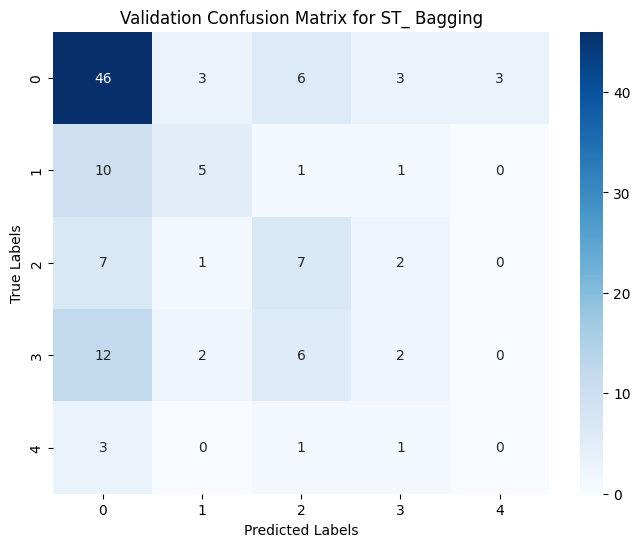

Test Classification Report_ST:
              precision    recall  f1-score   support

           0       0.61      0.82      0.70        62
           1       0.40      0.12      0.18        17
           2       0.30      0.35      0.32        17
           3       0.15      0.09      0.11        22
           4       0.00      0.00      0.00         4

    accuracy                           0.50       122
   macro avg       0.29      0.28      0.26       122
weighted avg       0.43      0.50      0.45       122



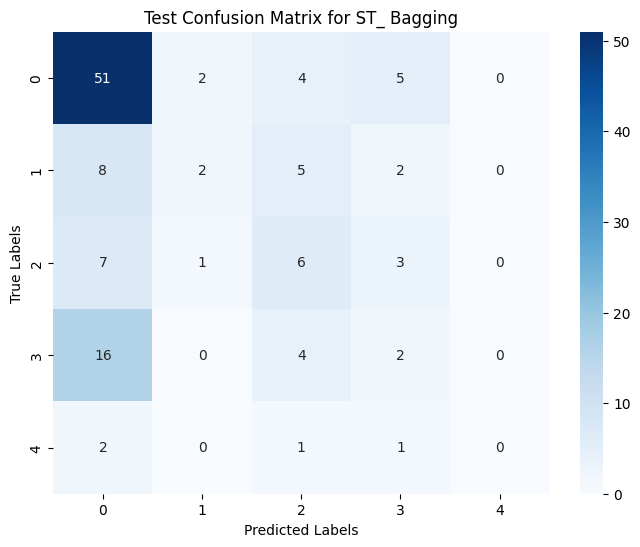

In [ ]:
# Define parameter grids for hyperparameter tuning
param_grids = {
    "SVM": {
        "classifier__C": [0.1, 1, 10, 100],
        "classifier__gamma": ["scale", "auto"],
        "classifier__kernel": ["linear", "rbf"]
    },
    "RandomForest": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
    "LogisticRegression": {
        "classifier__C": [0.1, 1, 10],
        "classifier__solver": ["liblinear", "lbfgs"]
    },
    "KNeighbors": {
        "classifier__n_neighbors": [3, 5, 7, 10],
        "classifier__weights": ["uniform", "distance"]
    },
    "NaiveBayes": {
        "classifier__alpha": [0.1, 0.5, 1.0]
    },
    "DecisionTree": {
        "classifier__max_depth": [None, 10, 20, 30],
        "classifier__min_samples_split": [2, 5, 10]
    },
  #  "GradientBoosting": {
   #     "classifier__n_estimators": [50, 100, 200],
    #    "classifier__learning_rate": [0.01, 0.1, 0.2],
     #   "classifier__max_depth": [3, 5, 7]
#    },
    "AdaBoost": {
        "classifier__n_estimators": [50, 100, 200],
        "classifier__learning_rate": [0.01, 0.1, 1.0]
    },
    "Bagging": {
        "classifier__n_estimators": [10, 50, 100],
        "classifier__max_samples": [0.5, 0.7, 1.0]
    }
}

# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
#    "GradientBoosting": Pipeline([
 #       ("classifier", GradientBoostingClassifier(random_state=1))
  #  ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

results = []

# Perform hyperparameter tuning and evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nHyperparameter tuning and evaluating {model_name} model:")

    # Perform Grid Search
    grid_search = GridSearchCV(pipeline, param_grid=param_grids[model_name], cv=3, scoring="accuracy")
    grid_search.fit(X_train, y_train)

    # Best parameters
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

    # Predict on train data
    best_model = grid_search.best_estimator_

     # Predict on train data
    y_train_pred = best_model.predict(X_train)
    train_accuracy_st_tune = accuracy_score(y_train, y_train_pred)
    train_precision_st_tune = precision_score(y_train, y_train_pred, average="weighted")
    train_recall_st_tune = recall_score(y_train, y_train_pred, average="weighted")
    train_f1_st_tune = f1_score(y_train, y_train_pred, average="weighted")

    # Predict on validation data
    y_val_pred = best_model.predict(X_val)
    val_accuracy_st_tune = accuracy_score(y_val, y_val_pred)
    val_precision_st_tune = precision_score(y_val, y_val_pred, average="weighted")
    val_recall_st_tune = recall_score(y_val, y_val_pred, average="weighted")
    val_f1_st_tune = f1_score(y_val, y_val_pred, average="weighted")

    # Predict on test data
    y_test_pred = best_model.predict(X_test)
    test_accuracy_st_tune = accuracy_score(y_test, y_test_pred)
    test_precision_st_tune = precision_score(y_test, y_test_pred, average="weighted")
    test_recall_st_tune = recall_score(y_test, y_test_pred, average="weighted")
    test_f1_st_tune = f1_score(y_test, y_test_pred, average="weighted")


    print("Train Classification Report_ST:")
    print(classification_report(y_train, y_train_pred))
    train_report = classification_report(y_train, y_train_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for train data
    cm_train = confusion_matrix(y_train, y_train_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_train, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_train), yticklabels=set(y_train))
    plt.title(f"Train Confusion Matrix for_ST {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on validation data
    print("Validation Classification Report_ST:")
    print(classification_report(y_val, y_val_pred))
    val_report = classification_report(y_val, y_val_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for validation data
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    # Predict on test data
    print("Test Classification Report_ST:")
    print(classification_report(y_test, y_test_pred))
    test_report = classification_report(y_test, y_test_pred, output_dict=True,zero_division=0)

    # Confusion Matrix for test data
    cm_test = confusion_matrix(y_test, y_test_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_test), yticklabels=set(y_test))
    plt.title(f"Test Confusion Matrix for ST_ {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()

    for report, phase in [(train_report, "Train"), (val_report, "Validation"), (test_report, "Test")]:
      for level in range(0,5):
        level = str(level)
        results.append({"Model": model_name,
                          "Phase": phase,
                          "Level": level,
                          "Precision": report[level]["precision"],
                          "Recall": report[level]["recall"],
                          "F1-Score": report[level]["f1-score"],
                          "Support": report[level]["support"]})

In [ ]:
results_df_tuned = pd.DataFrame(results)
print(results_df_tuned)
results_df_tuned.to_csv('/content/drive/MyDrive/AIML-Git/Capstone project/results_st_paraphrasing_potential_accident_level.csv', index=False)

       Model  Phase Level  Precision    Recall  F1-Score  Support
0        SVM  Train     0   0.873563  0.800000  0.835165    285.0
1        SVM  Train     1   0.724138  0.787500  0.754491     80.0
2        SVM  Train     2   0.760870  0.864198  0.809249     81.0
3        SVM  Train     3   0.777778  0.754902  0.766169    102.0
4        SVM  Train     4   0.689655  1.000000  0.816327     20.0
..       ...    ...   ...        ...       ...       ...      ...
115  Bagging   Test     0   0.607143  0.822581  0.698630     62.0
116  Bagging   Test     1   0.400000  0.117647  0.181818     17.0
117  Bagging   Test     2   0.300000  0.352941  0.324324     17.0
118  Bagging   Test     3   0.153846  0.090909  0.114286     22.0
119  Bagging   Test     4   0.000000  0.000000  0.000000      4.0

[120 rows x 7 columns]


### **Cross validation results**


Evaluating SVM model:
Accuracy: 0.486 ± 0.024
Precision: 0.492 ± 0.008
Recall: 0.486 ± 0.024
F1-Score: 0.486 ± 0.014
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.56      0.58        61
           1       0.35      0.35      0.35        17
           2       0.20      0.18      0.19        17
           3       0.28      0.36      0.31        22
           4       0.20      0.20      0.20         5

    accuracy                           0.43       122
   macro avg       0.33      0.33      0.33       122
weighted avg       0.44      0.43      0.43       122



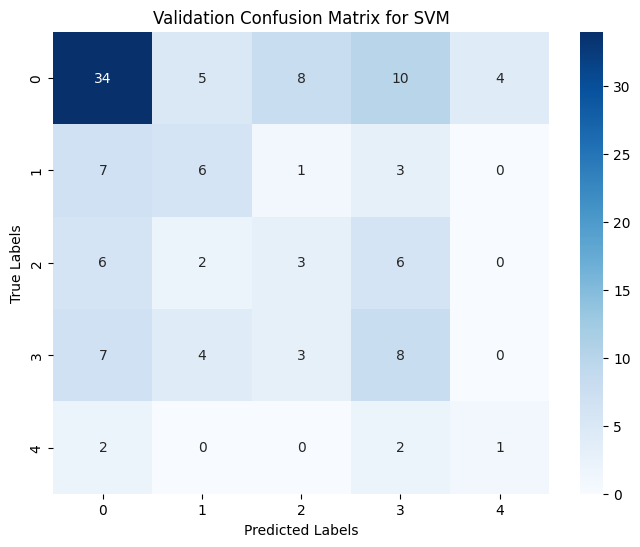


Evaluating RandomForest model:
Accuracy: 0.440 ± 0.040
Precision: 0.365 ± 0.074
Recall: 0.440 ± 0.040
F1-Score: 0.372 ± 0.044
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.62      0.51        61
           1       0.18      0.12      0.14        17
           2       0.12      0.06      0.08        17
           3       0.09      0.05      0.06        22
           4       0.00      0.00      0.00         5

    accuracy                           0.34       122
   macro avg       0.17      0.17      0.16       122
weighted avg       0.28      0.34      0.30       122



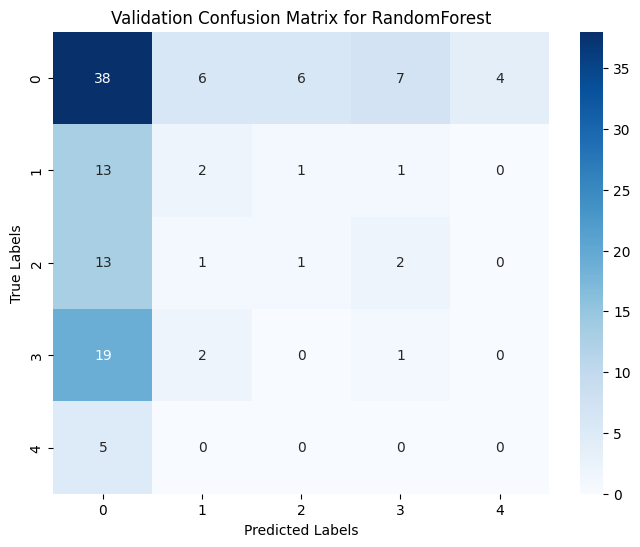


Evaluating LogisticRegression model:
Accuracy: 0.438 ± 0.014
Precision: 0.495 ± 0.020
Recall: 0.438 ± 0.014
F1-Score: 0.458 ± 0.004
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.52      0.60        61
           1       0.40      0.47      0.43        17
           2       0.31      0.29      0.30        17
           3       0.24      0.32      0.27        22
           4       0.09      0.20      0.12         5

    accuracy                           0.43       122
   macro avg       0.35      0.36      0.35       122
weighted avg       0.49      0.43      0.46       122



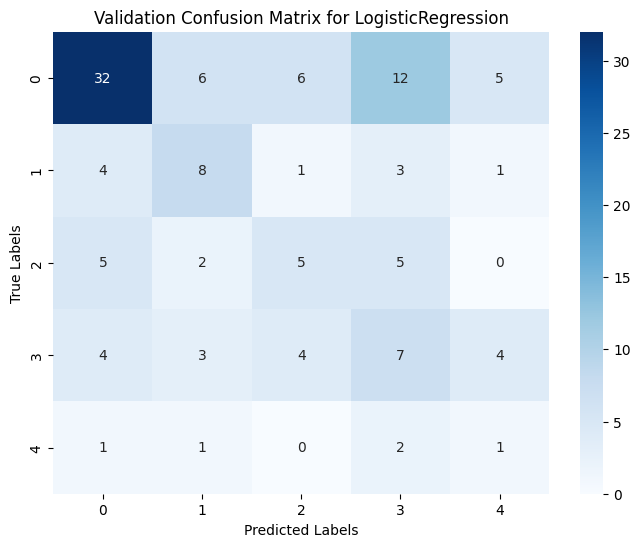


Evaluating KNeighbors model:
Accuracy: 0.495 ± 0.042
Precision: 0.448 ± 0.066
Recall: 0.495 ± 0.042
F1-Score: 0.437 ± 0.037
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.84      0.67        61
           1       0.30      0.18      0.22        17
           2       0.14      0.06      0.08        17
           3       0.36      0.18      0.24        22
           4       0.00      0.00      0.00         5

    accuracy                           0.48       122
   macro avg       0.27      0.25      0.24       122
weighted avg       0.40      0.48      0.42       122



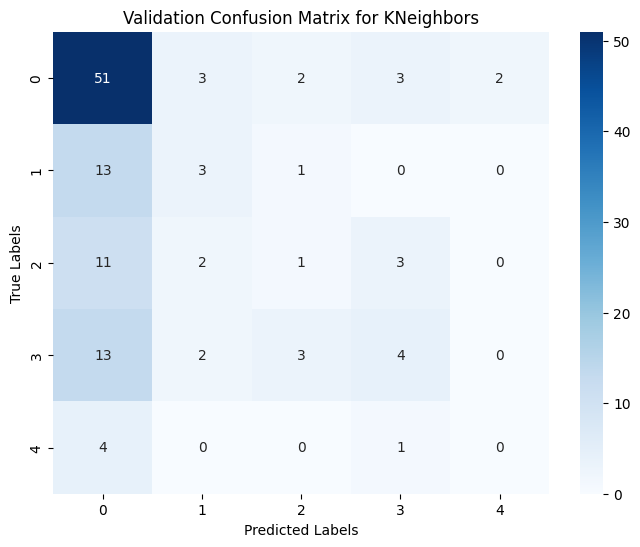


Evaluating NaiveBayes model:
Accuracy: 0.526 ± 0.013
Precision: 0.417 ± 0.054
Recall: 0.526 ± 0.013
F1-Score: 0.413 ± 0.021
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.57      0.98      0.72        61
           1       0.50      0.18      0.26        17
           2       0.33      0.06      0.10        17
           3       0.62      0.23      0.33        22
           4       0.00      0.00      0.00         5

    accuracy                           0.57       122
   macro avg       0.41      0.29      0.28       122
weighted avg       0.51      0.57      0.47       122



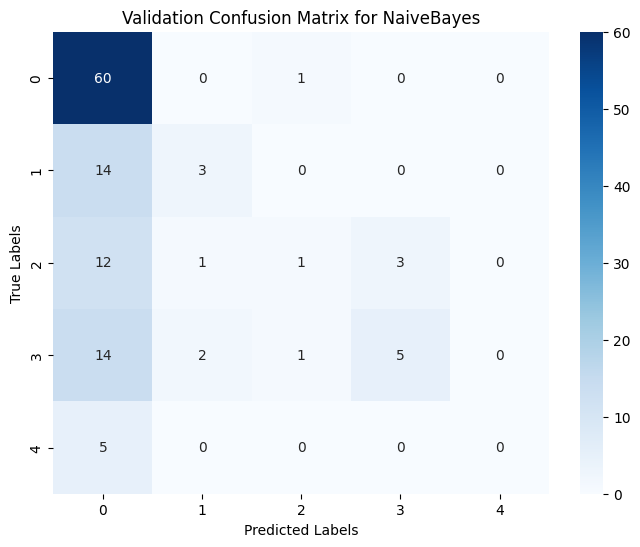


Evaluating DecisionTree model:
Accuracy: 0.412 ± 0.033
Precision: 0.426 ± 0.026
Recall: 0.412 ± 0.033
F1-Score: 0.415 ± 0.027
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.56      0.41      0.47        61
           1       0.35      0.47      0.40        17
           2       0.09      0.12      0.10        17
           3       0.11      0.14      0.12        22
           4       0.00      0.00      0.00         5

    accuracy                           0.31       122
   macro avg       0.22      0.23      0.22       122
weighted avg       0.36      0.31      0.33       122



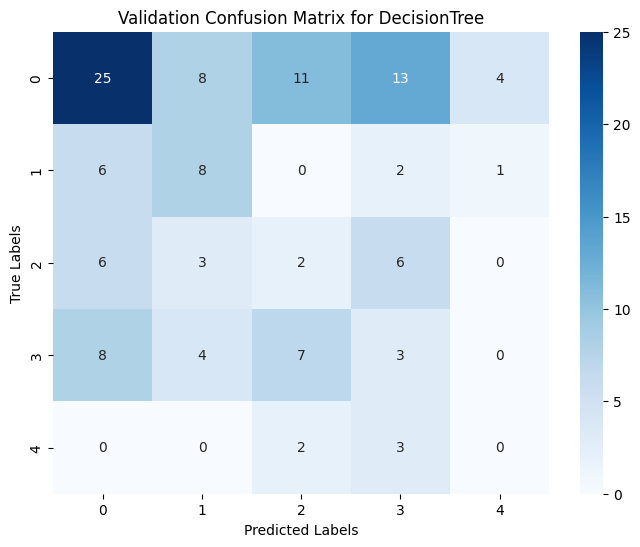


Evaluating AdaBoost model:
Accuracy: 0.526 ± 0.045
Precision: 0.463 ± 0.038
Recall: 0.526 ± 0.045
F1-Score: 0.479 ± 0.039
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.87      0.72        61
           1       0.27      0.18      0.21        17
           2       0.33      0.12      0.17        17
           3       0.28      0.23      0.25        22
           4       0.00      0.00      0.00         5

    accuracy                           0.52       122
   macro avg       0.30      0.28      0.27       122
weighted avg       0.44      0.52      0.46       122



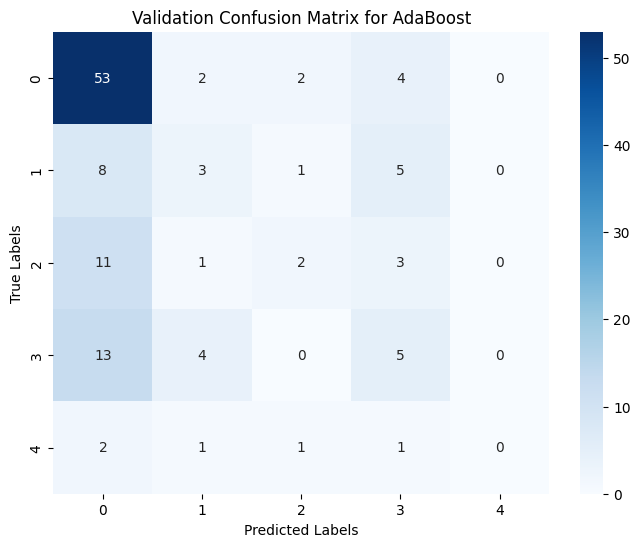


Evaluating Bagging model:
Accuracy: 0.465 ± 0.017
Precision: 0.413 ± 0.019
Recall: 0.465 ± 0.017
F1-Score: 0.431 ± 0.015
Validation Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.69      0.65        61
           1       0.32      0.35      0.33        17
           2       0.40      0.35      0.38        17
           3       0.19      0.14      0.16        22
           4       0.00      0.00      0.00         5

    accuracy                           0.47       122
   macro avg       0.30      0.31      0.30       122
weighted avg       0.44      0.47      0.45       122



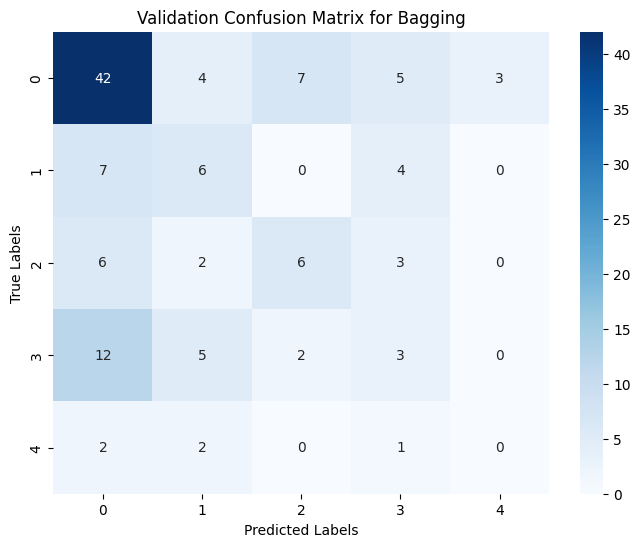

In [ ]:
# Define pipelines for each model
pipelines = {
    "SVM": Pipeline([
        ("classifier", SVC(class_weight="balanced", random_state=1))
    ]),
    "RandomForest": Pipeline([
        ("classifier", RandomForestClassifier(class_weight="balanced", random_state=1))
    ]),
    "LogisticRegression": Pipeline([
        ("classifier", LogisticRegression(class_weight="balanced", random_state=1))
    ]),
    "KNeighbors": Pipeline([
        ("classifier", KNeighborsClassifier())
    ]),
    "NaiveBayes": Pipeline([
        ("scaler", MinMaxScaler()),  # Ensure non-negative values
        ("classifier", MultinomialNB())
    ]),
    "DecisionTree": Pipeline([
        ("classifier", DecisionTreeClassifier(class_weight="balanced", random_state=1))
    ]),
 #   "GradientBoosting": Pipeline([
 #       ("classifier", GradientBoostingClassifier(random_state=1))
 #   ]),
    "AdaBoost": Pipeline([
        ("classifier", AdaBoostClassifier(random_state=1))
    ]),
    "Bagging": Pipeline([
        ("classifier", BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=1))
    ])
}

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Perform evaluation for each pipeline
for model_name, pipeline in pipelines.items():
    print(f"\nEvaluating {model_name} model:")

    # Cross-validate accuracy
    accuracy_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(accuracy_score)
    )
    print(f"Accuracy: {np.mean(accuracy_scores):.3f} ± {np.std(accuracy_scores):.3f}")

    # Cross-validate precision
    precision_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(precision_score, average="weighted")
    )
    print(f"Precision: {np.mean(precision_scores):.3f} ± {np.std(precision_scores):.3f}")

    # Cross-validate recall
    recall_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(recall_score, average="weighted")
    )
    print(f"Recall: {np.mean(recall_scores):.3f} ± {np.std(recall_scores):.3f}")

    # Cross-validate F1-score
    f1_scores = cross_val_score(
        pipeline, X_train, y_train, cv=cv, scoring=make_scorer(f1_score, average="weighted")
    )
    print(f"F1-Score: {np.mean(f1_scores):.3f} ± {np.std(f1_scores):.3f}")

    # Fit the pipeline on the training data
    pipeline.fit(X_train, y_train)

    # Predict on the validation set
    y_val_pred = pipeline.predict(X_val)
    print("Validation Classification Report:")
    print(classification_report(y_val, y_val_pred))

    # Plot confusion matrix for validation set
    cm_val = confusion_matrix(y_val, y_val_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_val, annot=True, fmt="d", cmap="Blues", xticklabels=set(y_val), yticklabels=set(y_val))
    plt.title(f"Validation Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.show()


In [ ]:
results_st_tuned=[]
 # Append results
results_st_tuned.append({
        "Model": model_name,
        "Train Accuracy": train_accuracy_st_tune,
        "Train Precision": train_precision_st_tune,
        "Train Recall": train_recall_st_tune,
        "Train F1": train_f1_st_tune,
        "Validation Accuracy": val_accuracy_st_tune,
        "Validation Precision": val_precision_st_tune,
        "Validation Recall": val_recall_st_tune,
        "Validation F1": val_f1_st_tune,
        "Test Accuracy": test_accuracy_st_tune,
        "Test Precision": test_precision_st_tune,
        "Test Recall": test_recall_st_tune,
        "Test F1": test_f1_st_tune
    })

# Create a DataFrame from results
results_st_tuned_df = pd.DataFrame(results_st_tuned)

# Display results
print("\nModel Performance Metrics (ST):")
print(results_st_tuned_df)

# Find the best model based on Validation F1 score
best_model_st_tuned = results_st_tuned_df.sort_values(by="Validation F1", ascending=False).iloc[0]
print("\nBest Model (ST):")
print(best_model_st_tuned)


Model Performance Metrics (ST):
     Model  Train Accuracy  Train Precision  Train Recall  Train F1  \
0  Bagging        0.862676         0.882951      0.862676  0.859748   

   Validation Accuracy  Validation Precision  Validation Recall  \
0             0.491803              0.444731           0.491803   

   Validation F1  Test Accuracy  Test Precision  Test Recall   Test F1  
0       0.455307            0.5        0.433832          0.5  0.446178  

Best Model (ST):
Model                    Bagging
Train Accuracy          0.862676
Train Precision         0.882951
Train Recall            0.862676
Train F1                0.859748
Validation Accuracy     0.491803
Validation Precision    0.444731
Validation Recall       0.491803
Validation F1           0.455307
Test Accuracy                0.5
Test Precision          0.433832
Test Recall                  0.5
Test F1                 0.446178
Name: 0, dtype: object
